# WORLD DATA LEAGUE FINALS
## Challenge: Improving the quality of life by reducing city noise levels
### Team: I bellissimi di rete 4 (Arcudi Alessio, Padella Alessandro, Pozzan Matteo, Vinci Francesco)

## External links and resources

Dataset of business activites in San Salvario, built from Google Maps:
https://drive.google.com/file/d/1hzpvhg8NtTfqkzJuisdpKjwmof4gVTOL/view?usp=sharing

To see the interactive maps you might run the whole notebook or you can see the notebook in html format following this link: https://drive.google.com/file/d/1kAG0mvQHrcbOKfT60zX0khv-n3n5-YQ-/view?usp=sharing

## Introduction

Noise pollution is a problem that all big cities are suffering from. Researches have shown that it causes stress and diseases, in particular to the most vulnerable groups. <br>
San Salvario, a district of Torino, is affected in particular by recreational nightlife noise. We would like to reduce this noise, following a "soft constraints" approach: distributing optimally the sound sources. <br>
Starting from the data given, which are the modifiable parameters that influence the noise levels? We think that they are the location and opening hours of locals. So, we want to reconstruct scientifically the actual causal relations between locals and sound.   <br>
Starting from the data of the sensors, we reconstruct the missing data and fairly averaged it, to compose a  noise level to the whole San Salvario. 
Then, we built a GAM model that given the weather, the intensity of population, and days of the week is able to associate to them a sound intensity.  <br>
Moreover, we developed a bivariate multimodal distribution from gaussian kernels. Following the intuition that business activities are appealing to people, the model formalizes it.  <br>
Finally, using the time series model of the noise and the distribution model of the crowd around San Salvario we create a model that unifies spatial and temporal information predicting the noise in the area of interest.

## Development

In [1]:
import os
import json
import tqdm
import math
import pickle

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import geopandas as gpd
from shapely import wkt
import folium
from pyproj import Proj, transform
from geopy.geocoders import Nominatim

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.datasets import make_blobs

import folium
from folium import plugins

import warnings
warnings.filterwarnings('ignore')

In [2]:
PATH = '../data'

In [3]:
color_map = list('bgrcmyk')

## Weather Data

1. weather.csv contains streaming links for 5 weather stations on different locations
2. weather_{1/2}.csv contain useful parameters such as wind speed, gust, rain and temperature that will be usefull later when predicting the noise level.

In [4]:
weather = pd.read_csv(os.path.join(PATH, 'weather.csv'), delimiter=';')
weather

,code,address,Lat,Long,streaming
0,s_01,"Via Saluzzo, 26 Torino","45,059172","7,678986",https://userportal.smartdatanet.it/userportal/...
1,s_02,"Via Principe Tommaso, 18bis Torino","45,057837","7,681555",https://userportal.smartdatanet.it/userportal/...
2,s_03,Largo Saluzzo Torino,"45,058518","7,678854",https://userportal.smartdatanet.it/userportal/...
3,s_05,Via Principe Tommaso angolo via Baretti Torino,"45,057603","7,681348",https://userportal.smartdatanet.it/userportal/...
4,s_06,"Corso Marconi, 27 Torino","45,055554","7,68259",https://userportal.smartdatanet.it/userportal/...


In [5]:
weather_wind_scaler = pd.read_csv(
    '../data/weather/weather_2.csv', 
    delimiter=';', header=4, usecols=range(3), decimal=',', skipfooter=310473-266116,
    parse_dates=[['Date', 'Hour']], index_col='Date_Hour', engine='python'
)
weather_wind_scaler.head()

,C1
Date_Hour,
2016-01-06 00:00:00,NaN
2016-01-06 00:10:00,0.6
2016-01-06 00:20:00,0.7
2016-01-06 00:30:00,0.8
2016-01-06 00:40:00,0.8


In [6]:
weather_wind_gust = pd.read_csv(
    '../data/weather/weather_2.csv', 
    delimiter=';', usecols=range(3), decimal=',', header=266121,
    parse_dates=[['Date', 'Hour']], index_col='Date_Hour'
)

In [7]:
weather_wind_gust.resample('H').mean()

,C1
Date_Hour,
2016-01-06 00:00:00,NaN
2016-01-06 01:00:00,1.4
2016-01-06 02:00:00,1.4
2016-01-06 03:00:00,0.8
2016-01-06 04:00:00,1.2
...,...
2021-12-06 19:00:00,NaN
2021-12-06 20:00:00,NaN
2021-12-06 21:00:00,NaN


## Census Data

GIS files with the data related to the census data. The census data has some insights but overall it is to static to be used when modeling the noise levels. Luckily it had the Coordinate System Used for Turin which saved some time later when converting to longitude and latitude values.

In [8]:
data = gpd.read_file('../data/census_data/sezioni_censimento_geo_CAP/sezioni_censimento_geo_CAP.shp')

In [9]:
data.head()

,SEZCENS,NCIRCO,DENCIM,LOCALITA,DISTRASS,PARROCCH,TIPOSEZ,ASL,ZONASTAT,NRESID,NFAMIGL,NMASCHI,NFEMM,NSTRAN,AN_0_14,AN_15_64,OLT_65_A,SUPERF,geometry
0,326.0,8.0,Monumentale,TORINO,08A,Santi Pietro e Paolo Apostoli,0.0,ASL TO1,09,181.0,94.0,95.0,86.0,42.0,23.0,121.0,37.0,5593.24,"POLYGON ((1396082.920 4990558.645, 1396116.595..."
1,328.0,8.0,Monumentale,TORINO,08A,Santi Pietro e Paolo Apostoli,0.0,ASL TO1,09,252.0,144.0,123.0,129.0,110.0,29.0,167.0,56.0,8403.30,"POLYGON ((1396230.062 4990481.191, 1396261.287..."
2,336.0,8.0,Monumentale,TORINO,08A,Santi Pietro e Paolo Apostoli,0.0,ASL TO1,09,229.0,126.0,112.0,117.0,26.0,26.0,149.0,54.0,9976.84,"POLYGON ((1396319.969 4990427.448, 1396404.856..."
3,338.0,8.0,Monumentale,TORINO,08A,Santi Pietro e Paolo Apostoli,0.0,ASL TO1,09,294.0,160.0,141.0,153.0,27.0,45.0,192.0,57.0,15116.92,"POLYGON ((1396509.732 4990327.177, 1396638.065..."
4,343.0,8.0,Monumentale,TORINO,08A,Santi Pietro e Paolo Apostoli,0.0,ASL TO1,09,253.0,150.0,121.0,132.0,72.0,29.0,168.0,56.0,6922.80,"POLYGON ((1396272.570 4990334.580, 1396356.838..."


<AxesSubplot:>

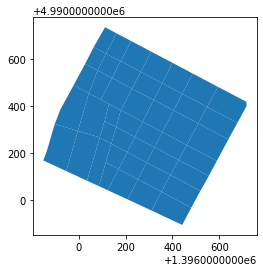

In [10]:
data.plot()

In [11]:
data.crs

<Projected CRS: EPSG:3003>
Name: Monte Mario / Italy zone 1
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Italy - onshore and offshore - west of 12°E.
- bounds: (5.94, 36.53, 12.0, 47.04)
Coordinate Operation:
- name: Italy zone 1
- method: Transverse Mercator
Datum: Monte Mario
- Ellipsoid: International 1924
- Prime Meridian: Greenwich

## Wifi and sim count

For wifi we thought it wasn't enough but in the end, we chose exactly the period it covers to do most of the analysis. For sim count there are 2 different types of data (for 20/21 and previous years) which are easy to combine. 

Further in the analysis and development we use these values the construct a 

In [12]:
wifi_count = pd.read_csv(
    os.path.join(PATH, 'wifi_count.csv'), parse_dates=['Time'], index_col='Time').sort_index()

In [13]:
wifi_count.head()

,No. of Visitors
Time,
2018-10-24 17:00:00,47
2018-10-24 18:00:00,155
2018-10-24 19:00:00,181
2018-10-24 20:00:00,211
2018-10-24 21:00:00,239


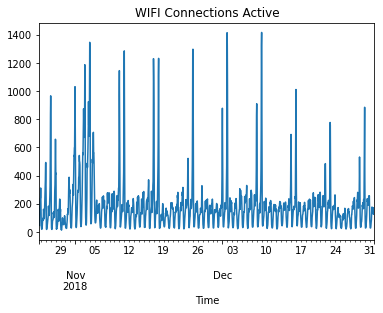

In [14]:
wifi_count['No. of Visitors'].plot(title='WIFI Connections Active')
pass

In [15]:
## SIM count 2021

files_2021 = os.listdir('../data/sim_count/SIM Count - 20210430 - 20210615')
sim_count_2021 = pd.concat(
    [pd.read_csv(f'../data/sim_count/SIM Count - 20210430 - 20210615/{fname}', delimiter=';') 
     for fname in files_2021]
)

sim_count_2021.head()

,layerid,datefrom,dateto,datatype,datavalue
0,8597bcee-3925-4c86-a120-9f3a54781a81,2021-06-05 03:00:00,2021-06-05 04:00:00,F1,286.0
1,8597bcee-3925-4c86-a120-9f3a54781a81,2021-06-05 03:00:00,2021-06-05 04:00:00,F2,3704.0
2,8597bcee-3925-4c86-a120-9f3a54781a81,2021-06-05 03:00:00,2021-06-05 04:00:00,F3,2980.0
3,8597bcee-3925-4c86-a120-9f3a54781a81,2021-06-05 03:00:00,2021-06-05 04:00:00,F4,3601.0
4,8597bcee-3925-4c86-a120-9f3a54781a81,2021-06-05 03:00:00,2021-06-05 04:00:00,F5,4451.0


In [16]:
## SIM count 2020

files_2020 = os.listdir('../data/sim_count/SIM Count - 20210430 - 20210615')
sim_count_2020 = pd.concat(
    [
        pd.read_csv(
            f'../data/sim_count/SIM Count - 20210430 - 20210615/{fname}', delimiter=';',
        ) 
         for fname in files_2020
    ]
).set_index('datefrom').sort_index()

sim_count_2020.head()

,layerid,dateto,datatype,datavalue
datefrom,,,,
2021-04-30 22:00:00,8597bcee-3925-4c86-a120-9f3a54781a81,2021-04-30 23:00:00,F1,286.0
2021-04-30 22:00:00,8597bcee-3925-4c86-a120-9f3a54781a81,2021-04-30 23:00:00,Vs,556.0
2021-04-30 22:00:00,8597bcee-3925-4c86-a120-9f3a54781a81,2021-04-30 23:00:00,Vr,23517.0
2021-04-30 22:00:00,8597bcee-3925-4c86-a120-9f3a54781a81,2021-04-30 23:00:00,Vp,1182.0
2021-04-30 22:00:00,8597bcee-3925-4c86-a120-9f3a54781a81,2021-04-30 23:00:00,Vi,4972.0


In [17]:
## SIM count previous years

files_prev = [f for f in os.listdir('../data/sim_count/') if f.endswith('.csv')]

sim_count_prev = pd.concat(
    [pd.read_csv(f'../data/sim_count/{fname}', delimiter=';') 
     for fname in files_prev]
)

sim_count_prev

,cluster,data_da,data_a,numero_presenze,layer_id,layer_nome,dettaglio(secondi)
0,Presenze,2017-12-24T22:00:00Z,2017-12-24T23:00:00Z,2374,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
1,Presenze,2017-12-24T21:00:00Z,2017-12-24T22:00:00Z,2392,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
2,Presenze,2017-12-24T20:00:00Z,2017-12-24T21:00:00Z,2383,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
3,Presenze,2017-12-24T19:00:00Z,2017-12-24T20:00:00Z,2401,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
4,Presenze,2017-12-24T18:00:00Z,2017-12-24T19:00:00Z,2400,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
...,...,...,...,...,...,...,...
3001,Visitatori Stranieri,2018-03-19T03:00:00Z,2018-03-19T04:00:00Z,159,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
3002,Visitatori Stranieri,2018-03-19T02:00:00Z,2018-03-19T03:00:00Z,159,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
3003,Visitatori Stranieri,2018-03-19T01:00:00Z,2018-03-19T02:00:00Z,165,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600
3004,Visitatori Stranieri,2018-03-19T00:00:00Z,2018-03-19T01:00:00Z,174,5491d6d2-0c9e-47b7-bfde-c84c632efacc,Area 1,3600


## Police Complaints

In [18]:
os.listdir('../data/police_complaints/')

['OpenDataContact_Luglio_Dicembre_2019.csv',
 'Contact_Luglio_Dicembre_2016.csv',
 'Contact_Gennaio_Giugno_2017.csv',
 'OpenDataContact_Gennaio_Giugno_2018.xlsx',
 '.ipynb_checkpoints',
 'OpenDataContact_Luglio_Dicembre_2017.csv',
 'OpenDataContact_Luglio_Dicembre_2018.csv',
 'OpenDataContact_Gennaio_Giugno_2016.csv',
 'OpenDataContact_Gennaio_Giugno_2019.csv']

In [19]:
charset_iso = ['OpenDataContact_Luglio_Dicembre_2019.csv', 'OpenDataContact_Luglio_Dicembre_2017.csv']
charset_utf = [
 'Contact_Luglio_Dicembre_2016.csv',
 'Contact_Gennaio_Giugno_2017.csv',
 'OpenDataContact_Luglio_Dicembre_2018.csv',
 'OpenDataContact_Gennaio_Giugno_2016.csv',
 'OpenDataContact_Gennaio_Giugno_2019.csv'
]
charset_xlx = ['OpenDataContact_Gennaio_Giugno_2018.xlsx']

In [20]:
xlx_dfs = pd.read_excel('../data/police_complaints/'+charset_xlx[0])
xlx_dfs = xlx_dfs[xlx_dfs['Circoscrizione'] == 8]
xlx_dfs

,Categoria criminologa,Sottocategoria Criminologica,Circoscrizione,Localita,Area Verde,Data,Ora
21,Convivenza Civile,Altro,8.0,NIZZA/(VIA) ...,NaN,02/01/2018,NaN
35,Convivenza Civile,Altro,8.0,D'AZEGLIO/MASSIMO (CORSO) ...,NaN,15/01/2018,NaN
38,Convivenza Civile,Altro,8.0,S. LUCIA/(STRADA) ...,NaN,17/01/2018,NaN
40,Convivenza Civile,Altro,8.0,NIZZA/(VIA) ...,NaN,19/01/2018,NaN
45,Convivenza Civile,Altro,8.0,SALINO/(STRADA DEL) ...,NaN,20/01/2018,NaN
...,...,...,...,...,...,...,...
1113,Qualità Urbana,Decoro e degrado urbano,8.0,MONFERRATO/(VIA) ...,NaN,01/06/2018,NaN
1132,Qualità Urbana,Decoro e degrado urbano,8.0,MARCONI/GUGLIELMO (CORSO) ...,NaN,11/06/2018,NaN
1135,Qualità Urbana,Decoro e degrado urbano,8.0,SALUZZO/(VIA) ...,NaN,12/06/2018,NaN
1140,Qualità Urbana,Decoro e degrado urbano,8.0,LOMBROSO/CESARE (VIA) ...,NaN,13/06/2018,12.46


In [21]:
iso_dfs=pd.concat([
    pd.read_csv('../data/police_complaints/'+charset_iso[0], encoding='iso-8859-1', delimiter=';'),
    pd.read_csv('../data/police_complaints/'+charset_iso[1], encoding='iso-8859-1')
])
iso_dfs = iso_dfs[iso_dfs['Circoscrizione'] == 8]
iso_dfs

,Categoria criminologa,Sottocategoria Criminologica,Circoscrizione,Localita,Area Verde,Data,Ora
8,Convivenza Civile,Altro,8.0,HERMADA/(PIAZZA) ...,NaN,04/07/2019,NaN
17,Convivenza Civile,Altro,8.0,MONCALIERI/(CORSO) ...,NaN,18/07/2019,NaN
32,Convivenza Civile,Altro,8.0,NIZZA/(VIA) ...,NaN,09/08/2019,10.08
67,Convivenza Civile,Altro,8.0,VILLA DELLA REGINA/(PIAZZALE) ...,NaN,22/09/2019,14.18
68,Convivenza Civile,Altro,8.0,MUZIO SCEVOLA/(PIAZZA) ...,NaN,25/09/2019,NaN
...,...,...,...,...,...,...,...
1011,Qualità Urbana,Decoro e degrado urbano,8.0,NIZZA/(VIA),NaN,20/11/2017,8.33
1026,Qualità Urbana,Decoro e degrado urbano,8.0,BRAMANTE/(CORSO),NaN,04/12/2017,NaN
1032,Qualità Urbana,Decoro e degrado urbano,8.0,VIOLA/(STRADA DELLA),NaN,07/12/2017,NaN
1036,Qualità Urbana,Decoro e degrado urbano,8.0,RONCHI AI CUNIOLI ALTI/(STRADA DAI),NaN,12/12/2017,NaN


In [22]:
utf_dfs=pd.concat([
    pd.read_csv('../data/police_complaints/'+f) for f in charset_utf
])
utf_dfs = utf_dfs[utf_dfs['Circoscrizione'] == 8]
utf_dfs

,Categoria criminologa,Sottocategoria Criminologica,Circoscrizione,Localita,Area Verde,Data,Ora
1,Allarme Sociale,Altro,8.0,ORMEA/(VIA) ...,NaN,12/07/2016,NaN
2,Allarme Sociale,Altro,8.0,ORMEA/(VIA) ...,NaN,12/07/2016,NaN
4,Allarme Sociale,Altro,8.0,ORMEA/(VIA) ...,NaN,18/07/2016,NaN
8,Allarme Sociale,Altro,8.0,ORMEA/(VIA) ...,Area Verde,26/07/2016,NaN
19,Allarme Sociale,Altro,8.0,BERTHOLLET/CLAUDIO LUIGI (VIA) ...,NaN,09/09/2016,NaN
...,...,...,...,...,...,...,...
1025,Qualità Urbana,Decoro e degrado urbano,8.0,CAVORETTO/(STRADA DI) ...,NaN,12/06/2019,NaN
1039,Qualità Urbana,Decoro e degrado urbano,8.0,PRINCIPE TOMMASO/(VIA) ...,NaN,20/06/2019,NaN
1053,Qualità Urbana,Decoro e degrado urbano,8.0,MONFERRATO/(VIA) ...,NaN,29/06/2019,NaN
1054,Qualità Urbana,Decoro e degrado urbano,8.0,NIZZA/(VIA) ...,NaN,29/06/2019,NaN


In [23]:
charset_iso = ['OpenDataContact_Luglio_Dicembre_2019.csv', 'OpenDataContact_Luglio_Dicembre_2017.csv']
charset_utf = [
 'Contact_Luglio_Dicembre_2016.csv',
 'Contact_Gennaio_Giugno_2017.csv',
 'OpenDataContact_Luglio_Dicembre_2018.csv',
 'OpenDataContact_Gennaio_Giugno_2016.csv',
 'OpenDataContact_Gennaio_Giugno_2019.csv'
]
charset_xlx = ['OpenDataContact_Gennaio_Giugno_2018.xlsx']

xlx_dfs = pd.read_excel('../data/police_complaints/'+charset_xlx[0])
xlx_dfs = xlx_dfs[xlx_dfs['Circoscrizione'] == 8]

iso_dfs=pd.concat([
    pd.read_csv('../data/police_complaints/'+charset_iso[0], encoding='iso-8859-1', delimiter=';'),
    pd.read_csv('../data/police_complaints/'+charset_iso[1], encoding='iso-8859-1')
])
iso_dfs = iso_dfs[iso_dfs['Circoscrizione'] == 8]

utf_dfs=pd.concat([
    pd.read_csv('../data/police_complaints/'+f) for f in charset_utf
])
utf_dfs = utf_dfs[utf_dfs['Circoscrizione'] == 8]

all_complaints = pd.concat([utf_dfs, iso_dfs, xlx_dfs])
all_complaints['Localita Normalized'] = all_complaints['Localita'].apply(
    lambda x: " ".join([x[x.find("(")+1:x.find(")")], x.split('/')[0], 'TURIN'])
)

In [24]:
geolocator = Nominatim(user_agent="fran@gmail.com")

all_complaints = pd.concat([utf_dfs, iso_dfs, xlx_dfs])
all_complaints['Localita Normalized'] = all_complaints['Localita'].apply(
    lambda x: " ".join([x[x.find("(")+1:x.find(")")], x.split('/')[0], 'TURIN'])
)

unique_locations = all_complaints['Localita Normalized'].unique()

location_coordinates = {}

for location in tqdm.tqdm(unique_locations):
    if location in location_coordinates:
        continue
        
    loc = geolocator.geocode(location)
    if loc == None:
        location_coordinates[location] = {
            'lat': -1,
            'long': -1,
        }
        continue
        
    location_coordinates[location] = {
        'lat': loc.latitude,
        'long': loc.longitude,
    }

100%|█████████████████████████████████████████| 137/137 [01:08<00:00,  2.01it/s]


In [25]:
def to_longlat(street):
    try:
        lat = location_coordinates[street]['lat']
        long = location_coordinates[street]['long']
    except:
        return np.nan, np.nan
    if lat == -1:
        return np.nan, np.nan
    return lat, long

all_complaints['lat'] = all_complaints['Localita Normalized'].apply(lambda x: to_longlat(x)[0])
all_complaints['long'] = all_complaints['Localita Normalized'].apply(lambda x: to_longlat(x)[1])

In [26]:
all_complaints['Categoria criminologa'].value_counts()

Convivenza Civile    414
Qualità Urbana       187
Qualit� Urbana       121
Allarme Sociale       33
Name: Categoria criminologa, dtype: int64

In [27]:
all_complaints.index = pd.to_datetime(all_complaints['Data'])
all_complaints_2018 = all_complaints.loc["2018-10-25":"2018-12-31"]
all_complaints_2018.head()

,Categoria criminologa,Sottocategoria Criminologica,Circoscrizione,Localita,Area Verde,Data,Ora,Localita Normalized,lat,long
Data,,,,,,,,,,
2018-11-07,Convivenza Civile,Altro,8.0,MADAMA CRISTINA/(VIA) ...,NaN,11/07/2018,NaN,VIA MADAMA CRISTINA TURIN,45.058311,7.683303
2018-11-10,Convivenza Civile,Altro,8.0,MONCALIERI/(CORSO) ...,Area Verde,11/10/2018,NaN,CORSO MONCALIERI TURIN,45.017602,7.677231
2018-10-29,Convivenza Civile,Altro,8.0,ORMEA/(VIA) ...,NaN,29/10/2018,NaN,VIA ORMEA TURIN,44.843402,7.715860
2018-12-11,Convivenza Civile,Altro,8.0,D'AZEGLIO/MASSIMO (CORSO) ...,NaN,12/11/2018,NaN,CORSO D'AZEGLIO TURIN,NaN,NaN
2018-11-14,Convivenza Civile,Altro,8.0,VAL PATTONERA/(STRADA) ...,NaN,14/11/2018,NaN,STRADA VAL PATTONERA TURIN,45.036234,7.702657


## Businesses

CRS format is <EPSG:3003>

In [28]:
def to_lat_long(x1, y1):
    inProj = Proj(init='epsg:3003')
    outProj = Proj(init='epsg:4326')
    
    return transform(inProj,outProj,x1,y1)

In [29]:
businesses = pd.read_csv(os.path.join(PATH, 'torino_businesses.csv'), delimiter=';')
businesses['WKT'] = businesses['WKT'].apply(wkt.loads)
businesses.head()

,WKT,ADDRESS,OPEN YEAR,OPEN MONTH,TYPE,Description,Merchandise Type
0,POINT (1396322.217 4990301.69),VIA CLAUDIO LUIGI BERTHOLLET 24,1977,1,EXTRALIMENTARI,PICCOLE STRUTTURE,Extralimentari
1,POINT (1396322.217 4990301.69),VIA CLAUDIO LUIGI BERTHOLLET 24,1985,6,ALIMENTARI,PICCOLE STRUTTURE,Panificio
2,POINT (1396303.762 4990325.001),VIA CLAUDIO LUIGI BERTHOLLET 25/F,2017,9,ALTRO,DIA di somministrazione,Nessuna
3,POINT (1396434.395 4990540.6),CORSO VITTORIO EMANUELE II 21/A,2013,10,ALTRO,DIA di somministrazione,Nessuna
4,POINT (1396434.395 4990540.6),CORSO VITTORIO EMANUELE II 21/A,2009,2,ALTRO,DIA di somministrazione,Nessuna


In [30]:
len(businesses['ADDRESS'].unique())

539

In [31]:
businesses = businesses.drop_duplicates(['ADDRESS'])

In [32]:
transformed_coords = [to_lat_long(p.x, p.y) for p in businesses['WKT']]

In [33]:
businesses['Merchandise Type'].value_counts().head()

Nessuna           213
Extralimentari     70
Alimentari         34
Abbigliamento      26
Gastronomia        20
Name: Merchandise Type, dtype: int64

In [34]:
businesses['TYPE'].value_counts()

EXTRALIMENTARI    194
ALTRO             133
.                  80
ALIMENTARI         75
MISTA              57
Name: TYPE, dtype: int64

In [35]:
data = gpd.read_file('../data/noise_sensor_GIS/Rilievi openoise.shp')

folium_map = folium.Map( 
    location=[45.05840269726004, 7.682884255371505],
    zoom_start=15,
    tiles="Stamen Terrain",
)

for i, (name, location) in enumerate(data[['Sito', 'geometry']].values):
    folium.Marker(
        [location.y, location.x], popup=f"<i>{name}</i>", color=color_map[4-i]
    ).add_to(folium_map)

In [36]:
## Sensors outside san salvario
sensors = [['TTO-001', (45.06499, 7.69756)], ['TT0-002', (45.07452, 7.69446)]]
for i, (name, location) in enumerate(sensors):
    folium.Marker(
        [location[0], location[1]], popup=f"<i>{name}</i>", color="b"
    ).add_to(folium_map)

In [37]:
for key, value in location_coordinates.items():
    if value['lat'] == -1:
        continue

    folium.Marker(
            [value['lat'], value['long']], color="green", icon = folium.Icon('green'), popup=f"<i>Complaint</i>"
        ).add_to(folium_map)

In [38]:
for p in transformed_coords:
    folium.Circle(
        [p[1], p[0]], color='red', radius=5
    ).add_to(folium_map)

## Data Map
Combing all of the available data, we get a clearer picture of everything, red circles for the businesses, green for the complaints and blue for the 5+2 sensors

In [39]:
folium_map

In [41]:
df = pd.read_csv('../data/raw_places.csv')

#Do not consider the nan rows,i.e. the places without the time of opening and closure, taking indexes with values of time
full_idxs = [index for index in range(len(df)) if (df.lun[index]==df.lun[index])==True]
df = df.loc[full_idxs]
df.index=range(len(df))

#This has been done to correct a manual error 
df = df.fillna('x')

#select the columns of days and remove the sliced hours and the AM to better generalize
wdays = list(df.columns[4:])
for index in range(len(df)):
    for day in wdays:
        df.loc[index][day]=df.loc[index][day].replace('30','')
        df.loc[index][day]=df.loc[index][day].replace('45','')
        df.loc[index][day]=df.loc[index][day].replace(':15','')
        df.loc[index][day]=df.loc[index][day].replace(':','')
        df.loc[index][day]=df.loc[index][day].replace('AM','')
        df.loc[index][day]=df.loc[index][day].replace(',','–')
        df.loc[index][day]=df.loc[index][day].replace('-','–')

df['matrix_open']=range(len(df))
matrix_vec=list()

#Using nested for loops, associate at every place a 24x7 matrix with 0 and 1 of open/close state of place
for index in range(len(df)):
    #Create a null matrix
    opens = np.zeros((24,7))
    dayc=0

    #Iterate on each day
    for day in wdays:
        dates = df.loc[index][day].split('–')
        dates = [s.strip() for s in dates]
        if index==87: print(df.name[index], dates)
        if dates[0]=='x':
            None #Left zeros
        else:
            dates = [int(s[:2]) for s in dates]
            if len(dates)==2:
                for i in range(24):
                        if dates[0]<dates[1]:
                            if (i>=dates[0] and i<=dates[1]):
                                opens[i][dayc]=1
                        else:
                            if (i>=dates[0] or i<=dates[1]):
                                opens[i][dayc]=1     
            else: 
                for i in range(24):#They're mixed hours
                    if dates[0]<dates[1]:
                        if (i>=dates[0] and i<=dates[1]):
                            opens[i][dayc]=1
                    if dates[2]<dates[3]:
                        if (i>=dates[2] and i<=dates[3]):
                            opens[i][dayc]=1
                    else:
                        if (i>=dates[2] or i<=dates[3]):
                            opens[i][dayc]=1
        dayc+=1
    matrix_vec.append(opens)

#Remove redundant informations about days

df['matrix_open']=matrix_vec
df=df[['name', 'Lat', 'Long', 'type', 'matrix_open']]

#Transform the latitude and langitude into floats
lat = [float(df['Lat'][i].replace('\'','')) for i in range(len(df))]
long = [float(df['Long'][i].replace('\'','').replace(',','')) for i in range(len(df))]
df['Lat'] = lat
df['Long'] = long

# Unification of labels in type columns

chars = list(df['type'].unique())
pubs = [chars[i] for i in [0,5]]
res = [chars[i] for i in [1, 3, 4, 7, 8, 9]]
pp = [chars[i] for i in [2, 6, 10]]
unif = list()
for char in df['type']:
    if char in pubs:
        unif.append('pub')
    if char in res:
        unif.append('restaurant')
    if char in pp:
        unif.append('p_place')
df['type']=unif

# fix an error
df.loc[122,'Long'] = 7.6825678

business = df

C. Socialist' ['18', '23']
C. Socialist' ['18', '23']
C. Socialist' ['18', '23']
C. Socialist' ['18', '23']
C. Socialist' ['18', '23']
C. Socialist' ['18', '23']
C. Socialist' ['x']


In [44]:
wifi_count = pd.read_csv(
        '../data/WIFI Count.csv', dayfirst=True,
         delimiter=','
    )
    
wifi_count.index = pd.to_datetime(wifi_count.Time)

del wifi_count['Time']    

# min max scaler of traffic variable
wifi_count['No. of Visitors'] = (wifi_count['No. of Visitors'] - np.min(wifi_count['No. of Visitors'])) / (np.max(wifi_count['No. of Visitors']) - np.min(wifi_count['No. of Visitors']))


#import crowd data from sim (only 2021 avaible data)

#list of data files
files = os.listdir('../data/sim_count/SIM Count - 20210430 - 20210615')

#concatenetion of the datasets
sim_count = pd.read_csv(
    '../data/sim_count/SIM Count - 20210430 - 20210615/' + files[0], dayfirst=True,
    delimiter=';'
)

for f in files[1:]:
    sim_count_f = pd.read_csv(
    '../data/sim_count/SIM Count - 20210430 - 20210615/' + f, dayfirst=True,
    delimiter=';'
    )
    sim_count = pd.concat([sim_count, sim_count_f])

#select and mask tuseful columns and rows
sim_count = sim_count[['datefrom', 'datatype', 'datavalue']]
sim_count = sim_count[sim_count['datatype'] == 'P']
del sim_count['datatype']

# sort and fix index
sim_count = sim_count.sort_values(by=['datefrom'])
sim_count.index = pd.to_datetime(sim_count.datefrom)

del sim_count['datefrom']

# min max scaler
sim_count['datavalue'] = (sim_count['datavalue'] - np.min(sim_count['datavalue'])) / (np.max(sim_count['datavalue']) - np.min(sim_count['datavalue'])) 

In [45]:
def max_values_density():
    max_values = []
    
    for i in tqdm.tqdm(range(len(wifi_count))):
        try:
            z = people_distribution(wifi_count.index[i])[0]
            max_values.append(np.max(z))
        except:
            None
    for i in tqdm.tqdm(range(len(sim_count))):
        try:
            z = people_distribution(sim_count.index[i])[0]
            max_values.append(np.max(z))
        except:
            None
    
    return max_values

np.random.seed(42)

#function that returns if a business palce is opened at a certain hour of a certain day
def loc_open(A, day):
    weekday = day.weekday()
    hour = day.hour
    return bool(A[hour, weekday])

#function that creates the crowd distribution around business places using gaussian kernels weighting the places by label
#this returns a 20x20 matrix describing the people dirstrbution and the latitude and longitude of the generated points
def people_distribution(day, label_weight = {'pub':0.5, 'restaurant':0.3, 'p_place':0.1}, label_std={'pub':0.0005, 'restaurant':0.0001, 'p_place':0.0005}, norm = None, contour_plot = False):   

    # number of samples
    try:
        n = int(sim_count.loc[day,'datavalue']*1000)
    except:
        n = int(wifi_count.loc[day,'No. of Visitors']*1000)

    
    business_open = business[business['matrix_open'].apply(lambda A: loc_open(A,day))]
    
    n_samples = list(business_open.type.apply(lambda x: int(n*label_weight[x])))

    centers = np.array(business_open[['Long','Lat']])
    
    cluster_std = list(business_open.type.apply(lambda x: label_std[x]))
    
    X, truth = make_blobs(n_samples=n_samples,
                          centers=centers,
                          cluster_std = cluster_std
                          )
    long = X[:,0]
    lat = X[:,1]
    
    z = np.histogram2d(long, lat, bins =20)[0]
    
    
    if norm != None:
        z = z/norm
        
    
    #Define the borders
    deltaX = (7.685001160509891 - 7.676289618030705)/10
    deltaY = (45.06010964836711 - 45.05503354612004)/10
    xmin = 7.676289618030705 - deltaX
    xmax = 7.685001160509891 + deltaX
    ymin = 45.05503354612004 - deltaY
    ymax = 45.06010964836711 + deltaY

    #Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    
    if contour_plot == True:
        plt.figure()
        plt.contourf(xx,yy,z)
        plt.show()
    
    return z, lat, long

max_values = max_values_density()

# 90-percentile of max_values to "normalize" the matrix values compute by people_distribution function
normaliz = np.percentile(max_values, 90)

100%|██████████████████████████████████████| 1104/1104 [00:08<00:00, 134.25it/s]


(array([448., 272., 261., 199., 175., 158., 130.,  85.,  57.,  41.,  55.,
         42.,  45.,  39.,  32.,  35.,  37.,  39.,  35.,  39.,  33.,  42.,
         56.,  34.,  36.,  34.,  34.,  23.,  17.,  19.,  23.,  14.,  20.,
         22.,  17.,  12.,  10.,  16.,  12.,  11.,   5.,   3.,   6.,   3.,
          3.,   6.,   3.,   1.,   1.,   3.]),
 array([   0.  ,   20.86,   41.72,   62.58,   83.44,  104.3 ,  125.16,
         146.02,  166.88,  187.74,  208.6 ,  229.46,  250.32,  271.18,
         292.04,  312.9 ,  333.76,  354.62,  375.48,  396.34,  417.2 ,
         438.06,  458.92,  479.78,  500.64,  521.5 ,  542.36,  563.22,
         584.08,  604.94,  625.8 ,  646.66,  667.52,  688.38,  709.24,
         730.1 ,  750.96,  771.82,  792.68,  813.54,  834.4 ,  855.26,
         876.12,  896.98,  917.84,  938.7 ,  959.56,  980.42, 1001.28,
        1022.14, 1043.  ]),
 <BarContainer object of 50 artists>)

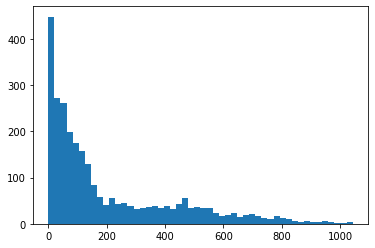

In [46]:
plt.hist(max_values, bins= 50)

## Multi Modal Gaussian Distribution Example

2018-10-25 12:00:00


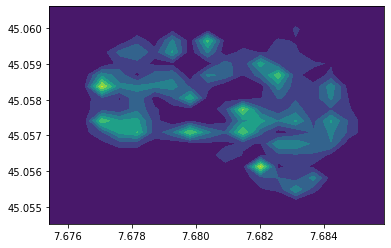

In [47]:
print(wifi_count.index[19])
z, lat, long = people_distribution(wifi_count.index[19], norm=normaliz, contour_plot=True)

## Noise data

In [48]:
san_salvario = pd.concat([
    pd.read_csv(
        f'../data/noise_data/{f}', delimiter=';', 
        encoding='us-ascii', header=8,
        parse_dates=[['Data', 'Ora']], index_col='Data_Ora',
        decimal=','
    )
    for f in [f for f in os.listdir('../data/noise_data/') if f.startswith('san_salvario')]
]).sort_index()

san_salvario['Day'] = san_salvario.index.day_of_week
san_salvario['Hour'] = san_salvario.index.hour

san_salvario

,C1,C2,C3,C4,C5,Day,Hour
Data_Ora,,,,,,,
2016-01-06 00:00:00,61.1,58.8,63.7,60.4,60.2,2,0
2016-01-06 01:00:00,57.2,56.1,60.4,57.7,58.4,2,1
2016-01-06 02:00:00,52.5,53.4,52.9,56.7,56.5,2,2
2016-01-06 03:00:00,50.6,46.6,45.7,47.9,55.6,2,3
2016-01-06 04:00:00,47.4,46.2,45.1,45.8,56.8,2,4
...,...,...,...,...,...,...,...
2021-12-06 19:00:00,61.1,61.9,63.1,NaN,NaN,0,19
2021-12-06 20:00:00,60.1,66.1,65.2,NaN,NaN,0,20
2021-12-06 21:00:00,62.3,67.2,70.3,NaN,NaN,0,21


In [49]:
san_salvario.isna().sum()

C1       3394
C2       2729
C3      13418
C4      19559
C5      16858
Day         0
Hour        0
dtype: int64

In [50]:
san_salvario[[f'C{i}' for i in range(1, 6)]].describe().T

,count,mean,std,min,25%,50%,75%,max
C1,40958.0,58.265655,6.463352,28.2,56.0,59.9,62.0,95.6
C2,41623.0,56.916284,5.953433,29.6,53.8,58.5,61.1,80.3
C3,30934.0,58.553029,8.025082,29.9,53.5,59.6,63.1,82.3
C4,24793.0,59.422833,5.063291,30.1,57.6,60.8,62.7,76.8
C5,27494.0,61.125453,4.492895,33.1,58.9,62.1,64.1,82.7


In [51]:
san_salvario.groupby(san_salvario.index.day_of_week).describe()[[
    (sensor, metric) for sensor in [f"C{i+1}" for i in range(5)] for metric in ["mean", "min", "max"]
]]

C1                     C2                     C3              \
               mean   min   max       mean   min   max       mean   min   max   
Data_Ora                                                                        
0         57.564717  28.8  78.4  56.586194  30.2  76.2  57.368218  30.5  81.2   
1         57.647496  32.6  76.0  56.867421  35.0  80.3  57.504560  31.2  81.0   
2         58.005798  28.4  76.2  56.872765  30.2  75.8  57.779537  30.4  81.7   
3         58.145778  28.2  76.7  56.969917  29.6  75.8  58.038251  29.9  81.1   
4         58.732305  33.1  74.8  57.428033  36.2  78.2  58.996452  37.2  81.8   
5         59.133746  33.9  75.6  57.405830  35.8  76.2  60.298463  37.3  82.1   
6         58.624789  33.5  95.6  56.282335  36.2  75.7  59.912641  37.3  82.3   

                 C4                     C5              
               mean   min   max       mean   min   max  
Data_Ora                                                
0         58.721575  39.4  70.2  60.793726  36.3  74.5  
1         59.181506  39.1  74.7  60.888273  33.1  82.7  
2         59.207466  30.2  76.8  61.314948  42.3  79.2  
3         59.543754  30.1  72.8  61.347530  38.9  75.6  
4         59.937387  42.0  74.3  61.313354  40.3  77.5  
5         60.161187  40.7  71.5  61.421448  41.3  75.2  
6         59.238156  39.6  76.1  60.790455  42.1  72.2

In [52]:
for i in range(1, 6):
    san_salvario[f'mask_{i}'] = san_salvario[f'C{i}'].isna()

In [53]:
san_salvario.to_csv('../data/noise_data/processed.csv')

In [54]:
TT_1 = pd.read_csv('../data/noise_data/TTO-001_5minute.csv')
TT_2 = pd.read_csv('../data/noise_data/TTO-002_5minute.csv')

In [55]:
TT_1.head()

,date (UTC),time (UTC),mean,number of points,filtered mean,filtered number of points
0,23-11-2018,00:00:00,66.9,299,NaN,0
1,23-11-2018,00:05:00,75.1,300,NaN,0
2,23-11-2018,00:10:00,65.2,300,NaN,0
3,23-11-2018,00:15:00,64.3,300,NaN,0
4,23-11-2018,00:20:00,64.5,300,NaN,0


In [56]:
TT_2.head()

,date (UTC),time (UTC),mean,number of points,filtered mean,filtered number of points
0,12-10-2020,00:00:00,34.1,299,NaN,0
1,12-10-2020,00:05:00,34.1,300,NaN,0
2,12-10-2020,00:10:00,33.6,300,NaN,0
3,12-10-2020,00:15:00,34.0,300,NaN,0
4,12-10-2020,00:20:00,33.7,300,NaN,0


## Time Series Analysis
### Filling Missing Values

In [57]:
def fill_sensor(i, model, san_salvario):
    mask = (
        ~(san_salvario['C1'].isna()) &
        ~(san_salvario['C2'].isna()) &
        ~(san_salvario[f'C{i}'].isna())
    )
    
    not_na_subset = san_salvario[mask]
    
    X, y = not_na_subset[['C1', 'C2', 'Day']], not_na_subset[f'C{i}']
    X_train, X_test, y_train, y_test = train_test_split(X, y)
    
    model.fit(X_train, y_train)

    preds = model.predict(X_test)
    error = mean_absolute_error(y_test, preds)
    
    na_subset = san_salvario[
        ~(san_salvario['C1'].isna()) &
        ~(san_salvario['C2'].isna()) &
        (san_salvario[f'C{i}'].isna())
    ]
    
    san_salvario.loc[
    ~(san_salvario['C1'].isna()) &
    ~(san_salvario['C2'].isna()) &
    (san_salvario[f'C{i}'].isna()), f'C{i}'] = model.predict(na_subset[['C1', 'C2', 'Day']])
    
    return error, san_salvario

In [58]:
for i in range(3, 6):
    fill_sensor(i, LinearRegression(), san_salvario)

In [59]:
subset_salvario = san_salvario.loc["2018-10-24 17:00:00":"2018-12-31"].copy()

In [60]:
subset_salvario.isna().sum()

C1         97
C2         98
C3         92
C4        125
C5          0
Day         0
Hour        0
mask_1      0
mask_2      0
mask_3      0
mask_4      0
mask_5      0
dtype: int64

In [61]:
def decibel_average(samples):
    #tmp = samples[~np.isnan(samples)]
    tmp = np.array(samples)
    tmp = tmp/10
    
    l = len(tmp)
    
    tmp = np.power(np.repeat(10, l), tmp)
    tmp = np.sum(tmp)
    tmp = tmp/l
    
    return 10*np.log10(tmp)

In [62]:
mean_imputer = san_salvario.groupby([san_salvario.index.day_of_week, san_salvario.index.hour]).agg({f'C{i}': decibel_average for i in range(1, 6)}).to_dict()

In [63]:
def mean_impute_values(i):
    subset_salvario.loc[
        subset_salvario[f'C{i}'].isna(),
        f'C{i}'
    ] = subset_salvario.loc[
        subset_salvario[f'C{i}'].isna()
    ].apply(lambda x: mean_imputer[f'C{i}'][(x['Day'], x['Hour'])], axis=1)

In [64]:
for i in range(1, 6):
    mean_impute_values(i)

In [65]:
subset_salvario.isna().sum()

C1         97
C2         98
C3         92
C4        125
C5          0
Day         0
Hour        0
mask_1      0
mask_2      0
mask_3      0
mask_4      0
mask_5      0
dtype: int64

In [66]:
san_salvario.to_csv('../data/processed_data/noise_processed_imputed.csv')

## Gathering all the data

In [67]:
all_data = pd.read_csv(
    '../data/processed_data/weather_nvisitors_sim.csv', 
    names=['datetime', 'rain', 'snow_depth', 'temperature', 'wind_scaler', 'wind_gust', 'n_visitors'],
    parse_dates=['datetime'], index_col=['datetime'], header=0
)

In [68]:
all_data

,rain,snow_depth,temperature,wind_scaler,wind_gust,n_visitors
datetime,,,,,,
2018-10-24 17:00:00,0.0,-0.045,25.70,0.0,0.0,0.024234
2018-10-24 18:00:00,0.0,-0.015,20.10,0.0,0.0,0.101212
2018-10-24 19:00:00,0.0,0.010,16.80,0.0,0.0,0.119743
2018-10-24 20:00:00,0.0,0.005,15.00,0.0,0.0,0.141126
2018-10-24 21:00:00,0.0,0.010,14.00,0.0,0.0,0.161083
...,...,...,...,...,...,...
2018-12-31 19:00:00,0.0,0.005,4.20,0.0,0.0,0.103350
2018-12-31 20:00:00,0.0,0.010,3.60,0.0,0.0,0.112616
2018-12-31 21:00:00,0.0,0.035,2.55,0.0,0.0,0.098361


In [69]:
cavg = []

for i, row in subset_salvario.iterrows():
    try:
        cavg.append(decibel_average(np.array(row[:5].values)))
    except Exception:
        print(row[:5].values)
        break

In [70]:
subset_salvario['CAVG'] = cavg
subset_salvario

,C1,C2,C3,C4,C5,Day,Hour,mask_1,mask_2,mask_3,mask_4,mask_5,CAVG
Data_Ora,,,,,,,,,,,,,
2018-10-24 17:00:00,60.4,61.6,58.7,62.4,67.6,2,17,False,False,False,False,False,63.334645
2018-10-24 18:00:00,62.0,61.5,63.3,61.5,64.9,2,18,False,False,False,False,False,62.850271
2018-10-24 19:00:00,61.5,61.4,60.3,62.3,63.3,2,19,False,False,False,False,False,61.875572
2018-10-24 20:00:00,60.6,60.0,60.6,62.3,61.8,2,20,False,False,False,False,False,61.144850
2018-10-24 21:00:00,58.8,58.3,60.0,60.2,60.1,2,21,False,False,False,False,False,59.547327
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 19:00:00,61.9,60.2,60.3,59.6,61.6,0,19,False,False,False,False,False,60.809809
2018-12-31 20:00:00,62.5,58.9,58.2,61.6,61.6,0,20,False,False,False,False,False,60.867939
2018-12-31 21:00:00,62.8,56.7,59.2,58.2,59.3,0,21,False,False,False,False,False,59.746766


In [71]:
all_data.join(subset_salvario).to_csv('../data/processed_data/2018_final_averaged.csv')

## Noise modeling

In [72]:
single_day = subset_salvario.loc["2018-10-25"]
single_day.min()

C1             44.3
C2             44.9
C3             45.3
C4             47.8
C5             52.5
Day               3
Hour              0
mask_1        False
mask_2        False
mask_3        False
mask_4        False
mask_5        False
CAVG      49.227944
dtype: object

In [75]:
with open('../data/people_per_day_matr.pkl', 'rb') as f:
    data = pickle.load(f)

In [76]:
#create the reference grid using latitude and longituted around "San Salvario"

#Define the borders
deltaX = (7.685001160509891 - 7.676289618030705)/10
deltaY = (45.06010964836711 - 45.05503354612004)/10
xmin = 7.676289618030705 - deltaX
xmax = 7.685001160509891 + deltaX
ymin = 45.05503354612004 - deltaY
ymax = 45.06010964836711 + deltaY

#Create meshgrid
lat_long_grid = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]

## Modeling crowd movement with Multi Modal Gaussian distributions

We focus mainly on the lower left part of the region due to the high number of bars and restaurants

In [77]:
ws = []
for k in range(0, 24*7):
    w = []
    vals = list(data.values())[k]
    for i in list(range(0, 20)):
        for j in list(range(0, 20)):
            if vals[i][j]*10 >= 0.0025:
                w.append([lat_long_grid[:, i, j][1], lat_long_grid[:, i, j][0], vals[i, j]*10])
        
    ws.append(w)

folium_map = folium.Map( 
    location=[45.05840269726004, 7.682884255371505],
    zoom_start=16,
    tiles="Stamen Terrain",
)    
    
folium.plugins.HeatMapWithTime(
    ws,
    auto_play=True,
    max_opacity=0.8,
    radius=35,
    name='Hour',
    index = [f'Day: {i.day_of_week}, Hour: {i.hour}' for i in list(data.keys())[:24*7]]
).add_to(folium_map)

#folium.Circle([45.055341479685225, 7.683086889957849], radius=10).add_to(folium_map)
#folium.Circle([45.05534147, 7.68308688], radius=10).add_to(folium_map)
    
folium_map

In [78]:
values = []

for k in range(0, 72):
    day = list(data.keys())[k]
    vals = list(data.values())[k]
    
    for i in list(range(0, 20)):
        for j in list(range(0, 20)):
            lat, long = lat_long_grid[:, i, j][1], lat_long_grid[:, i, j][0]
            val = vals[i, j]
            
            values.append((day, lat, long, val))
            if vals[i][j]*10 >= 0.0025:
                w.append([lat_long_grid[:, i, j][1], lat_long_grid[:, i, j][0], vals[i, j]*10])

In [79]:
sample_data = pd.DataFrame.from_records(values, columns=['date', 'lat', 'long', 'crowd_value'], index='date')
sample_data

,lat,long,crowd_value
date,,,
2018-10-24 17:00:00,45.054526,7.675418,0.0
2018-10-24 17:00:00,45.054847,7.675418,0.0
2018-10-24 17:00:00,45.055167,7.675418,0.0
2018-10-24 17:00:00,45.055488,7.675418,0.0
2018-10-24 17:00:00,45.055808,7.675418,0.0
...,...,...,...
2018-10-27 16:00:00,45.059335,7.685872,0.0
2018-10-27 16:00:00,45.059655,7.685872,0.0
2018-10-27 16:00:00,45.059976,7.685872,0.0


In [80]:
sample_data = sample_data.join(pd.read_csv('../data/weather_2018_2021_t_rain.csv', parse_dates=True, index_col='Date_Hour'))

In [81]:
sample_data['Hour'] = sample_data.index.hour
sample_data['Day'] = sample_data.index.day_of_week
sample_data

,lat,long,crowd_value,rain,temperature,Hour,Day
2018-10-24 17:00:00,45.054526,7.675418,0.0,0.0,25.70,17,2
2018-10-24 17:00:00,45.054847,7.675418,0.0,0.0,25.70,17,2
2018-10-24 17:00:00,45.055167,7.675418,0.0,0.0,25.70,17,2
2018-10-24 17:00:00,45.055488,7.675418,0.0,0.0,25.70,17,2
2018-10-24 17:00:00,45.055808,7.675418,0.0,0.0,25.70,17,2
...,...,...,...,...,...,...,...
2018-10-27 16:00:00,45.059335,7.685872,0.0,0.0,15.85,16,5
2018-10-27 16:00:00,45.059655,7.685872,0.0,0.0,15.85,16,5
2018-10-27 16:00:00,45.059976,7.685872,0.0,0.0,15.85,16,5
2018-10-27 16:00:00,45.060297,7.685872,0.0,0.0,15.85,16,5


## Passing the data for prediction in R

In [82]:
sample_data.to_csv('../prediction_data/sample_for_prediction.csv')

You can retrieve the data from the drive folder, also the R code is available at the end of the notebook for the analysis

In [83]:
predictions = pd.read_csv('../prediction_data/sample_predictions.csv', usecols=range(1, 5), parse_dates=True, index_col='X')

In [84]:
ws = []
for key, group in predictions.groupby([predictions.index.date, predictions.index.hour]):
    w = []
    for i, row in group.iterrows():
        scale = 70-40
        rp=0
        if scale == 0:
            rp = 0
        else:
            rp = (row['predicted'] - 40) / scale
        
        if rp >= 0.55:
            w.append([row['lat'], row['long'], rp])
    ws.append(w)

In [85]:
folium_map = folium.Map( 
    location=[45.05840269726004, 7.682884255371505],
    zoom_start=16,
    tiles="Stamen Terrain",
)    
    
folium.plugins.HeatMapWithTime(
    ws[:118],
    auto_play=True,
    max_opacity=0.8,
    radius=35,
    name='Hour',
    index = [[f'Hour: {(17+i)%24}' for i in range(24)]*5][0][:118],display_index=True
    
).add_to(folium_map)
    
folium_map

In [667]:
folium_map.save('timelapse.html')

## Default Parameter Widget

In [86]:
from ipywidgets import widgets

lat, long = [], []

for i in range(20):
    for j in range(20):
        lo, la = lat_long_grid[:, i, j]
        lat.append(la)
        long.append(lo)
        
df = pd.DataFrame({
    'lat': long,
    'long': lat
})

df['crowd_value'] = sample_data.groupby(['lat', 'long'])['crowd_value'].mean().values

In [87]:
day = widgets.IntSlider(
    value=3,
    min=0,
    max=6,
    step=1,
    description='Day:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

hour = widgets.IntSlider(
    value=12,
    min=0,
    max=24,
    step=1,
    description='Hour:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='d'
)

rain = widgets.FloatSlider(
    value=0.5,
    min=0,
    max=1,
    step=0.1,
    description='Rain:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.1f'
)

temperature = widgets.FloatSlider(
    value=12,
    min=-3.0,
    max=26,
    step=0.1,
    description='Temperature:',
    disabled=False,
    continuous_update=False,
    orientation='horizontal',
    readout=True,
    readout_format='.1f'
)

display(hour, day, rain, temperature)

IntSlider(value=12, continuous_update=False, description='Hour:', max=24)

IntSlider(value=3, continuous_update=False, description='Day:', max=6)

FloatSlider(value=0.5, continuous_update=False, description='Rain:', max=1.0, readout_format='.1f')

FloatSlider(value=12.0, continuous_update=False, description='Temperature:', max=26.0, min=-3.0, readout_forma…

In [88]:
df['Hour'] = int(hour.value)
df['Day'] = int(day.value)
df['rain'] = rain.value
df['temperature'] = temperature.value

df.to_csv('../prediction_data/temp.csv')

In [1]:
#%cd ..

For the script to run to test out your own values you can download the model and script from the drive

In [90]:
!Rscript script.R

Loading required package: nlme
This is mgcv 1.8-33. For overview type 'help("mgcv-package")'.


In [91]:
predictions = pd.read_csv('prediction_data/tmp_prediction.csv', usecols=range(1, 5), parse_dates=True, index_col='X')

In [92]:
predictions.head()

,lat,long,predicted
X,,,
0,7.675418,45.054526,48.874923
1,7.675418,45.054847,48.855082
2,7.675418,45.055167,48.924474
3,7.675418,45.055488,48.954169
4,7.675418,45.055808,49.013478


In [93]:
ws = []
for i, row in group.iterrows():
    scale = 70-40
    rp=0
    if scale == 0:
        rp = 0
    else:
        rp = (row['predicted'] - 40) / scale

    if rp >= 0.45:
        ws.append([row['lat'], row['long'], rp])

In [94]:
folium_map = folium.Map( 
    location=[45.05840269726004, 7.682884255371505],
    zoom_start=16,
    tiles="Stamen Terrain",
)    
    
folium.plugins.HeatMap(
    ws,
    auto_play=True,
    max_opacity=0.8,
    radius=20,
).add_to(folium_map)

#folium.Circle([45.055341479685225, 7.683086889957849], radius=10).add_to(folium_map)
#folium.Circle([45.05534147, 7.68308688], radius=10).add_to(folium_map)
    
folium_map


<html>

<head>

<meta charset="utf-8" />
<meta name="generator" content="pandoc" />
<meta http-equiv="X-UA-Compatible" content="IE=EDGE" />


<meta name="author" content="bellissimi di rete 4" />


<title>wdl3</title>

<script>// Pandoc 2.9 adds attributes on both header and div. We remove the former (to
// be compatible with the behavior of Pandoc < 2.8).
document.addEventListener('DOMContentLoaded', function(e) {
  var hs = document.querySelectorAll("div.section[class*='level'] > :first-child");
  var i, h, a;
  for (i = 0; i < hs.length; i++) {
    h = hs[i];
    if (!/^h[1-6]$/i.test(h.tagName)) continue;  // it should be a header h1-h6
    a = h.attributes;
    while (a.length > 0) h.removeAttribute(a[0].name);
  }
});
</script>
<script>/*! jQuery v1.11.3 | (c) 2005, 2015 jQuery Foundation, Inc. | jquery.org/license */
!function(a,b){"object"==typeof module&&"object"==typeof module.exports?module.exports=a.document?b(a,!0):function(a){if(!a.document)throw new Error("jQuery requires a window with a document");return b(a)}:b(a)}("undefined"!=typeof window?window:this,function(a,b){var c=[],d=c.slice,e=c.concat,f=c.push,g=c.indexOf,h={},i=h.toString,j=h.hasOwnProperty,k={},l="1.11.3",m=function(a,b){return new m.fn.init(a,b)},n=/^[\s\uFEFF\xA0]+|[\s\uFEFF\xA0]+$/g,o=/^-ms-/,p=/-([\da-z])/gi,q=function(a,b){return b.toUpperCase()};m.fn=m.prototype={jquery:l,constructor:m,selector:"",length:0,toArray:function(){return d.call(this)},get:function(a){return null!=a?0>a?this[a+this.length]:this[a]:d.call(this)},pushStack:function(a){var b=m.merge(this.constructor(),a);return b.prevObject=this,b.context=this.context,b},each:function(a,b){return m.each(this,a,b)},map:function(a){return this.pushStack(m.map(this,function(b,c){return a.call(b,c,b)}))},slice:function(){return this.pushStack(d.apply(this,arguments))},first:function(){return this.eq(0)},last:function(){return this.eq(-1)},eq:function(a){var b=this.length,c=+a+(0>a?b:0);return this.pushStack(c>=0&&b>c?[this[c]]:[])},end:function(){return this.prevObject||this.constructor(null)},push:f,sort:c.sort,splice:c.splice},m.extend=m.fn.extend=function(){var a,b,c,d,e,f,g=arguments[0]||{},h=1,i=arguments.length,j=!1;for("boolean"==typeof g&&(j=g,g=arguments[h]||{},h++),"object"==typeof g||m.isFunction(g)||(g={}),h===i&&(g=this,h--);i>h;h++)if(null!=(e=arguments[h]))for(d in e)a=g[d],c=e[d],g!==c&&(j&&c&&(m.isPlainObject(c)||(b=m.isArray(c)))?(b?(b=!1,f=a&&m.isArray(a)?a:[]):f=a&&m.isPlainObject(a)?a:{},g[d]=m.extend(j,f,c)):void 0!==c&&(g[d]=c));return g},m.extend({expando:"jQuery"+(l+Math.random()).replace(/\D/g,""),isReady:!0,error:function(a){throw new Error(a)},noop:function(){},isFunction:function(a){return"function"===m.type(a)},isArray:Array.isArray||function(a){return"array"===m.type(a)},isWindow:function(a){return null!=a&&a==a.window},isNumeric:function(a){return!m.isArray(a)&&a-parseFloat(a)+1>=0},isEmptyObject:function(a){var b;for(b in a)return!1;return!0},isPlainObject:function(a){var b;if(!a||"object"!==m.type(a)||a.nodeType||m.isWindow(a))return!1;try{if(a.constructor&&!j.call(a,"constructor")&&!j.call(a.constructor.prototype,"isPrototypeOf"))return!1}catch(c){return!1}if(k.ownLast)for(b in a)return j.call(a,b);for(b in a);return void 0===b||j.call(a,b)},type:function(a){return null==a?a+"":"object"==typeof a||"function"==typeof a?h[i.call(a)]||"object":typeof a},globalEval:function(b){b&&m.trim(b)&&(a.execScript||function(b){a.eval.call(a,b)})(b)},camelCase:function(a){return a.replace(o,"ms-").replace(p,q)},nodeName:function(a,b){return a.nodeName&&a.nodeName.toLowerCase()===b.toLowerCase()},each:function(a,b,c){var d,e=0,f=a.length,g=r(a);if(c){if(g){for(;f>e;e++)if(d=b.apply(a[e],c),d===!1)break}else for(e in a)if(d=b.apply(a[e],c),d===!1)break}else if(g){for(;f>e;e++)if(d=b.call(a[e],e,a[e]),d===!1)break}else for(e in a)if(d=b.call(a[e],e,a[e]),d===!1)break;return a},trim:function(a){return null==a?"":(a+"").replace(n,"")},makeArray:function(a,b){var c=b||[];return null!=a&&(r(Object(a))?m.merge(c,"string"==typeof a?[a]:a):f.call(c,a)),c},inArray:function(a,b,c){var d;if(b){if(g)return g.call(b,a,c);for(d=b.length,c=c?0>c?Math.max(0,d+c):c:0;d>c;c++)if(c in b&&b[c]===a)return c}return-1},merge:function(a,b){var c=+b.length,d=0,e=a.length;while(c>d)a[e++]=b[d++];if(c!==c)while(void 0!==b[d])a[e++]=b[d++];return a.length=e,a},grep:function(a,b,c){for(var d,e=[],f=0,g=a.length,h=!c;g>f;f++)d=!b(a[f],f),d!==h&&e.push(a[f]);return e},map:function(a,b,c){var d,f=0,g=a.length,h=r(a),i=[];if(h)for(;g>f;f++)d=b(a[f],f,c),null!=d&&i.push(d);else for(f in a)d=b(a[f],f,c),null!=d&&i.push(d);return e.apply([],i)},guid:1,proxy:function(a,b){var c,e,f;return"string"==typeof b&&(f=a[b],b=a,a=f),m.isFunction(a)?(c=d.call(arguments,2),e=function(){return a.apply(b||this,c.concat(d.call(arguments)))},e.guid=a.guid=a.guid||m.guid++,e):void 0},now:function(){return+new Date},support:k}),m.each("Boolean Number String Function Array Date RegExp Object Error".split(" "),function(a,b){h["[object "+b+"]"]=b.toLowerCase()});function r(a){var b="length"in a&&a.length,c=m.type(a);return"function"===c||m.isWindow(a)?!1:1===a.nodeType&&b?!0:"array"===c||0===b||"number"==typeof b&&b>0&&b-1 in a}var s=function(a){var b,c,d,e,f,g,h,i,j,k,l,m,n,o,p,q,r,s,t,u="sizzle"+1*new Date,v=a.document,w=0,x=0,y=ha(),z=ha(),A=ha(),B=function(a,b){return a===b&&(l=!0),0},C=1<<31,D={}.hasOwnProperty,E=[],F=E.pop,G=E.push,H=E.push,I=E.slice,J=function(a,b){for(var c=0,d=a.length;d>c;c++)if(a[c]===b)return c;return-1},K="checked|selected|async|autofocus|autoplay|controls|defer|disabled|hidden|ismap|loop|multiple|open|readonly|required|scoped",L="[\\x20\\t\\r\\n\\f]",M="(?:\\\\.|[\\w-]|[^\\x00-\\xa0])+",N=M.replace("w","w#"),O="\\["+L+"*("+M+")(?:"+L+"*([*^$|!~]?=)"+L+"*(?:'((?:\\\\.|[^\\\\'])*)'|\"((?:\\\\.|[^\\\\\"])*)\"|("+N+"))|)"+L+"*\\]",P=":("+M+")(?:\\((('((?:\\\\.|[^\\\\'])*)'|\"((?:\\\\.|[^\\\\\"])*)\")|((?:\\\\.|[^\\\\()[\\]]|"+O+")*)|.*)\\)|)",Q=new RegExp(L+"+","g"),R=new RegExp("^"+L+"+|((?:^|[^\\\\])(?:\\\\.)*)"+L+"+$","g"),S=new RegExp("^"+L+"*,"+L+"*"),T=new RegExp("^"+L+"*([>+~]|"+L+")"+L+"*"),U=new RegExp("="+L+"*([^\\]'\"]*?)"+L+"*\\]","g"),V=new RegExp(P),W=new RegExp("^"+N+"$"),X={ID:new RegExp("^#("+M+")"),CLASS:new RegExp("^\\.("+M+")"),TAG:new RegExp("^("+M.replace("w","w*")+")"),ATTR:new RegExp("^"+O),PSEUDO:new RegExp("^"+P),CHILD:new RegExp("^:(only|first|last|nth|nth-last)-(child|of-type)(?:\\("+L+"*(even|odd|(([+-]|)(\\d*)n|)"+L+"*(?:([+-]|)"+L+"*(\\d+)|))"+L+"*\\)|)","i"),bool:new RegExp("^(?:"+K+")$","i"),needsContext:new RegExp("^"+L+"*[>+~]|:(even|odd|eq|gt|lt|nth|first|last)(?:\\("+L+"*((?:-\\d)?\\d*)"+L+"*\\)|)(?=[^-]|$)","i")},Y=/^(?:input|select|textarea|button)$/i,Z=/^h\d$/i,$=/^[^{]+\{\s*\[native \w/,_=/^(?:#([\w-]+)|(\w+)|\.([\w-]+))$/,aa=/[+~]/,ba=/'|\\/g,ca=new RegExp("\\\\([\\da-f]{1,6}"+L+"?|("+L+")|.)","ig"),da=function(a,b,c){var d="0x"+b-65536;return d!==d||c?b:0>d?String.fromCharCode(d+65536):String.fromCharCode(d>>10|55296,1023&d|56320)},ea=function(){m()};try{H.apply(E=I.call(v.childNodes),v.childNodes),E[v.childNodes.length].nodeType}catch(fa){H={apply:E.length?function(a,b){G.apply(a,I.call(b))}:function(a,b){var c=a.length,d=0;while(a[c++]=b[d++]);a.length=c-1}}}function ga(a,b,d,e){var f,h,j,k,l,o,r,s,w,x;if((b?b.ownerDocument||b:v)!==n&&m(b),b=b||n,d=d||[],k=b.nodeType,"string"!=typeof a||!a||1!==k&&9!==k&&11!==k)return d;if(!e&&p){if(11!==k&&(f=_.exec(a)))if(j=f[1]){if(9===k){if(h=b.getElementById(j),!h||!h.parentNode)return d;if(h.id===j)return d.push(h),d}else if(b.ownerDocument&&(h=b.ownerDocument.getElementById(j))&&t(b,h)&&h.id===j)return d.push(h),d}else{if(f[2])return H.apply(d,b.getElementsByTagName(a)),d;if((j=f[3])&&c.getElementsByClassName)return H.apply(d,b.getElementsByClassName(j)),d}if(c.qsa&&(!q||!q.test(a))){if(s=r=u,w=b,x=1!==k&&a,1===k&&"object"!==b.nodeName.toLowerCase()){o=g(a),(r=b.getAttribute("id"))?s=r.replace(ba,"\\$&"):b.setAttribute("id",s),s="[id='"+s+"'] ",l=o.length;while(l--)o[l]=s+ra(o[l]);w=aa.test(a)&&pa(b.parentNode)||b,x=o.join(",")}if(x)try{return H.apply(d,w.querySelectorAll(x)),d}catch(y){}finally{r||b.removeAttribute("id")}}}return i(a.replace(R,"$1"),b,d,e)}function ha(){var a=[];function b(c,e){return a.push(c+" ")>d.cacheLength&&delete b[a.shift()],b[c+" "]=e}return b}function ia(a){return a[u]=!0,a}function ja(a){var b=n.createElement("div");try{return!!a(b)}catch(c){return!1}finally{b.parentNode&&b.parentNode.removeChild(b),b=null}}function ka(a,b){var c=a.split("|"),e=a.length;while(e--)d.attrHandle[c[e]]=b}function la(a,b){var c=b&&a,d=c&&1===a.nodeType&&1===b.nodeType&&(~b.sourceIndex||C)-(~a.sourceIndex||C);if(d)return d;if(c)while(c=c.nextSibling)if(c===b)return-1;return a?1:-1}function ma(a){return function(b){var c=b.nodeName.toLowerCase();return"input"===c&&b.type===a}}function na(a){return function(b){var c=b.nodeName.toLowerCase();return("input"===c||"button"===c)&&b.type===a}}function oa(a){return ia(function(b){return b=+b,ia(function(c,d){var e,f=a([],c.length,b),g=f.length;while(g--)c[e=f[g]]&&(c[e]=!(d[e]=c[e]))})})}function pa(a){return a&&"undefined"!=typeof a.getElementsByTagName&&a}c=ga.support={},f=ga.isXML=function(a){var b=a&&(a.ownerDocument||a).documentElement;return b?"HTML"!==b.nodeName:!1},m=ga.setDocument=function(a){var b,e,g=a?a.ownerDocument||a:v;return g!==n&&9===g.nodeType&&g.documentElement?(n=g,o=g.documentElement,e=g.defaultView,e&&e!==e.top&&(e.addEventListener?e.addEventListener("unload",ea,!1):e.attachEvent&&e.attachEvent("onunload",ea)),p=!f(g),c.attributes=ja(function(a){return a.className="i",!a.getAttribute("className")}),c.getElementsByTagName=ja(function(a){return a.appendChild(g.createComment("")),!a.getElementsByTagName("*").length}),c.getElementsByClassName=$.test(g.getElementsByClassName),c.getById=ja(function(a){return o.appendChild(a).id=u,!g.getElementsByName||!g.getElementsByName(u).length}),c.getById?(d.find.ID=function(a,b){if("undefined"!=typeof b.getElementById&&p){var c=b.getElementById(a);return c&&c.parentNode?[c]:[]}},d.filter.ID=function(a){var b=a.replace(ca,da);return function(a){return a.getAttribute("id")===b}}):(delete d.find.ID,d.filter.ID=function(a){var b=a.replace(ca,da);return function(a){var c="undefined"!=typeof a.getAttributeNode&&a.getAttributeNode("id");return c&&c.value===b}}),d.find.TAG=c.getElementsByTagName?function(a,b){return"undefined"!=typeof b.getElementsByTagName?b.getElementsByTagName(a):c.qsa?b.querySelectorAll(a):void 0}:function(a,b){var c,d=[],e=0,f=b.getElementsByTagName(a);if("*"===a){while(c=f[e++])1===c.nodeType&&d.push(c);return d}return f},d.find.CLASS=c.getElementsByClassName&&function(a,b){return p?b.getElementsByClassName(a):void 0},r=[],q=[],(c.qsa=$.test(g.querySelectorAll))&&(ja(function(a){o.appendChild(a).innerHTML="<a id='"+u+"'></a><select id='"+u+"-\f]' msallowcapture=''><option selected=''></option></select>",a.querySelectorAll("[msallowcapture^='']").length&&q.push("[*^$]="+L+"*(?:''|\"\")"),a.querySelectorAll("[selected]").length||q.push("\\["+L+"*(?:value|"+K+")"),a.querySelectorAll("[id~="+u+"-]").length||q.push("~="),a.querySelectorAll(":checked").length||q.push(":checked"),a.querySelectorAll("a#"+u+"+*").length||q.push(".#.+[+~]")}),ja(function(a){var b=g.createElement("input");b.setAttribute("type","hidden"),a.appendChild(b).setAttribute("name","D"),a.querySelectorAll("[name=d]").length&&q.push("name"+L+"*[*^$|!~]?="),a.querySelectorAll(":enabled").length||q.push(":enabled",":disabled"),a.querySelectorAll("*,:x"),q.push(",.*:")})),(c.matchesSelector=$.test(s=o.matches||o.webkitMatchesSelector||o.mozMatchesSelector||o.oMatchesSelector||o.msMatchesSelector))&&ja(function(a){c.disconnectedMatch=s.call(a,"div"),s.call(a,"[s!='']:x"),r.push("!=",P)}),q=q.length&&new RegExp(q.join("|")),r=r.length&&new RegExp(r.join("|")),b=$.test(o.compareDocumentPosition),t=b||$.test(o.contains)?function(a,b){var c=9===a.nodeType?a.documentElement:a,d=b&&b.parentNode;return a===d||!(!d||1!==d.nodeType||!(c.contains?c.contains(d):a.compareDocumentPosition&&16&a.compareDocumentPosition(d)))}:function(a,b){if(b)while(b=b.parentNode)if(b===a)return!0;return!1},B=b?function(a,b){if(a===b)return l=!0,0;var d=!a.compareDocumentPosition-!b.compareDocumentPosition;return d?d:(d=(a.ownerDocument||a)===(b.ownerDocument||b)?a.compareDocumentPosition(b):1,1&d||!c.sortDetached&&b.compareDocumentPosition(a)===d?a===g||a.ownerDocument===v&&t(v,a)?-1:b===g||b.ownerDocument===v&&t(v,b)?1:k?J(k,a)-J(k,b):0:4&d?-1:1)}:function(a,b){if(a===b)return l=!0,0;var c,d=0,e=a.parentNode,f=b.parentNode,h=[a],i=[b];if(!e||!f)return a===g?-1:b===g?1:e?-1:f?1:k?J(k,a)-J(k,b):0;if(e===f)return la(a,b);c=a;while(c=c.parentNode)h.unshift(c);c=b;while(c=c.parentNode)i.unshift(c);while(h[d]===i[d])d++;return d?la(h[d],i[d]):h[d]===v?-1:i[d]===v?1:0},g):n},ga.matches=function(a,b){return ga(a,null,null,b)},ga.matchesSelector=function(a,b){if((a.ownerDocument||a)!==n&&m(a),b=b.replace(U,"='$1']"),!(!c.matchesSelector||!p||r&&r.test(b)||q&&q.test(b)))try{var d=s.call(a,b);if(d||c.disconnectedMatch||a.document&&11!==a.document.nodeType)return d}catch(e){}return ga(b,n,null,[a]).length>0},ga.contains=function(a,b){return(a.ownerDocument||a)!==n&&m(a),t(a,b)},ga.attr=function(a,b){(a.ownerDocument||a)!==n&&m(a);var e=d.attrHandle[b.toLowerCase()],f=e&&D.call(d.attrHandle,b.toLowerCase())?e(a,b,!p):void 0;return void 0!==f?f:c.attributes||!p?a.getAttribute(b):(f=a.getAttributeNode(b))&&f.specified?f.value:null},ga.error=function(a){throw new Error("Syntax error, unrecognized expression: "+a)},ga.uniqueSort=function(a){var b,d=[],e=0,f=0;if(l=!c.detectDuplicates,k=!c.sortStable&&a.slice(0),a.sort(B),l){while(b=a[f++])b===a[f]&&(e=d.push(f));while(e--)a.splice(d[e],1)}return k=null,a},e=ga.getText=function(a){var b,c="",d=0,f=a.nodeType;if(f){if(1===f||9===f||11===f){if("string"==typeof a.textContent)return a.textContent;for(a=a.firstChild;a;a=a.nextSibling)c+=e(a)}else if(3===f||4===f)return a.nodeValue}else while(b=a[d++])c+=e(b);return c},d=ga.selectors={cacheLength:50,createPseudo:ia,match:X,attrHandle:{},find:{},relative:{">":{dir:"parentNode",first:!0}," ":{dir:"parentNode"},"+":{dir:"previousSibling",first:!0},"~":{dir:"previousSibling"}},preFilter:{ATTR:function(a){return a[1]=a[1].replace(ca,da),a[3]=(a[3]||a[4]||a[5]||"").replace(ca,da),"~="===a[2]&&(a[3]=" "+a[3]+" "),a.slice(0,4)},CHILD:function(a){return a[1]=a[1].toLowerCase(),"nth"===a[1].slice(0,3)?(a[3]||ga.error(a[0]),a[4]=+(a[4]?a[5]+(a[6]||1):2*("even"===a[3]||"odd"===a[3])),a[5]=+(a[7]+a[8]||"odd"===a[3])):a[3]&&ga.error(a[0]),a},PSEUDO:function(a){var b,c=!a[6]&&a[2];return X.CHILD.test(a[0])?null:(a[3]?a[2]=a[4]||a[5]||"":c&&V.test(c)&&(b=g(c,!0))&&(b=c.indexOf(")",c.length-b)-c.length)&&(a[0]=a[0].slice(0,b),a[2]=c.slice(0,b)),a.slice(0,3))}},filter:{TAG:function(a){var b=a.replace(ca,da).toLowerCase();return"*"===a?function(){return!0}:function(a){return a.nodeName&&a.nodeName.toLowerCase()===b}},CLASS:function(a){var b=y[a+" "];return b||(b=new RegExp("(^|"+L+")"+a+"("+L+"|$)"))&&y(a,function(a){return b.test("string"==typeof a.className&&a.className||"undefined"!=typeof a.getAttribute&&a.getAttribute("class")||"")})},ATTR:function(a,b,c){return function(d){var e=ga.attr(d,a);return null==e?"!="===b:b?(e+="","="===b?e===c:"!="===b?e!==c:"^="===b?c&&0===e.indexOf(c):"*="===b?c&&e.indexOf(c)>-1:"$="===b?c&&e.slice(-c.length)===c:"~="===b?(" "+e.replace(Q," ")+" ").indexOf(c)>-1:"|="===b?e===c||e.slice(0,c.length+1)===c+"-":!1):!0}},CHILD:function(a,b,c,d,e){var f="nth"!==a.slice(0,3),g="last"!==a.slice(-4),h="of-type"===b;return 1===d&&0===e?function(a){return!!a.parentNode}:function(b,c,i){var j,k,l,m,n,o,p=f!==g?"nextSibling":"previousSibling",q=b.parentNode,r=h&&b.nodeName.toLowerCase(),s=!i&&!h;if(q){if(f){while(p){l=b;while(l=l[p])if(h?l.nodeName.toLowerCase()===r:1===l.nodeType)return!1;o=p="only"===a&&!o&&"nextSibling"}return!0}if(o=[g?q.firstChild:q.lastChild],g&&s){k=q[u]||(q[u]={}),j=k[a]||[],n=j[0]===w&&j[1],m=j[0]===w&&j[2],l=n&&q.childNodes[n];while(l=++n&&l&&l[p]||(m=n=0)||o.pop())if(1===l.nodeType&&++m&&l===b){k[a]=[w,n,m];break}}else if(s&&(j=(b[u]||(b[u]={}))[a])&&j[0]===w)m=j[1];else while(l=++n&&l&&l[p]||(m=n=0)||o.pop())if((h?l.nodeName.toLowerCase()===r:1===l.nodeType)&&++m&&(s&&((l[u]||(l[u]={}))[a]=[w,m]),l===b))break;return m-=e,m===d||m%d===0&&m/d>=0}}},PSEUDO:function(a,b){var c,e=d.pseudos[a]||d.setFilters[a.toLowerCase()]||ga.error("unsupported pseudo: "+a);return e[u]?e(b):e.length>1?(c=[a,a,"",b],d.setFilters.hasOwnProperty(a.toLowerCase())?ia(function(a,c){var d,f=e(a,b),g=f.length;while(g--)d=J(a,f[g]),a[d]=!(c[d]=f[g])}):function(a){return e(a,0,c)}):e}},pseudos:{not:ia(function(a){var b=[],c=[],d=h(a.replace(R,"$1"));return d[u]?ia(function(a,b,c,e){var f,g=d(a,null,e,[]),h=a.length;while(h--)(f=g[h])&&(a[h]=!(b[h]=f))}):function(a,e,f){return b[0]=a,d(b,null,f,c),b[0]=null,!c.pop()}}),has:ia(function(a){return function(b){return ga(a,b).length>0}}),contains:ia(function(a){return a=a.replace(ca,da),function(b){return(b.textContent||b.innerText||e(b)).indexOf(a)>-1}}),lang:ia(function(a){return W.test(a||"")||ga.error("unsupported lang: "+a),a=a.replace(ca,da).toLowerCase(),function(b){var c;do if(c=p?b.lang:b.getAttribute("xml:lang")||b.getAttribute("lang"))return c=c.toLowerCase(),c===a||0===c.indexOf(a+"-");while((b=b.parentNode)&&1===b.nodeType);return!1}}),target:function(b){var c=a.location&&a.location.hash;return c&&c.slice(1)===b.id},root:function(a){return a===o},focus:function(a){return a===n.activeElement&&(!n.hasFocus||n.hasFocus())&&!!(a.type||a.href||~a.tabIndex)},enabled:function(a){return a.disabled===!1},disabled:function(a){return a.disabled===!0},checked:function(a){var b=a.nodeName.toLowerCase();return"input"===b&&!!a.checked||"option"===b&&!!a.selected},selected:function(a){return a.parentNode&&a.parentNode.selectedIndex,a.selected===!0},empty:function(a){for(a=a.firstChild;a;a=a.nextSibling)if(a.nodeType<6)return!1;return!0},parent:function(a){return!d.pseudos.empty(a)},header:function(a){return Z.test(a.nodeName)},input:function(a){return Y.test(a.nodeName)},button:function(a){var b=a.nodeName.toLowerCase();return"input"===b&&"button"===a.type||"button"===b},text:function(a){var b;return"input"===a.nodeName.toLowerCase()&&"text"===a.type&&(null==(b=a.getAttribute("type"))||"text"===b.toLowerCase())},first:oa(function(){return[0]}),last:oa(function(a,b){return[b-1]}),eq:oa(function(a,b,c){return[0>c?c+b:c]}),even:oa(function(a,b){for(var c=0;b>c;c+=2)a.push(c);return a}),odd:oa(function(a,b){for(var c=1;b>c;c+=2)a.push(c);return a}),lt:oa(function(a,b,c){for(var d=0>c?c+b:c;--d>=0;)a.push(d);return a}),gt:oa(function(a,b,c){for(var d=0>c?c+b:c;++d<b;)a.push(d);return a})}},d.pseudos.nth=d.pseudos.eq;for(b in{radio:!0,checkbox:!0,file:!0,password:!0,image:!0})d.pseudos[b]=ma(b);for(b in{submit:!0,reset:!0})d.pseudos[b]=na(b);function qa(){}qa.prototype=d.filters=d.pseudos,d.setFilters=new qa,g=ga.tokenize=function(a,b){var c,e,f,g,h,i,j,k=z[a+" "];if(k)return b?0:k.slice(0);h=a,i=[],j=d.preFilter;while(h){(!c||(e=S.exec(h)))&&(e&&(h=h.slice(e[0].length)||h),i.push(f=[])),c=!1,(e=T.exec(h))&&(c=e.shift(),f.push({value:c,type:e[0].replace(R," ")}),h=h.slice(c.length));for(g in d.filter)!(e=X[g].exec(h))||j[g]&&!(e=j[g](e))||(c=e.shift(),f.push({value:c,type:g,matches:e}),h=h.slice(c.length));if(!c)break}return b?h.length:h?ga.error(a):z(a,i).slice(0)};function ra(a){for(var b=0,c=a.length,d="";c>b;b++)d+=a[b].value;return d}function sa(a,b,c){var d=b.dir,e=c&&"parentNode"===d,f=x++;return b.first?function(b,c,f){while(b=b[d])if(1===b.nodeType||e)return a(b,c,f)}:function(b,c,g){var h,i,j=[w,f];if(g){while(b=b[d])if((1===b.nodeType||e)&&a(b,c,g))return!0}else while(b=b[d])if(1===b.nodeType||e){if(i=b[u]||(b[u]={}),(h=i[d])&&h[0]===w&&h[1]===f)return j[2]=h[2];if(i[d]=j,j[2]=a(b,c,g))return!0}}}function ta(a){return a.length>1?function(b,c,d){var e=a.length;while(e--)if(!a[e](b,c,d))return!1;return!0}:a[0]}function ua(a,b,c){for(var d=0,e=b.length;e>d;d++)ga(a,b[d],c);return c}function va(a,b,c,d,e){for(var f,g=[],h=0,i=a.length,j=null!=b;i>h;h++)(f=a[h])&&(!c||c(f,d,e))&&(g.push(f),j&&b.push(h));return g}function wa(a,b,c,d,e,f){return d&&!d[u]&&(d=wa(d)),e&&!e[u]&&(e=wa(e,f)),ia(function(f,g,h,i){var j,k,l,m=[],n=[],o=g.length,p=f||ua(b||"*",h.nodeType?[h]:h,[]),q=!a||!f&&b?p:va(p,m,a,h,i),r=c?e||(f?a:o||d)?[]:g:q;if(c&&c(q,r,h,i),d){j=va(r,n),d(j,[],h,i),k=j.length;while(k--)(l=j[k])&&(r[n[k]]=!(q[n[k]]=l))}if(f){if(e||a){if(e){j=[],k=r.length;while(k--)(l=r[k])&&j.push(q[k]=l);e(null,r=[],j,i)}k=r.length;while(k--)(l=r[k])&&(j=e?J(f,l):m[k])>-1&&(f[j]=!(g[j]=l))}}else r=va(r===g?r.splice(o,r.length):r),e?e(null,g,r,i):H.apply(g,r)})}function xa(a){for(var b,c,e,f=a.length,g=d.relative[a[0].type],h=g||d.relative[" "],i=g?1:0,k=sa(function(a){return a===b},h,!0),l=sa(function(a){return J(b,a)>-1},h,!0),m=[function(a,c,d){var e=!g&&(d||c!==j)||((b=c).nodeType?k(a,c,d):l(a,c,d));return b=null,e}];f>i;i++)if(c=d.relative[a[i].type])m=[sa(ta(m),c)];else{if(c=d.filter[a[i].type].apply(null,a[i].matches),c[u]){for(e=++i;f>e;e++)if(d.relative[a[e].type])break;return wa(i>1&&ta(m),i>1&&ra(a.slice(0,i-1).concat({value:" "===a[i-2].type?"*":""})).replace(R,"$1"),c,e>i&&xa(a.slice(i,e)),f>e&&xa(a=a.slice(e)),f>e&&ra(a))}m.push(c)}return ta(m)}function ya(a,b){var c=b.length>0,e=a.length>0,f=function(f,g,h,i,k){var l,m,o,p=0,q="0",r=f&&[],s=[],t=j,u=f||e&&d.find.TAG("*",k),v=w+=null==t?1:Math.random()||.1,x=u.length;for(k&&(j=g!==n&&g);q!==x&&null!=(l=u[q]);q++){if(e&&l){m=0;while(o=a[m++])if(o(l,g,h)){i.push(l);break}k&&(w=v)}c&&((l=!o&&l)&&p--,f&&r.push(l))}if(p+=q,c&&q!==p){m=0;while(o=b[m++])o(r,s,g,h);if(f){if(p>0)while(q--)r[q]||s[q]||(s[q]=F.call(i));s=va(s)}H.apply(i,s),k&&!f&&s.length>0&&p+b.length>1&&ga.uniqueSort(i)}return k&&(w=v,j=t),r};return c?ia(f):f}return h=ga.compile=function(a,b){var c,d=[],e=[],f=A[a+" "];if(!f){b||(b=g(a)),c=b.length;while(c--)f=xa(b[c]),f[u]?d.push(f):e.push(f);f=A(a,ya(e,d)),f.selector=a}return f},i=ga.select=function(a,b,e,f){var i,j,k,l,m,n="function"==typeof a&&a,o=!f&&g(a=n.selector||a);if(e=e||[],1===o.length){if(j=o[0]=o[0].slice(0),j.length>2&&"ID"===(k=j[0]).type&&c.getById&&9===b.nodeType&&p&&d.relative[j[1].type]){if(b=(d.find.ID(k.matches[0].replace(ca,da),b)||[])[0],!b)return e;n&&(b=b.parentNode),a=a.slice(j.shift().value.length)}i=X.needsContext.test(a)?0:j.length;while(i--){if(k=j[i],d.relative[l=k.type])break;if((m=d.find[l])&&(f=m(k.matches[0].replace(ca,da),aa.test(j[0].type)&&pa(b.parentNode)||b))){if(j.splice(i,1),a=f.length&&ra(j),!a)return H.apply(e,f),e;break}}}return(n||h(a,o))(f,b,!p,e,aa.test(a)&&pa(b.parentNode)||b),e},c.sortStable=u.split("").sort(B).join("")===u,c.detectDuplicates=!!l,m(),c.sortDetached=ja(function(a){return 1&a.compareDocumentPosition(n.createElement("div"))}),ja(function(a){return a.innerHTML="<a href='#'></a>","#"===a.firstChild.getAttribute("href")})||ka("type|href|height|width",function(a,b,c){return c?void 0:a.getAttribute(b,"type"===b.toLowerCase()?1:2)}),c.attributes&&ja(function(a){return a.innerHTML="<input/>",a.firstChild.setAttribute("value",""),""===a.firstChild.getAttribute("value")})||ka("value",function(a,b,c){return c||"input"!==a.nodeName.toLowerCase()?void 0:a.defaultValue}),ja(function(a){return null==a.getAttribute("disabled")})||ka(K,function(a,b,c){var d;return c?void 0:a[b]===!0?b.toLowerCase():(d=a.getAttributeNode(b))&&d.specified?d.value:null}),ga}(a);m.find=s,m.expr=s.selectors,m.expr[":"]=m.expr.pseudos,m.unique=s.uniqueSort,m.text=s.getText,m.isXMLDoc=s.isXML,m.contains=s.contains;var t=m.expr.match.needsContext,u=/^<(\w+)\s*\/?>(?:<\/\1>|)$/,v=/^.[^:#\[\.,]*$/;function w(a,b,c){if(m.isFunction(b))return m.grep(a,function(a,d){return!!b.call(a,d,a)!==c});if(b.nodeType)return m.grep(a,function(a){return a===b!==c});if("string"==typeof b){if(v.test(b))return m.filter(b,a,c);b=m.filter(b,a)}return m.grep(a,function(a){return m.inArray(a,b)>=0!==c})}m.filter=function(a,b,c){var d=b[0];return c&&(a=":not("+a+")"),1===b.length&&1===d.nodeType?m.find.matchesSelector(d,a)?[d]:[]:m.find.matches(a,m.grep(b,function(a){return 1===a.nodeType}))},m.fn.extend({find:function(a){var b,c=[],d=this,e=d.length;if("string"!=typeof a)return this.pushStack(m(a).filter(function(){for(b=0;e>b;b++)if(m.contains(d[b],this))return!0}));for(b=0;e>b;b++)m.find(a,d[b],c);return c=this.pushStack(e>1?m.unique(c):c),c.selector=this.selector?this.selector+" "+a:a,c},filter:function(a){return this.pushStack(w(this,a||[],!1))},not:function(a){return this.pushStack(w(this,a||[],!0))},is:function(a){return!!w(this,"string"==typeof a&&t.test(a)?m(a):a||[],!1).length}});var x,y=a.document,z=/^(?:\s*(<[\w\W]+>)[^>]*|#([\w-]*))$/,A=m.fn.init=function(a,b){var c,d;if(!a)return this;if("string"==typeof a){if(c="<"===a.charAt(0)&&">"===a.charAt(a.length-1)&&a.length>=3?[null,a,null]:z.exec(a),!c||!c[1]&&b)return!b||b.jquery?(b||x).find(a):this.constructor(b).find(a);if(c[1]){if(b=b instanceof m?b[0]:b,m.merge(this,m.parseHTML(c[1],b&&b.nodeType?b.ownerDocument||b:y,!0)),u.test(c[1])&&m.isPlainObject(b))for(c in b)m.isFunction(this[c])?this[c](b[c]):this.attr(c,b[c]);return this}if(d=y.getElementById(c[2]),d&&d.parentNode){if(d.id!==c[2])return x.find(a);this.length=1,this[0]=d}return this.context=y,this.selector=a,this}return a.nodeType?(this.context=this[0]=a,this.length=1,this):m.isFunction(a)?"undefined"!=typeof x.ready?x.ready(a):a(m):(void 0!==a.selector&&(this.selector=a.selector,this.context=a.context),m.makeArray(a,this))};A.prototype=m.fn,x=m(y);var B=/^(?:parents|prev(?:Until|All))/,C={children:!0,contents:!0,next:!0,prev:!0};m.extend({dir:function(a,b,c){var d=[],e=a[b];while(e&&9!==e.nodeType&&(void 0===c||1!==e.nodeType||!m(e).is(c)))1===e.nodeType&&d.push(e),e=e[b];return d},sibling:function(a,b){for(var c=[];a;a=a.nextSibling)1===a.nodeType&&a!==b&&c.push(a);return c}}),m.fn.extend({has:function(a){var b,c=m(a,this),d=c.length;return this.filter(function(){for(b=0;d>b;b++)if(m.contains(this,c[b]))return!0})},closest:function(a,b){for(var c,d=0,e=this.length,f=[],g=t.test(a)||"string"!=typeof a?m(a,b||this.context):0;e>d;d++)for(c=this[d];c&&c!==b;c=c.parentNode)if(c.nodeType<11&&(g?g.index(c)>-1:1===c.nodeType&&m.find.matchesSelector(c,a))){f.push(c);break}return this.pushStack(f.length>1?m.unique(f):f)},index:function(a){return a?"string"==typeof a?m.inArray(this[0],m(a)):m.inArray(a.jquery?a[0]:a,this):this[0]&&this[0].parentNode?this.first().prevAll().length:-1},add:function(a,b){return this.pushStack(m.unique(m.merge(this.get(),m(a,b))))},addBack:function(a){return this.add(null==a?this.prevObject:this.prevObject.filter(a))}});function D(a,b){do a=a[b];while(a&&1!==a.nodeType);return a}m.each({parent:function(a){var b=a.parentNode;return b&&11!==b.nodeType?b:null},parents:function(a){return m.dir(a,"parentNode")},parentsUntil:function(a,b,c){return m.dir(a,"parentNode",c)},next:function(a){return D(a,"nextSibling")},prev:function(a){return D(a,"previousSibling")},nextAll:function(a){return m.dir(a,"nextSibling")},prevAll:function(a){return m.dir(a,"previousSibling")},nextUntil:function(a,b,c){return m.dir(a,"nextSibling",c)},prevUntil:function(a,b,c){return m.dir(a,"previousSibling",c)},siblings:function(a){return m.sibling((a.parentNode||{}).firstChild,a)},children:function(a){return m.sibling(a.firstChild)},contents:function(a){return m.nodeName(a,"iframe")?a.contentDocument||a.contentWindow.document:m.merge([],a.childNodes)}},function(a,b){m.fn[a]=function(c,d){var e=m.map(this,b,c);return"Until"!==a.slice(-5)&&(d=c),d&&"string"==typeof d&&(e=m.filter(d,e)),this.length>1&&(C[a]||(e=m.unique(e)),B.test(a)&&(e=e.reverse())),this.pushStack(e)}});var E=/\S+/g,F={};function G(a){var b=F[a]={};return m.each(a.match(E)||[],function(a,c){b[c]=!0}),b}m.Callbacks=function(a){a="string"==typeof a?F[a]||G(a):m.extend({},a);var b,c,d,e,f,g,h=[],i=!a.once&&[],j=function(l){for(c=a.memory&&l,d=!0,f=g||0,g=0,e=h.length,b=!0;h&&e>f;f++)if(h[f].apply(l[0],l[1])===!1&&a.stopOnFalse){c=!1;break}b=!1,h&&(i?i.length&&j(i.shift()):c?h=[]:k.disable())},k={add:function(){if(h){var d=h.length;!function f(b){m.each(b,function(b,c){var d=m.type(c);"function"===d?a.unique&&k.has(c)||h.push(c):c&&c.length&&"string"!==d&&f(c)})}(arguments),b?e=h.length:c&&(g=d,j(c))}return this},remove:function(){return h&&m.each(arguments,function(a,c){var d;while((d=m.inArray(c,h,d))>-1)h.splice(d,1),b&&(e>=d&&e--,f>=d&&f--)}),this},has:function(a){return a?m.inArray(a,h)>-1:!(!h||!h.length)},empty:function(){return h=[],e=0,this},disable:function(){return h=i=c=void 0,this},disabled:function(){return!h},lock:function(){return i=void 0,c||k.disable(),this},locked:function(){return!i},fireWith:function(a,c){return!h||d&&!i||(c=c||[],c=[a,c.slice?c.slice():c],b?i.push(c):j(c)),this},fire:function(){return k.fireWith(this,arguments),this},fired:function(){return!!d}};return k},m.extend({Deferred:function(a){var b=[["resolve","done",m.Callbacks("once memory"),"resolved"],["reject","fail",m.Callbacks("once memory"),"rejected"],["notify","progress",m.Callbacks("memory")]],c="pending",d={state:function(){return c},always:function(){return e.done(arguments).fail(arguments),this},then:function(){var a=arguments;return m.Deferred(function(c){m.each(b,function(b,f){var g=m.isFunction(a[b])&&a[b];e[f[1]](function(){var a=g&&g.apply(this,arguments);a&&m.isFunction(a.promise)?a.promise().done(c.resolve).fail(c.reject).progress(c.notify):c[f[0]+"With"](this===d?c.promise():this,g?[a]:arguments)})}),a=null}).promise()},promise:function(a){return null!=a?m.extend(a,d):d}},e={};return d.pipe=d.then,m.each(b,function(a,f){var g=f[2],h=f[3];d[f[1]]=g.add,h&&g.add(function(){c=h},b[1^a][2].disable,b[2][2].lock),e[f[0]]=function(){return e[f[0]+"With"](this===e?d:this,arguments),this},e[f[0]+"With"]=g.fireWith}),d.promise(e),a&&a.call(e,e),e},when:function(a){var b=0,c=d.call(arguments),e=c.length,f=1!==e||a&&m.isFunction(a.promise)?e:0,g=1===f?a:m.Deferred(),h=function(a,b,c){return function(e){b[a]=this,c[a]=arguments.length>1?d.call(arguments):e,c===i?g.notifyWith(b,c):--f||g.resolveWith(b,c)}},i,j,k;if(e>1)for(i=new Array(e),j=new Array(e),k=new Array(e);e>b;b++)c[b]&&m.isFunction(c[b].promise)?c[b].promise().done(h(b,k,c)).fail(g.reject).progress(h(b,j,i)):--f;return f||g.resolveWith(k,c),g.promise()}});var H;m.fn.ready=function(a){return m.ready.promise().done(a),this},m.extend({isReady:!1,readyWait:1,holdReady:function(a){a?m.readyWait++:m.ready(!0)},ready:function(a){if(a===!0?!--m.readyWait:!m.isReady){if(!y.body)return setTimeout(m.ready);m.isReady=!0,a!==!0&&--m.readyWait>0||(H.resolveWith(y,[m]),m.fn.triggerHandler&&(m(y).triggerHandler("ready"),m(y).off("ready")))}}});function I(){y.addEventListener?(y.removeEventListener("DOMContentLoaded",J,!1),a.removeEventListener("load",J,!1)):(y.detachEvent("onreadystatechange",J),a.detachEvent("onload",J))}function J(){(y.addEventListener||"load"===event.type||"complete"===y.readyState)&&(I(),m.ready())}m.ready.promise=function(b){if(!H)if(H=m.Deferred(),"complete"===y.readyState)setTimeout(m.ready);else if(y.addEventListener)y.addEventListener("DOMContentLoaded",J,!1),a.addEventListener("load",J,!1);else{y.attachEvent("onreadystatechange",J),a.attachEvent("onload",J);var c=!1;try{c=null==a.frameElement&&y.documentElement}catch(d){}c&&c.doScroll&&!function e(){if(!m.isReady){try{c.doScroll("left")}catch(a){return setTimeout(e,50)}I(),m.ready()}}()}return H.promise(b)};var K="undefined",L;for(L in m(k))break;k.ownLast="0"!==L,k.inlineBlockNeedsLayout=!1,m(function(){var a,b,c,d;c=y.getElementsByTagName("body")[0],c&&c.style&&(b=y.createElement("div"),d=y.createElement("div"),d.style.cssText="position:absolute;border:0;width:0;height:0;top:0;left:-9999px",c.appendChild(d).appendChild(b),typeof b.style.zoom!==K&&(b.style.cssText="display:inline;margin:0;border:0;padding:1px;width:1px;zoom:1",k.inlineBlockNeedsLayout=a=3===b.offsetWidth,a&&(c.style.zoom=1)),c.removeChild(d))}),function(){var a=y.createElement("div");if(null==k.deleteExpando){k.deleteExpando=!0;try{delete a.test}catch(b){k.deleteExpando=!1}}a=null}(),m.acceptData=function(a){var b=m.noData[(a.nodeName+" ").toLowerCase()],c=+a.nodeType||1;return 1!==c&&9!==c?!1:!b||b!==!0&&a.getAttribute("classid")===b};var M=/^(?:\{[\w\W]*\}|\[[\w\W]*\])$/,N=/([A-Z])/g;function O(a,b,c){if(void 0===c&&1===a.nodeType){var d="data-"+b.replace(N,"-$1").toLowerCase();if(c=a.getAttribute(d),"string"==typeof c){try{c="true"===c?!0:"false"===c?!1:"null"===c?null:+c+""===c?+c:M.test(c)?m.parseJSON(c):c}catch(e){}m.data(a,b,c)}else c=void 0}return c}function P(a){var b;for(b in a)if(("data"!==b||!m.isEmptyObject(a[b]))&&"toJSON"!==b)return!1;

return!0}function Q(a,b,d,e){if(m.acceptData(a)){var f,g,h=m.expando,i=a.nodeType,j=i?m.cache:a,k=i?a[h]:a[h]&&h;if(k&&j[k]&&(e||j[k].data)||void 0!==d||"string"!=typeof b)return k||(k=i?a[h]=c.pop()||m.guid++:h),j[k]||(j[k]=i?{}:{toJSON:m.noop}),("object"==typeof b||"function"==typeof b)&&(e?j[k]=m.extend(j[k],b):j[k].data=m.extend(j[k].data,b)),g=j[k],e||(g.data||(g.data={}),g=g.data),void 0!==d&&(g[m.camelCase(b)]=d),"string"==typeof b?(f=g[b],null==f&&(f=g[m.camelCase(b)])):f=g,f}}function R(a,b,c){if(m.acceptData(a)){var d,e,f=a.nodeType,g=f?m.cache:a,h=f?a[m.expando]:m.expando;if(g[h]){if(b&&(d=c?g[h]:g[h].data)){m.isArray(b)?b=b.concat(m.map(b,m.camelCase)):b in d?b=[b]:(b=m.camelCase(b),b=b in d?[b]:b.split(" ")),e=b.length;while(e--)delete d[b[e]];if(c?!P(d):!m.isEmptyObject(d))return}(c||(delete g[h].data,P(g[h])))&&(f?m.cleanData([a],!0):k.deleteExpando||g!=g.window?delete g[h]:g[h]=null)}}}m.extend({cache:{},noData:{"applet ":!0,"embed ":!0,"object ":"clsid:D27CDB6E-AE6D-11cf-96B8-444553540000"},hasData:function(a){return a=a.nodeType?m.cache[a[m.expando]]:a[m.expando],!!a&&!P(a)},data:function(a,b,c){return Q(a,b,c)},removeData:function(a,b){return R(a,b)},_data:function(a,b,c){return Q(a,b,c,!0)},_removeData:function(a,b){return R(a,b,!0)}}),m.fn.extend({data:function(a,b){var c,d,e,f=this[0],g=f&&f.attributes;if(void 0===a){if(this.length&&(e=m.data(f),1===f.nodeType&&!m._data(f,"parsedAttrs"))){c=g.length;while(c--)g[c]&&(d=g[c].name,0===d.indexOf("data-")&&(d=m.camelCase(d.slice(5)),O(f,d,e[d])));m._data(f,"parsedAttrs",!0)}return e}return"object"==typeof a?this.each(function(){m.data(this,a)}):arguments.length>1?this.each(function(){m.data(this,a,b)}):f?O(f,a,m.data(f,a)):void 0},removeData:function(a){return this.each(function(){m.removeData(this,a)})}}),m.extend({queue:function(a,b,c){var d;return a?(b=(b||"fx")+"queue",d=m._data(a,b),c&&(!d||m.isArray(c)?d=m._data(a,b,m.makeArray(c)):d.push(c)),d||[]):void 0},dequeue:function(a,b){b=b||"fx";var c=m.queue(a,b),d=c.length,e=c.shift(),f=m._queueHooks(a,b),g=function(){m.dequeue(a,b)};"inprogress"===e&&(e=c.shift(),d--),e&&("fx"===b&&c.unshift("inprogress"),delete f.stop,e.call(a,g,f)),!d&&f&&f.empty.fire()},_queueHooks:function(a,b){var c=b+"queueHooks";return m._data(a,c)||m._data(a,c,{empty:m.Callbacks("once memory").add(function(){m._removeData(a,b+"queue"),m._removeData(a,c)})})}}),m.fn.extend({queue:function(a,b){var c=2;return"string"!=typeof a&&(b=a,a="fx",c--),arguments.length<c?m.queue(this[0],a):void 0===b?this:this.each(function(){var c=m.queue(this,a,b);m._queueHooks(this,a),"fx"===a&&"inprogress"!==c[0]&&m.dequeue(this,a)})},dequeue:function(a){return this.each(function(){m.dequeue(this,a)})},clearQueue:function(a){return this.queue(a||"fx",[])},promise:function(a,b){var c,d=1,e=m.Deferred(),f=this,g=this.length,h=function(){--d||e.resolveWith(f,[f])};"string"!=typeof a&&(b=a,a=void 0),a=a||"fx";while(g--)c=m._data(f[g],a+"queueHooks"),c&&c.empty&&(d++,c.empty.add(h));return h(),e.promise(b)}});var S=/[+-]?(?:\d*\.|)\d+(?:[eE][+-]?\d+|)/.source,T=["Top","Right","Bottom","Left"],U=function(a,b){return a=b||a,"none"===m.css(a,"display")||!m.contains(a.ownerDocument,a)},V=m.access=function(a,b,c,d,e,f,g){var h=0,i=a.length,j=null==c;if("object"===m.type(c)){e=!0;for(h in c)m.access(a,b,h,c[h],!0,f,g)}else if(void 0!==d&&(e=!0,m.isFunction(d)||(g=!0),j&&(g?(b.call(a,d),b=null):(j=b,b=function(a,b,c){return j.call(m(a),c)})),b))for(;i>h;h++)b(a[h],c,g?d:d.call(a[h],h,b(a[h],c)));return e?a:j?b.call(a):i?b(a[0],c):f},W=/^(?:checkbox|radio)$/i;!function(){var a=y.createElement("input"),b=y.createElement("div"),c=y.createDocumentFragment();if(b.innerHTML="  <link/><table></table><a href='/a'>a</a><input type='checkbox'/>",k.leadingWhitespace=3===b.firstChild.nodeType,k.tbody=!b.getElementsByTagName("tbody").length,k.htmlSerialize=!!b.getElementsByTagName("link").length,k.html5Clone="<:nav></:nav>"!==y.createElement("nav").cloneNode(!0).outerHTML,a.type="checkbox",a.checked=!0,c.appendChild(a),k.appendChecked=a.checked,b.innerHTML="<textarea>x</textarea>",k.noCloneChecked=!!b.cloneNode(!0).lastChild.defaultValue,c.appendChild(b),b.innerHTML="<input type='radio' checked='checked' name='t'/>",k.checkClone=b.cloneNode(!0).cloneNode(!0).lastChild.checked,k.noCloneEvent=!0,b.attachEvent&&(b.attachEvent("onclick",function(){k.noCloneEvent=!1}),b.cloneNode(!0).click()),null==k.deleteExpando){k.deleteExpando=!0;try{delete b.test}catch(d){k.deleteExpando=!1}}}(),function(){var b,c,d=y.createElement("div");for(b in{submit:!0,change:!0,focusin:!0})c="on"+b,(k[b+"Bubbles"]=c in a)||(d.setAttribute(c,"t"),k[b+"Bubbles"]=d.attributes[c].expando===!1);d=null}();var X=/^(?:input|select|textarea)$/i,Y=/^key/,Z=/^(?:mouse|pointer|contextmenu)|click/,$=/^(?:focusinfocus|focusoutblur)$/,_=/^([^.]*)(?:\.(.+)|)$/;function aa(){return!0}function ba(){return!1}function ca(){try{return y.activeElement}catch(a){}}m.event={global:{},add:function(a,b,c,d,e){var f,g,h,i,j,k,l,n,o,p,q,r=m._data(a);if(r){c.handler&&(i=c,c=i.handler,e=i.selector),c.guid||(c.guid=m.guid++),(g=r.events)||(g=r.events={}),(k=r.handle)||(k=r.handle=function(a){return typeof m===K||a&&m.event.triggered===a.type?void 0:m.event.dispatch.apply(k.elem,arguments)},k.elem=a),b=(b||"").match(E)||[""],h=b.length;while(h--)f=_.exec(b[h])||[],o=q=f[1],p=(f[2]||"").split(".").sort(),o&&(j=m.event.special[o]||{},o=(e?j.delegateType:j.bindType)||o,j=m.event.special[o]||{},l=m.extend({type:o,origType:q,data:d,handler:c,guid:c.guid,selector:e,needsContext:e&&m.expr.match.needsContext.test(e),namespace:p.join(".")},i),(n=g[o])||(n=g[o]=[],n.delegateCount=0,j.setup&&j.setup.call(a,d,p,k)!==!1||(a.addEventListener?a.addEventListener(o,k,!1):a.attachEvent&&a.attachEvent("on"+o,k))),j.add&&(j.add.call(a,l),l.handler.guid||(l.handler.guid=c.guid)),e?n.splice(n.delegateCount++,0,l):n.push(l),m.event.global[o]=!0);a=null}},remove:function(a,b,c,d,e){var f,g,h,i,j,k,l,n,o,p,q,r=m.hasData(a)&&m._data(a);if(r&&(k=r.events)){b=(b||"").match(E)||[""],j=b.length;while(j--)if(h=_.exec(b[j])||[],o=q=h[1],p=(h[2]||"").split(".").sort(),o){l=m.event.special[o]||{},o=(d?l.delegateType:l.bindType)||o,n=k[o]||[],h=h[2]&&new RegExp("(^|\\.)"+p.join("\\.(?:.*\\.|)")+"(\\.|$)"),i=f=n.length;while(f--)g=n[f],!e&&q!==g.origType||c&&c.guid!==g.guid||h&&!h.test(g.namespace)||d&&d!==g.selector&&("**"!==d||!g.selector)||(n.splice(f,1),g.selector&&n.delegateCount--,l.remove&&l.remove.call(a,g));i&&!n.length&&(l.teardown&&l.teardown.call(a,p,r.handle)!==!1||m.removeEvent(a,o,r.handle),delete k[o])}else for(o in k)m.event.remove(a,o+b[j],c,d,!0);m.isEmptyObject(k)&&(delete r.handle,m._removeData(a,"events"))}},trigger:function(b,c,d,e){var f,g,h,i,k,l,n,o=[d||y],p=j.call(b,"type")?b.type:b,q=j.call(b,"namespace")?b.namespace.split("."):[];if(h=l=d=d||y,3!==d.nodeType&&8!==d.nodeType&&!$.test(p+m.event.triggered)&&(p.indexOf(".")>=0&&(q=p.split("."),p=q.shift(),q.sort()),g=p.indexOf(":")<0&&"on"+p,b=b[m.expando]?b:new m.Event(p,"object"==typeof b&&b),b.isTrigger=e?2:3,b.namespace=q.join("."),b.namespace_re=b.namespace?new RegExp("(^|\\.)"+q.join("\\.(?:.*\\.|)")+"(\\.|$)"):null,b.result=void 0,b.target||(b.target=d),c=null==c?[b]:m.makeArray(c,[b]),k=m.event.special[p]||{},e||!k.trigger||k.trigger.apply(d,c)!==!1)){if(!e&&!k.noBubble&&!m.isWindow(d)){for(i=k.delegateType||p,$.test(i+p)||(h=h.parentNode);h;h=h.parentNode)o.push(h),l=h;l===(d.ownerDocument||y)&&o.push(l.defaultView||l.parentWindow||a)}n=0;while((h=o[n++])&&!b.isPropagationStopped())b.type=n>1?i:k.bindType||p,f=(m._data(h,"events")||{})[b.type]&&m._data(h,"handle"),f&&f.apply(h,c),f=g&&h[g],f&&f.apply&&m.acceptData(h)&&(b.result=f.apply(h,c),b.result===!1&&b.preventDefault());if(b.type=p,!e&&!b.isDefaultPrevented()&&(!k._default||k._default.apply(o.pop(),c)===!1)&&m.acceptData(d)&&g&&d[p]&&!m.isWindow(d)){l=d[g],l&&(d[g]=null),m.event.triggered=p;try{d[p]()}catch(r){}m.event.triggered=void 0,l&&(d[g]=l)}return b.result}},dispatch:function(a){a=m.event.fix(a);var b,c,e,f,g,h=[],i=d.call(arguments),j=(m._data(this,"events")||{})[a.type]||[],k=m.event.special[a.type]||{};if(i[0]=a,a.delegateTarget=this,!k.preDispatch||k.preDispatch.call(this,a)!==!1){h=m.event.handlers.call(this,a,j),b=0;while((f=h[b++])&&!a.isPropagationStopped()){a.currentTarget=f.elem,g=0;while((e=f.handlers[g++])&&!a.isImmediatePropagationStopped())(!a.namespace_re||a.namespace_re.test(e.namespace))&&(a.handleObj=e,a.data=e.data,c=((m.event.special[e.origType]||{}).handle||e.handler).apply(f.elem,i),void 0!==c&&(a.result=c)===!1&&(a.preventDefault(),a.stopPropagation()))}return k.postDispatch&&k.postDispatch.call(this,a),a.result}},handlers:function(a,b){var c,d,e,f,g=[],h=b.delegateCount,i=a.target;if(h&&i.nodeType&&(!a.button||"click"!==a.type))for(;i!=this;i=i.parentNode||this)if(1===i.nodeType&&(i.disabled!==!0||"click"!==a.type)){for(e=[],f=0;h>f;f++)d=b[f],c=d.selector+" ",void 0===e[c]&&(e[c]=d.needsContext?m(c,this).index(i)>=0:m.find(c,this,null,[i]).length),e[c]&&e.push(d);e.length&&g.push({elem:i,handlers:e})}return h<b.length&&g.push({elem:this,handlers:b.slice(h)}),g},fix:function(a){if(a[m.expando])return a;var b,c,d,e=a.type,f=a,g=this.fixHooks[e];g||(this.fixHooks[e]=g=Z.test(e)?this.mouseHooks:Y.test(e)?this.keyHooks:{}),d=g.props?this.props.concat(g.props):this.props,a=new m.Event(f),b=d.length;while(b--)c=d[b],a[c]=f[c];return a.target||(a.target=f.srcElement||y),3===a.target.nodeType&&(a.target=a.target.parentNode),a.metaKey=!!a.metaKey,g.filter?g.filter(a,f):a},props:"altKey bubbles cancelable ctrlKey currentTarget eventPhase metaKey relatedTarget shiftKey target timeStamp view which".split(" "),fixHooks:{},keyHooks:{props:"char charCode key keyCode".split(" "),filter:function(a,b){return null==a.which&&(a.which=null!=b.charCode?b.charCode:b.keyCode),a}},mouseHooks:{props:"button buttons clientX clientY fromElement offsetX offsetY pageX pageY screenX screenY toElement".split(" "),filter:function(a,b){var c,d,e,f=b.button,g=b.fromElement;return null==a.pageX&&null!=b.clientX&&(d=a.target.ownerDocument||y,e=d.documentElement,c=d.body,a.pageX=b.clientX+(e&&e.scrollLeft||c&&c.scrollLeft||0)-(e&&e.clientLeft||c&&c.clientLeft||0),a.pageY=b.clientY+(e&&e.scrollTop||c&&c.scrollTop||0)-(e&&e.clientTop||c&&c.clientTop||0)),!a.relatedTarget&&g&&(a.relatedTarget=g===a.target?b.toElement:g),a.which||void 0===f||(a.which=1&f?1:2&f?3:4&f?2:0),a}},special:{load:{noBubble:!0},focus:{trigger:function(){if(this!==ca()&&this.focus)try{return this.focus(),!1}catch(a){}},delegateType:"focusin"},blur:{trigger:function(){return this===ca()&&this.blur?(this.blur(),!1):void 0},delegateType:"focusout"},click:{trigger:function(){return m.nodeName(this,"input")&&"checkbox"===this.type&&this.click?(this.click(),!1):void 0},_default:function(a){return m.nodeName(a.target,"a")}},beforeunload:{postDispatch:function(a){void 0!==a.result&&a.originalEvent&&(a.originalEvent.returnValue=a.result)}}},simulate:function(a,b,c,d){var e=m.extend(new m.Event,c,{type:a,isSimulated:!0,originalEvent:{}});d?m.event.trigger(e,null,b):m.event.dispatch.call(b,e),e.isDefaultPrevented()&&c.preventDefault()}},m.removeEvent=y.removeEventListener?function(a,b,c){a.removeEventListener&&a.removeEventListener(b,c,!1)}:function(a,b,c){var d="on"+b;a.detachEvent&&(typeof a[d]===K&&(a[d]=null),a.detachEvent(d,c))},m.Event=function(a,b){return this instanceof m.Event?(a&&a.type?(this.originalEvent=a,this.type=a.type,this.isDefaultPrevented=a.defaultPrevented||void 0===a.defaultPrevented&&a.returnValue===!1?aa:ba):this.type=a,b&&m.extend(this,b),this.timeStamp=a&&a.timeStamp||m.now(),void(this[m.expando]=!0)):new m.Event(a,b)},m.Event.prototype={isDefaultPrevented:ba,isPropagationStopped:ba,isImmediatePropagationStopped:ba,preventDefault:function(){var a=this.originalEvent;this.isDefaultPrevented=aa,a&&(a.preventDefault?a.preventDefault():a.returnValue=!1)},stopPropagation:function(){var a=this.originalEvent;this.isPropagationStopped=aa,a&&(a.stopPropagation&&a.stopPropagation(),a.cancelBubble=!0)},stopImmediatePropagation:function(){var a=this.originalEvent;this.isImmediatePropagationStopped=aa,a&&a.stopImmediatePropagation&&a.stopImmediatePropagation(),this.stopPropagation()}},m.each({mouseenter:"mouseover",mouseleave:"mouseout",pointerenter:"pointerover",pointerleave:"pointerout"},function(a,b){m.event.special[a]={delegateType:b,bindType:b,handle:function(a){var c,d=this,e=a.relatedTarget,f=a.handleObj;return(!e||e!==d&&!m.contains(d,e))&&(a.type=f.origType,c=f.handler.apply(this,arguments),a.type=b),c}}}),k.submitBubbles||(m.event.special.submit={setup:function(){return m.nodeName(this,"form")?!1:void m.event.add(this,"click._submit keypress._submit",function(a){var b=a.target,c=m.nodeName(b,"input")||m.nodeName(b,"button")?b.form:void 0;c&&!m._data(c,"submitBubbles")&&(m.event.add(c,"submit._submit",function(a){a._submit_bubble=!0}),m._data(c,"submitBubbles",!0))})},postDispatch:function(a){a._submit_bubble&&(delete a._submit_bubble,this.parentNode&&!a.isTrigger&&m.event.simulate("submit",this.parentNode,a,!0))},teardown:function(){return m.nodeName(this,"form")?!1:void m.event.remove(this,"._submit")}}),k.changeBubbles||(m.event.special.change={setup:function(){return X.test(this.nodeName)?(("checkbox"===this.type||"radio"===this.type)&&(m.event.add(this,"propertychange._change",function(a){"checked"===a.originalEvent.propertyName&&(this._just_changed=!0)}),m.event.add(this,"click._change",function(a){this._just_changed&&!a.isTrigger&&(this._just_changed=!1),m.event.simulate("change",this,a,!0)})),!1):void m.event.add(this,"beforeactivate._change",function(a){var b=a.target;X.test(b.nodeName)&&!m._data(b,"changeBubbles")&&(m.event.add(b,"change._change",function(a){!this.parentNode||a.isSimulated||a.isTrigger||m.event.simulate("change",this.parentNode,a,!0)}),m._data(b,"changeBubbles",!0))})},handle:function(a){var b=a.target;return this!==b||a.isSimulated||a.isTrigger||"radio"!==b.type&&"checkbox"!==b.type?a.handleObj.handler.apply(this,arguments):void 0},teardown:function(){return m.event.remove(this,"._change"),!X.test(this.nodeName)}}),k.focusinBubbles||m.each({focus:"focusin",blur:"focusout"},function(a,b){var c=function(a){m.event.simulate(b,a.target,m.event.fix(a),!0)};m.event.special[b]={setup:function(){var d=this.ownerDocument||this,e=m._data(d,b);e||d.addEventListener(a,c,!0),m._data(d,b,(e||0)+1)},teardown:function(){var d=this.ownerDocument||this,e=m._data(d,b)-1;e?m._data(d,b,e):(d.removeEventListener(a,c,!0),m._removeData(d,b))}}}),m.fn.extend({on:function(a,b,c,d,e){var f,g;if("object"==typeof a){"string"!=typeof b&&(c=c||b,b=void 0);for(f in a)this.on(f,b,c,a[f],e);return this}if(null==c&&null==d?(d=b,c=b=void 0):null==d&&("string"==typeof b?(d=c,c=void 0):(d=c,c=b,b=void 0)),d===!1)d=ba;else if(!d)return this;return 1===e&&(g=d,d=function(a){return m().off(a),g.apply(this,arguments)},d.guid=g.guid||(g.guid=m.guid++)),this.each(function(){m.event.add(this,a,d,c,b)})},one:function(a,b,c,d){return this.on(a,b,c,d,1)},off:function(a,b,c){var d,e;if(a&&a.preventDefault&&a.handleObj)return d=a.handleObj,m(a.delegateTarget).off(d.namespace?d.origType+"."+d.namespace:d.origType,d.selector,d.handler),this;if("object"==typeof a){for(e in a)this.off(e,b,a[e]);return this}return(b===!1||"function"==typeof b)&&(c=b,b=void 0),c===!1&&(c=ba),this.each(function(){m.event.remove(this,a,c,b)})},trigger:function(a,b){return this.each(function(){m.event.trigger(a,b,this)})},triggerHandler:function(a,b){var c=this[0];return c?m.event.trigger(a,b,c,!0):void 0}});function da(a){var b=ea.split("|"),c=a.createDocumentFragment();if(c.createElement)while(b.length)c.createElement(b.pop());return c}var ea="abbr|article|aside|audio|bdi|canvas|data|datalist|details|figcaption|figure|footer|header|hgroup|mark|meter|nav|output|progress|section|summary|time|video",fa=/ jQuery\d+="(?:null|\d+)"/g,ga=new RegExp("<(?:"+ea+")[\\s/>]","i"),ha=/^\s+/,ia=/<(?!area|br|col|embed|hr|img|input|link|meta|param)(([\w:]+)[^>]*)\/>/gi,ja=/<([\w:]+)/,ka=/<tbody/i,la=/<|&#?\w+;/,ma=/<(?:script|style|link)/i,na=/checked\s*(?:[^=]|=\s*.checked.)/i,oa=/^$|\/(?:java|ecma)script/i,pa=/^true\/(.*)/,qa=/^\s*<!(?:\[CDATA\[|--)|(?:\]\]|--)>\s*$/g,ra={option:[1,"<select multiple='multiple'>","</select>"],legend:[1,"<fieldset>","</fieldset>"],area:[1,"<map>","</map>"],param:[1,"<object>","</object>"],thead:[1,"<table>","</table>"],tr:[2,"<table><tbody>","</tbody></table>"],col:[2,"<table><tbody></tbody><colgroup>","</colgroup></table>"],td:[3,"<table><tbody><tr>","</tr></tbody></table>"],_default:k.htmlSerialize?[0,"",""]:[1,"X<div>","</div>"]},sa=da(y),ta=sa.appendChild(y.createElement("div"));ra.optgroup=ra.option,ra.tbody=ra.tfoot=ra.colgroup=ra.caption=ra.thead,ra.th=ra.td;function ua(a,b){var c,d,e=0,f=typeof a.getElementsByTagName!==K?a.getElementsByTagName(b||"*"):typeof a.querySelectorAll!==K?a.querySelectorAll(b||"*"):void 0;if(!f)for(f=[],c=a.childNodes||a;null!=(d=c[e]);e++)!b||m.nodeName(d,b)?f.push(d):m.merge(f,ua(d,b));return void 0===b||b&&m.nodeName(a,b)?m.merge([a],f):f}function va(a){W.test(a.type)&&(a.defaultChecked=a.checked)}function wa(a,b){return m.nodeName(a,"table")&&m.nodeName(11!==b.nodeType?b:b.firstChild,"tr")?a.getElementsByTagName("tbody")[0]||a.appendChild(a.ownerDocument.createElement("tbody")):a}function xa(a){return a.type=(null!==m.find.attr(a,"type"))+"/"+a.type,a}function ya(a){var b=pa.exec(a.type);return b?a.type=b[1]:a.removeAttribute("type"),a}function za(a,b){for(var c,d=0;null!=(c=a[d]);d++)m._data(c,"globalEval",!b||m._data(b[d],"globalEval"))}function Aa(a,b){if(1===b.nodeType&&m.hasData(a)){var c,d,e,f=m._data(a),g=m._data(b,f),h=f.events;if(h){delete g.handle,g.events={};for(c in h)for(d=0,e=h[c].length;e>d;d++)m.event.add(b,c,h[c][d])}g.data&&(g.data=m.extend({},g.data))}}function Ba(a,b){var c,d,e;if(1===b.nodeType){if(c=b.nodeName.toLowerCase(),!k.noCloneEvent&&b[m.expando]){e=m._data(b);for(d in e.events)m.removeEvent(b,d,e.handle);b.removeAttribute(m.expando)}"script"===c&&b.text!==a.text?(xa(b).text=a.text,ya(b)):"object"===c?(b.parentNode&&(b.outerHTML=a.outerHTML),k.html5Clone&&a.innerHTML&&!m.trim(b.innerHTML)&&(b.innerHTML=a.innerHTML)):"input"===c&&W.test(a.type)?(b.defaultChecked=b.checked=a.checked,b.value!==a.value&&(b.value=a.value)):"option"===c?b.defaultSelected=b.selected=a.defaultSelected:("input"===c||"textarea"===c)&&(b.defaultValue=a.defaultValue)}}m.extend({clone:function(a,b,c){var d,e,f,g,h,i=m.contains(a.ownerDocument,a);if(k.html5Clone||m.isXMLDoc(a)||!ga.test("<"+a.nodeName+">")?f=a.cloneNode(!0):(ta.innerHTML=a.outerHTML,ta.removeChild(f=ta.firstChild)),!(k.noCloneEvent&&k.noCloneChecked||1!==a.nodeType&&11!==a.nodeType||m.isXMLDoc(a)))for(d=ua(f),h=ua(a),g=0;null!=(e=h[g]);++g)d[g]&&Ba(e,d[g]);if(b)if(c)for(h=h||ua(a),d=d||ua(f),g=0;null!=(e=h[g]);g++)Aa(e,d[g]);else Aa(a,f);return d=ua(f,"script"),d.length>0&&za(d,!i&&ua(a,"script")),d=h=e=null,f},buildFragment:function(a,b,c,d){for(var e,f,g,h,i,j,l,n=a.length,o=da(b),p=[],q=0;n>q;q++)if(f=a[q],f||0===f)if("object"===m.type(f))m.merge(p,f.nodeType?[f]:f);else if(la.test(f)){h=h||o.appendChild(b.createElement("div")),i=(ja.exec(f)||["",""])[1].toLowerCase(),l=ra[i]||ra._default,h.innerHTML=l[1]+f.replace(ia,"<$1></$2>")+l[2],e=l[0];while(e--)h=h.lastChild;if(!k.leadingWhitespace&&ha.test(f)&&p.push(b.createTextNode(ha.exec(f)[0])),!k.tbody){f="table"!==i||ka.test(f)?"<table>"!==l[1]||ka.test(f)?0:h:h.firstChild,e=f&&f.childNodes.length;while(e--)m.nodeName(j=f.childNodes[e],"tbody")&&!j.childNodes.length&&f.removeChild(j)}m.merge(p,h.childNodes),h.textContent="";while(h.firstChild)h.removeChild(h.firstChild);h=o.lastChild}else p.push(b.createTextNode(f));h&&o.removeChild(h),k.appendChecked||m.grep(ua(p,"input"),va),q=0;while(f=p[q++])if((!d||-1===m.inArray(f,d))&&(g=m.contains(f.ownerDocument,f),h=ua(o.appendChild(f),"script"),g&&za(h),c)){e=0;while(f=h[e++])oa.test(f.type||"")&&c.push(f)}return h=null,o},cleanData:function(a,b){for(var d,e,f,g,h=0,i=m.expando,j=m.cache,l=k.deleteExpando,n=m.event.special;null!=(d=a[h]);h++)if((b||m.acceptData(d))&&(f=d[i],g=f&&j[f])){if(g.events)for(e in g.events)n[e]?m.event.remove(d,e):m.removeEvent(d,e,g.handle);j[f]&&(delete j[f],l?delete d[i]:typeof d.removeAttribute!==K?d.removeAttribute(i):d[i]=null,c.push(f))}}}),m.fn.extend({text:function(a){return V(this,function(a){return void 0===a?m.text(this):this.empty().append((this[0]&&this[0].ownerDocument||y).createTextNode(a))},null,a,arguments.length)},append:function(){return this.domManip(arguments,function(a){if(1===this.nodeType||11===this.nodeType||9===this.nodeType){var b=wa(this,a);b.appendChild(a)}})},prepend:function(){return this.domManip(arguments,function(a){if(1===this.nodeType||11===this.nodeType||9===this.nodeType){var b=wa(this,a);b.insertBefore(a,b.firstChild)}})},before:function(){return this.domManip(arguments,function(a){this.parentNode&&this.parentNode.insertBefore(a,this)})},after:function(){return this.domManip(arguments,function(a){this.parentNode&&this.parentNode.insertBefore(a,this.nextSibling)})},remove:function(a,b){for(var c,d=a?m.filter(a,this):this,e=0;null!=(c=d[e]);e++)b||1!==c.nodeType||m.cleanData(ua(c)),c.parentNode&&(b&&m.contains(c.ownerDocument,c)&&za(ua(c,"script")),c.parentNode.removeChild(c));return this},empty:function(){for(var a,b=0;null!=(a=this[b]);b++){1===a.nodeType&&m.cleanData(ua(a,!1));while(a.firstChild)a.removeChild(a.firstChild);a.options&&m.nodeName(a,"select")&&(a.options.length=0)}return this},clone:function(a,b){return a=null==a?!1:a,b=null==b?a:b,this.map(function(){return m.clone(this,a,b)})},html:function(a){return V(this,function(a){var b=this[0]||{},c=0,d=this.length;if(void 0===a)return 1===b.nodeType?b.innerHTML.replace(fa,""):void 0;if(!("string"!=typeof a||ma.test(a)||!k.htmlSerialize&&ga.test(a)||!k.leadingWhitespace&&ha.test(a)||ra[(ja.exec(a)||["",""])[1].toLowerCase()])){a=a.replace(ia,"<$1></$2>");try{for(;d>c;c++)b=this[c]||{},1===b.nodeType&&(m.cleanData(ua(b,!1)),b.innerHTML=a);b=0}catch(e){}}b&&this.empty().append(a)},null,a,arguments.length)},replaceWith:function(){var a=arguments[0];return this.domManip(arguments,function(b){a=this.parentNode,m.cleanData(ua(this)),a&&a.replaceChild(b,this)}),a&&(a.length||a.nodeType)?this:this.remove()},detach:function(a){return this.remove(a,!0)},domManip:function(a,b){a=e.apply([],a);var c,d,f,g,h,i,j=0,l=this.length,n=this,o=l-1,p=a[0],q=m.isFunction(p);if(q||l>1&&"string"==typeof p&&!k.checkClone&&na.test(p))return this.each(function(c){var d=n.eq(c);q&&(a[0]=p.call(this,c,d.html())),d.domManip(a,b)});if(l&&(i=m.buildFragment(a,this[0].ownerDocument,!1,this),c=i.firstChild,1===i.childNodes.length&&(i=c),c)){for(g=m.map(ua(i,"script"),xa),f=g.length;l>j;j++)d=i,j!==o&&(d=m.clone(d,!0,!0),f&&m.merge(g,ua(d,"script"))),b.call(this[j],d,j);if(f)for(h=g[g.length-1].ownerDocument,m.map(g,ya),j=0;f>j;j++)d=g[j],oa.test(d.type||"")&&!m._data(d,"globalEval")&&m.contains(h,d)&&(d.src?m._evalUrl&&m._evalUrl(d.src):m.globalEval((d.text||d.textContent||d.innerHTML||"").replace(qa,"")));i=c=null}return this}}),m.each({appendTo:"append",prependTo:"prepend",insertBefore:"before",insertAfter:"after",replaceAll:"replaceWith"},function(a,b){m.fn[a]=function(a){for(var c,d=0,e=[],g=m(a),h=g.length-1;h>=d;d++)c=d===h?this:this.clone(!0),m(g[d])[b](c),f.apply(e,c.get());return this.pushStack(e)}});var Ca,Da={};function Ea(b,c){var d,e=m(c.createElement(b)).appendTo(c.body),f=a.getDefaultComputedStyle&&(d=a.getDefaultComputedStyle(e[0]))?d.display:m.css(e[0],"display");return e.detach(),f}function Fa(a){var b=y,c=Da[a];return c||(c=Ea(a,b),"none"!==c&&c||(Ca=(Ca||m("<iframe frameborder='0' width='0' height='0'/>")).appendTo(b.documentElement),b=(Ca[0].contentWindow||Ca[0].contentDocument).document,b.write(),b.close(),c=Ea(a,b),Ca.detach()),Da[a]=c),c}!function(){var a;k.shrinkWrapBlocks=function(){if(null!=a)return a;a=!1;var b,c,d;return c=y.getElementsByTagName("body")[0],c&&c.style?(b=y.createElement("div"),d=y.createElement("div"),d.style.cssText="position:absolute;border:0;width:0;height:0;top:0;left:-9999px",c.appendChild(d).appendChild(b),typeof b.style.zoom!==K&&(b.style.cssText="-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box;display:block;margin:0;border:0;padding:1px;width:1px;zoom:1",b.appendChild(y.createElement("div")).style.width="5px",a=3!==b.offsetWidth),c.removeChild(d),a):void 0}}();var Ga=/^margin/,Ha=new RegExp("^("+S+")(?!px)[a-z%]+$","i"),Ia,Ja,Ka=/^(top|right|bottom|left)$/;a.getComputedStyle?(Ia=function(b){return b.ownerDocument.defaultView.opener?b.ownerDocument.defaultView.getComputedStyle(b,null):a.getComputedStyle(b,null)},Ja=function(a,b,c){var d,e,f,g,h=a.style;return c=c||Ia(a),g=c?c.getPropertyValue(b)||c[b]:void 0,c&&(""!==g||m.contains(a.ownerDocument,a)||(g=m.style(a,b)),Ha.test(g)&&Ga.test(b)&&(d=h.width,e=h.minWidth,f=h.maxWidth,h.minWidth=h.maxWidth=h.width=g,g=c.width,h.width=d,h.minWidth=e,h.maxWidth=f)),void 0===g?g:g+""}):y.documentElement.currentStyle&&(Ia=function(a){return a.currentStyle},Ja=function(a,b,c){var d,e,f,g,h=a.style;return c=c||Ia(a),g=c?c[b]:void 0,null==g&&h&&h[b]&&(g=h[b]),Ha.test(g)&&!Ka.test(b)&&(d=h.left,e=a.runtimeStyle,f=e&&e.left,f&&(e.left=a.currentStyle.left),h.left="fontSize"===b?"1em":g,g=h.pixelLeft+"px",h.left=d,f&&(e.left=f)),void 0===g?g:g+""||"auto"});function La(a,b){return{get:function(){var c=a();if(null!=c)return c?void delete this.get:(this.get=b).apply(this,arguments)}}}!function(){var b,c,d,e,f,g,h;if(b=y.createElement("div"),b.innerHTML="  <link/><table></table><a href='/a'>a</a><input type='checkbox'/>",d=b.getElementsByTagName("a")[0],c=d&&d.style){c.cssText="float:left;opacity:.5",k.opacity="0.5"===c.opacity,k.cssFloat=!!c.cssFloat,b.style.backgroundClip="content-box",b.cloneNode(!0).style.backgroundClip="",k.clearCloneStyle="content-box"===b.style.backgroundClip,k.boxSizing=""===c.boxSizing||""===c.MozBoxSizing||""===c.WebkitBoxSizing,m.extend(k,{reliableHiddenOffsets:function(){return null==g&&i(),g},boxSizingReliable:function(){return null==f&&i(),f},pixelPosition:function(){return null==e&&i(),e},reliableMarginRight:function(){return null==h&&i(),h}});function i(){var b,c,d,i;c=y.getElementsByTagName("body")[0],c&&c.style&&(b=y.createElement("div"),d=y.createElement("div"),d.style.cssText="position:absolute;border:0;width:0;height:0;top:0;left:-9999px",c.appendChild(d).appendChild(b),b.style.cssText="-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box;display:block;margin-top:1%;top:1%;border:1px;padding:1px;width:4px;position:absolute",e=f=!1,h=!0,a.getComputedStyle&&(e="1%"!==(a.getComputedStyle(b,null)||{}).top,f="4px"===(a.getComputedStyle(b,null)||{width:"4px"}).width,i=b.appendChild(y.createElement("div")),i.style.cssText=b.style.cssText="-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box;display:block;margin:0;border:0;padding:0",i.style.marginRight=i.style.width="0",b.style.width="1px",h=!parseFloat((a.getComputedStyle(i,null)||{}).marginRight),b.removeChild(i)),b.innerHTML="<table><tr><td></td><td>t</td></tr></table>",i=b.getElementsByTagName("td"),i[0].style.cssText="margin:0;border:0;padding:0;display:none",g=0===i[0].offsetHeight,g&&(i[0].style.display="",i[1].style.display="none",g=0===i[0].offsetHeight),c.removeChild(d))}}}(),m.swap=function(a,b,c,d){var e,f,g={};for(f in b)g[f]=a.style[f],a.style[f]=b[f];e=c.apply(a,d||[]);for(f in b)a.style[f]=g[f];return e};var Ma=/alpha\([^)]*\)/i,Na=/opacity\s*=\s*([^)]*)/,Oa=/^(none|table(?!-c[ea]).+)/,Pa=new RegExp("^("+S+")(.*)$","i"),Qa=new RegExp("^([+-])=("+S+")","i"),Ra={position:"absolute",visibility:"hidden",display:"block"},Sa={letterSpacing:"0",fontWeight:"400"},Ta=["Webkit","O","Moz","ms"];function Ua(a,b){if(b in a)return b;var c=b.charAt(0).toUpperCase()+b.slice(1),d=b,e=Ta.length;while(e--)if(b=Ta[e]+c,b in a)return b;return d}function Va(a,b){for(var c,d,e,f=[],g=0,h=a.length;h>g;g++)d=a[g],d.style&&(f[g]=m._data(d,"olddisplay"),c=d.style.display,b?(f[g]||"none"!==c||(d.style.display=""),""===d.style.display&&U(d)&&(f[g]=m._data(d,"olddisplay",Fa(d.nodeName)))):(e=U(d),(c&&"none"!==c||!e)&&m._data(d,"olddisplay",e?c:m.css(d,"display"))));for(g=0;h>g;g++)d=a[g],d.style&&(b&&"none"!==d.style.display&&""!==d.style.display||(d.style.display=b?f[g]||"":"none"));return a}function Wa(a,b,c){var d=Pa.exec(b);return d?Math.max(0,d[1]-(c||0))+(d[2]||"px"):b}function Xa(a,b,c,d,e){for(var f=c===(d?"border":"content")?4:"width"===b?1:0,g=0;4>f;f+=2)"margin"===c&&(g+=m.css(a,c+T[f],!0,e)),d?("content"===c&&(g-=m.css(a,"padding"+T[f],!0,e)),"margin"!==c&&(g-=m.css(a,"border"+T[f]+"Width",!0,e))):(g+=m.css(a,"padding"+T[f],!0,e),"padding"!==c&&(g+=m.css(a,"border"+T[f]+"Width",!0,e)));return g}function Ya(a,b,c){var d=!0,e="width"===b?a.offsetWidth:a.offsetHeight,f=Ia(a),g=k.boxSizing&&"border-box"===m.css(a,"boxSizing",!1,f);if(0>=e||null==e){if(e=Ja(a,b,f),(0>e||null==e)&&(e=a.style[b]),Ha.test(e))return e;d=g&&(k.boxSizingReliable()||e===a.style[b]),e=parseFloat(e)||0}return e+Xa(a,b,c||(g?"border":"content"),d,f)+"px"}m.extend({cssHooks:{opacity:{get:function(a,b){if(b){var c=Ja(a,"opacity");return""===c?"1":c}}}},cssNumber:{columnCount:!0,fillOpacity:!0,flexGrow:!0,flexShrink:!0,fontWeight:!0,lineHeight:!0,opacity:!0,order:!0,orphans:!0,widows:!0,zIndex:!0,zoom:!0},cssProps:{"float":k.cssFloat?"cssFloat":"styleFloat"},style:function(a,b,c,d){if(a&&3!==a.nodeType&&8!==a.nodeType&&a.style){var e,f,g,h=m.camelCase(b),i=a.style;if(b=m.cssProps[h]||(m.cssProps[h]=Ua(i,h)),g=m.cssHooks[b]||m.cssHooks[h],void 0===c)return g&&"get"in g&&void 0!==(e=g.get(a,!1,d))?e:i[b];if(f=typeof c,"string"===f&&(e=Qa.exec(c))&&(c=(e[1]+1)*e[2]+parseFloat(m.css(a,b)),f="number"),null!=c&&c===c&&("number"!==f||m.cssNumber[h]||(c+="px"),k.clearCloneStyle||""!==c||0!==b.indexOf("background")||(i[b]="inherit"),!(g&&"set"in g&&void 0===(c=g.set(a,c,d)))))try{i[b]=c}catch(j){}}},css:function(a,b,c,d){var e,f,g,h=m.camelCase(b);return b=m.cssProps[h]||(m.cssProps[h]=Ua(a.style,h)),g=m.cssHooks[b]||m.cssHooks[h],g&&"get"in g&&(f=g.get(a,!0,c)),void 0===f&&(f=Ja(a,b,d)),"normal"===f&&b in Sa&&(f=Sa[b]),""===c||c?(e=parseFloat(f),c===!0||m.isNumeric(e)?e||0:f):f}}),m.each(["height","width"],function(a,b){m.cssHooks[b]={get:function(a,c,d){return c?Oa.test(m.css(a,"display"))&&0===a.offsetWidth?m.swap(a,Ra,function(){return Ya(a,b,d)}):Ya(a,b,d):void 0},set:function(a,c,d){var e=d&&Ia(a);return Wa(a,c,d?Xa(a,b,d,k.boxSizing&&"border-box"===m.css(a,"boxSizing",!1,e),e):0)}}}),k.opacity||(m.cssHooks.opacity={get:function(a,b){return Na.test((b&&a.currentStyle?a.currentStyle.filter:a.style.filter)||"")?.01*parseFloat(RegExp.$1)+"":b?"1":""},set:function(a,b){var c=a.style,d=a.currentStyle,e=m.isNumeric(b)?"alpha(opacity="+100*b+")":"",f=d&&d.filter||c.filter||"";c.zoom=1,(b>=1||""===b)&&""===m.trim(f.replace(Ma,""))&&c.removeAttribute&&(c.removeAttribute("filter"),""===b||d&&!d.filter)||(c.filter=Ma.test(f)?f.replace(Ma,e):f+" "+e)}}),m.cssHooks.marginRight=La(k.reliableMarginRight,function(a,b){return b?m.swap(a,{display:"inline-block"},Ja,[a,"marginRight"]):void 0}),m.each({margin:"",padding:"",border:"Width"},function(a,b){m.cssHooks[a+b]={expand:function(c){for(var d=0,e={},f="string"==typeof c?c.split(" "):[c];4>d;d++)e[a+T[d]+b]=f[d]||f[d-2]||f[0];return e}},Ga.test(a)||(m.cssHooks[a+b].set=Wa)}),m.fn.extend({css:function(a,b){return V(this,function(a,b,c){var d,e,f={},g=0;if(m.isArray(b)){for(d=Ia(a),e=b.length;e>g;g++)f[b[g]]=m.css(a,b[g],!1,d);return f}return void 0!==c?m.style(a,b,c):m.css(a,b)},a,b,arguments.length>1)},show:function(){return Va(this,!0)},hide:function(){return Va(this)},toggle:function(a){return"boolean"==typeof a?a?this.show():this.hide():this.each(function(){U(this)?m(this).show():m(this).hide()})}});function Za(a,b,c,d,e){
return new Za.prototype.init(a,b,c,d,e)}m.Tween=Za,Za.prototype={constructor:Za,init:function(a,b,c,d,e,f){this.elem=a,this.prop=c,this.easing=e||"swing",this.options=b,this.start=this.now=this.cur(),this.end=d,this.unit=f||(m.cssNumber[c]?"":"px")},cur:function(){var a=Za.propHooks[this.prop];return a&&a.get?a.get(this):Za.propHooks._default.get(this)},run:function(a){var b,c=Za.propHooks[this.prop];return this.options.duration?this.pos=b=m.easing[this.easing](a,this.options.duration*a,0,1,this.options.duration):this.pos=b=a,this.now=(this.end-this.start)*b+this.start,this.options.step&&this.options.step.call(this.elem,this.now,this),c&&c.set?c.set(this):Za.propHooks._default.set(this),this}},Za.prototype.init.prototype=Za.prototype,Za.propHooks={_default:{get:function(a){var b;return null==a.elem[a.prop]||a.elem.style&&null!=a.elem.style[a.prop]?(b=m.css(a.elem,a.prop,""),b&&"auto"!==b?b:0):a.elem[a.prop]},set:function(a){m.fx.step[a.prop]?m.fx.step[a.prop](a):a.elem.style&&(null!=a.elem.style[m.cssProps[a.prop]]||m.cssHooks[a.prop])?m.style(a.elem,a.prop,a.now+a.unit):a.elem[a.prop]=a.now}}},Za.propHooks.scrollTop=Za.propHooks.scrollLeft={set:function(a){a.elem.nodeType&&a.elem.parentNode&&(a.elem[a.prop]=a.now)}},m.easing={linear:function(a){return a},swing:function(a){return.5-Math.cos(a*Math.PI)/2}},m.fx=Za.prototype.init,m.fx.step={};var $a,_a,ab=/^(?:toggle|show|hide)$/,bb=new RegExp("^(?:([+-])=|)("+S+")([a-z%]*)$","i"),cb=/queueHooks$/,db=[ib],eb={"*":[function(a,b){var c=this.createTween(a,b),d=c.cur(),e=bb.exec(b),f=e&&e[3]||(m.cssNumber[a]?"":"px"),g=(m.cssNumber[a]||"px"!==f&&+d)&&bb.exec(m.css(c.elem,a)),h=1,i=20;if(g&&g[3]!==f){f=f||g[3],e=e||[],g=+d||1;do h=h||".5",g/=h,m.style(c.elem,a,g+f);while(h!==(h=c.cur()/d)&&1!==h&&--i)}return e&&(g=c.start=+g||+d||0,c.unit=f,c.end=e[1]?g+(e[1]+1)*e[2]:+e[2]),c}]};function fb(){return setTimeout(function(){$a=void 0}),$a=m.now()}function gb(a,b){var c,d={height:a},e=0;for(b=b?1:0;4>e;e+=2-b)c=T[e],d["margin"+c]=d["padding"+c]=a;return b&&(d.opacity=d.width=a),d}function hb(a,b,c){for(var d,e=(eb[b]||[]).concat(eb["*"]),f=0,g=e.length;g>f;f++)if(d=e[f].call(c,b,a))return d}function ib(a,b,c){var d,e,f,g,h,i,j,l,n=this,o={},p=a.style,q=a.nodeType&&U(a),r=m._data(a,"fxshow");c.queue||(h=m._queueHooks(a,"fx"),null==h.unqueued&&(h.unqueued=0,i=h.empty.fire,h.empty.fire=function(){h.unqueued||i()}),h.unqueued++,n.always(function(){n.always(function(){h.unqueued--,m.queue(a,"fx").length||h.empty.fire()})})),1===a.nodeType&&("height"in b||"width"in b)&&(c.overflow=[p.overflow,p.overflowX,p.overflowY],j=m.css(a,"display"),l="none"===j?m._data(a,"olddisplay")||Fa(a.nodeName):j,"inline"===l&&"none"===m.css(a,"float")&&(k.inlineBlockNeedsLayout&&"inline"!==Fa(a.nodeName)?p.zoom=1:p.display="inline-block")),c.overflow&&(p.overflow="hidden",k.shrinkWrapBlocks()||n.always(function(){p.overflow=c.overflow[0],p.overflowX=c.overflow[1],p.overflowY=c.overflow[2]}));for(d in b)if(e=b[d],ab.exec(e)){if(delete b[d],f=f||"toggle"===e,e===(q?"hide":"show")){if("show"!==e||!r||void 0===r[d])continue;q=!0}o[d]=r&&r[d]||m.style(a,d)}else j=void 0;if(m.isEmptyObject(o))"inline"===("none"===j?Fa(a.nodeName):j)&&(p.display=j);else{r?"hidden"in r&&(q=r.hidden):r=m._data(a,"fxshow",{}),f&&(r.hidden=!q),q?m(a).show():n.done(function(){m(a).hide()}),n.done(function(){var b;m._removeData(a,"fxshow");for(b in o)m.style(a,b,o[b])});for(d in o)g=hb(q?r[d]:0,d,n),d in r||(r[d]=g.start,q&&(g.end=g.start,g.start="width"===d||"height"===d?1:0))}}function jb(a,b){var c,d,e,f,g;for(c in a)if(d=m.camelCase(c),e=b[d],f=a[c],m.isArray(f)&&(e=f[1],f=a[c]=f[0]),c!==d&&(a[d]=f,delete a[c]),g=m.cssHooks[d],g&&"expand"in g){f=g.expand(f),delete a[d];for(c in f)c in a||(a[c]=f[c],b[c]=e)}else b[d]=e}function kb(a,b,c){var d,e,f=0,g=db.length,h=m.Deferred().always(function(){delete i.elem}),i=function(){if(e)return!1;for(var b=$a||fb(),c=Math.max(0,j.startTime+j.duration-b),d=c/j.duration||0,f=1-d,g=0,i=j.tweens.length;i>g;g++)j.tweens[g].run(f);return h.notifyWith(a,[j,f,c]),1>f&&i?c:(h.resolveWith(a,[j]),!1)},j=h.promise({elem:a,props:m.extend({},b),opts:m.extend(!0,{specialEasing:{}},c),originalProperties:b,originalOptions:c,startTime:$a||fb(),duration:c.duration,tweens:[],createTween:function(b,c){var d=m.Tween(a,j.opts,b,c,j.opts.specialEasing[b]||j.opts.easing);return j.tweens.push(d),d},stop:function(b){var c=0,d=b?j.tweens.length:0;if(e)return this;for(e=!0;d>c;c++)j.tweens[c].run(1);return b?h.resolveWith(a,[j,b]):h.rejectWith(a,[j,b]),this}}),k=j.props;for(jb(k,j.opts.specialEasing);g>f;f++)if(d=db[f].call(j,a,k,j.opts))return d;return m.map(k,hb,j),m.isFunction(j.opts.start)&&j.opts.start.call(a,j),m.fx.timer(m.extend(i,{elem:a,anim:j,queue:j.opts.queue})),j.progress(j.opts.progress).done(j.opts.done,j.opts.complete).fail(j.opts.fail).always(j.opts.always)}m.Animation=m.extend(kb,{tweener:function(a,b){m.isFunction(a)?(b=a,a=["*"]):a=a.split(" ");for(var c,d=0,e=a.length;e>d;d++)c=a[d],eb[c]=eb[c]||[],eb[c].unshift(b)},prefilter:function(a,b){b?db.unshift(a):db.push(a)}}),m.speed=function(a,b,c){var d=a&&"object"==typeof a?m.extend({},a):{complete:c||!c&&b||m.isFunction(a)&&a,duration:a,easing:c&&b||b&&!m.isFunction(b)&&b};return d.duration=m.fx.off?0:"number"==typeof d.duration?d.duration:d.duration in m.fx.speeds?m.fx.speeds[d.duration]:m.fx.speeds._default,(null==d.queue||d.queue===!0)&&(d.queue="fx"),d.old=d.complete,d.complete=function(){m.isFunction(d.old)&&d.old.call(this),d.queue&&m.dequeue(this,d.queue)},d},m.fn.extend({fadeTo:function(a,b,c,d){return this.filter(U).css("opacity",0).show().end().animate({opacity:b},a,c,d)},animate:function(a,b,c,d){var e=m.isEmptyObject(a),f=m.speed(b,c,d),g=function(){var b=kb(this,m.extend({},a),f);(e||m._data(this,"finish"))&&b.stop(!0)};return g.finish=g,e||f.queue===!1?this.each(g):this.queue(f.queue,g)},stop:function(a,b,c){var d=function(a){var b=a.stop;delete a.stop,b(c)};return"string"!=typeof a&&(c=b,b=a,a=void 0),b&&a!==!1&&this.queue(a||"fx",[]),this.each(function(){var b=!0,e=null!=a&&a+"queueHooks",f=m.timers,g=m._data(this);if(e)g[e]&&g[e].stop&&d(g[e]);else for(e in g)g[e]&&g[e].stop&&cb.test(e)&&d(g[e]);for(e=f.length;e--;)f[e].elem!==this||null!=a&&f[e].queue!==a||(f[e].anim.stop(c),b=!1,f.splice(e,1));(b||!c)&&m.dequeue(this,a)})},finish:function(a){return a!==!1&&(a=a||"fx"),this.each(function(){var b,c=m._data(this),d=c[a+"queue"],e=c[a+"queueHooks"],f=m.timers,g=d?d.length:0;for(c.finish=!0,m.queue(this,a,[]),e&&e.stop&&e.stop.call(this,!0),b=f.length;b--;)f[b].elem===this&&f[b].queue===a&&(f[b].anim.stop(!0),f.splice(b,1));for(b=0;g>b;b++)d[b]&&d[b].finish&&d[b].finish.call(this);delete c.finish})}}),m.each(["toggle","show","hide"],function(a,b){var c=m.fn[b];m.fn[b]=function(a,d,e){return null==a||"boolean"==typeof a?c.apply(this,arguments):this.animate(gb(b,!0),a,d,e)}}),m.each({slideDown:gb("show"),slideUp:gb("hide"),slideToggle:gb("toggle"),fadeIn:{opacity:"show"},fadeOut:{opacity:"hide"},fadeToggle:{opacity:"toggle"}},function(a,b){m.fn[a]=function(a,c,d){return this.animate(b,a,c,d)}}),m.timers=[],m.fx.tick=function(){var a,b=m.timers,c=0;for($a=m.now();c<b.length;c++)a=b[c],a()||b[c]!==a||b.splice(c--,1);b.length||m.fx.stop(),$a=void 0},m.fx.timer=function(a){m.timers.push(a),a()?m.fx.start():m.timers.pop()},m.fx.interval=13,m.fx.start=function(){_a||(_a=setInterval(m.fx.tick,m.fx.interval))},m.fx.stop=function(){clearInterval(_a),_a=null},m.fx.speeds={slow:600,fast:200,_default:400},m.fn.delay=function(a,b){return a=m.fx?m.fx.speeds[a]||a:a,b=b||"fx",this.queue(b,function(b,c){var d=setTimeout(b,a);c.stop=function(){clearTimeout(d)}})},function(){var a,b,c,d,e;b=y.createElement("div"),b.setAttribute("className","t"),b.innerHTML="  <link/><table></table><a href='/a'>a</a><input type='checkbox'/>",d=b.getElementsByTagName("a")[0],c=y.createElement("select"),e=c.appendChild(y.createElement("option")),a=b.getElementsByTagName("input")[0],d.style.cssText="top:1px",k.getSetAttribute="t"!==b.className,k.style=/top/.test(d.getAttribute("style")),k.hrefNormalized="/a"===d.getAttribute("href"),k.checkOn=!!a.value,k.optSelected=e.selected,k.enctype=!!y.createElement("form").enctype,c.disabled=!0,k.optDisabled=!e.disabled,a=y.createElement("input"),a.setAttribute("value",""),k.input=""===a.getAttribute("value"),a.value="t",a.setAttribute("type","radio"),k.radioValue="t"===a.value}();var lb=/\r/g;m.fn.extend({val:function(a){var b,c,d,e=this[0];{if(arguments.length)return d=m.isFunction(a),this.each(function(c){var e;1===this.nodeType&&(e=d?a.call(this,c,m(this).val()):a,null==e?e="":"number"==typeof e?e+="":m.isArray(e)&&(e=m.map(e,function(a){return null==a?"":a+""})),b=m.valHooks[this.type]||m.valHooks[this.nodeName.toLowerCase()],b&&"set"in b&&void 0!==b.set(this,e,"value")||(this.value=e))});if(e)return b=m.valHooks[e.type]||m.valHooks[e.nodeName.toLowerCase()],b&&"get"in b&&void 0!==(c=b.get(e,"value"))?c:(c=e.value,"string"==typeof c?c.replace(lb,""):null==c?"":c)}}}),m.extend({valHooks:{option:{get:function(a){var b=m.find.attr(a,"value");return null!=b?b:m.trim(m.text(a))}},select:{get:function(a){for(var b,c,d=a.options,e=a.selectedIndex,f="select-one"===a.type||0>e,g=f?null:[],h=f?e+1:d.length,i=0>e?h:f?e:0;h>i;i++)if(c=d[i],!(!c.selected&&i!==e||(k.optDisabled?c.disabled:null!==c.getAttribute("disabled"))||c.parentNode.disabled&&m.nodeName(c.parentNode,"optgroup"))){if(b=m(c).val(),f)return b;g.push(b)}return g},set:function(a,b){var c,d,e=a.options,f=m.makeArray(b),g=e.length;while(g--)if(d=e[g],m.inArray(m.valHooks.option.get(d),f)>=0)try{d.selected=c=!0}catch(h){d.scrollHeight}else d.selected=!1;return c||(a.selectedIndex=-1),e}}}}),m.each(["radio","checkbox"],function(){m.valHooks[this]={set:function(a,b){return m.isArray(b)?a.checked=m.inArray(m(a).val(),b)>=0:void 0}},k.checkOn||(m.valHooks[this].get=function(a){return null===a.getAttribute("value")?"on":a.value})});var mb,nb,ob=m.expr.attrHandle,pb=/^(?:checked|selected)$/i,qb=k.getSetAttribute,rb=k.input;m.fn.extend({attr:function(a,b){return V(this,m.attr,a,b,arguments.length>1)},removeAttr:function(a){return this.each(function(){m.removeAttr(this,a)})}}),m.extend({attr:function(a,b,c){var d,e,f=a.nodeType;if(a&&3!==f&&8!==f&&2!==f)return typeof a.getAttribute===K?m.prop(a,b,c):(1===f&&m.isXMLDoc(a)||(b=b.toLowerCase(),d=m.attrHooks[b]||(m.expr.match.bool.test(b)?nb:mb)),void 0===c?d&&"get"in d&&null!==(e=d.get(a,b))?e:(e=m.find.attr(a,b),null==e?void 0:e):null!==c?d&&"set"in d&&void 0!==(e=d.set(a,c,b))?e:(a.setAttribute(b,c+""),c):void m.removeAttr(a,b))},removeAttr:function(a,b){var c,d,e=0,f=b&&b.match(E);if(f&&1===a.nodeType)while(c=f[e++])d=m.propFix[c]||c,m.expr.match.bool.test(c)?rb&&qb||!pb.test(c)?a[d]=!1:a[m.camelCase("default-"+c)]=a[d]=!1:m.attr(a,c,""),a.removeAttribute(qb?c:d)},attrHooks:{type:{set:function(a,b){if(!k.radioValue&&"radio"===b&&m.nodeName(a,"input")){var c=a.value;return a.setAttribute("type",b),c&&(a.value=c),b}}}}}),nb={set:function(a,b,c){return b===!1?m.removeAttr(a,c):rb&&qb||!pb.test(c)?a.setAttribute(!qb&&m.propFix[c]||c,c):a[m.camelCase("default-"+c)]=a[c]=!0,c}},m.each(m.expr.match.bool.source.match(/\w+/g),function(a,b){var c=ob[b]||m.find.attr;ob[b]=rb&&qb||!pb.test(b)?function(a,b,d){var e,f;return d||(f=ob[b],ob[b]=e,e=null!=c(a,b,d)?b.toLowerCase():null,ob[b]=f),e}:function(a,b,c){return c?void 0:a[m.camelCase("default-"+b)]?b.toLowerCase():null}}),rb&&qb||(m.attrHooks.value={set:function(a,b,c){return m.nodeName(a,"input")?void(a.defaultValue=b):mb&&mb.set(a,b,c)}}),qb||(mb={set:function(a,b,c){var d=a.getAttributeNode(c);return d||a.setAttributeNode(d=a.ownerDocument.createAttribute(c)),d.value=b+="","value"===c||b===a.getAttribute(c)?b:void 0}},ob.id=ob.name=ob.coords=function(a,b,c){var d;return c?void 0:(d=a.getAttributeNode(b))&&""!==d.value?d.value:null},m.valHooks.button={get:function(a,b){var c=a.getAttributeNode(b);return c&&c.specified?c.value:void 0},set:mb.set},m.attrHooks.contenteditable={set:function(a,b,c){mb.set(a,""===b?!1:b,c)}},m.each(["width","height"],function(a,b){m.attrHooks[b]={set:function(a,c){return""===c?(a.setAttribute(b,"auto"),c):void 0}}})),k.style||(m.attrHooks.style={get:function(a){return a.style.cssText||void 0},set:function(a,b){return a.style.cssText=b+""}});var sb=/^(?:input|select|textarea|button|object)$/i,tb=/^(?:a|area)$/i;m.fn.extend({prop:function(a,b){return V(this,m.prop,a,b,arguments.length>1)},removeProp:function(a){return a=m.propFix[a]||a,this.each(function(){try{this[a]=void 0,delete this[a]}catch(b){}})}}),m.extend({propFix:{"for":"htmlFor","class":"className"},prop:function(a,b,c){var d,e,f,g=a.nodeType;if(a&&3!==g&&8!==g&&2!==g)return f=1!==g||!m.isXMLDoc(a),f&&(b=m.propFix[b]||b,e=m.propHooks[b]),void 0!==c?e&&"set"in e&&void 0!==(d=e.set(a,c,b))?d:a[b]=c:e&&"get"in e&&null!==(d=e.get(a,b))?d:a[b]},propHooks:{tabIndex:{get:function(a){var b=m.find.attr(a,"tabindex");return b?parseInt(b,10):sb.test(a.nodeName)||tb.test(a.nodeName)&&a.href?0:-1}}}}),k.hrefNormalized||m.each(["href","src"],function(a,b){m.propHooks[b]={get:function(a){return a.getAttribute(b,4)}}}),k.optSelected||(m.propHooks.selected={get:function(a){var b=a.parentNode;return b&&(b.selectedIndex,b.parentNode&&b.parentNode.selectedIndex),null}}),m.each(["tabIndex","readOnly","maxLength","cellSpacing","cellPadding","rowSpan","colSpan","useMap","frameBorder","contentEditable"],function(){m.propFix[this.toLowerCase()]=this}),k.enctype||(m.propFix.enctype="encoding");var ub=/[\t\r\n\f]/g;m.fn.extend({addClass:function(a){var b,c,d,e,f,g,h=0,i=this.length,j="string"==typeof a&&a;if(m.isFunction(a))return this.each(function(b){m(this).addClass(a.call(this,b,this.className))});if(j)for(b=(a||"").match(E)||[];i>h;h++)if(c=this[h],d=1===c.nodeType&&(c.className?(" "+c.className+" ").replace(ub," "):" ")){f=0;while(e=b[f++])d.indexOf(" "+e+" ")<0&&(d+=e+" ");g=m.trim(d),c.className!==g&&(c.className=g)}return this},removeClass:function(a){var b,c,d,e,f,g,h=0,i=this.length,j=0===arguments.length||"string"==typeof a&&a;if(m.isFunction(a))return this.each(function(b){m(this).removeClass(a.call(this,b,this.className))});if(j)for(b=(a||"").match(E)||[];i>h;h++)if(c=this[h],d=1===c.nodeType&&(c.className?(" "+c.className+" ").replace(ub," "):"")){f=0;while(e=b[f++])while(d.indexOf(" "+e+" ")>=0)d=d.replace(" "+e+" "," ");g=a?m.trim(d):"",c.className!==g&&(c.className=g)}return this},toggleClass:function(a,b){var c=typeof a;return"boolean"==typeof b&&"string"===c?b?this.addClass(a):this.removeClass(a):this.each(m.isFunction(a)?function(c){m(this).toggleClass(a.call(this,c,this.className,b),b)}:function(){if("string"===c){var b,d=0,e=m(this),f=a.match(E)||[];while(b=f[d++])e.hasClass(b)?e.removeClass(b):e.addClass(b)}else(c===K||"boolean"===c)&&(this.className&&m._data(this,"__className__",this.className),this.className=this.className||a===!1?"":m._data(this,"__className__")||"")})},hasClass:function(a){for(var b=" "+a+" ",c=0,d=this.length;d>c;c++)if(1===this[c].nodeType&&(" "+this[c].className+" ").replace(ub," ").indexOf(b)>=0)return!0;return!1}}),m.each("blur focus focusin focusout load resize scroll unload click dblclick mousedown mouseup mousemove mouseover mouseout mouseenter mouseleave change select submit keydown keypress keyup error contextmenu".split(" "),function(a,b){m.fn[b]=function(a,c){return arguments.length>0?this.on(b,null,a,c):this.trigger(b)}}),m.fn.extend({hover:function(a,b){return this.mouseenter(a).mouseleave(b||a)},bind:function(a,b,c){return this.on(a,null,b,c)},unbind:function(a,b){return this.off(a,null,b)},delegate:function(a,b,c,d){return this.on(b,a,c,d)},undelegate:function(a,b,c){return 1===arguments.length?this.off(a,"**"):this.off(b,a||"**",c)}});var vb=m.now(),wb=/\?/,xb=/(,)|(\[|{)|(}|])|"(?:[^"\\\r\n]|\\["\\\/bfnrt]|\\u[\da-fA-F]{4})*"\s*:?|true|false|null|-?(?!0\d)\d+(?:\.\d+|)(?:[eE][+-]?\d+|)/g;m.parseJSON=function(b){if(a.JSON&&a.JSON.parse)return a.JSON.parse(b+"");var c,d=null,e=m.trim(b+"");return e&&!m.trim(e.replace(xb,function(a,b,e,f){return c&&b&&(d=0),0===d?a:(c=e||b,d+=!f-!e,"")}))?Function("return "+e)():m.error("Invalid JSON: "+b)},m.parseXML=function(b){var c,d;if(!b||"string"!=typeof b)return null;try{a.DOMParser?(d=new DOMParser,c=d.parseFromString(b,"text/xml")):(c=new ActiveXObject("Microsoft.XMLDOM"),c.async="false",c.loadXML(b))}catch(e){c=void 0}return c&&c.documentElement&&!c.getElementsByTagName("parsererror").length||m.error("Invalid XML: "+b),c};var yb,zb,Ab=/#.*$/,Bb=/([?&])_=[^&]*/,Cb=/^(.*?):[ \t]*([^\r\n]*)\r?$/gm,Db=/^(?:about|app|app-storage|.+-extension|file|res|widget):$/,Eb=/^(?:GET|HEAD)$/,Fb=/^\/\//,Gb=/^([\w.+-]+:)(?:\/\/(?:[^\/?#]*@|)([^\/?#:]*)(?::(\d+)|)|)/,Hb={},Ib={},Jb="*/".concat("*");try{zb=location.href}catch(Kb){zb=y.createElement("a"),zb.href="",zb=zb.href}yb=Gb.exec(zb.toLowerCase())||[];function Lb(a){return function(b,c){"string"!=typeof b&&(c=b,b="*");var d,e=0,f=b.toLowerCase().match(E)||[];if(m.isFunction(c))while(d=f[e++])"+"===d.charAt(0)?(d=d.slice(1)||"*",(a[d]=a[d]||[]).unshift(c)):(a[d]=a[d]||[]).push(c)}}function Mb(a,b,c,d){var e={},f=a===Ib;function g(h){var i;return e[h]=!0,m.each(a[h]||[],function(a,h){var j=h(b,c,d);return"string"!=typeof j||f||e[j]?f?!(i=j):void 0:(b.dataTypes.unshift(j),g(j),!1)}),i}return g(b.dataTypes[0])||!e["*"]&&g("*")}function Nb(a,b){var c,d,e=m.ajaxSettings.flatOptions||{};for(d in b)void 0!==b[d]&&((e[d]?a:c||(c={}))[d]=b[d]);return c&&m.extend(!0,a,c),a}function Ob(a,b,c){var d,e,f,g,h=a.contents,i=a.dataTypes;while("*"===i[0])i.shift(),void 0===e&&(e=a.mimeType||b.getResponseHeader("Content-Type"));if(e)for(g in h)if(h[g]&&h[g].test(e)){i.unshift(g);break}if(i[0]in c)f=i[0];else{for(g in c){if(!i[0]||a.converters[g+" "+i[0]]){f=g;break}d||(d=g)}f=f||d}return f?(f!==i[0]&&i.unshift(f),c[f]):void 0}function Pb(a,b,c,d){var e,f,g,h,i,j={},k=a.dataTypes.slice();if(k[1])for(g in a.converters)j[g.toLowerCase()]=a.converters[g];f=k.shift();while(f)if(a.responseFields[f]&&(c[a.responseFields[f]]=b),!i&&d&&a.dataFilter&&(b=a.dataFilter(b,a.dataType)),i=f,f=k.shift())if("*"===f)f=i;else if("*"!==i&&i!==f){if(g=j[i+" "+f]||j["* "+f],!g)for(e in j)if(h=e.split(" "),h[1]===f&&(g=j[i+" "+h[0]]||j["* "+h[0]])){g===!0?g=j[e]:j[e]!==!0&&(f=h[0],k.unshift(h[1]));break}if(g!==!0)if(g&&a["throws"])b=g(b);else try{b=g(b)}catch(l){return{state:"parsererror",error:g?l:"No conversion from "+i+" to "+f}}}return{state:"success",data:b}}m.extend({active:0,lastModified:{},etag:{},ajaxSettings:{url:zb,type:"GET",isLocal:Db.test(yb[1]),global:!0,processData:!0,async:!0,contentType:"application/x-www-form-urlencoded; charset=UTF-8",accepts:{"*":Jb,text:"text/plain",html:"text/html",xml:"application/xml, text/xml",json:"application/json, text/javascript"},contents:{xml:/xml/,html:/html/,json:/json/},responseFields:{xml:"responseXML",text:"responseText",json:"responseJSON"},converters:{"* text":String,"text html":!0,"text json":m.parseJSON,"text xml":m.parseXML},flatOptions:{url:!0,context:!0}},ajaxSetup:function(a,b){return b?Nb(Nb(a,m.ajaxSettings),b):Nb(m.ajaxSettings,a)},ajaxPrefilter:Lb(Hb),ajaxTransport:Lb(Ib),ajax:function(a,b){"object"==typeof a&&(b=a,a=void 0),b=b||{};var c,d,e,f,g,h,i,j,k=m.ajaxSetup({},b),l=k.context||k,n=k.context&&(l.nodeType||l.jquery)?m(l):m.event,o=m.Deferred(),p=m.Callbacks("once memory"),q=k.statusCode||{},r={},s={},t=0,u="canceled",v={readyState:0,getResponseHeader:function(a){var b;if(2===t){if(!j){j={};while(b=Cb.exec(f))j[b[1].toLowerCase()]=b[2]}b=j[a.toLowerCase()]}return null==b?null:b},getAllResponseHeaders:function(){return 2===t?f:null},setRequestHeader:function(a,b){var c=a.toLowerCase();return t||(a=s[c]=s[c]||a,r[a]=b),this},overrideMimeType:function(a){return t||(k.mimeType=a),this},statusCode:function(a){var b;if(a)if(2>t)for(b in a)q[b]=[q[b],a[b]];else v.always(a[v.status]);return this},abort:function(a){var b=a||u;return i&&i.abort(b),x(0,b),this}};if(o.promise(v).complete=p.add,v.success=v.done,v.error=v.fail,k.url=((a||k.url||zb)+"").replace(Ab,"").replace(Fb,yb[1]+"//"),k.type=b.method||b.type||k.method||k.type,k.dataTypes=m.trim(k.dataType||"*").toLowerCase().match(E)||[""],null==k.crossDomain&&(c=Gb.exec(k.url.toLowerCase()),k.crossDomain=!(!c||c[1]===yb[1]&&c[2]===yb[2]&&(c[3]||("http:"===c[1]?"80":"443"))===(yb[3]||("http:"===yb[1]?"80":"443")))),k.data&&k.processData&&"string"!=typeof k.data&&(k.data=m.param(k.data,k.traditional)),Mb(Hb,k,b,v),2===t)return v;h=m.event&&k.global,h&&0===m.active++&&m.event.trigger("ajaxStart"),k.type=k.type.toUpperCase(),k.hasContent=!Eb.test(k.type),e=k.url,k.hasContent||(k.data&&(e=k.url+=(wb.test(e)?"&":"?")+k.data,delete k.data),k.cache===!1&&(k.url=Bb.test(e)?e.replace(Bb,"$1_="+vb++):e+(wb.test(e)?"&":"?")+"_="+vb++)),k.ifModified&&(m.lastModified[e]&&v.setRequestHeader("If-Modified-Since",m.lastModified[e]),m.etag[e]&&v.setRequestHeader("If-None-Match",m.etag[e])),(k.data&&k.hasContent&&k.contentType!==!1||b.contentType)&&v.setRequestHeader("Content-Type",k.contentType),v.setRequestHeader("Accept",k.dataTypes[0]&&k.accepts[k.dataTypes[0]]?k.accepts[k.dataTypes[0]]+("*"!==k.dataTypes[0]?", "+Jb+"; q=0.01":""):k.accepts["*"]);for(d in k.headers)v.setRequestHeader(d,k.headers[d]);if(k.beforeSend&&(k.beforeSend.call(l,v,k)===!1||2===t))return v.abort();u="abort";for(d in{success:1,error:1,complete:1})v[d](k[d]);if(i=Mb(Ib,k,b,v)){v.readyState=1,h&&n.trigger("ajaxSend",[v,k]),k.async&&k.timeout>0&&(g=setTimeout(function(){v.abort("timeout")},k.timeout));try{t=1,i.send(r,x)}catch(w){if(!(2>t))throw w;x(-1,w)}}else x(-1,"No Transport");function x(a,b,c,d){var j,r,s,u,w,x=b;2!==t&&(t=2,g&&clearTimeout(g),i=void 0,f=d||"",v.readyState=a>0?4:0,j=a>=200&&300>a||304===a,c&&(u=Ob(k,v,c)),u=Pb(k,u,v,j),j?(k.ifModified&&(w=v.getResponseHeader("Last-Modified"),w&&(m.lastModified[e]=w),w=v.getResponseHeader("etag"),w&&(m.etag[e]=w)),204===a||"HEAD"===k.type?x="nocontent":304===a?x="notmodified":(x=u.state,r=u.data,s=u.error,j=!s)):(s=x,(a||!x)&&(x="error",0>a&&(a=0))),v.status=a,v.statusText=(b||x)+"",j?o.resolveWith(l,[r,x,v]):o.rejectWith(l,[v,x,s]),v.statusCode(q),q=void 0,h&&n.trigger(j?"ajaxSuccess":"ajaxError",[v,k,j?r:s]),p.fireWith(l,[v,x]),h&&(n.trigger("ajaxComplete",[v,k]),--m.active||m.event.trigger("ajaxStop")))}return v},getJSON:function(a,b,c){return m.get(a,b,c,"json")},getScript:function(a,b){return m.get(a,void 0,b,"script")}}),m.each(["get","post"],function(a,b){m[b]=function(a,c,d,e){return m.isFunction(c)&&(e=e||d,d=c,c=void 0),m.ajax({url:a,type:b,dataType:e,data:c,success:d})}}),m._evalUrl=function(a){return m.ajax({url:a,type:"GET",dataType:"script",async:!1,global:!1,"throws":!0})},m.fn.extend({wrapAll:function(a){if(m.isFunction(a))return this.each(function(b){m(this).wrapAll(a.call(this,b))});if(this[0]){var b=m(a,this[0].ownerDocument).eq(0).clone(!0);this[0].parentNode&&b.insertBefore(this[0]),b.map(function(){var a=this;while(a.firstChild&&1===a.firstChild.nodeType)a=a.firstChild;return a}).append(this)}return this},wrapInner:function(a){return this.each(m.isFunction(a)?function(b){m(this).wrapInner(a.call(this,b))}:function(){var b=m(this),c=b.contents();c.length?c.wrapAll(a):b.append(a)})},wrap:function(a){var b=m.isFunction(a);return this.each(function(c){m(this).wrapAll(b?a.call(this,c):a)})},unwrap:function(){return this.parent().each(function(){m.nodeName(this,"body")||m(this).replaceWith(this.childNodes)}).end()}}),m.expr.filters.hidden=function(a){return a.offsetWidth<=0&&a.offsetHeight<=0||!k.reliableHiddenOffsets()&&"none"===(a.style&&a.style.display||m.css(a,"display"))},m.expr.filters.visible=function(a){return!m.expr.filters.hidden(a)};var Qb=/%20/g,Rb=/\[\]$/,Sb=/\r?\n/g,Tb=/^(?:submit|button|image|reset|file)$/i,Ub=/^(?:input|select|textarea|keygen)/i;function Vb(a,b,c,d){var e;if(m.isArray(b))m.each(b,function(b,e){c||Rb.test(a)?d(a,e):Vb(a+"["+("object"==typeof e?b:"")+"]",e,c,d)});else if(c||"object"!==m.type(b))d(a,b);else for(e in b)Vb(a+"["+e+"]",b[e],c,d)}m.param=function(a,b){var c,d=[],e=function(a,b){b=m.isFunction(b)?b():null==b?"":b,d[d.length]=encodeURIComponent(a)+"="+encodeURIComponent(b)};if(void 0===b&&(b=m.ajaxSettings&&m.ajaxSettings.traditional),m.isArray(a)||a.jquery&&!m.isPlainObject(a))m.each(a,function(){e(this.name,this.value)});else for(c in a)Vb(c,a[c],b,e);return d.join("&").replace(Qb,"+")},m.fn.extend({serialize:function(){return m.param(this.serializeArray())},serializeArray:function(){return this.map(function(){var a=m.prop(this,"elements");return a?m.makeArray(a):this}).filter(function(){var a=this.type;return this.name&&!m(this).is(":disabled")&&Ub.test(this.nodeName)&&!Tb.test(a)&&(this.checked||!W.test(a))}).map(function(a,b){var c=m(this).val();return null==c?null:m.isArray(c)?m.map(c,function(a){return{name:b.name,value:a.replace(Sb,"\r\n")}}):{name:b.name,value:c.replace(Sb,"\r\n")}}).get()}}),m.ajaxSettings.xhr=void 0!==a.ActiveXObject?function(){return!this.isLocal&&/^(get|post|head|put|delete|options)$/i.test(this.type)&&Zb()||$b()}:Zb;var Wb=0,Xb={},Yb=m.ajaxSettings.xhr();a.attachEvent&&a.attachEvent("onunload",function(){for(var a in Xb)Xb[a](void 0,!0)}),k.cors=!!Yb&&"withCredentials"in Yb,Yb=k.ajax=!!Yb,Yb&&m.ajaxTransport(function(a){if(!a.crossDomain||k.cors){var b;return{send:function(c,d){var e,f=a.xhr(),g=++Wb;if(f.open(a.type,a.url,a.async,a.username,a.password),a.xhrFields)for(e in a.xhrFields)f[e]=a.xhrFields[e];a.mimeType&&f.overrideMimeType&&f.overrideMimeType(a.mimeType),a.crossDomain||c["X-Requested-With"]||(c["X-Requested-With"]="XMLHttpRequest");for(e in c)void 0!==c[e]&&f.setRequestHeader(e,c[e]+"");f.send(a.hasContent&&a.data||null),b=function(c,e){var h,i,j;if(b&&(e||4===f.readyState))if(delete Xb[g],b=void 0,f.onreadystatechange=m.noop,e)4!==f.readyState&&f.abort();else{j={},h=f.status,"string"==typeof f.responseText&&(j.text=f.responseText);try{i=f.statusText}catch(k){i=""}h||!a.isLocal||a.crossDomain?1223===h&&(h=204):h=j.text?200:404}j&&d(h,i,j,f.getAllResponseHeaders())},a.async?4===f.readyState?setTimeout(b):f.onreadystatechange=Xb[g]=b:b()},abort:function(){b&&b(void 0,!0)}}}});function Zb(){try{return new a.XMLHttpRequest}catch(b){}}function $b(){try{return new a.ActiveXObject("Microsoft.XMLHTTP")}catch(b){}}m.ajaxSetup({accepts:{script:"text/javascript, application/javascript, application/ecmascript, application/x-ecmascript"},contents:{script:/(?:java|ecma)script/},converters:{"text script":function(a){return m.globalEval(a),a}}}),m.ajaxPrefilter("script",function(a){void 0===a.cache&&(a.cache=!1),a.crossDomain&&(a.type="GET",a.global=!1)}),m.ajaxTransport("script",function(a){if(a.crossDomain){var b,c=y.head||m("head")[0]||y.documentElement;return{send:function(d,e){b=y.createElement("script"),b.async=!0,a.scriptCharset&&(b.charset=a.scriptCharset),b.src=a.url,b.onload=b.onreadystatechange=function(a,c){(c||!b.readyState||/loaded|complete/.test(b.readyState))&&(b.onload=b.onreadystatechange=null,b.parentNode&&b.parentNode.removeChild(b),b=null,c||e(200,"success"))},c.insertBefore(b,c.firstChild)},abort:function(){b&&b.onload(void 0,!0)}}}});var _b=[],ac=/(=)\?(?=&|$)|\?\?/;m.ajaxSetup({jsonp:"callback",jsonpCallback:function(){var a=_b.pop()||m.expando+"_"+vb++;return this[a]=!0,a}}),m.ajaxPrefilter("json jsonp",function(b,c,d){var e,f,g,h=b.jsonp!==!1&&(ac.test(b.url)?"url":"string"==typeof b.data&&!(b.contentType||"").indexOf("application/x-www-form-urlencoded")&&ac.test(b.data)&&"data");return h||"jsonp"===b.dataTypes[0]?(e=b.jsonpCallback=m.isFunction(b.jsonpCallback)?b.jsonpCallback():b.jsonpCallback,h?b[h]=b[h].replace(ac,"$1"+e):b.jsonp!==!1&&(b.url+=(wb.test(b.url)?"&":"?")+b.jsonp+"="+e),b.converters["script json"]=function(){return g||m.error(e+" was not called"),g[0]},b.dataTypes[0]="json",f=a[e],a[e]=function(){g=arguments},d.always(function(){a[e]=f,b[e]&&(b.jsonpCallback=c.jsonpCallback,_b.push(e)),g&&m.isFunction(f)&&f(g[0]),g=f=void 0}),"script"):void 0}),m.parseHTML=function(a,b,c){if(!a||"string"!=typeof a)return null;"boolean"==typeof b&&(c=b,b=!1),b=b||y;var d=u.exec(a),e=!c&&[];return d?[b.createElement(d[1])]:(d=m.buildFragment([a],b,e),e&&e.length&&m(e).remove(),m.merge([],d.childNodes))};var bc=m.fn.load;m.fn.load=function(a,b,c){if("string"!=typeof a&&bc)return bc.apply(this,arguments);var d,e,f,g=this,h=a.indexOf(" ");return h>=0&&(d=m.trim(a.slice(h,a.length)),a=a.slice(0,h)),m.isFunction(b)?(c=b,b=void 0):b&&"object"==typeof b&&(f="POST"),g.length>0&&m.ajax({url:a,type:f,dataType:"html",data:b}).done(function(a){e=arguments,g.html(d?m("<div>").append(m.parseHTML(a)).find(d):a)}).complete(c&&function(a,b){g.each(c,e||[a.responseText,b,a])}),this},m.each(["ajaxStart","ajaxStop","ajaxComplete","ajaxError","ajaxSuccess","ajaxSend"],function(a,b){m.fn[b]=function(a){return this.on(b,a)}}),m.expr.filters.animated=function(a){return m.grep(m.timers,function(b){return a===b.elem}).length};var cc=a.document.documentElement;function dc(a){return m.isWindow(a)?a:9===a.nodeType?a.defaultView||a.parentWindow:!1}m.offset={setOffset:function(a,b,c){var d,e,f,g,h,i,j,k=m.css(a,"position"),l=m(a),n={};"static"===k&&(a.style.position="relative"),h=l.offset(),f=m.css(a,"top"),i=m.css(a,"left"),j=("absolute"===k||"fixed"===k)&&m.inArray("auto",[f,i])>-1,j?(d=l.position(),g=d.top,e=d.left):(g=parseFloat(f)||0,e=parseFloat(i)||0),m.isFunction(b)&&(b=b.call(a,c,h)),null!=b.top&&(n.top=b.top-h.top+g),null!=b.left&&(n.left=b.left-h.left+e),"using"in b?b.using.call(a,n):l.css(n)}},m.fn.extend({offset:function(a){if(arguments.length)return void 0===a?this:this.each(function(b){m.offset.setOffset(this,a,b)});var b,c,d={top:0,left:0},e=this[0],f=e&&e.ownerDocument;if(f)return b=f.documentElement,m.contains(b,e)?(typeof e.getBoundingClientRect!==K&&(d=e.getBoundingClientRect()),c=dc(f),{top:d.top+(c.pageYOffset||b.scrollTop)-(b.clientTop||0),left:d.left+(c.pageXOffset||b.scrollLeft)-(b.clientLeft||0)}):d},position:function(){if(this[0]){var a,b,c={top:0,left:0},d=this[0];return"fixed"===m.css(d,"position")?b=d.getBoundingClientRect():(a=this.offsetParent(),b=this.offset(),m.nodeName(a[0],"html")||(c=a.offset()),c.top+=m.css(a[0],"borderTopWidth",!0),c.left+=m.css(a[0],"borderLeftWidth",!0)),{top:b.top-c.top-m.css(d,"marginTop",!0),left:b.left-c.left-m.css(d,"marginLeft",!0)}}},offsetParent:function(){return this.map(function(){var a=this.offsetParent||cc;while(a&&!m.nodeName(a,"html")&&"static"===m.css(a,"position"))a=a.offsetParent;return a||cc})}}),m.each({scrollLeft:"pageXOffset",scrollTop:"pageYOffset"},function(a,b){var c=/Y/.test(b);m.fn[a]=function(d){return V(this,function(a,d,e){var f=dc(a);return void 0===e?f?b in f?f[b]:f.document.documentElement[d]:a[d]:void(f?f.scrollTo(c?m(f).scrollLeft():e,c?e:m(f).scrollTop()):a[d]=e)},a,d,arguments.length,null)}}),m.each(["top","left"],function(a,b){m.cssHooks[b]=La(k.pixelPosition,function(a,c){return c?(c=Ja(a,b),Ha.test(c)?m(a).position()[b]+"px":c):void 0})}),m.each({Height:"height",Width:"width"},function(a,b){m.each({padding:"inner"+a,content:b,"":"outer"+a},function(c,d){m.fn[d]=function(d,e){var f=arguments.length&&(c||"boolean"!=typeof d),g=c||(d===!0||e===!0?"margin":"border");return V(this,function(b,c,d){var e;return m.isWindow(b)?b.document.documentElement["client"+a]:9===b.nodeType?(e=b.documentElement,Math.max(b.body["scroll"+a],e["scroll"+a],b.body["offset"+a],e["offset"+a],e["client"+a])):void 0===d?m.css(b,c,g):m.style(b,c,d,g)},b,f?d:void 0,f,null)}})}),m.fn.size=function(){return this.length},m.fn.andSelf=m.fn.addBack,"function"==typeof define&&define.amd&&define("jquery",[],function(){return m});var ec=a.jQuery,fc=a.$;return m.noConflict=function(b){return a.$===m&&(a.$=fc),b&&a.jQuery===m&&(a.jQuery=ec),m},typeof b===K&&(a.jQuery=a.$=m),m});
</script>
<meta name="viewport" content="width=device-width, initial-scale=1" />
<style type="text/css">html{font-family:sans-serif;-webkit-text-size-adjust:100%;-ms-text-size-adjust:100%}body{margin:0}article,aside,details,figcaption,figure,footer,header,hgroup,main,menu,nav,section,summary{display:block}audio,canvas,progress,video{display:inline-block;vertical-align:baseline}audio:not([controls]){display:none;height:0}[hidden],template{display:none}a{background-color:initial}a:active,a:hover{outline:0}abbr[title]{border-bottom:1px dotted}b,strong{font-weight:700}dfn{font-style:italic}h1{margin:.67em 0;font-size:2em}mark{color:#000;background:#ff0}small{font-size:80%}sub,sup{position:relative;font-size:75%;line-height:0;vertical-align:baseline}sup{top:-.5em}sub{bottom:-.25em}img{border:0}svg:not(:root){overflow:hidden}figure{margin:1em 40px}hr{height:0;-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box}pre{overflow:auto}code,kbd,pre,samp{font-family:monospace,monospace;font-size:1em}button,input,optgroup,select,textarea{margin:0;font:inherit;color:inherit}button{overflow:visible}button,select{text-transform:none}button,html input[type=button],input[type=reset],input[type=submit]{-webkit-appearance:button;cursor:pointer}button[disabled],html input[disabled]{cursor:default}button::-moz-focus-inner,input::-moz-focus-inner{padding:0;border:0}input{line-height:normal}input[type=checkbox],input[type=radio]{-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box;padding:0}input[type=number]::-webkit-inner-spin-button,input[type=number]::-webkit-outer-spin-button{height:auto}input[type=search]{-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box;-webkit-appearance:textfield}input[type=search]::-webkit-search-cancel-button,input[type=search]::-webkit-search-decoration{-webkit-appearance:none}fieldset{padding:.35em .625em .75em;margin:0 2px;border:1px solid silver}legend{padding:0;border:0}textarea{overflow:auto}optgroup{font-weight:700}table{border-spacing:0;border-collapse:collapse}td,th{padding:0}@media print{*,*:before,*:after{color:#000!important;text-shadow:none!important;background:0 0!important;-webkit-box-shadow:none!important;box-shadow:none!important}a,a:visited{text-decoration:underline}a[href]:after{content:" (" attr(href)")"}abbr[title]:after{content:" (" attr(title)")"}a[href^="#"]:after,a[href^="javascript:"]:after{content:""}pre,blockquote{border:1px solid #999;page-break-inside:avoid}thead{display:table-header-group}tr,img{page-break-inside:avoid}img{max-width:100%!important}p,h2,h3{orphans:3;widows:3}h2,h3{page-break-after:avoid}.navbar{display:none}.btn>.caret,.dropup>.btn>.caret{border-top-color:#000!important}.label{border:1px solid #000}.table{border-collapse:collapse!important}.table td,.table th{background-color:#fff!important}.table-bordered th,.table-bordered td{border:1px solid #ddd!important}}@font-face{font-family:glyphicons halflings;src:url(data:application/x-font-truetype;base64,AAEAAAARAQAABAAQRkZUTWpVwvAAAAEcAAAAHEdERUYBCAAEAAABOAAAACBPUy8yZ6NLhAAAAVgAAABgY21hcErwCZoAAAG4AAACcmN2dCAAKAOHAAAELAAAAAhmcGdtU7QvpwAABDQAAAJlZ2FzcAAAABAAAAacAAAACGdseWYeHjMhAAAGpAAAiTxoZWFkAmJY/gAAj+AAAAA2aGhlYQoyBA8AAJAYAAAAJGhtdHjBwRGOAACQPAAAAvRsb2NhNI9WTgAAkzAAAAG4bWF4cAIEAaAAAJToAAAAIG5hbWXUr5ntAACVCAAAA3xwb3N0uUamaQAAmIQAAAiEcHJlcLDyKxQAAKEIAAAALndlYmZYr1LmAAChOAAAAAYAAAABAAAAAMw9os8AAAAAzwwW8gAAAADPDAkuAAEAAAAOAAAAGAAAAAAAAgABAAEA2gABAAQAAAACAAAAAwSBAZAABQAAAwwC0AAAAFoDDALQAAABpAAyArgAAAAABQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAVUtXTgBAAA3iAAPA/xAAAAUYAHwAAAABAAAAAAAAAAAAAAAgAAEAAAADAAAAAwAAABwAAQAAAAABbAADAAEAAAAcAAQBUAAAAFAAQAAFABAAAAANACAAKwCgIAogLyBfIKwiEiX8JgEnCScP4APgCeAZ4CngOeBJ4FngYOBp4HngieCX4QnhGeEp4TnhRuFJ4VnhaeF54YnhleGZ4gD//wAAAAAADQAgACoAoCAAIC8gXyCsIhIl/CYBJwknD+AB4AXgEOAg4DDgQOBQ4GDgYuBw4IDgkOEB4RDhIOEw4UDhSOFQ4WDhcOGA4ZDhl+IA//8AAf/1/+P/2v9m4Aff49+032jeA9oa2hbZD9kKIBkgGCASIAwgBiAAH/of9B/zH+0f5x/hH3gfch9sH2YfYB9fH1kfUx9NH0cfQR9AHtoAAQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAABBgAAAQAAAAAAAAABAgAAAAIAAAAAAAAAAAAAAAAAAAABAAADAAAAAAAAAAAABAUAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAYAAAAAAAAAAAAAAAAAAAAAFAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAjwAoAviwACywABNLsExQWLBKdlmwACM/GLAGK1g9WUuwTFBYfVkg1LABEy4YLbABLCDasAwrLbACLEtSWEUjWSEtsAMsaRggsEBQWCGwQFktsAQssAYrWCEjIXpY3RvNWRtLUlhY/RvtWRsjIbAFK1iwRnZZWN0bzVlZWRgtsAUsDVxaLbAGLLEiAYhQWLAgiFxcG7AAWS2wByyxJAGIUFiwQIhcXBuwAFktsAgsEhEgOS8tsAksIH2wBitYxBvNWSCwAyVJIyCwBCZKsABQWIplimEgsABQWDgbISFZG4qKYSCwAFJYOBshIVlZGC2wCiywBitYIRAbECFZLbALLCDSsAwrLbAMLCAvsAcrXFggIEcjRmFqIFggZGI4GyEhWRshWS2wDSwSESAgOS8giiBHikZhI4ogiiNKsABQWCOwAFJYsEA4GyFZGyOwAFBYsEBlOBshWVktsA4ssAYrWD3WGCEhGyDWiktSWCCKI0kgsABVWDgbISFZGyEhWVktsA8sIyDWIC+wBytcWCMgWEtTGyGwAVlYirAEJkkjiiMgikmKI2E4GyEhISFZGyEhISEhWS2wECwg2rASKy2wESwg0rASKy2wEiwgL7AHK1xYICBHI0ZhaoogRyNGI2FqYCBYIGRiOBshIVkbISFZLbATLCCKIIqHILADJUpkI4oHsCBQWDwbwFktsBQsswBAAUBCQgFLuBAAYwBLuBAAYyCKIIpVWCCKIIpSWCNiILAAI0IbYiCwASNCWSCwQFJYsgAgAENjQrIBIAFDY0KwIGOwGWUcIVkbISFZLbAVLLABQ2MjsABDYyMtAAAAAAEAAf//AA8AAgAoAAABaAMgAAMABwAusQEALzyyBwQC7TKxBgXcPLIDAgLtMgCxAwAvPLIFBALtMrIHBgP8PLIBAgLtMjMRIRElMxEjKAFA/ujw8AMg/OAoAtAAAQBkAGQETARMABcAJACwAC+wDTOwAc2wCzIBsBgvsBPWsAUysBLNsAcysRkBKwAwMRM1ISc3FxEzETcXByEVIRcHJxEjEQcnN2QBA7eNt8i3jbcBA/79t423yLeNtwH0yLeNtwED/v23jbfIt423/v0BA7eNtwAAAQAAAAAETARMAAsASgCyCgAAK7AAL7AHM7ABzbAFMrIBAAors0ABAwkrAbAML7AK1rACMrAJzbAEMrIJCgors0AJBwkrsgoJCiuzQAoACSuxDQErADAxGQEhESERIREhESERAZABLAGQ/nD+1AGQASwBkP5w/tT+cAGQAAEAZAAFBIwErgA3AHYAsDIvsCjNsigyCiuzQCguCSuwAC+wITOwAc2wHzKwBS+wHDOwBs2wGjKwFS+wC82yFQsKK7NAFRAJKwGwOC+wN9awAjKwIs2xHR8yMrAiELEtASuwEDKwLs2wDzKxOQErsSI3ERKwBzmwLRGyCyAyOTk5ADAxEzczNDcjNzM2NzYzMhcWFyM0LgIjIg4CByEHIQYVIQchHgQzMj4CNTMGBwYjIicuASdkZHEF2mSHJUt1tPJwPAa1M0xKHhg5RD8TAXtk/tQGAZZk/tQJMDlDMxUdSkwzrh9ha6fNdyRCDAH0ZC81ZKdajb1najdYMBkULFo+ZC42ZEp0QisPGjBXNaxqdZ4uq3gAAAABAMgBkARMArwAAwASALAAL7ADzQGwBC+xBQErADAxEyERIcgDhPx8AZABLAAAAAABAAAAAAAAAAAAAAAAMQAAAf/yASwEwgRBABUAHwCwAy+wDs2wCc0BsBYvsRcBKwCxCQMRErELETk5MDEDFBYzITI2NCYjIgcuASMiBhUUFw4BDnFPAu54qqp4LiwstW6Y2AJCVQHuUHKt8qwOYXfXmRkMDmsAAAAEAAAAZASwBEwABAAHAAoADQAANQEXNwElEQkFEQGQyMgBkPtQASz+1AJYAlj+1AEsZAGQyMj+cMgCWP7UAfT9pQJb/gwBLP2oAAAAA//z//MEvQS9AAIABgAQAAAHJSc3FwEnNxc3NjQvASYiBw0BTd9a1gJm1lbWYw0NmQ8kDw1w31HWAmbWVtZcDScOmQ0NAAAAAQAAAAAEsASwAAkAMwCyBgAAK7AHzbADMgGwCi+wCNawA82yAwgKK7NAAwUJK7IIAwors0AIBgkrsQsBKwAwMREhAREhFSE1IREEsP4MASz84AEsBLD92v3aZGQCJgAAAQAOAAgETASvACAAACYeATc+ATURJREmBw4BFx4BNz4BNRE0JgcFDgEVESYHBgQkiE9BWAJYQEpPVxISiE9GUw4K/RAKDkBKT4tuKRoVYCoCXpv99xAXGnI2NykZF1E3A3EKCwPBAxMK/U8RGBkAAAIAF//sBMQEmQATABsAWQCyDgAAK7ASL7AXzbAbL7ADzQGwHC+wAdawFc2wFRCxGQErsAXNsR0BK7EZFRESswMCEBIkFzmwBRGwBzkAsRIOERKwCTmwFxGwEDmwGxKzAQAHBSQXOTAxEhAAIAAVFAcBFhQPAQYiJwEGIyICEBYgNhAmIBcBHAGQARxOASwHB20IFAj+1HeOyIPCARLBwf7uAe0BkAEc/uTIjnf+1AgUCG0HBwEsTgJs/vDCwQESwQAAAAABAGQAWASvBEQAGQAVAAGwGi+wANawDs2wDs2xGwErADAxEzQ+Ah4BFz4CHgIVFA4DBy4EZDhad3d5LDB7eHVYNkN5hKg+PqeEeUMDEEB2Uy0ESURFSAQtU3ZAOXmAf7JVVbJ/gHkAAAL/uABHBJUEsAAKAAwAAAMhEzMTIQETCQETAzdIAd+SApIB2P6Ckf6A/oKSlAIDIAGQ/nD+6v4/ARP+7QG//j8BAAAAA/+4AEcElQSwAAoADAAWABgAsA0vsBMzsAHNsAQyAbAXL7EYASsAMDEDIRMzEyEBEwkBEwM3ExcHNxcnNyMnB0gB35ICkgHY/oKR/oD+gpKUAkPEScDDSsHrTU4DIAGQ/nD+6v4/ARP+7QG//j8BAnSO4oyN5YzT0wAAAAEAAAAABLAEsAATAAAxNQE1IiY9ATQ2MhYdARQGIxUBFQGQJT+w+LA/JQGQjwEBZJUzyHywsHzIM5Vk/v+PAAANAAAAAASwBEwAAwAHAAsADwATABcAGwAfACMAJwArAC8AMwCwALIAAAArsATNsRggMjKwBy+wIjOwCM2wJDKwCy+wJjOwDM2wKDKwDy+wKjOwEM2wLDKwEy+wLjOwFM2wMDKwFy+xHjIzM7ABzQGwNC+wANawBM2zCAwQFCQXMrAEELEFASuzCQ0RFSQXMrAYzbAcMrAYELEZASuwHTKwIM2zJCgsMCQXMrAgELEhASuzJSktMSQXMrADzbE1ASsAsQwLERKxGhs5ObAPEbEcHTk5MDExESERJTM1IzUzNSM1MzUjNTM1IzUzNSMTIREhNSERIQEzNSM1MzUjNTM1IzUzNSM1MzUjBLD7tGRkZGRkZGRkZGTIAlj9qAJY/agCvGRkZGRkZGRkZGQETPu0ZGRkZGRkZGRkZPx8AZBkAZD8fGRkZGRkZGRkZAAAAAAEAAAAAARMBEwADwAfAC8APwBCALINAAArsCwzsATNsCQysB0vsDwzsBTNsDQyAbBAL7AA1rAQMrAJzbAYMrAJELEgASuwMDKwKc2wODKxQQErADAxNRE0NjMhMhYVERQGIyEiJhkBNDYzITIWFREUBiMhIiYBETQ2MyEyFhURFAYjISImGQE0NjMhMhYVERQGIyEiJh0VAZAVHR0V/nAVHR0VAZAVHR0V/nAVHQJYHRUBkBUdHRX+cBUdHRUBkBUdHRX+cBUdMgGQFR0dFf5wFR0dAm0BkBUdHRX+cBUdHf29AZAVHR0V/nAVHR0CbQGQFR0dFf5wFR0dAAAJAAAAAARMBEwADwAfAC8APwBPAF8AbwB/AI8AdgCyDQAAK7E8bDMzsATNsTRkMjKwHS+xTHwzM7AUzbFEdDIysC0vsVyMMzOwJM2xVIQyMgGwkC+wANaxECAyMrAJzbEYKDIysAkQsTABK7FAUDIysDnNsUhYMjKwORCxYAErsXCAMjKwac2xeIgyMrGRASsAMDE9ATQ2OwEyFh0BFAYrASImETU0NjsBMhYdARQGKwEiJhE1NDY7ATIWHQEUBisBIiYBNTQ2OwEyFh0BFAYrASImETU0NjsBMhYdARQGKwEiJhE1NDY7ATIWHQEUBisBIiYBNTQ2OwEyFh0BFAYrASImETU0NjsBMhYdARQGKwEiJhE1NDY7ATIWHQEUBisBIiYdFcgVHR0VyBUdHRXIFR0dFcgVHR0VyBUdHRXIFR0BkB0VyBUdHRXIFR0dFcgVHR0VyBUdHRXIFR0dFcgVHQGQHRXIFR0dFcgVHR0VyBUdHRXIFR0dFcgVHR0VyBUdMsgVHR0VyBUdHQGlyBUdHRXIFR0dAaXIFR0dFcgVHR389cgVHR0VyBUdHQGlyBUdHRXIFR0dAaXIFR0dFcgVHR389cgVHR0VyBUdHQGlyBUdHRXIFR0dAaXIFR0dFcgVHR0ABgAAAAAEsARMAA8AHwAvAD8ATwBfAFYAsg0AACuwPDOwBM2wNDKwEy+wTDOwHM2wRDKwLS+wXDOwJM2wVDIBsGAvsADWsRAgMjKwCc2xFygyMrAJELEwASuxQFAyMrA5zbFIWDIysWEBKwAwMT0BNDY7ATIWHQEUBisBIiYRFBY7ATI2PQE0JisBIgYVPQE0NjsBMhYdARQGKwEiJgE1NDYzITIWHQEUBiMhIiYRNTQ2MyEyFh0BFAYjISImETU0NjMhMhYdARQGIyEiJh0VyBUdHRXIFR0dFcgVHR0VyBUdHRXIFR0dFcgVHQGQHRUCvBUdHRX9RBUdHRUCvBUdHRX9RBUdHRUCvBUdHRX9RBUdMsgVHR0VyBUdHQGlFR0dFcgVHR0VyMgVHR0VyBUdHfz1yBUdHRXIFR0dAaXIFR0dFcgVHR0BpcgVHR0VyBUdHQAAAAEAHQAiBPIEKgAFAAATCQEnAScdAaMDMtT9oc4Bxv5cAzTU/aHPAAABAGoAagRGBEYACwAAEwkBNwkBFwkBBwkBagEa/ubUARoBGtT+5gEa1P7m/uYBPgEaARrU/uYBGtT+5v7m1AEa/uYAAAMAF//sBMQEmQATABsAJwC3ALIOAAArsBIvsBfNsBwvsCMzsB3NsCEyshwdCiuzQBwmCSuyHRwKK7NAHR8JK7AbL7ADzQGwKC+wAdawFc2wFRCxJgErsB4ysCXNsCAysiUmCiuzQCUjCSuyJiUKK7NAJhwJK7AlELEZASuwBc2xKQErsSYVERKyAhYbOTk5sCURsBI5sBkSswMXEBokFzmwBRGwBzkAsRcSERKwEDmxHQ4RErMABRUYJBc5sBsRshQZATk5OTAxEhAAIAAVFAcBFhQPAQYiJwEGIyICEBYgNhAmIAM1MzUzFTMVIxUjNRcBHAGQARxOASwHB20IFAj+1HeOyIPCARLBwf7uRmTIZGTIAe0BkAEc/uTIjnf+1AgUCG0HBwEsTgJs/vDCwQESwf5ZyGRkyGRkAAADABf/7ATEBJoAEwAbAB8AXQCyDgAAK7ASL7AXzbAbL7ADzQGwIC+wAdawFc2wFRCxGQErsAXNsSEBK7EZFREStQMCEBIcHSQXObAFEbAHOQCxEg4RErAJObAXEbAQObAbErUBAAcFHB4kFzkwMRIQACAAFRQHARYUDwEGIicBBiMiAhAWIDYQJiADITUhFwEcAZABHE4BLAcHbQgUCP7Ud47Ig8IBEsHB/u5GAZD+cAHuAZABHP7kyI15/tUHFgdtCAgBLE4CbP7wwsIBEML+WcgAAAIAFwAXBJkEsAAbACsARQCwGC+wCs0BsCwvsADWsAfNsgcACiuzQAcDCSuwBxCxDAErsBPNsgwTCiuzQAwQCSuxLQErsQwHERKzFxgcIyQXOQAwMRM0EjcVDgEVFBYgNjU0Jic1FhIVFA4CIi4CARQWOwEyNjURNCYrASIGFRfSp2d8+gFi+nxnp9Jbm9Xs1ZtbAd0dFWQVHR0VZBUdAli3ASg+pjfIeLH6+rF4yDemPv7Yt3bVm1tbm9UBDBUdHRUBkBUdHRUABABkAAEEsASxAAMABwALAA8AMACyBAAAK7EIDDMzAbAQL7AE1rAHzbAHELEIASuwC82wCxCxDAErsA/NsREBKwAwMTczESMBETMRMxEzETMRMxFkyMgBLMhkyGTIAQEs/tQB9P4MAyD84ASw+1AAAAIAGgAbBJYElgBHAFEAYgCwEi+wUM2wSy+wNs0BsFIvsADWsEjNsEgQsU0BK7AkzbFTASuxSAARErELPTk5sE0Rsw8VMzkkFzmwJBKxGS85OQCxUBIRErEHHTk5sEsRswMhJ0UkFzmwNhKxK0E5OTAxExQfAhYfAQcWFzcXFh8CFjMyPwI2PwEXNjcnNzY/AjY1NC8CJi8BNyYnBycmLwImIyIPAgYPAScGBxcHBg8CBgU0NjIWFRQGIiYaBpcCDhgDUC08hQUtMQUmKCIbLyYGLi8FhjgwUAMYDwGYBQWYARAXA1AsPIYFLTAGJigiGy8mBTIsBYU7LlADGQ0ClwYBZ36yfn6yfgJZISkmBjEsBYY7LlEDGg0ClwUFlwINGgNRLD2GBSwxBiYoIhwtJgYzKgWGOi9RAxkOAZgFBZgBDhkDUS86hgUvLgYmMBlYfn5YWX5+AAAABwBk//8EsAUUABkAIwAnACsALwAzADcAiQCyIQAAK7AkzbIoMDQyMjKwJy+yKjI2MzMzsBvNsBcvsATNsQ4sMjKwLy+wCc0BsDgvsBrWsCTNsCQQsSUBK7AFMrAozbAsMrIlKAors0AlAAkrsCgQsSkBK7AwzbAwELExASuwLTKwNM2wDTKyNDEKK7NANBMJK7A0ELE1ASuwHc2xOQErADAxEzU0NjMhNTQ2MyEyFh0BITIWHQEUBiMhIiYTESERFAYjISImNzMRIxMzESMRITUhEzMRIxMzESNkDwoBEzspASwpOwETCg8OC/vmCw5kA4Q7Kf1EKTtkZGTIZGQBLP7UyGRkyGRkBAEyCg9kKTs7KWQPCjILDg78bgMg/OApPDwpArz9RAK8ASxk+7QCvP1EArwAAAAAAQABAAEFFQTdAAoALACyCQAAK7AEMwGwCy+wCdawCM2wCBCxBQErsATNsQwBK7EFCBESsAE5ADAxEwkBIxEhESERIREBApAChMj+1P7U/tQCWQKE/Xz9qAGQ/nACWAAAAgBkAAAD6ASwAA4AEQAiALIMAAArAbASL7AB1rAGzbIGAQors0AGCAkrsRMBKwAwMTcRNDYzIREhERQGIyEiJgERAWQOCwHbAZAOC/yuCw4CWAEsGQR+Cw7+DP1dCw4OAxIBLP7UAAADAAQABASsBKwACwATABkAggCwCi+wD82wFC+wF82yFxQKK7NAFxUJK7ATL7AEzQGwGi+wAdawDc2wDRCxFAErsBfNshcUCiuzQBcZCSuwFxCxEQErsAfNsRsBK7EUDRESswoDDhMkFzmxERcRErMJBA8SJBc5ALEUDxESswcADRAkFzmxExcRErMGAREMJBc5MDESEBIkIAQSEAIEICQSEBYgNhAmIBMRMxEzFQSgARIBRAESoKD+7v68/u4W8wFW8/P+qkdkyAG2AUQBEqCg/u7+vP7uoKACX/6q8/MBVvP9/gGQ/tRkAAAAAAL/nAAABRQEsAALAA8ALgCyAAAAK7AHM7AKL7AMzbAPL7ADzbIDDwors0ADAQkrsAUyAbAQL7ERASsAMDEjATMDMwMzASEDIwMTMwMjZAGv0RWiFNABr/3mKfIoMeAbqgSw/tQBLPtQAZD+cAH0ASwAAAAAAgAAAAAETASwAAsADwBKALILAAArsAzNsA8vsAnNsAEyAbAQL7AE1rAHzbIEBwors0AEAAkrsAcQsQ0BK7AKzbERASuxBwQRErECCTk5sA0RsQgMOTkAMDExESEBMxEhETMBIRElMzUjAer+3sgBLMj+3gHq/uGvrwGQASwB9P4M/tT+cMhkAAMAAQABBK8ErwAPABcAHgBjALINAAArsBPNsBcvsAXNAbAfL7AB1rARzbARELEZASuwHM2wHBCxFQErsAnNsSABK7EZEREStA0EEhcYJBc5sBwRsB45sBUStAwFExYdJBc5ALEXExEStQEICQAaHiQXOTAxEjQ+AjIeAhQOAiIuARIQFiA2ECYgAzMRMxEzAwFfoN703qBfX6De9N6gXPIBVPLy/qxQlsiW+gHe9N6gX1+g3vTeoF9foAIC/qzy8gFU8v5kASz+1P7UAAMABAAEBKwErAALABMAGgBhALAKL7APzbATL7AEzQGwGy+wAdawDc2wDRCxGQErsBjNsBgQsREBK7AHzbEcASuxGQ0RErQKAw4TFCQXObAYEbAVObARErQJBA8SFiQXOQCxEw8RErUBBgcAFRgkFzkwMRIQEiQgBBIQAgQgJBIQFiA2ECYgAxsBIxEjEQSgARIBRAESoKD+7v68/u4W8wFW8/P+qk/6+pbIAbYBRAESoKD+7v68/u6goAJf/qrz8wFW8/5iASz+1P7UASwAAAACAAAAAASwBLAACwATACkAsgkAACuwDM2wEDKwEy+wAs0BsBQvsRUBKwCxDAkRErIEAQ45OTkwMTUREyEbARQGIyEiJhMzFyE3MwMhyAMgxwEOC/uCCw7IyDIBLDLIYf2iGQHbArz9RP4lCw4OAebIyAH0AAMABAAEBKwErAALABUAGABGALAKL7APzbAUL7AEzQGwGS+wAdawDM2wDBCxEQErsAfNsRoBK7ERDBEStQQJCgMWGCQXOQCxFA8RErUBBgcAFhckFzkwMRIQEiQgBBIQAgQgJBMUFiA2NTQmIAYBEQUEoAESAUQBEqCg/u7+vP7uFvMBVvPz/qrzAToBKQG2AUQBEqCg/u7+vP7uoKABtKzy8qyr8/P+igGRyAABABcAFwSZBLAAHABTALAFL7ANzbARL7AZzQGwHS+wAdawD82wDxCxCgErsAnNsR4BK7EKDxEStQUEExQXGSQXObAJEbEVFjk5ALERDREStAEACRQVJBc5sBkRsBc5MDESFB4CMj4CNSMUBiAmEDYzMhcHIREHJiMiDgEXW5vV7NWbW5b6/p76+rGIbpIBkJGdxnbVmwLO7NWbW1ub1Xax+voBYvpRkgGQkXpbmwAAAAIAFwAABJkEsAAQACEAegCyEQAAK7AfL7AWzbIWHwors0AWGgkrsA0vsAXNsg0FCiuzQA0ACSsBsCIvsADWsBDNsBAQsRkBK7AazbEjASuxEAARErEREjk5sBkRtwcFCwoTFB8hJBc5sBoSsQkIOTkAsRYfERKwITmwDRGxCRI5ObAFErAHOTAxEzQ+AjMyFzcRITcmIyIGFQMRIQcWMzI2NTMUDgIjIicXW5vVdsadkf5wk3CHsfpJAZCTcIex+pZbm9V2xp0CWHbVm1t6kf5wk1D6sf2oAZCTUPqxdtWbW3oAAAoAZAAABLAEsAADAAcACwAPABMAFwAbAB8AIwAnAFAAsAgvsBgzsAnNsBoysAwvsBwzsA3NsB0ysBAvsCAzsBHNsCEysBQvsCQzsBXNsCUyAbAoL7AI1rIMEBQyMjKwC82yDhIWMjIysSkBKwAwMTMhESETESERJTUzFSc1MxUnNTMVJzUzFRMhNSE9ASEVJTUhFSU1IRVkBEz7tGQDhPzgZGRkZGRkZGQB9P4MAfT+DAH0/gwB9ASw+7QDhPx8ZGRkyGRkyGRkyGRk/ahkZGRkyGRkyGRkAAIAAAAABEwEsAAZACMASgCyFwAAK7AgL7AJzQGwJC+wBdawGs2yBRoKK7NABQAJK7AaELEbASuwDs2yDhsKK7NADhMJK7ElASsAsSAXERKzBA4FGiQXOTAxNRE0NjsBNTQ2MyEyFh0BMzIWFREUBiMhIiYBITU0JisBIgYVOylkdlIBLFJ2ZCk7Oyn8fCk7AZABLB0VyBUdZAJYKTvIUnZ2Usg7Kf2oKTs7AuWWFR0dFQAAAAIAZAAABEwETAADABUAFwCyAAAAKwGwFi+wANawA82xFwErADAxMxEzERM+AR4CPgE3EQ4BLgMGB2RkZDyHeHxyamQpKHuEkId0WhQETPu0AZA8MA0hGwVPUQH0UUUKKCgKRVEAAAAAAwAAAAAEsASXACEAMQBBAGcAsi8AACuwPjOwJs2wNjKwDC+wHc0BsEIvsADWsAfNsAcQsSIBK7ArzbArELEyASuwO82wOxCxEAErsBfNsUMBK7EyKxESswwLHRwkFzkAsSYvERK0BxATFAMkFzmwDBGxCA85OTAxERQWOwEyNjURND4BIB4BFREUFjsBMjY1ETQuAiIOAhUTETQ2OwEyFhURFAYrASImJRE0NjsBMhYVERQGKwEiJg4LMgsOjeQBBuSNDgsyCw5jo97o3qNjyAwIoAgMDAigCAwCWAwIoAgMDAigCAwBEwsODgsBLH/RcnLRf/7UCw4OCwEsdN6jY2Oj3nT91QHMCAwMCP40CAwMCAHMCAwMCP40CAwMAAAAAgAAAMgEWAPoAAUAEQAAESEFEQUhATcnNxc3FwcXBycHASwBLP7U/tQCsI2NR42NR42NR42NAZDIAyDI/quNjUeNjUeNjUeNjQAAAAIAAADIA3AD6AAFAA8AEgABsBAvsA7WsAnNsREBKwAwMREhBREFISU3FhUUByc2NTQBLAEs/tT+1AK8RW9qQ1YBkMgDIMg5NYevqYU2boqSAAAAAAMAAAC6BGID9wAFAA8AHQA8ALAAL7ABzQGwHi+wDtawCc2wCRCxEwErsBrNsR8BK7ETCRESsxAWFx0kFzkAsQEAERKzCQ4TGiQXOTAxGQEhJRElATcWFRQHJzY1NDcXFhUUDwEXNzY1NC8BASwBLP7UAZJFb2pDVl4He3cHUQaOkAYBkQGQyPzgyAHJNYevqoU3boqRzQiXwb2WCEIIsuPmsggADQAAAAAEsASwAAcAEQAVABkAHQAhAC8AMwA/AEMARwBLAE8BAQCyAAAAK7EwRDMzsBLNsikxRTIyMrAaL7InK0wzMzOwG82yJS1NMjIysCIvsQIGMzOwI82wCDKwHi+xDkgzM7AhzbE0STIyAbBQL7Aa1rEFHjIysB3NsQMfMjKwHRCxMAErsQ0sMjKwM82wNTKwMxCxLgsrsCoysCXNsEAysi4lCiuzQC4iCSuyAQsPMjIysCUQsTcBK7FESDIysDvNsSZKMjKwOxCxTAErsEIysE/Nsjk9RjIyMrFRASuxMB0RErUUFRgZND8kFzmxNyURErIoKTg5OTkAsSIbERKzExQ4OSQXObAjEbIEOjs5OTmwHhJACQUWGTY3PD1AQyQXOTAxMSERIzUjFSM1MzUhNTM1IxEhExEhEQERIREDNTMVAzM1IwE1IREzFSMVIzUjNTM1AzUzFQMzETMRITUjNTMRIRMRIREDNSEVATUzFRM1MxUB9MhkyGQBkGRk/gxkASz+1AEsyGRkZGQBLAEsyGTIZGRkZGRkyAEsyMj9qMgBLMgBLP7UZGRkAfRkZGRkZGQBLPu0ASz+1AK8ASz+1P2oZGQCvGT+DGT+1GRkZGTI/gxkZAPo/tT+1MhkAfT+cAEs/tT84GRkA4RkZP1EZGQAAAAACQAAAAAEsASwAAMABwALAA8AEwAXABsAHwAjAHAAsgwAACuyBBQcMzMzsA3NsRUdMjKyDAAAK7AFzQGwJC+wCNawC82wCxCxEAErsAwysBPNsA/NsBMQsRQLK7AXzbAXELEYCyuwG82wGxCxIAErsCPNsSUBK7EQCxESsQcGOTmxGxcRErEcHTk5ADAxNTMRIxM1IRUnETMRFzUzFScRMxEVNTMVNREzERU1MxUnETMRZGRkASzIZMhkZMhkZMhkyMgD6PtQZGTIA+j8GMhbW8gD6PwYyFtbyAPo/BjIW1vIA+j8GAAAAAIAAAAABLAEsAAHABMAKQCyBwAAK7ASL7AEzQGwFC+wAdawCc2xFQErALESBxESsgAGCzk5OTAxERM0NjMhCQEAFBcWMjc2NCcmIgcBDwoB2gK8/gz92B0eUx4dHR5THgK8AdsKD/1E/gwD41QdHh4dVB0eHgAAAAMAAQAABd0EsAAHABMAGQAxALIHAAArsBczsBIvsATNsBQyAbAaL7AB1rAJzbEbASsAsRIHERK0AAYLFhkkFzkwMRsBNDYzIQkBABQXFjI3NjQnJiIHJTMJAScBAQEOCwHaArz+DP3XHh1UHR4eHVQdAgtkArz+DDIBwgK8AdsLDv1E/gwD41QdHh4dVB0eHrD9RP4MMgHCAAAAAAEAZAAABLAEsAAKAD8AsgAAACuwBy+wAs0BsAsvsADWsArNsAoQsQUBK7AEzbEMASuxCgARErICBwg5OTkAsQcAERKyAQQFOTk5MDEzETchEQcRIQchEWSvA51k/RJkAu4EAa/8GGQD6GT8GAAAAAABAMgAAARMBLEACgAAMwkBETQmIyEiBhXIAcIBwh0V/OAVHQG8/kUEfhQeHhQAAAADAAAAAASwBLAACwAXACcAWQCyJQAAK7AczbAKL7ADzbIKAwors0AKAAkrsAcysgMKCiuzQAMBCSuwBTIBsCgvsADWsAvNsAIysAsQsQgBK7AFMrAHzbEpASuxCAsRErMMDyciJBc5ADAxNREzFyE3MxEjNSEVExchNwMuASMhIgYHAzc+ATMhMhYfARYGIyEiJshkAlhkyMj84DUoAlA+XgIQCv4+ChACQiYCEwoB9AoTAiYCCwr9qAoLZAK8yMj9RMjIAtl8fAFaCw4OC/uBmAoODgqYCg4OAAAABAAAAGQEsARMAB0AJQAtADEAbwCwAy+wJc2wKS+wLc2wIS+wE80BsDIvsADWsB/Nsh8ACiuzQB8vCSuwHxCxJwErsCvNsTMBK7EfABESsBk5sSsnERKzISQlICQXOQCxLSkRErMfIiMeJBc5sCERsS4xOTmwExK0CxkaLzAkFzkwMTUUFjMhMjY1ETQmKwEuBCsBIg4CDwEjIgYVADQ2MhYUBiICFBYyNjQmIiU1MxU7KQPoKTs7KZYEDzM3UyrIKVI6LgsMlik7AWSQyJCQyAY+WD4+WAFYZMgpOzspAlgpOwgbRTUrKTs7FRQ7Kf5wyJCQyJABIFg+Plg+XmRkAAIANQAABLAErwAeACIAHgCyAAAAK7ANM7AezbICDA8yMjIBsCMvsSQBKwAwMTMhNSIuAT8BIRcWBiMVITUmJy4BLwEBIwEGBw4BDwEBExcTNQFtKT4kE1wBh1IQKzUBoSIoEh4GBv5/Xf5xGBwMKg8PAWuyLnRCFjYs6t4tV0JCASoTLg4NA+b8EjAbDBoHBwHHAcmM/sMAAwBkAAADwwSwACAAKQAxAGUAsiAAACuwIc2yIAAAK7ABzbApL7AqzbAxL7ANzbANELALzQGwMi+wBNawIc2wKjKwIRCxLgErsBDNsCUg1hGwHM2xMwErsSUuERKwFjkAsSkhERKwHDmwKhGwFjmwMRKwEDkwMTM1PgE1ETQuAyc1BTIWFRQOAg8BHgQVFA4BIyczMjY1NCYrATUzMjY1NCYjZCk7AgkWJB8B13i6FyEiCwwIG0U0K3amT8ihWYB9Xp+LTGyom1kHMygDOxwXHQ0PB0cBsIw3XTcoCAcDDDNBdkZUkU3IYVRagWR7TVJhAAAAAAEAyAAAA28EsAAZACAAsgAAACuwAc2wGDKwCy+wDjOwDM0BsBovsRsBKwAwMTM1PgE3EzYmJy4BJzUhFw4DDwEDBhYXFchNcwitCihHBgkFAakCIToiGQUFgAowRzkHQy8DUTgkEwEDATk5CCMnJQwM/Mc0PAY5AAL/tQAABRQEsAAJACUAfgCyGwAAK7AfL7ICBRYzMzOwDM2yHwwKK7NAHxAJK7AKMgGwJi+wAdawB82wBxCxCgErsCXNsCUQsR0BK7AYzbIYHQors0AYGgkrsh0YCiuzQB0bCSuwGBCxEAErsA/NsScBK7EKBxESsQUIOTkAsR8bERKwCTmwDBGwBDkwMSczESM3FyMRMwcTETMhMxEjNC4DKwERFxUhNTcRIyIOAxVLS0t9fUtLffqWAryWMhAVLiEiyGT+cGTIIiEvFBHIAyCnp/zgpwNjASz+1B0nFQkC/K4yZGQyA1ICCRUnHQAAAAIAIf+2BI8EsQAJACUAiQCyCAAAK7ACzbAfL7AWM7AMzbIfDAors0AfCgkrsA8yAbAmL7AK1rAlzbAlELEdASuwGM2yGB0KK7NAGBoJK7IdGAors0AdGwkrsBgQsRABK7APzbEnASuxHSURErMCCAkBJBc5sRAYERKzBAYHAyQXOQCxAggRErEABTk5sB8RsgEEGjk5OTAxPwEVITUXBzUhFQMRMyEzESM0LgMrAREXFSE1NxEjIg4DFSGnAyCnp/zgZJYCvJYyEBQvISLIZP5wZMgiIS4VEDN9S0t9fUtLA88BLP7UHScVCQL9djJkZDICigIJFScdAAAAAAQAAAAABLAETAAPAB8ALwA/AAA1FBYzITI2PQE0JiMhIgYVNRQWMyEyNj0BNCYjISIGFTUUFjMhMjY9ATQmIyEiBhU1FBYzITI2PQE0JiMhIgYVHRUETBUdHRX7tBUdHRUDIBUdHRX84BUdHRUD6BUdHRX8GBUdHRUCWBUdHRX9qBUdMhQeHhRkFR0dFcgUHh4UZBUdHRXIFB4eFGQVHR0VyBQeHhRkFR0dFQAEAAAAAASwBEwADwAfAC8APwAANRQWMyEyNj0BNCYjISIGFREUFjMhMjY9ATQmIyEiBhUTFBYzITI2PQE0JiMhIgYVERQWMyEyNj0BNCYjISIGFR0VBEwVHR0V+7QVHR0VBEwVHR0V+7QVHcgdFQK8FR0dFf1EFR0dFQK8FR0dFf1EFR0yFB4eFGQVHR0VAfQUHh4UZBUdHRX+cBQeHhRkFR0dFQH0FB4eFGQVHR0VAAQAAAAABLAETAAPAB8ALwA/ACYAsg0AACuwBM2wLS+wJM2wHS+wFM2wPS+wNM0BsEAvsUEBKwAwMT0BNDYzITIWHQEUBiMhIiYTNTQ2MyEyFh0BFAYjISImEzU0NjMhMhYdARQGIyEiJhM1NDYzITIWHQEUBiMhIiYdFQRMFR0dFfu0FR1kHRUD6BUdHRX8GBUdyB0VAyAVHR0V/OAVHcgdFQJYFR0dFf2oFR0yZBUdHRVkFB4eAmxkFR0dFWQUHh7+6GQVHR0VZBQeHgJsZBUdHRVkFB4eAAQAAAAABLAETAAPAB8ALwA/ACYAsg0AACuwBM2wHS+wFM2wLS+wJM2wPS+wNM0BsEAvsUEBKwAwMT0BNDYzITIWHQEUBiMhIiYRNTQ2MyEyFh0BFAYjISImETU0NjMhMhYdARQGIyEiJhE1NDYzITIWHQEUBiMhIiYdFQRMFR0dFfu0FR0dFQRMFR0dFfu0FR0dFQRMFR0dFfu0FR0dFQRMFR0dFfu0FR0yZBUdHRVkFB4eAUBkFR0dFWQUHh4BQGQVHR0VZBQeHgFAZBUdHRVkFB4eAAAAAAgAAAAABLAETAAPAB8ALwA/AE8AXwBvAH8AUgCyDQAAK7BMM7AEzbBEMrAdL7BcM7AUzbBUMrAtL7BsM7AkzbBkMrA9L7B8M7A0zbB0MgGwgC+wANayECAwMjIysAnNshgoODIyMrGBASsAMDE9ATQ2OwEyFh0BFAYrASImETU0NjsBMhYdARQGKwEiJhE1NDY7ATIWHQEUBisBIiYRNTQ2OwEyFh0BFAYrASImATU0NjMhMhYdARQGIyEiJhE1NDYzITIWHQEUBiMhIiYRNTQ2MyEyFh0BFAYjISImETU0NjMhMhYdARQGIyEiJh0VZBUdHRVkFR0dFWQVHR0VZBUdHRVkFR0dFWQVHR0VZBUdHRVkFR0BLB0VAyAVHR0V/OAVHR0VAyAVHR0V/OAVHR0VAyAVHR0V/OAVHR0VAyAVHR0V/OAVHTJkFR0dFWQUHh4BQGQVHR0VZBQeHgFAZBUdHRVkFB4eAUBkFR0dFWQUHh78kGQVHR0VZBQeHgFAZBUdHRVkFB4eAUBkFR0dFWQUHh4BQGQVHR0VZBQeHgAABv+bAAAEsARMAAYACgAaACoAOgBKACAAsAAvsCYzsAHNsC4yAbBLL7FMASsAsQEAERKwBDkwMQM1MzUXBzUTMxEjExQWMyEyNj0BNCYjISIGFTUUFjMhMjY9ATQmIyEiBhU1FBYzITI2PQE0JiMhIgYVNRQWOwEyNj0BNCYrASIGFWXJpqbIZGTIHRUCWBQeHhT9qBUdHRUBLBQeHhT+1BUdHRUB9BQeHhT+DBUdHRVkFB4eFGQVHQH0ZEt9fUv+DARM++YUHh4UZBUdHRXIFB4eFGQVHR0VyBQeHhRkFR0dFcgUHh4UZBUdHRUAAAAABgABAAAFFQRMAA8AHwAvAD8AQwBKABcAskAAACsBsEsvsEDWsEPNsUwBKwAwMTcUFjMhMjY9ATQmIyEiBhU1FBYzITI2PQE0JiMhIgYVNRQWMyEyNj0BNCYjISIGFTUUFjsBMjY9ATQmKwEiBhUBETMRExc1MzUjNQEdFQJYFB4eFP2oFR0dFQEsFB4eFP7UFR0dFQH0FB4eFP4MFR0dFWQUHh4UZBUdAyBkIafIyDIUHh4UZBUdHRXIFB4eFGQVHR0VyBQeHhRkFR0dFcgUHh4UZBUdHRX75gRM+7QCJn1LZEsAAgAAAMgEsAPoAA8AEgAtALANL7AEzbAEzQGwEy+wANawCc2xFAErsQkAERKwEDkAsQQNERKxERI5OTAxGQE0NjMhMhYVERQGIyEiJgkBESwfAu4fLCwf/RIfLAOEASwBEwKKHywsH/12HywsAWQBLP2oAAADAAAAAASwBEwADwAXAB8AWQCyDQAAK7AfL7AbzbAXL7AEzQGwIC+wANawEM2wEBCxGQErsB3NsB0QsRUBK7AJzbEhASuxHRkRErARObAVEbETEjk5ALEfDRESshATFTk5ObAbEbAUOTAxNRE0NjMhMhYVERQGIyEiJj8BBScBExEhEjQ2MhYUBiIaEgRYExkZE/uoEhpk9wEqSgEl7PwYbE5wTk5wLAP0EhoaEvwMEhoa7baDnAE+/uAB9P7OcE5OcE4AAgCU//MEHAS9ABQAHgA9ALINAAArsB0vsATNAbAfL7AA1rAVzbAVELEbASuwCM2xIAErsRsVERKxDQQ5OQCxHQ0RErIHABg5OTkwMRM0PgEzMh4BFAcOAQ8BLgQnJjcUFjMyNjQmIgaUedF6e9B5SUm7OTkKImNdcys/wpdqa5eX1pYC6XzXgX7V9pVy9kJCCSJrb6BLi5Zrl5fWlpcAAAIAAQABBK8ErwAPABUASQCyDQAAK7ATzbAUL7AFzQGwFi+wAdawEc2wERCxEwErsAnNsRcBK7ETERESsQ0EOTmwCRGxBQw5OQCxFBMRErMBCAkAJBc5MDESND4CMh4CFA4CIi4BEhAWMxEiAV+g3vTeoF9foN703qBN+7CwAd703qBfX6De9N6gX1+gAgn+nvoDVgACAHUABAPfBQ8AFgAlAAATND4DNx4GFRQOAgcuAjceARc3LgInJjY/AQ4BdURtc3MeFUlPV00/JU5+mk9yw4B+DltbEAcWLgoPAgkJXDcBll64oZ3FYEePdndzdYZFWZlkOwQGXrh+UmwaYgYWSihJjTQzbpYAAAADAAAAAATFBGgAHAAhACYAVwCyGgAAK7APzbAIL7AEzQGwJy+wANawDM2wDBCxEwErsBbNsSgBK7ETDBESswYdHiAkFzmwFhGxHyI5OQCxCA8RErMVHR8hJBc5sAQRsyAiIyUkFzkwMRkBNDYzBBcHISIGFREUFjMhMjY9ATcVFAYjISImJTcBJwkBFzcvAeulAW4fuv7JKTs7KQH0KTvI66X+1KXrAbShAZxy/msB+XFxFVwBkAEspesGCLo7Kf4MKTs7KX3I4aXr62oyAZxx/msB+HFxVRwAAAAAAgAAAAAElQRMABwALgBIALIaAAArsBDNsCIvsCfNsAkvsATNsAQQsAbNAbAvL7AA1rANzbEwASsAsSIQERKyFR0kOTk5sQkaERKwJTmxBAYRErAmOTAxGQE0NjMhFwYHIyIGFREUFjMhMjY1NxUUBiMhIiYBPgMfARUJARUiDgXrpQEFAoVVkSk7OykB9Ck7yOul/tSl6wGnHmdnXx4dAWj+mQcYSENWQzkBkAEspetQIFg7Kf4MKTs7KZk1pevrASEmNBMJAQHRAUQBPtgCDhczQ20AAAAAAgAAAAAEqARMAB0AIwBSALIbAAArsBDNsAkvsATNAbAkL7AA1rANzbANELEUASuwF82xJQErsRQNERKzBx4fIiQXObAXEbAhOQCxCRARErMWHyIjJBc5sAQRsSAhOTkwMRkBNDYzITIXByEiBhURFBYzITI2PQE3FRQGIyEiJgkCJwEn66UBLD1Csv6jKTs7KQH0KTvI66X+1KXrAVYBGwI3if5SkgGQASyl6xexOyn+DCk7OylFyKml6+sBjf7kAjeJ/lGTAAABAAAAAQSwBLEAFwBFALISAAArsBYvsA4zsALNsAkyAbAYL7AU1rADMrAQzbAIMrEZASuxEBQRErEGEjk5ALEWEhESsQ0XOTmwAhGxAAw5OTAxEQEVMzUjCQEjFTM1CQE1IxUzCQEzNSMVASzIyAEsASfDyAEs/tTIw/7Z/tTIyAJbASjGyAEs/tTIxv7Y/tTGyP7UASzIxgAAAAABAMgAAAOEBEwAEwAdALIRAAArsAszAbAUL7AA1rANzbAIMrEVASsAMDE3ETQ2OwEyFhURAREBERQGKwEiJsgdFWQVHQH0/gwdFWQVHTID6BUdHRX+SwHn+7QB6P5KFR0dAAAAAQAAAAAEsARMABcAHwCyFQAAK7ENDzMzAbAYL7AA1rARzbAIMrEZASsAMDE1ETQ2OwEyFhURAREBEQERAREUBisBIiYdFWQVHQH0AfT+DP4MHRVkFR0yA+gVHR0V/ksB5/4ZAef7tAHo/hgB6P5KFR0dAAABAIgAAASwBEwABgAUALIGAAArsAQzAbAHL7EIASsAMDETAREBEQERiAI0AfT+DAImAib+GQHn+7QB6P4YAAAAAQDIAAAETARMAAIAADMJAcgDhPx8AiYCJgAAAAIAyABkA4QD6AAPAB8AADcUFjsBMjY1ETQmKwEiBhUBFBY7ATI2NRE0JisBIgYVyB0VyBUdHRXIFR0BkB0VyBUdHRXIFR2WFR0dFQMgFR0dFfzgFR0dFQMgFR0dFQAAAAEAyABkBEwD6AAPAAA3FBYzITI2NRE0JiMhIgYVyB0VAyAVHR0V/OAVHZYUHh4UAyAVHR0VAAAAAQAAAAAEKARMAAYAFACyAAAAK7AFMwGwBy+xCAErADAxMREBEQkBEQH0AjT9zARM/hkB5/3a/doB6AAAAQAAAAAEsARMABcAHwCyAAAAK7EQFjMzAbAYL7AU1rAEMrANzbEZASsAMDExEQERARE0NjsBMhYVERQGKwEiJjURAREB9AH0HRVkFR0dFWQVHf4MBEz+GQHn/hkBtRUdHRX8GBUdHRUBtv4YAegAAAEBLAAAA+gETAATAB0AsgAAACuwDjMBsBQvsBLWsAIysAvNsRUBKwAwMSERARE0NjsBMhYVERQGKwEiJjURASwB9B0VZBUdHRVkFR0ETP4ZAbUVHR0V/BgVHR0VAbYAAAIAZADIBLAEKAAPABIAEgCwDS+wBM0BsBMvsRQBKwAwMTc1NDYzITIWHQEUBiMhIiYRIQFkHRUD6BUdHRX8GBUdBEz92vpkFR0dFWQVHR0BDwI0AAEAuQAHA/kEqQAFAAATATcJASe5AlDw/p8BYfACV/2w8AFhAWHwAAABARD/0gRSBHQACAAAJQkBNwEXBxUBARABYf6f8QI8FQH9sMIBYQFh8P3FFgEB/bEAAAAAAgADAAMErQStAAsAFwBCALAKL7AOzbAVL7AEzQGwGC+wAdawDM2wDBCxEQErsAfNsRkBK7ERDBESswQJCgMkFzkAsRUOERKzAQYHACQXOTAxEhASJCAEEhACBCAkEzMVMzUzNSM1IxUjA6ABEwFEAROgoP7t/rz+7YnIyMjIyMgBtgFEAROgoP7t/rz+7aCgAVHIyMjIyAACAAMAAwStBK0ACwAPAEkAsAovsAzNsA8vsATNAbAQL7AB1rAMzbAMELENASuwB82xEQErsQ0MERKzBAkKAyQXOQCxDAoRErEHADk5sQQPERKxAQY5OTAxEhASJCAEEhACBCAkEyE1IQOgARMBRAEToKD+7f68/u2JAlj9qAG2AUQBE6Cg/u3+vP7toKABUcgAAAAAAgADAAMErQStAAsAFwAyALAKL7AEzbAEzQGwGC+wAdawB82wB82xGQErsQcBERKxDBA5OQCxBAoRErENFTk5MDESEBIkIAQSEAIEICQTFzcXNyc3JwcnBxcDoAETAUQBE6Cg/u3+vP7tU9WNjdWOjtWNjdSNAbYBRAEToKD+7f68/u2goAEo1Y6O1Y2N1I2O1Y0AAAIAAwADBK0ErQALABEAMgCwCi+wBM2wBM0BsBIvsAHWsAfNsAfNsRMBK7EHARESsQwOOTkAsQQKERKxDQ85OTAxEhASJCAEEhACBCAkEwkBJwcnA6ABEwFEAROgoP7t/rz+7WsBFAGbr+xmAbYBRAEToKD+7f68/u2goAGE/usBm67sZgAAAAADAAMAAwStBK0ACwA4ADwAbACwCi+wOc2wPC+wJ82wIS+wG82wNC+wBM0BsD0vsBLWsB7NsB4QsS4BK7AHzbE+ASuxHhIRErEhNDk5sC4RtAkEKDo7JBc5ALEnPBESsQcAOTmwIRGwKjmwGxKyDA8uOTk5sDQRsQYBOTkwMRIQEiQgBBIQAgQgJBMzMhYyNjQ+BToBMzIWFRQGBw4EFzM+BDU0LgMjIg4CEzM1IwOgARMBRAEToKD+7f68/u3JjwQPBwYCBQIJBA4EEwMTFggXBQ8nHRgByAUSLSIcIzFEMRsyUUUmiMjIAbYBRAEToKD+7f68/u2goAIZAgYMCgcFAwIBFBAWDBABBBcfPSYDCikyWDIzTCgYBhg1YP4uZAADAAMAAwStBK0ACwAVABkAOwCwCi+wDM2wFS+wDjOwEs2wES+wFs2wGS+wBM0BsBovsRsBKwCxEhURErEHADk5sRYRERKxBgE5OTAxEhASJCAEEhACBCAkNyE1IxEhFTMVIxMzNSMDoAETAUQBE6Cg/u3+vP7t7QGQZP7UZGRkyMgBtgFEAROgoP7t/rz+7aCgiWQBLGTIAZBkAAACAAAAAASwBLAAGAAvAGkAshQAACuwEi+wH82wHDKwAC+yDhkhMzMzsAHNsgwjLTIyMgGwMC+wFNayBRwpMjIysBPNsgceJzIyMrExASuxExQRErMiIy4vJBc5ALESFBESsBU5sQAfERKwHTmwARGyHigpOTk5MDERNTM+ATc1MxUeAhczFSMOAQcVIzUuASczHgEXNTMVNjcjNTMuAScVIzUOAQczFcMfh4vINnZrEsvLGbdZyIyIHmAYb0vIlTTJyBllSshLbhjRAfTIfZUayMgUUINFyGaoIcXFG5d9SW0Yzs4wnshKahjMyxdsSMgAAAAAAwAEAAQErASsAAsAEwAfAEYAsAovsA/NsBMvsATNAbAgL7AB1rANzbANELERASuwB82xIQErsRENERK1BAkKAxQaJBc5ALETDxEStQEGBwAXHSQXOTAxEhASJCAEEhACBCAkEhAWIDYQJiADNyc3FzcXBxcHJwcEoAESAUQBEqCg/u7+vP7uFvMBVvPz/qpJh4dth4dth4dth4cBtgFEARKgoP7u/rz+7qCgAl/+qvPzAVbz/duHh22Hh22Hh22HhwAAAAMABAAEBKwErAALABMAGQBGALAKL7APzbATL7AEzQGwGi+wAdawDc2wDRCxEQErsAfNsRsBK7ERDREStQQJCgMUGCQXOQCxEw8RErUBBgcAFxkkFzkwMRIQEiQgBBIQAgQgJBIQFiA2ECYgAzcXNxcBBKABEgFEARKgoP7u/rz+7hbzAVbz8/6qa41XzI7+pgG2AUQBEqCg/u7+vP7uoKACX/6q8/MBVvP+I41XzY7+pwAAAAMABAAEBKwErAALABMAGwBGALAKL7AWzbARL7AEzQGwHC+wAdawDM2wDBCxGQErsAfNsR0BK7EZDBEStQQJCgMPFCQXOQCxERYRErUBBgcADhskFzkwMRIQEiQgBBIQAgQgJBMUFwEmIyIGExYzMjY1NCcEoAESAUQBEqCg/u7+vP7uFj4COGR0q/PNYXCr8zsBtgFEARKgoP7u/rz+7qCgAbRzZAI3PvP98jvzq3BhAAAAAAEAAABjBLAD6AAGABoAsAUvsALNAbAHL7EIASsAsQIFERKwADkwMREBESERIRECWAJY/agCIwHF/tT+1P7TAAABAAAAYwSwA+gABgAaALAAL7ABzQGwBy+xCAErALEBABESsAQ5MDEZASERCQERAlgCWP2oAZABLAEs/jv+QAEtAAAAAAEAzAAABEoEsAAGAB8AsgUAACsBsAcvsAXWsATNsQgBK7EEBRESsAE5ADAxEwkBIREhEcwBwgG8/tb+1AJYAlj9qP2oAlgAAAEAaAAAA+YEsAAGAB8AsgYAACsBsAcvsAHWsATNsQgBK7EEARESsAY5ADAxEyERIREhAWgBKAEsASr+PwJYAlj9qP2oAAAAAAEAAADHBLAETAANAAA1PgM3EQkBEQ4DBkaJ55wCWP2oX7CkgsiE1a1nCAEP/jv+QAEtAiREdQAAAgAAAAAEsASwAAYADQARALIAAAArAbAOL7EPASsAMDExERcBFwEXExcBFxEhF4EBJo7+2oHrjgEmgf5wgQGQgQEmjv7agQMJjgEmgQGQgQACACIAIwSOBI4ABgANAAA3ASchEScJAREXARcBFyIBJ4EBkIH+2QGogQEnjv7ZgbABJ4H+cIL+2QI1AZCBASeN/tmCAAMAFwAXBJkEmQAPAB8AIwBPALANL7AgzbAjL7AUzbAdL7AFzQGwJC+wAdawEM2wEBCxGQErsAnNsSUBK7EZEBEStQUMDQQhIyQXOQCxFCMRErEJADk5sB0RsQgBOTkwMRI0PgIyHgIUDgIiLgEBEx4BOwEyNjcTNiYrASIGEzM1Ixdbm9Xs1ZtbW5vV7NWbAVY6BCMUNhQjBDoEGBTPFRgwyMgB4uzVm1tbm9Xs1ZtbW5sCRv7SFB0dFAEuFB0d/cVkAAAFAAAAAASwBLAAJgAqADAANAA7ADQAsicAACuwMTOwKs2wMjIBsDwvsDHWsAUysDTNsAcysT0BK7E0MREStAsMEzU6JBc5ADAxETMVIREzESE1MzUjNjQmLwEuASMiDwEGByYvASYjIgYPAQ4BFBUjEyERIRMiNj8BFxMRIREBNx4DI2QBkMgBkGRvAQMCIgs9JyAd7xYSExXuIR0nPQojAgJvZAGQ/nBkAyITEtXbAZD+j8oFDiASAgMgyAEs/tTIZAELEwisJzARkA0WGAyQEi4msQgUCgH8fAGQAfRgMC+//HwBkP5wA4TFDClXOQACAAD/6gSvBLAAGwAyABcAsgAAACsBsDMvsCfWsA/NsTQBKwAwMRU1Ny4CPgE3PgU3FAIOBC4CIwc2Fjc2JT4DNz4BJyYiBgcOAQ8BBAfYCQgDFTguL2llmonoaCxKaHGDeHtcUw9jEidDNwE4RmFrWykWBAgHFCERI509Pf6PWRaPwTU8gGKCOzxVMy0eOR69/szQm1UzCQYTDzd/DVNCqCY/X4BUMhQJBR0ZM3MgIMXMAAABAG8ADAREBOcASAAjAAGwSS+wAdawRc2wRRCxPAErsUoBK7E8RRESsTo2OTkAMDESFBceARcWPgM3PgEnHgEHDgEHDgQeAT4BNz4ENzYCJxYXFicmJy4CNw4EFx4DDgQHBi4CNw4BbwUJRkYfQjo4KA8gDhRPVhEFHxYKCQ8DAwgOGSQYOURrQ0APJqWkFhUnRw8ST1MFMw0qZ0ouDwIMBAgBAQsQGhImOhcHDjQ/AblCHjh/LRUKJT49HkLtJ1CoZCFJLBMUIA8XCAsBBAYUHD1DbkOsAVNtLFWfBQIHIYbZlQgfZm2nUww7GzQbKBcZEAQKLk1WIC5uAAAD/8MAfQTtBDMAIQA/AEcAQwCwGi+wKc2wOi+wCc0BsEgvsDzWsDfNsUkBK7E3PBESQAoJGRoIKSg1PkBDJBc5ALEJOhEStwARJC41PkJHJBc5MDEDNz4GMh4FHwEHDgYiLgUnNx4FMj4ENy4EJxYVFAYiJjU0NwYXFhc3LgEvAT0aBhxGT3N2k5CTdnNPRhwGGhoGHEZPc3aTkJN2c09GHAabB0MtW1R6gHdSWSxICwE3HTo5HjGw+LAuZoUxaWklTBMUAlgoCihXVGBHLy9HYFRXKAooKAooV1RgRy8vR2BUVygKKApgPV44KygzXDtoDgFJJUU6GUpZfLCwfFVJV3N8Q2kYYCQkAAAABP/DAAAE7QSwABYAIAApAEEAoQCyDwAAK7AOMwGwQi+xQwErsDYauj3v790AFSsKsA8uDrAMwAWxDgH5DrANwLAPELMLDwwTK7MQDwwTK7MZDwwTK7MaDwwTK7MkDwwTK7MlDwwTK7IQDwwgiiCKIwYOERI5sBk5sBo5sCQ5sCU5sAs5ALcLDA0QGRokJS4uLi4uLi4uAUAKCwwNDg8QGRokJS4uLi4uLi4uLi6wQBoBADAxAzc+BjMyFzczASM3LgQnNxIXNy4BNTQ3BhcWFz8BLgEvAQE3PgY3Jic3HgIfAQcOBD0aBhxGT3N2k0g9PCWU/saUJVKmcmknCpvStyVrjy5mhTFpLxceOg8OASgmFi0vIjATLwFhKydDgS4NGhoHJVplkwJYKAooV1RgRy8RjvtQjxVlZ3k4Dyj+5jaNEqduVUlXc3xDL1ccUhsa/aeRDyYyJj8YQAJ/MJI2j0AUKCgMNGtiZgAAAAP/ngAABRIErAALABIAFwAAJhYzITI2JwEuAQcBNwkBITUjFREbATUjbxslBQ4lGxX9fhQ4FP1+9QG9Ab3+p8hkZMhEREcgBCAiBSD71mQC0/0tZGQBkP7UASxkAAAAAAEAZAAVBLAEsAApAEgAsB4vsAnNAbAqL7Al1rAFMrAWzbALMrIWJQors0AWGAkrsiUWCiuzQCUjCSuxKwErsRYlERKxHR45OQCxCR4RErEWJTk5MDETNTQ2NwERNDYyFhURAR4BHQEUBiclERYdARQGLwEjBwYmPQE0NxEFBiZkFg8Ba1h8WAFrDxYYEf6ZZBoTXt5eExpk/pkRGAEGKRQxDgFFAVM+WFg+/q3+uw4xFCkUDQz5/vlbFkAUEQlOTgkRFEAWWwEH+QwNABEAAAAABEwEsAAJABsAHwAjACcAKwAvADMANwA7AD8AQwBHAEsATwBTAFcAADUUFjMhMjY1ESE1ITU0JisBNSMVITUjFSMiBhUTNTMVJzUzFSc1MxUTNTMVJzUzFSc1MxUTNTMVJzUzFSc1MxUTNTMVJzUzFSc1MxUTNTMVJzUzFSc1MxUdFQPoFR37tARMHRWWZP4MZJYVHWRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZGRkZDIUHh4UAu5klhUdZGRkZB0V/EpkZMhkZMhkZP5wZGTIZGTIZGT+cGRkyGRkyGRk/nBkZMhkZMhkZP5wZGTIZGTIZGQAAAMAAAADBXgErgAKABAAGQBBALAAL7AYM7ABzbATMrALL7AIM7AQzbADMgGwGi+xGwErALEBABESsREWOTmwCxGzBw0SFSQXObAQErEGDjk5MDE9ASEBMzUJATUjCQEhFzcnIQE3FzM1CQE1IwEDAljxASz+1J/9qP6rAQN6jbX+qwKmjXqfASz+1PHIyAJYxv7Z/tTF/agCWHqOtP2VjnvG/tn+1MUAAAEAAAAABLAETAASABoAsg4AACuwEC+wDDOwBM0BsBMvsRQBKwAwMRkBNDYzITIWFREUBiMhAREjIiY7KQPoKTs7Kf2s/tBkKTsBkAJYKTs7Kf2oKTv+1AEsOwAAAwBkAAAETASwACUAKQAtAGAAsh8AACuwCc2yCR8KK7NACQEJK7AVMrAmL7AqM7AnzbArMgGwLi+wANawJjKwA82wKDKwAxCxEgErsCoysBfNsCwysS8BK7EDABESsCQ5sBIRsR4fOTmwFxKwGTkAMDETNSEVFBcWFxYzMj4GJzQ9ASEVFA4FIi4FGQEhESERIRFkASwGEVUnNSU7KR8RCwMCAQEsBhgnTWWdwJ1lTScYBgEsAZABLAJYyPpxIFwZCwsUHCMoLC4YEQj6yCpSfmpxUDMzUHFqflIBVgEs/tQBLP7UAAAAAAH/4gC4BGgD3gAFAAADFwkBNwEe4wFgAWHi/b4Bm+MBYf6f4wJDAAABAEYA2gTMBAAABQAAEwkBJwkBRgJEAkLi/p/+oAMd/b0CQ+P+nwFhAAAAAAL/OgBkBXYD6AAIABEAKACwBy+wBM0BsBIvsAfWsATNsRMBK7EEBxESsAE5ALEEBxESsA45MDEDCQEjESEXIREBFyERIwkBIxHGASsBLMsBgdf84AGU1wF9xgErASvIArwBG/7l/nDIAlgBLMj+cP7lARsCWAAAAAEAEgAABKoEsAAyAEYAsiIAACuwGTOwLM2wLBCwJs2xFR0yMrAvL7AEzbAQL7AJzQGwMy+wJNawH82wHxCxHAErsBfNsTQBK7EXHBESsC05ADAxEyY3NjMhNz4BOwEyFhQGKwEDDgIrARUUBiImPQEhFRQGIiY9ASMiJjU0NjMhNyEiJicSBQ8OGQOAJgUbEV4UHh4UNskCCB4SHx0qHf7UHSodMhUdHRUCFzD9hyAtBQOrGBITohEVHSod/D8EDRYyFB4eFDIyFB4eFDIeFBUdyCoWAAAAAAIAAAAABLAETAADAA8AIACyAAAAK7ABzbAEL7AFzbANMrAJzQGwEC+xEQErADAxMREhEQE1MzQ2MyEyFhUhFQSw+1DIOykBLCk7AfQDIPzgA4RkKTs7KWQAAAAAAgABAAAF3QRMAAMAEAAoALIAAAArsAHNsA8vsA3NsAUysAnNAbARL7ESASsAsQEAERKwBDkwMTMBIQkBETM0NjMhMhYVIRUhAQEsBLD+1PtQyDspASwpOwH0/BgCvP1EAZACWCk7OynIAAAAAQEuAAADggSwAAkAIQCyCQAAKwGwCi+wAdawB82xCwErsQcBERKxBAk5OQAwMQEzESMJASMRMwEBLsbGASoBKsbG/tYBLAJYASz+1P2o/tQAAAAAAQAAAS8EsAOCAAkAHACwCC+wAs0BsAovsQsBKwCxAggRErEABTk5MDERARUhNQkBNSEVASwCWAEs/tT9qAJYASrGxv7W/tfFxQAAAAQAAAAABLAEsAAPABkAHQAhAEkAsgwAACuwGs2wHjKwHS+wIDOwBc2wEC+wFM0BsCIvsBvWsB7NsB4QsR8BK7AJzbIfCQors0AfAAkrsSMBK7EJHxESsBk5ADAxPQE0NjMhMhYdARQGIyEiJhsBPgEzITIWFxMBMzUjFzM1IzspA+gpOzsp/BgpOx+sBSQUAqATJQWs/o9kZMhkZGRkKTs7KWQpOzsBVQLjFictF/0k/tRkZGQAAAAD/5sAZASwBEwACwApADcAJgABsDgvsADWsAbNsAYQsSoBK7AyzbE5ASuxKgYRErEMGjk5ADAxAzU0Nj8BFS4EFzU8Az4FOwElESUjExYOASMiKwEiJicCARE0NjMyFhURFAYjIiZlMhkZBA4iGhbJAQICBAUHBMgCo/1dJi8CCgwPBQNTFB0ENwPoHRUUHh4UFR0CWDIYMg0N+gIHFRYhVfoCDAQKBAcDBQIB+vyuyP7sDAsBHBUBUf7iA1IVHR0V/K4UHh4AAAIASgAABGYEsAArADMANQCyLwAAK7AzzbApL7AfM7ADzbAYMrIpAwors0ApJQkrAbA0L7E1ASsAsSkzERKxLDE5OTAxEzQ2OwE3Ez4BNycmNjsBMhYHBhUeARcTFzMyFhUUBgcOBCMiJi8BLgEFHgEyNjcGIkobFBJ1Pw96UxIGEhReFBIGElN6Dz92ERQbGhIIHmRqn0998To6EhoBpww4RjgLMGwBXhUdrQFHTX4UIBMaFRMkARN/Tf65rR0VFCgHAwsdFRIpFBQHKdwxPT0xBgAAAQAVABUEnAScABcAABMXBzcXNxc3Fyc3JzcnNwcnBycHJxcHFxXpTuAtm5st4E7qtLTqTuAtm5st4E7pswG9LeBO6bOz6U7gLZucLOFO6bS06U7hLJwAAAMAAABkBLAEsAADACIALgAaAAGwLy+wKNawFs2xMAErsRYoERKwFDkAMDE1MxEjARQ7ARY7ATI3EzY9ATQmIyE2PQE0JisBIgYPAgYVExE/ATMVByEVAyMnyMgBLGQ9fA/6LiXuHT0n/rgcPScyGzAOYJEUZJZkMjIBwvrWiMgCWP3zS2Q5AVgfK2QsUXYHlixRKBzGxBol/okBd9XUr+F9/olkAAAAAAMAAAAABLAETAADACIALgBwALIcAAArsCXNsBUvsAAzsCjNsC4vsAfNsAEysCwvsArNAbAvL7AA1rADzbADELEEASuwI82wIxCxJgErsBjNsBgQsSkBK7ARzbEwASuxJiMRErIIKCw5OTmwGBGwFTmwKRKwKzkAsS4cERKwKjkwMRkBMxE3ETQ7ATY7ATIXExYdARQGIyEWHQEUBisBIiYvAiY3HwEzNSchNQMjByPIZGQ9fA/6LiXuHT0n/rgcPScyGzAOYJEUZJZkMjIBwvrWiGQBkAJY/ah9AZBLZDn+qB8rZCxRdgeWLFEoHMbEGiXU1a/hfQF3ZAAAAAMACABkBRUEVQADACIAQQB5ALAgL7AkzbAbL7ApzbAxL7AUzbABMrIxFAors0AxAAkrAbBCL7AA1rADzbADELEEASuwI82wIxCxLQErsBjNsi0YCiuzQC08CSuxQwErsS0jERK0DBEbFD8kFzkAsRskERKwIzmwKRGwGDmxFDERErIXPEE5OTkwMTcRMxE3ETQ2PwElNjMyHwEWFRQPASEyFhQGKwEDDgEjISImNxchEz4BOwEyNjU0JiMhKgIuBCcmNTQ/AScFCMhkHA4OAWoOCxEMbQ4LVQEuVWttVGuCBxsP/qsHpmRkASWDBhsPyxASEhD+NwELBAkDBwQEAgUKk1b+rcgCWP2oSwINESUKCeYGDHAOFBIOeUyQTv6tFieiG1kBUxUoHhUUHQEBAgMFAwwIDg23U+wAAAAD/5sAZQSwBFYAHgA4ADwAeQCwGC+wJM2wHS+wH82wOC+wA82wOjKyOAMKK7NAODkJKwGwPS+wAdawH82yHwEKK7NAHywJK7AfELEmASuwFM2wFBCxOQErsDzNsT4BK7EmHxEStAcMHAQpJBc5ALEdJBESsCY5sB8RsAA5sQM4ERKyAScsOTk5MDECNDYzBScmNTQ/ATYzMhcFHgIVERQGIyEiJicDIyInMzIWFxMhNxElBxcWFRQHDgUqASMhAREzEWVsVQEuVQsObQ0QCw4BbQcUIawI/qsQGwaCa1QK3g8bBoMBJWv+qVeRCgUBBQMHBAkECwH+JAPpyAJDkEwBeRAQFQ1xDAbmBA0nEf3yDaEoFQFTZCkU/q1ZAfbtU7gLDwsJAwUDAgEB/gwCWP2oAAAAAAMAYQAABEwFDgAbADYAOgBHALI3AAArsDjNAbA7L7AV1rA3MrApzbIpFQors0ApOgkrsDMysCkQsS8BK7AOzbE8ASuxKRURErESNjk5sQ4vERKwETkAMDEbAR4CMyEyNjURNCYnJTU0JiIGFREnJgYPAQYXNxcWNz4FPAE1ETQ2Fh0BFBYXBREHIQM1IRVh5gQNJxECDQ2iKBX+rU6QTHkPJQ5wFltTtxYZAwUDAgEBMjIoFQFTWf4JCAJYAs/+lQYTH6YHAVYPGwaDalRua1X+0lQMAQ1uFgtWkhINAQUDBwQJBAsBAcgWEhMVyhAbBoL+2mT+cMjIAAAAAAMAAgAKA+0FGAAdADQAOABFALA1L7A2zQGwOS+wCtawNTKwK82yKwoKK7NAKzgJK7AhMrArELEnASuwD82xOgErsSsKERKxDB85ObEPJxESsA05ADAxEwYfAR4BPwEUBhUUFjI2PQElPgE1ETQmIyEiBg8BAxMhFxEFDgEdARQGJjURPAEuAScmDwETNSEVAhAWcA0mD3kBTZBOAVMUKaIN/fMRJQoKmuwB91n+rBQoMjIDBwYYFriSAlgCSR8Wbg0BC1UzzS5UbG5UaoMGGw8BVgemHA4P/oIBU2T+2oIGHA/KFhISFgHICwcQCAMNEpICccjIAAAAAgAFAAAEsASrAA4AFQA6ALIMAAArsBDNsA8vsAXNAbAWL7AA1rAQzbEXASsAsRAMERKxCRI5ObAPEbEAEzk5sAUSsQgUOTkwMRM0PgIzMgQSEAIEICQCARchBwkBFQVfoN16ogEToKD+7f68/uygASUCASwCAZL+bgJVet2gX6D+7P68/u2goAETAQrJwgEmASrFAAIAAAAABKsEqwAQABcAOACyDgAAK7AUzbAWL7AFzQGwGC+wFNawCs2xGQErALEUDhESsBI5sBYRsgoAETk5ObAFErAXOTAxETQ+AjMyHgIVFAIEICQCNwEnITchNV+g3Xl63aBfoP7s/rz+7aDIAZICASwC/tQCVXrdoF9foN16ov7toKABE6X+2sLJxQAAAAIABQAABLAEqwAOABUAPgCyDAAAK7ARzQGwFi+wANawEc2wERCxEgErsAnNsRcBK7ERABESsQwPOTmwEhGxBRU5ObAJErELFDk5ADAxEzQ+AjMyBBIQAgQgJAIlMxEzETMBBV+g3XqiAROgoP7t/rz+7KABJ8jIyP7UAlV63aBfoP7s/rz+7aCgAROl/tQBLAGQAAACAAUAAASwBKsADgAVAE0AsgwAACuwFC+wBc0BsBYvsADWsBXNsBUQsRIBK7AJzbEXASuxFQARErEMDzk5sBIRsQUQOTmwCRKxCxE5OQCxFAwRErIIABA5OTkwMRM0PgIzMgQSEAIEICQCJQkBIxEjEQVfoN16ogEToKD+7f68/uygAScBLAEsyMgCVXrdoF+g/uz+vP7toKABE6X+cAGQASz+1AAAAAAEAAUAAASwBKsAEACIAJgAmgB8ALIOAAArsCrNsE8vsIwvAbCbL7AA1rAUzbAUELFYASuwCs2xnAErsRQAERKwEjmwWBFADg4FEyEjJDxKVXiEhYmUJBc5sAoSQAoNIiYwO1pndpmaJBc5ALFPKhEStxYwNjxGSFVXJBc5sIwRQAkKABRYbIWNjpQkFzkwMRM0PgIzMh4CFRQCBCAkAhMGFgcUFgcyHgEXFhceAjcWBhcWFxQOARcWNz4CNy4BJy4BJyIOAgcGJyY2NS4BJzYuAQcGJyY3NjceAhceAR8BNDYnJjY3PgM3JjcyFjI2Ny4DJzYnHgE/ATYuAScGJw4DBwYmBw4BBwYWBw4BJT4BNxYyPgE3FBYVLgM3MwVfoN16ed2gX6D+7f68/uyg+QgbBiIBDBYYCBhUFj45HQguAyotBgEFaHUeIiMDDi4NDkYRCT0gLhAyEAQBBikEAggZGhcTEwsGEAYoGwYMKA4OEwQEJQQFCgcYFgYQCB8SFwkKKSM/DAsJHzYMCwcvUg8TEg8rGj4IDz0PFT4DAxMBAzEBAwMaAwoRCxIHIgksHCSiAQJVet2gX1+g3Xqi/u2goAETAVkhdxwJRhkLEwQMHggvHgQSShRHCQYTCgwDcx0kPh8JAQcHEAsBAgsLIxcCLwINCAMWJhIdGR0cHhAGAQEHChMlCQgDSRUXKwoOKhQZCRITAwkLFycVIAcnBQ0DBQQkIxYMAwMMEgYKAQMHBgcnDwsXByJxcQwkBwoMEQQYVQECBgQMXwAAAAABAAAAAgSvBIUAFAAAPAE3ASY2NzYXBRc3FgcGJwEGIi8BDwJYIU5gpI7+/ZH7DaR7gv2sDysPb48rEAJXZck2XGWK6H6vXEYv/awQEG4AAAYAAABgBLAErAAPAB8ALwAzADcAOwBQALAML7A0zbA3L7AFzbAcL7AwzbAzL7AVzbAsL7A4zbA7L7AlzQGwPC+wNdaxMTkyMrAJzbEYKDIysjUJCiuzQDUACSuxECAyMrE9ASsAMDE9ATQ2MyEyFh0BFAYjISImETU0NjMhMhYdARQGIyEiJhE1NDYzITIWHQEUBiMhIiYBITUhEyE1IRMzNSM7KQPoKTs7KfwYKTs7KQPoKTs7KfwYKTs7KQPoKTs7KfwYKTsCWAH0/gzIASz+1GTIyMRkKTs7KWQpOzsBuWQpOzspZCk7OwG5ZCk7OylkKTs7/plk/gxkArxkAAACAGQAAARMBLAAAwAJACUAsggAACuwAC+wAc0BsAovsAjWsAfNsQsBKwCxAAgRErAEOTAxEzUhFQUhAREHEWQD6PxKA4T+osgETGRkZP4M/tTIAfQAAAAAAwAAAGQEsASwAAkAIQAlAGAAsAcvsAHNsAovsB0zsA7NsRgiMjKwJS+wE80BsCYvsA/WsCLNsCAysg8iCiuzQA8LCSuwADKwIhCxIwErsB4ysBjNshgjCiuzQBgcCSuwAjKxJwErALEOChESsB85MDE9ASEVFAYjISImGQE0NjMhNTQ2OwEyFh0BITIWFREhNSMVETM1IwSwOyn8GCk7OykBLDspyCk7ASwpO/4MyMjIyMjIKTs7AVUBkCk7ZCk7OylkOyn+cGRkAfRkAAAAAAQAAAAABLAEsAAGAA0AFAAbABQAsgAAACuwEjMBsBwvsR0BKwAwMTERFzcXBxcBNxc3JzchATcXNxEhNwM3JyERJweByI7Igf5wgciOyIH+cALZjsiB/nCByMiBAZCByAGQgciOyIEDIIHIjsiB/JmOyIH+cIEC5siB/nCByAAABgAAAAAEqASoAAsAFQAfACkAQgBMANIAsgoAACuwD82wHi+wSjOwGc2wRTKwKC+wOTOwI82wNDKyKCMKK7NAKEEJK7AUL7AEzQGwTS+wAdawDM2wDBCxFwErsBvNsBsQsSELK7AmzbAmELEqASuwPs2wPhCxQwErsEjNszdIQwgrsDHNsDEvsDfNsEgQsREBK7AHzbFOASuxJhsRErMKDhQDJBc5sT4qERKxLTw5ObE3MREStQkPEwQvOyQXOQCxHg8RErMHAAwRJBc5sBkRsyotPD4kFzmwKBKxBgE5ObAjEbEvOzk5MDEYARIkIAQSEAIEICQTFBYgNjU0JiAGFjQ2MhYVFAYjIjY0NjMyFhQGIyIXNDY/AiY1NDYzMhYUBiMiJwcWFRQGIiYlNDYyFhQGIyImoAESAUQBEqCg/u7+vP7uFvMBVvPz/qrzbR8uICAXFk0gFxYgIBYXUikfegEJIBcWICAWDg83ETNIMwEeIC4fIBYXIAGyAUQBEqCg/u7+vP7uoKABtKzy8qyr8/OHLh8gFhcg5CwhIC4guiAxBX4BDg4WISAuIAqRFh0kMzNSFiAfLiAgAAAAAf/YADsEugSwAE8AOgCwBS+wJ82wIC+wFc2wNi+wSs0BsFAvsVEBKwCxJwURErA/ObAgEbQLDxobMSQXObAVErEyMzk5MDECBhceATMyNz4CNzY3AT4BJyYnJiMiBgcBBxcBNjc2MzIXFgcBBiMiJicmPgI3NjcBPgIzMhceAQcGDwEDHwEBPgEnLgEnJiMiBwYHARsaMCN2Rj84IUApJygRAYojGA8bWhQJLkEj/nsHRQF5FBMXGyYPECT93TRJN1oJBQ8wJCYYFAFcND1rNhkXX3YIB1v8/QdFAgVDOBEQZk9FU2taKEf+AAHWvk45QBwQMSorLBEBiiNiL1cRAiEj/nQHQwF1FhAXJCck/d00Qj8jPkAkJBUUAVw0NzUEEZtiZVv5/wAHPAH/Q7RdV4YkITcYR/4AAAAAAAIAUAA2BMMEWAAbADUAPQCwMy+wLTOwA82wBzIBsDYvsADWsBzNsBwQsSoBK7AKzbE3ASuxKhwRErMDBw8YJBc5ALEDMxESsAU5MDETNDYzMhc2MzIWFRQOAgcGDwEnLgInLgM3FB4BHwEWFzY/AT4CNTQmIyIPAScmIyIGUMWEj2Jnj4HCI1dDR8VgERArckZCR0NXI6o9PkAWXWFScQxAQz5gOUo6dnIzSDxjAxCDxYGBxYMuWmxHRr+DFxc6gUZBRkdsWi4bVkE+FlpvXG8MPkZYHEdhU6uuUGMAAAAAAgA5//IEdwS+ABgAMwAAExQfARYzMjcBNjQvASYnBxcBJzcnJicHBhMUHwEWFzcnARcHFxYXNz4BNTQvASYjIgcBBjlCjURbXUIBG0JCjQgLadT+e/dfEi4dN0LUQo0HDGnUAYX3XxIvHh0jN0KNQl1fQP7lQgFhX0COQkIBG0K6Qo0JCGnU/nv4XxItODdCAQRdQo0HCmnUAYX3YBExMx0jaitdQo1CQv7lQAAAAAADAMgAAAPoBLAAEQAVAB0ARQCyDwAAK7AZzbAdL7ASzbAVL7AGzQGwHi+wANawEs2wEhCxEwErsAvNsAsQsBvNsBsvsR8BK7EbEhESsgYFFjk5OQAwMTcRND4CMh4CFREUBiMhIiY3IREhEhQWMjY0JiLIPGacqppkOjsp/agpO2QCWP2oxD1WPT1WZAO5FTIuHh4uMhX8Ryk7O/ECvPzZVj09Vj0AAAABAAAAAASwBLAAGAARALIAAAArAbAZL7EaASsAMDExATcnIQEnJjQ3NjIXARYUBwYiLwEBEScHAS/P0gEsAQsjDw8OKg4BGw8PDioOJP7p1NABfNDUARckDioODw/+5g8qDg8PI/71/tTSzwADAScAEgQJBOEAMQA9AEMAlwCwLS+wKjOwBM2wPjKyLQQKK7NALSwJK7A7L7AfM7ASzbISOwors0ASEwkrAbBEL7AO1rAAMrAyzbABzbAyELEsASuyBBI6MjIysCvNshQfPjIyMrArELFAASuwJ82wHCDWEbAbzbFFASuxMgERErACObAsEbAJOQCxBC0RErApObA7EbYADhsnOkBDJBc5sBISsBU5MDEBMx4BFxEuASMuBDU0PgE3NTMVHgQXIy4BJxEXHgQVFAYHFSM1JicuARMUHgMXFhcRDgETNjU0JicBJ4sFV0oGEwIuQk4vIViCT2QmRVI8KwOfCDZKQCI8UDcosptkmFUoGagQESoUHAcEPUnqqlhSAbFNYw8BTwEGDhkvOVg3XIdDB05PBBMsP2lCSEsN/s0OBxMsPGU+i6oLTU4RVyhrAh4dLBgVBgcCAQESCDv9KxKFQEcZAAAAAQBkAGYDlAStAEMAjQCwMS+wKs2wAC+wHjOwAc2wHDKwEy+wC82yEwsKK7NAEw4JKwGwRC+wB9awOTKwGM2wJDKyGAcKK7NAGB4JK7IHGAors0AHAAkrsBgQsQ8BK7AOzbFFASuxGAcRErMCOEJDJBc5sA8RtQsfICoxMyQXObAOErAsOQCxKjERErEtOTk5sAARsSw8OTkwMRM1MyYnLgE+ATc2MzIWFSM0LgEjIgYHBhUUHgEXMxUjFgYHBgc+ATM2FjMyNxcOAiMiJgcOAQ8BJz4FNz4BJ2SmGBQKCQMvLWGmgcqZRFAkJVQUKSEXHvHFCBUVKTojYhUhjCFMPDIpTycqF9IyJ1YXGDcGFQoRDBEJMAwkAlhkMTcaO1ZeKFiydzRLHB0VLDkcUyozZDKCHTs2Cw4BIh6TGRcDQgQEGgwLkQQOBg0LEQo3j0cAAgACAAAErgSwAAYADQAfALIMAAArAbAOL7AM1rALzbEPASuxCwwRErAIOQAwMRMJASMRIxEJAiMRIxECASoBKsbIAZIBKgEqxsgBLP7UASwDhPx8AlgBLP7U/HwDhAAABQACAAAD6ASwAAYADAAWAB4AIgCmALIHAAArsAYzsArNsgcAACuwCM2wEy+wFM2xAAQyMrANL7AOzbAdL7AfzbIdHwors0AdFwkrsBoysCIvsBjNsAIyAbAjL7AB1rAEzbAEELEIASuxDRcyMrAKzbEdHzIysAoQsRUBK7EbIDIysBDNsQsZMjKzEhAVCCuwE82wEy+wEs2xJAErsQQBERKwBjmwCBGwBTkAsRQIERKwEDmwDRGwETkwMRMzETMRMwEhNTMVMxUBNSEVIxUjNTM1AxEhESM1IxU3MzUjAsbIxv7WAZBkyP7UASxjZGPIASxkZAFkZAEsA4T8fP7UyGRkAZBkyGRkZAEsAfT+DGRkyMgABQACAAAD6ASwAAYADgAUAB4AIgCgALIGAAArsQcKMzOwDS+wH82wIi+wCM2wDy+wEs2wEM2wGy+wHM2wFS+wFs2wAjIBsCMvsAHWsATNsAQQsQcBK7EPFTIysA7NsREfMjKwDhCxCwErsR0gMjKwCs2xExcyMrMaCgsIK7AbzbAbL7AazbEkASuxBAERErAGObAHEbAFOQCxIh8RErMBBAUAJBc5sRwQERKwGDmwFRGwGTkwMRMzETMRMwEhESERIzUjFQM1MxUzFQE1IRUjFSM1MzUDMzUjAsbIxv7WAZABLGRkZGTI/tQBLGNkY2NkZAEsA4T8fP7UAfT+DGRkArzIZGQBkGTIZGRk/HzIAAAEAAIAAARMBLAABgAMABIAFgBrALILAAArsAwvsBPNsBYvsAjNsA0vsA7Nsg0OCiuzQA0RCSsBsBcvsBHWsBDNsxMQEQgrsAfNsAcvsA0zsBPNsBAQsRQLK7ALMrAKzbEYASsAsQgLERK0AAIDBgEkFzmxDg0RErEFBDk5MDETCQEjESMRBREhESM1AzUzESMREzM1IwIBKgEqxsgCWAEsZMjIZAFkZAEs/tQBLAOE/HzIAZD+DGQD6GT+DAGQ/HzIAAAABAACAAAETASwAAYADAASABYAawCyCwAAK7AHL7AIzbASL7ATzbISEwors0ASEAkrsBYvsA7NAbAXL7AL1rAKzbMTCgsIK7ANzbANL7AHM7ATzbAKELEUCyuwETKwEM2xGAErALETCxEStAACAwYBJBc5sQ4WERKxBQQ5OTAxEwkBIxEjESU1MxEjEQMRIREjNSczNSMCASoBKsbIAljIZGQBLGRjZGQBLP7UASwDhPx8ZGT+DAGQAZABkP4MZGTIAAAAAAUAAgAABLAEsAAGAAoADgASABYAUgCwBy+wCM2wCy+wDM2wDy+wEM2wEy+wFM0BsBcvsA/WsgcLEzIyMrASzbAWzbIWDwors0AWCgkrs0AWDgkrsRgBKwCxCwgRErMCAwYAJBc5MDETCQEjESMRBTUhFQE1IRUBNSEVATUzFQIBKgEqxsgB9AH0/gwBkP5wASz+1MgBLP7UASwDhPx8yMjIASzIyAEsyMgBLMjIAAAABQACAAAEsASwAAYACgAOABIAFgBSALAHL7AIzbALL7AMzbAPL7AQzbATL7AUzQGwFy+wC9ayBw8TMjIysA7NsArNsgoLCiuzQAoSCSuzQAoWCSuxGAErALELCBESswIDBgAkFzkwMRMJASMRIxEFNTMVAzUhFQE1IRUBNSEVAgEqASrGyAH0yMgBLP7UAZD+cAH0ASz+1AEsA4T8fMjIyAEsyMgBLMjIASzIyAAAAAACAAAAAARMBEwADwAfACoAsg0AACuwE82wHC+wBM0BsCAvsADWsBDNsBAQsRcBK7AJzbEhASsAMDEZATQ2MyEyFhURFAYjISImNxQWMyEyNjURNCYjISIGFeulASyi7u2j/tSl68g7KQH0KTs7Kf4MKTsBkAEspevto/7UpevrQSk7OykB9Ck7OykAAAMAAAAABEwETAAPAB8AIgA+ALINAAArsBPNsBwvsATNAbAjL7AA1rAQzbAQELEXASuwCc2xJAErsRcQERKxICE5OQCxHBMRErEgIjk5MDEZATQ2MyEyFhURFAYjISImNxQWMyEyNjURNCYjISIGFRMtAe6iASyl6+ul/tSj7cg7KQH0KTs7Kf4MKTvIAU3+swGQASyj7eul/tSl6+tBKTs7KQH0KTs7Kf4M+voAAAAAAwAAAAAETARMAA8AHwAiAD4Asg0AACuwE82wHC+wBM0BsCMvsADWsBDNsBAQsRcBK7AJzbEkASuxFxARErEgIjk5ALEcExESsSAhOTkwMRkBNDYzITIWFREUBiMhIiY3FBYzITI2NRE0JiMhIgYVFxsB66UBLKPt66X+1KXryDspAfQpOzsp/gwpO2T6+gGQASyj7e6i/tSl6+tBKTs7KQH0KTs7KWT+swFNAAMAAAAABEwETAAPAB8AIgA+ALINAAArsBPNsBwvsATNAbAjL7AA1rAQzbAQELEXASuwCc2xJAErsRcQERKxICE5OQCxHBMRErEgIjk5MDEZATQ2MyEyFhURFAYjISImNxQWMyEyNjURNCYjISIGFRMhA+ulASyl6+2j/tSl68g7KQH0KTs7Kf4MKTtkAfT6AZABLKXr66X+1KLu7T8pOzspAfQpOzsp/nABTQACAAAAAAUUBEwABgAaADwAsgcAACuwCM2wAC+wAc2wES+wEs0BsBsvsAzWsBfNsRwBKwCxCAcRErAFObEBABESsAQ5sBERsAM5MDEZASE1CQE1EzUhMjY1ETQmIyE1ITIWFREUBiMBLAGQ/nDIAfQpOzsp/gwBkKXr66UBkAEsyP6i/qLI/nDIOykB9Ck7yOul/tSl6wAAAAEA2QACA9YEngAhACgAsA4vsBPNAbAiL7Ac1rAWzbEjASuxFhwRErAZOQCxEw4RErAPOTAxExYzIQIHBh8BMzI3NgAzNicmIwU2Ejc2LwEjIgcOAQAHBtkIFwEumwUFCQkJDgwLAg8BDgkIF/7TAZoCAgcJCQ8KBLz+80sQAgcT/koUFQsIDw0CaRMREQEEAa8MDwwJEAbT/tFWEwAAAAACAAAAAAUUBEwAGAAfAD8AsgMAACuwCM2wCBCwBs2wGS+wGs2wEC+wEs2wFM0BsCAvsADWsAvNsSEBKwCxGgMRErEdHjk5sBARsBw5MDERFBYzITI3NSEiJjURNDYzITUuAS8BIgYVAREhNQkBNeulASwvNf4MKTs7KQH0DshdXaXrAlgBLAGQ/nABkKXrD7k7KQH0KTu5BAcCAuul/tQBLMj+ov6iyAACAAAAAASwBLAAHQAkAFQAsgMAACuwD82wFi+wGs0BsCUvsADWsBLNsBIQsQsBK7AHzbEmASuxCxIRErUYGR4fICQkFzmwBxGwIzkAsRYPERK1CAkeIiMkJBc5sBoRsB85MDERFBYzITI2PQEnBxUUBiMhIiY1ETQ2OwE3JyMiBhUlASchEScB66UBLKPtTno7Kf4MKTs7KZx2SmSl6wHwAWGVAfSV/qoBkKXr66ViSXuUKTs7KQH0KTt6TuulCQFWlf4Mlf6fAAMABAAEBKwErAALABMAGwBaALAKL7APzbAbL7AXzbATL7AEzQGwHC+wAdawDc2wDRCxFQErsBnNsBkQsREBK7AHzbEdASuxGRURErcECQoODxITAyQXOQCxFxsRErcBBgcMDRARACQXOTAxEhASJCAEEhACBCAkEhAWIDYQJiACNDYyFhQGIgSgARIBRAESoKD+7v68/u4W8wFW8/P+qhdyoHJyoAG2AUQBEqCg/u7+vP7uoKACX/6q8/MBVvP+EqBycqByAAAAAwAAAAAETASwAAkAEAAUAC4AsgkAACuwEc2wFC+wBc2wCzIBsBUvsBLWsAjNshIICiuzQBIACSuxFgErADAxMRE0NjMhMhYVEQkCIREhEQEzNSMOCwQYCxD8GAG9AcL+2f7UAfRkZAETCw4PCv7tAyD+DAH0AZD+cP12MgAAAAADAAAAAARMBLAACQAQABQAKwCyCQAAK7ARzbAUL7AFzQGwFS+wEtawCM2yEggKK7NAEgAJK7EWASsAMDExETQ2MyEyFhURASERIREhCQEzNSMOCwQYCxD8GAEsASwBJ/5DAV5kZAETCw4PCv7tArz+1AEsAfT75jIAAAAAAwAAAAAETAR/AAkADwATAC4AsgkAACuwEM2wEy+wBc0BsBQvsBHWsAwysAjNshEICiuzQBEACSuxFQErADAxMRE0NjMhMhYVEQkCJwEnATM1Iw4LBBgLEPwYATECVJr+RpYChWRkARMLDg8K/u0Cwf7PAlSb/kaX/ToyAAQAAAAABEwEsAAJAA0AFAAYACsAsgkAACuwFc2wGC+wBc0BsBkvsBbWsAjNshYICiuzQBYACSuxGgErADAxMRE0NjMhMhYVEQEXNycDJRMHJwcXATM1Iw4LBBgLEPwYYdRhcAK5A/qV1JUBzmRkARMLDg8K/u0D3GLVYfzgAQK775XUlf4NMgAEAAAAAARMBLAACQANABQAGAAuALIJAAArsBXNsBgvsAXNAbAZL7AW1rATMrAIzbIWCAors0AWAAkrsRoBKwAwMTERNDYzITIWFREBFzcnExcHFzcXCwEzNSMOCwQYCxD8fNRi1QPvldSV+QFjZGQBEwsODwr+7QJk1GHUAev6ldSU7QK5++kyAAAAAAIAF///BLAErwAFAAgAFwCyBAAAKwGwCS+wBdawBs2xCgErADAxEwERCQERFwkBFwSZ/iX+yk8CoP1gAZ8DEPvJARD+dwGgzQOq/TgAAAAAAgAAAGQETASwABUAGQBNALARL7AGzbIRBgors0AREwkrsA4ysgYRCiuzQAYECSuwCDIBsBovsADWsBLNsAbNsBIQsQ8BK7ALzbEbASuxDwYRErIJFhc5OTkAMDE1ETQ2OwERIREzFxEUBisBESERIyImATM1Ix0V+gH0ZMgeFJb9RJYVHQJYZGSWA+gUHv7UASzI/K4VHQGQ/nAdA2fIAAMAAAA+BRQEsAATABkAHQBAALAPL7AGzbIPBgors0APEQkrsgYPCiuzQAYECSuwCDIBsB4vsADWsBDNsAbNsR8BKwCxBg8RErILFxg5OTkwMTURNDY7AREhETMXFQEnByERIyImJTcXARcBAzM1Ix0V+gH0ZMj+7Hh+/oaWFR0CRXt4AWF7/iXhZGSWA+gUHv7UASzI2v7teH/+cB2xe3gBYHv+JAOqyAAAAAADAAAABgUOBLAAEwAXACMAFQABsCQvsADWsBDNsAbNsSUBKwAwMTURNDY7AREhETMXEQcnASERIyImATM1IxM3JzcXNxcHFwcnBx0V+gH0ZMhnqv7W/reWFR0CWGRkZKqqf6qqf6qqf6qqlgPoFB7+1AEsyP7zZ6r+1v5wHQNnyPvVqqp/qqqAqap/qqoAAAADAAAAAASwBLAAEgAZAB0AbACwDi+wBs2yDgYKK7NADhAJK7AGELAMzbAaL7AbzbEECDIyAbAeL7AA1rAPzbIPAAors0APCwkrsAAQsAbNsA8QsRoBK7AdzbAMMrEfASuxGgYRErATOQCxDA4RErEXGDk5sRoGERKwCjkwMTURNDY7AREhETMXESEVIREjIiYlCQEjESMRAzUzFR0V+gH0ZMj+cP4MlhUdAlgBLAEsyMjIZJYD6BQe/tQBLMj+1Mj+cB2r/tQBLAEs/tQCvMjIAAAAAAMAAAAABLAEsAASABkAHQBbALAOL7AGzbIOBgors0AOEAkrsBovsBvNsQQIMjIBsB4vsADWsA/NsAbNsA8QsRoBK7AdzbEfASuxGgYRErATObAdEbANOQCxBg4RErILDBk5OTmwGhGwCjkwMTURNDY7AREhETMXEScBIREjIiYlMxEzETMJATUzFR0V+gH0ZMjI/tb+bpYVHQJYyMjI/tT+1GSWA+gUHv7UASzI/m7I/tb+cB2r/tQBLAEsAZDIyAAAAAADAAAAyASwBEwACQATABcAADUUFjMhMjY1ESE1ITU0JiMhIgYVEzUhFR0VBEwVHftQBLAdFfu0FR1kAZD6FR0dFQImZJYVHR0V/RLIyAAAAAYAAABmBLAErgAGAAoADgAVABkAHQCBALAFL7EWGjMzsALNsRccMjKwBy+xCw8zM7AIzbEMEDIyAbAeL7AH1rAKzbAKELELASuwDs2wDhCxFgErsBnNsR8BK7ELChESswIFBgEkFzmxFg4RErMEAw8QJBc5sBkRsxIUFREkFzkAsQIFERKwADmwBxGxARQ5ObAIErATOTAxEQEVIRUhFQM1MxUzNTMVMzUhNQkBNQM1MxU7ATUjASwBkP5wyGRkZGQBkAEs/tRkZGRkZAGQASrGyMYCusjIyMjIxv7W/tbG/gzIyMgAAAACAGQAAASwBLAAGAAvADoAshQAACsBsDAvsADWsATNsAQQsRcLK7AQzbMJEBcIK7AFzbAFL7AJzbAQELEKCyuwDs2xMQErADAxExE3FxEzETcXETMRNxcRBxEUBisBIiY1ESUUHgIfAREUFjsBMjY1ETQmBwUOARVkMjJkMjJkMjJkHRXIFR0CWBUdHQsKHRXIFR0kGv7sGSUCvAGQZGT+1AEsZGT+1AEsZGT+cMv+QRUdHRUBv2QdNSEYBgX+cxUdHRUEUh8TEXQRRR8AAAAAAQBkAAAEsARMADMAOACyAAAAK7AMM7AzzbICCw4yMjKwKC+yGBwlMzMzsCfNsBoyAbA0L7E1ASsAsSgzERKxBiA5OTAxMyE1IiY1ESERFAYjFSE1Ii4DNRE0Nj8BNSEVMhYVESERNDYzNSEVMh4DFREUBg8BZAGQSxkB9BlLAZAEDiIaFjIZGf5wSxn+DBlL/nAEDiIaFjIZGTgMJgGK/nYmDDg4AQUJFQ4DeBYZAQI4OAwm/nYBiiYMODgBBQkVDvyIFhkBAgAGAAAAAARMBEwADwAYABwAIAAqAC4AMgCyGAAAK7AQzbAWL7ASzbISFgors0ASFAkrAbAvL7EwASsAsRIQERKzBAMZHCQXOTAxERQWMyEyNjURNCYjISIGFRMhNzMlESEHIQM1IRUBNSEVASEXFSUzNSEnIQE1JRU7KQEsKTs7Kf7UKTtkAZDIaQEn/ldk/olkASz+1AEs/tQBkMgBJ2n+V2T+iQH0AZABLCk7OykB9Ck7Oyn9RMhi/tZkASzIyAEsyMgBkMhiYshk/UajhaMAAQAQABAEnwSfACAAABIeAxceAzM/ATYmLwEmBg8BLgEnNz4BLwEuAQ8BEAEfPpJmZ9GXex8foxEHE8ATNBB2jvxldhEGDosOLRKiA+QriY/UZmeSPSEBohIuDogOBBF2ZfyOdhExFMITBhGiAAAAAAIAAAAABLAETAAdAEAALwCyGwAAK7AMzbAoL7A4zQGwQS+xQgErALEMGxESsSAvOTmwKBGzJikyQCQXOTAxPQE0NjcBNTQ+AzIeAh8BFQEeAR0BFAYjISImERQWPwE+AT0BNiAXFRQWHwEWNj0BLgQjIg4EDwEVDgFtAhYmUnBSJhYBAQFtDhUdFfu0FB4dFMoUHY0BPo0dFMoUHQYaZHzaflymdWQ/LAkJMtQUMw4BLzIEDSAZFRQbHAoKMv7RDjMU1BUdHQKrFRkEIQQiFZIYGJIVIgQhBBkVyAgZQTEpFSEoKCELCgACAGQAAASwBEwAAwAZABQAsgAAACuwAc0BsBovsRsBKwAwMTM1IRUlISc1NxEjFSM1IxUjNSMVIzUjERcVZARM+/8Dtn1kZGTIZMhkZGRkZMiW+mQBkMjIyMjIyP5wZPoAAAAAAwBkAAAEsARMAAkAEwAdACQAsgoAACuwFDMBsB4vsArWsBPNsBMQsRQBK7AdzbEfASsAMDEzIRE0JisBIgYVARE0NjsBMhYVETMRNDY7ATIWFRFkASw7KWQpOwGQOylkKTtkOylkKTsBkCk7Oyn+cAPoKTs7KfwYArwpOzsp/UQAAAAABf+cAAAEsARMAA8AEwAfACcAKwBIALINAAArsBDNsBMvsATNAbAsL7AA1rAQzbAQELERASuwCc2xLQErsREQERK1FBUgIygqJBc5ALETEBEStRQaICYoKSQXOTAxAxE0NjMhMhYVERQGIyEiJjchESETIREjNTM1IREzFSMFMzUzESM1IxMRMxFksHwCvHywsHz9RHywyAOE/HxkASzIyP7UyMgBkMhkZMhkZAEsAfR8sLB8/gx8sLAYArz9qAEsZGT+1GRkZAEsZP5wASz+1AAAAAAF/5wAAASwBEwADwATAB8AJwArAEgAsg0AACuwEM2wEy+wBM0BsCwvsADWsBDNsBAQsREBK7AJzbEtASuxERARErUUGSAjKCokFzkAsRMQERK1FBogJigpJBc5MDEDETQ2MyEyFhURFAYjISImNyERIRMzNTMVMxEjFSM1IwEzNTMRIzUjExEzEWSwfAK8fLCwfP1EfLDIA4T8fGRkZGRkZGQBkMhkZMhkZAEsAfR8sLB8/gx8sLAYArz9qMjIAfTIyP4MZAEsZP5wASz+1AAABP+cAAAEsARMAA8AEwAbACMARACyDQAAK7AQzbATL7AEzQGwJC+wANawEM2wEBCxEQErsAnNsSUBK7EREBESsxQVHB0kFzkAsRMQERKzFBocIiQXOTAxAxE0NjMhMhYVERQGIyEiJjchESETITUjETM1IQEhNSMRMzUhZLB8Arx8sLB8/UR8sMgDhPx8ZAEsyMj+1AGQASzIyP7UASwB9HywsHz+DHywsBgCvP2oZAEsZP4MZAEsZAAAAAAE/5wAAASwBEwADwATABYAGQBEALINAAArsBDNsBMvsATNAbAaL7AA1rAQzbAQELERASuwCc2xGwErsREQERKzFBUXGCQXOQCxExARErMVFhcZJBc5MDEDETQ2MyEyFhURFAYjISImNyERIRMFERMtAWSwfAK8fLCwfP1EfLDIA4T8fGQBLGQBLP7UASwB9HywsHz+DHywsBgCvP6ilgEs/tSWlgAAAAAF/5wAAASwBEwADwATABcAHwAnAFoAsg0AACuwEM2wFC+wGM2wIzKwHy+wJTOwFc2wEy+wBM0BsCgvsADWsBDNsBAQsRQBK7AYzbAYELEcASuwIc2wIRCxJAErsBfNsBcQsREBK7AJzbEpASsAMDEDETQ2MyEyFhURFAYjISImNyERIRMRIRElMzI2NCYrAQQUFjsBESMiZLB8Arx8sLB8/UR8sMgDhPx8ZAK8/aiCKTY5JoIBEzYpgoImASwB9HywsHz+DHywsBgCvP2oAfT+DGRUglZWglQBLAAABf+cAAAEsARMAA8AEwAfACMAKQBIALINAAArsBDNsBMvsATNAbAqL7AA1rAQzbAQELERASuwCc2xKwErsREQERK1FBUgISQnJBc5ALETEBEStRQaICImKCQXOTAxAxE0NjMhMhYVERQGIyEiJjchESETIREjNTM1IREzFSMFMzUjEzMRMxEjZLB8Arx8sLB8/UR8sMgDhPx8ZAEsyMj+1MjIAZFkZGNkZMgBLAH0fLCwfP4MfLCwGAK8/agBLGRk/tRkZGQBLP5wAfQABv+cAAAEsARMAA8AEwAZAB0AIQAnAEwAsg0AACuwEM2wEy+wBM0BsCgvsADWsBDNsBAQsREBK7AJzbEpASuxERARErcUFRocHh8iJSQXOQCxExARErcUGBobHiAkJiQXOTAxAxE0NjMhMhYVERQGIyEiJjchESETIREjNSMTNTMVFzM1IxMzETMRI2SwfAK8fLCwfP1EfLDIA4T8fGQBLMhkZWTIZGRjZGTIASwB9HywsHz+DHywsBgCvP2oAZBk/nDIyGRkASz+cAH0AAAAAAb/nAAABLAETAAPABMAHQAhACUAKwCbALINAAArsBDNsB4vsSIpMzOwH82wIzKwGi+wG82wFC+wJjOwFc2wJzKwEy+wBM0BsCwvsADWsBDNsBAQsR4BK7AUMrAhzbAhELEcASuwF82zGRccCCuwGs2wGi+wGc2wFxCxIgErsCXNsCUQsSoBK7ApzbApELAmzbAmL7ApELERASuwCc2xLQErALEbHxESsBc5sBQRsBg5MDEDETQ2MyEyFhURFAYjISImNyERIRc1IREjFSM1MzUDNTMVITUzFQM1MxEjEWSwfAK8fLCwfP1EfLDIA4T8fGQBLGNkY8dkASxkAchkASwB9HywsHz+DHywsBgCvMhk/tRkZMj+cGRkZGQBkGT+DAGQAAADAAQABASsBKwACwATAB0AeQCwCi+wD82wHS+wGs2wGS+wFs2wEy+wBM0BsB4vsAHWsA3NsA0QsRQBK7AazbAaELERASuwB82xHwErsRoUERK1Cg4TAxYdJBc5sBERtQkPBBIXGyQXOQCxGh0RErQHDRAAFCQXObAZEbAVObAWErMGDBEBJBc5MDESEBIkIAQSEAIEICQSEBYgNhAmIAM1NyEVIRUhFSEEoAESAUQBEqCg/u7+vP7uFvMBVvPz/qodZAEs/tQBLP7UAbYBRAESoKD+7v68/u6goAJf/qrz8wFW8/3+yGRkyGQAAAQAAAAEBKgErAALABMAIAAkAKAAsAovsA/NsCEvsBQzsCLNsBsvsBXNsBMvsATNAbAlL7AB1rANzbANELEUASuwIM2wGzKyIBQKK7NAIB4JK7AgELEhASuwGTKwJM2wFzKwJBCxEQErsAfNsSYBK7EgFBESswoOEwMkFzmwIRGwFjmwJBKzCQ8SBCQXOQCxIiERErQHDRAAHiQXObAbEbIXGB85OTmwFRKzBgwRASQXOTAxGAESJCAEEhACBCAkEhAWIDYQJiADESEXFSM1IxUzFSMVMzUzFaABEgFEARKgoP7u/rz+7hbzAVbz8/6qGQEsZGTIyMjIZAG2AUQBEqCg/u7+vP7uoKACX/6q8/MBVvP9mgGQZGRkZGRkZGQAAAL/8v+cBMIEQQAZACAAcgCwBS+wEs2wEhCwDSDWEbAIzbADMgGwIS+wANawBM2wBBCxGwErsB7NsB4QsQcBK7ALzbEiASuxBAARErIVFxo5OTmxHhsRErESIDk5sQsHERKxDx85OQCxBQgRErMAChwdJBc5sA0RswsPFRckFzkwMQMUFjsBESERMzI2NCYjIgcuASMiBhUUFw4BATMRMxEzAQ5xT94BkIB4qqp4LiwstW6Y2AJCVQE6yMjI/tQB7lByASz+1K3yrA5hd9eZGQwOa/6VASz+1P7UAAAC//L/nATCBEEAGAAfAB4AAbAgL7Ae1rAdzbEhASuxHR4RErIRGgU5OTkAMDEDFBY7AQkBPgE1NCYjIgcuASMiBhUUFw4BCQIjESMRDnFPCAGeAZNeeap4LiwstW6Y2AJCVQE6ASwBLMjIAe5QcgGe/m0anWR4rQ5hd9eZGQwOa/6VASz+1P7UASwAAAEAZAAABEwEbQAQAAA3IRUHISc1IQEzATMJATMBM2QBkEsBXksBkP7yqv7yqv7U/tSq/vKqyJstLZsBLAEsAU3+s/7UAAAAAAEAeQAABDcEmwApAAATFBYXBhUUFjMyNxEHIScRFjMyNjU0Jz4BNTQmJy4BIyIGFRQWFSYjIgZ5OS8EaUo4LEsBXksuNkppCTI7e1kak150owIOCUppArw1WBUQFkppHv7OLS0BMh5pShgfIGY9WoMGWXGjdAQPBAJpAAABAAAAAQBBpf/yjF8PPPUAHwSwAAAAAM8MCS4AAAAAzwwJLv86/5wF3QUYAAAACAACAAAAAAAAAAEAAAUY/4QAAAUY/zr+0wXdAAEAAAAAAAAAAAAAAAAAAACfAbgAKASwAAAEsAAABLAAAASwAGQEsAAABLAAAAKMAAAFGAAAAowAAAUYAAABsgAAAUYAAADZAAAA2QAAAKMAAAEEAAAASAAAAQQAAAFGAAAEsABkBLAAyAH0AAAEsP/yBLAAAASw//MEsAAABLAADgSwABcEsABkBLD/uASw/7gEsAAABLAAAASwAAAEsAAABLAAAASwAB0EsABqBLAAFwSwABcEsAAXBLAAZASwABoEsABkBLAAAQSwAGQEsAAEBLD/nASwAAAEsAABBLAABASwAAAEsAAEBLAAFwSwABcEsABkBLAAAASwAGQEsAAABLAAAASwAAAEsAAABLAAAASwAAAEsAAABLAAAQSwAGQEsADIBLAAAASwAAAEsAA1BLAAZASwAMgEsP+1BLAAIQSwAAAEsAAABLAAAASwAAAEsAAABLD/mwSwAAEEsAAABLAAAASwAJQEsAABBLAAdQSwAAAEsAAABLAAAASwAAAEsADIBLAAAASwAIgEsADIBLAAyASwAMgEsAAABLAAAASwASwEsABkBLAAuQSwARAEsAADBLAAAwSwAAMEsAADBLAAAwSwAAMEsAAABLAABASwAAQEsAAEBLAAAASwAAAEsADMBLAAaASwAAAEsAAABLAAIgSwABcEsAAABLAAAASwAG8EsP/DBLD/wwSw/58EsABkBLAAAASwAAAEsAAABLAAZASw/+IEsABGBLD/OgSwABIEsAAABLAAAQSwAS4EsAAABLAAAASw/5sEsABKBLAAFQSwAAAEsAAABLAACASw/5sEsABhBLAAAgSwAAUEsAAABLAABQSwAAUEsAAFBLAAAATEAAAEsABkAAAAAAAA/9gAUAA5AMgAAAEnAGQAAgACAAIAAgACAAIAAgAAAAAAAAAAAAAA2QAAAAAABAAAAAAAAAAAAAAAFwAAAAAAAAAAAAAAAAAAAGQAZAAAABAAAABkAGT/nP+c/5z/nP+c/5z/nP+cAAQAAP/y//IAZAB5AAAAKgAqACoAKgBmAKQApACkAKQApACkAKQApACkAKQApACkAKQApACkATABSAFQAYQBqgHOAf4CNgKYAswC7gMsA0wD9ARyBWQGDgYiBkQG4gdMB7AH6AiUCTAJYAmUCgoKRAqICu4LVguQC+YMPgywDRwNdg2qDjoOYA6KDtwP2BBMEIgQ1hEOESYRlBIUEmAS2hMWE44UDBRiFLoVJhWSFmIW2hdMF4YX6Bg4GIIYvhksGZgZ/BpKGnwathrWGuQbFBswG04bhhu2G+Ab9BwOHFocpBzuHTIdwh4QHooe7B9GH6AfwB/iIAYgKiBGIG4gkCDyIWohxCJCIsgjfiOuJBQkkiTmJRQliCWcJbIl7iZaJogmviboJw4naifOKDgoZCi4KTYp1CpuKuwraCuyK/osRCyYLb4t5i5mLpIu+i86MBgwtjEmMX4x0jIIMrgzYDOQNBo0ojUENWY1vjYWNlw2tDcKN2A3rDf8OFA4tDkYOVg5ljnUOhg6XjqGOtY7LDt0O948QDxoPNw9RD2oPhA+SD68Pu4/MD+aQAJAYEC0QSJBiEHwQoJC+EOIQ/ZEPERgRJ4AAQAAANsAmwARAAAAAAACAAEAAgAWAAABAAEBAAAAAAAAAA8AugABAAAAAAATABIAAAADAAEECQAAAGoAEgADAAEECQABACgAfAADAAEECQACAA4ApAADAAEECQADAEwAsgADAAEECQAEADgA/gADAAEECQAFAHgBNgADAAEECQAGADYBrgADAAEECQAIABYB5AADAAEECQAJABYB+gADAAEECQALACQCEAADAAEECQAMACQCNAADAAEECQATACQCWAADAAEECQDIABYCfAADAAEECQDJADACknd3dy5nbHlwaGljb25zLmNvbQBDAG8AcAB5AHIAaQBnAGgAdAAgAKkAIAAyADAAMQAzACAAYgB5ACAASgBhAG4AIABLAG8AdgBhAHIAaQBrAC4AIABBAGwAbAAgAHIAaQBnAGgAdABzACAAcgBlAHMAZQByAHYAZQBkAC4ARwBMAFkAUABIAEkAQwBPAE4AUwAgAEgAYQBsAGYAbABpAG4AZwBzAFIAZQBnAHUAbABhAHIAMQAuADAAMAAxADsAVQBLAFcATgA7AEcATABZAFAASABJAEMATwBOAFMASABhAGwAZgBsAGkAbgBnAHMALQBSAGUAZwB1AGwAYQByAEcATABZAFAASABJAEMATwBOAFMAIABIAGEAbABmAGwAaQBuAGcAcwAgAFIAZQBnAHUAbABhAHIAVgBlAHIAcwBpAG8AbgAgADEALgAwADAAMQA7AFAAUwAgADAAMAAxAC4AMAAwADEAOwBoAG8AdABjAG8AbgB2ACAAMQAuADAALgA3ADAAOwBtAGEAawBlAG8AdABmAC4AbABpAGIAMgAuADUALgA1ADgAMwAyADkARwBMAFkAUABIAEkAQwBPAE4AUwBIAGEAbABmAGwAaQBuAGcAcwAtAFIAZQBnAHUAbABhAHIASgBhAG4AIABLAG8AdgBhAHIAaQBrAEoAYQBuACAASwBvAHYAYQByAGkAawB3AHcAdwAuAGcAbAB5AHAAaABpAGMAbwBuAHMALgBjAG8AbQB3AHcAdwAuAGcAbAB5AHAAaABpAGMAbwBuAHMALgBjAG8AbQB3AHcAdwAuAGcAbAB5AHAAaABpAGMAbwBuAHMALgBjAG8AbQBXAGUAYgBmAG8AbgB0ACAAMQAuADAATQBvAG4AIABKAGEAbgAgADIANwAgADAAOAA6ADAAMQA6ADMANAAgADIAMAAxADQAAgAAAAAAAP+1ADIAAAAAAAAAAAAAAAAAAAAAAAAAAADbAAABAgEDAAMADQAOAQQBBQEGAQcBCAEJAQoBCwEMAQ0BDgEPARABEQESAO8BEwEUARUBFgEXARgBGQEaARsBHAEdAR4BHwEgASEBIgEjASQBJQEmAScBKAEpASoBKwEsAS0BLgEvATABMQEyATMBNAE1ATYBNwE4ATkBOgE7ATwBPQE+AT8BQAFBAUIBQwFEAUUBRgFHAUgBSQFKAUsBTAFNAU4BTwFQAVEBUgFTAVQBVQFWAVcBWAFZAVoBWwFcAV0BXgFfAWABYQFiAWMBZAFlAWYBZwFoAWkBagFrAWwBbQFuAW8BcAFxAXIBcwF0AXUBdgF3AXgBeQF6AXsBfAF9AX4BfwGAAYEBggGDAYQBhQGGAYcBiAGJAYoBiwGMAY0BjgGPAZABkQGSAZMBlAGVAZYBlwGYAZkBmgGbAZwBnQGeAZ8BoAGhAaIBowGkAaUBpgGnAagBqQGqAasBrAGtAa4BrwGwAbEBsgGzAbQBtQG2AbcBuAG5AboBuwG8Ab0BvgG/AcABwQHCAcMBxAHFAcYBxwHIAckBygHLAcwBzQHOAc8B0AHRAdIB0wHUAdUB1gHXBmdseXBoMQd1bmkwMDBEB3VuaTAwQTAHdW5pMjAwMAd1bmkyMDAxB3VuaTIwMDIHdW5pMjAwMwd1bmkyMDA0B3VuaTIwMDUHdW5pMjAwNgd1bmkyMDA3B3VuaTIwMDgHdW5pMjAwOQd1bmkyMDBBB3VuaTIwMkYHdW5pMjA1RgRFdXJvB3VuaTI1RkMHdW5pMjYwMQd1bmkyNzA5B3VuaTI3MEYHdW5pRTAwMQd1bmlFMDAyB3VuaUUwMDMHdW5pRTAwNQd1bmlFMDA2B3VuaUUwMDcHdW5pRTAwOAd1bmlFMDA5B3VuaUUwMTAHdW5pRTAxMQd1bmlFMDEyB3VuaUUwMTMHdW5pRTAxNAd1bmlFMDE1B3VuaUUwMTYHdW5pRTAxNwd1bmlFMDE4B3VuaUUwMTkHdW5pRTAyMAd1bmlFMDIxB3VuaUUwMjIHdW5pRTAyMwd1bmlFMDI0B3VuaUUwMjUHdW5pRTAyNgd1bmlFMDI3B3VuaUUwMjgHdW5pRTAyOQd1bmlFMDMwB3VuaUUwMzEHdW5pRTAzMgd1bmlFMDMzB3VuaUUwMzQHdW5pRTAzNQd1bmlFMDM2B3VuaUUwMzcHdW5pRTAzOAd1bmlFMDM5B3VuaUUwNDAHdW5pRTA0MQd1bmlFMDQyB3VuaUUwNDMHdW5pRTA0NAd1bmlFMDQ1B3VuaUUwNDYHdW5pRTA0Nwd1bmlFMDQ4B3VuaUUwNDkHdW5pRTA1MAd1bmlFMDUxB3VuaUUwNTIHdW5pRTA1Mwd1bmlFMDU0B3VuaUUwNTUHdW5pRTA1Ngd1bmlFMDU3B3VuaUUwNTgHdW5pRTA1OQd1bmlFMDYwB3VuaUUwNjIHdW5pRTA2Mwd1bmlFMDY0B3VuaUUwNjUHdW5pRTA2Ngd1bmlFMDY3B3VuaUUwNjgHdW5pRTA2OQd1bmlFMDcwB3VuaUUwNzEHdW5pRTA3Mgd1bmlFMDczB3VuaUUwNzQHdW5pRTA3NQd1bmlFMDc2B3VuaUUwNzcHdW5pRTA3OAd1bmlFMDc5B3VuaUUwODAHdW5pRTA4MQd1bmlFMDgyB3VuaUUwODMHdW5pRTA4NAd1bmlFMDg1B3VuaUUwODYHdW5pRTA4Nwd1bmlFMDg4B3VuaUUwODkHdW5pRTA5MAd1bmlFMDkxB3VuaUUwOTIHdW5pRTA5Mwd1bmlFMDk0B3VuaUUwOTUHdW5pRTA5Ngd1bmlFMDk3B3VuaUUxMDEHdW5pRTEwMgd1bmlFMTAzB3VuaUUxMDQHdW5pRTEwNQd1bmlFMTA2B3VuaUUxMDcHdW5pRTEwOAd1bmlFMTA5B3VuaUUxMTAHdW5pRTExMQd1bmlFMTEyB3VuaUUxMTMHdW5pRTExNAd1bmlFMTE1B3VuaUUxMTYHdW5pRTExNwd1bmlFMTE4B3VuaUUxMTkHdW5pRTEyMAd1bmlFMTIxB3VuaUUxMjIHdW5pRTEyMwd1bmlFMTI0B3VuaUUxMjUHdW5pRTEyNgd1bmlFMTI3B3VuaUUxMjgHdW5pRTEyOQd1bmlFMTMwB3VuaUUxMzEHdW5pRTEzMgd1bmlFMTMzB3VuaUUxMzQHdW5pRTEzNQd1bmlFMTM2B3VuaUUxMzcHdW5pRTEzOAd1bmlFMTM5B3VuaUUxNDAHdW5pRTE0MQd1bmlFMTQyB3VuaUUxNDMHdW5pRTE0NAd1bmlFMTQ1B3VuaUUxNDYHdW5pRTE0OAd1bmlFMTQ5B3VuaUUxNTAHdW5pRTE1MQd1bmlFMTUyB3VuaUUxNTMHdW5pRTE1NAd1bmlFMTU1B3VuaUUxNTYHdW5pRTE1Nwd1bmlFMTU4B3VuaUUxNTkHdW5pRTE2MAd1bmlFMTYxB3VuaUUxNjIHdW5pRTE2Mwd1bmlFMTY0B3VuaUUxNjUHdW5pRTE2Ngd1bmlFMTY3B3VuaUUxNjgHdW5pRTE2OQd1bmlFMTcwB3VuaUUxNzEHdW5pRTE3Mgd1bmlFMTczB3VuaUUxNzQHdW5pRTE3NQd1bmlFMTc2B3VuaUUxNzcHdW5pRTE3OAd1bmlFMTc5B3VuaUUxODAHdW5pRTE4MQd1bmlFMTgyB3VuaUUxODMHdW5pRTE4NAd1bmlFMTg1B3VuaUUxODYHdW5pRTE4Nwd1bmlFMTg4B3VuaUUxODkHdW5pRTE5MAd1bmlFMTkxB3VuaUUxOTIHdW5pRTE5Mwd1bmlFMTk0B3VuaUUxOTUHdW5pRTE5Nwd1bmlFMTk4B3VuaUUxOTkHdW5pRTIwMLgB/4WwAY0AS7AIUFixAQGOWbFGBitYIbAQWUuwFFJYIbCAWR2wBitcWFmwFCsAAAABUuZYrgAA)format('truetype')}.glyphicon{position:relative;top:1px;display:inline-block;font-family:glyphicons halflings;font-style:normal;font-weight:400;line-height:1;-webkit-font-smoothing:antialiased;-moz-osx-font-smoothing:grayscale}.glyphicon-asterisk:before{content:"\2a"}.glyphicon-plus:before{content:"\2b"}.glyphicon-euro:before,.glyphicon-eur:before{content:"\20ac"}.glyphicon-minus:before{content:"\2212"}.glyphicon-cloud:before{content:"\2601"}.glyphicon-envelope:before{content:"\2709"}.glyphicon-pencil:before{content:"\270f"}.glyphicon-glass:before{content:"\e001"}.glyphicon-music:before{content:"\e002"}.glyphicon-search:before{content:"\e003"}.glyphicon-heart:before{content:"\e005"}.glyphicon-star:before{content:"\e006"}.glyphicon-star-empty:before{content:"\e007"}.glyphicon-user:before{content:"\e008"}.glyphicon-film:before{content:"\e009"}.glyphicon-th-large:before{content:"\e010"}.glyphicon-th:before{content:"\e011"}.glyphicon-th-list:before{content:"\e012"}.glyphicon-ok:before{content:"\e013"}.glyphicon-remove:before{content:"\e014"}.glyphicon-zoom-in:before{content:"\e015"}.glyphicon-zoom-out:before{content:"\e016"}.glyphicon-off:before{content:"\e017"}.glyphicon-signal:before{content:"\e018"}.glyphicon-cog:before{content:"\e019"}.glyphicon-trash:before{content:"\e020"}.glyphicon-home:before{content:"\e021"}.glyphicon-file:before{content:"\e022"}.glyphicon-time:before{content:"\e023"}.glyphicon-road:before{content:"\e024"}.glyphicon-download-alt:before{content:"\e025"}.glyphicon-download:before{content:"\e026"}.glyphicon-upload:before{content:"\e027"}.glyphicon-inbox:before{content:"\e028"}.glyphicon-play-circle:before{content:"\e029"}.glyphicon-repeat:before{content:"\e030"}.glyphicon-refresh:before{content:"\e031"}.glyphicon-list-alt:before{content:"\e032"}.glyphicon-lock:before{content:"\e033"}.glyphicon-flag:before{content:"\e034"}.glyphicon-headphones:before{content:"\e035"}.glyphicon-volume-off:before{content:"\e036"}.glyphicon-volume-down:before{content:"\e037"}.glyphicon-volume-up:before{content:"\e038"}.glyphicon-qrcode:before{content:"\e039"}.glyphicon-barcode:before{content:"\e040"}.glyphicon-tag:before{content:"\e041"}.glyphicon-tags:before{content:"\e042"}.glyphicon-book:before{content:"\e043"}.glyphicon-bookmark:before{content:"\e044"}.glyphicon-print:before{content:"\e045"}.glyphicon-camera:before{content:"\e046"}.glyphicon-font:before{content:"\e047"}.glyphicon-bold:before{content:"\e048"}.glyphicon-italic:before{content:"\e049"}.glyphicon-text-height:before{content:"\e050"}.glyphicon-text-width:before{content:"\e051"}.glyphicon-align-left:before{content:"\e052"}.glyphicon-align-center:before{content:"\e053"}.glyphicon-align-right:before{content:"\e054"}.glyphicon-align-justify:before{content:"\e055"}.glyphicon-list:before{content:"\e056"}.glyphicon-indent-left:before{content:"\e057"}.glyphicon-indent-right:before{content:"\e058"}.glyphicon-facetime-video:before{content:"\e059"}.glyphicon-picture:before{content:"\e060"}.glyphicon-map-marker:before{content:"\e062"}.glyphicon-adjust:before{content:"\e063"}.glyphicon-tint:before{content:"\e064"}.glyphicon-edit:before{content:"\e065"}.glyphicon-share:before{content:"\e066"}.glyphicon-check:before{content:"\e067"}.glyphicon-move:before{content:"\e068"}.glyphicon-step-backward:before{content:"\e069"}.glyphicon-fast-backward:before{content:"\e070"}.glyphicon-backward:before{content:"\e071"}.glyphicon-play:before{content:"\e072"}.glyphicon-pause:before{content:"\e073"}.glyphicon-stop:before{content:"\e074"}.glyphicon-forward:before{content:"\e075"}.glyphicon-fast-forward:before{content:"\e076"}.glyphicon-step-forward:before{content:"\e077"}.glyphicon-eject:before{content:"\e078"}.glyphicon-chevron-left:before{content:"\e079"}.glyphicon-chevron-right:before{content:"\e080"}.glyphicon-plus-sign:before{content:"\e081"}.glyphicon-minus-sign:before{content:"\e082"}.glyphicon-remove-sign:before{content:"\e083"}.glyphicon-ok-sign:before{content:"\e084"}.glyphicon-question-sign:before{content:"\e085"}.glyphicon-info-sign:before{content:"\e086"}.glyphicon-screenshot:before{content:"\e087"}.glyphicon-remove-circle:before{content:"\e088"}.glyphicon-ok-circle:before{content:"\e089"}.glyphicon-ban-circle:before{content:"\e090"}.glyphicon-arrow-left:before{content:"\e091"}.glyphicon-arrow-right:before{content:"\e092"}.glyphicon-arrow-up:before{content:"\e093"}.glyphicon-arrow-down:before{content:"\e094"}.glyphicon-share-alt:before{content:"\e095"}.glyphicon-resize-full:before{content:"\e096"}.glyphicon-resize-small:before{content:"\e097"}.glyphicon-exclamation-sign:before{content:"\e101"}.glyphicon-gift:before{content:"\e102"}.glyphicon-leaf:before{content:"\e103"}.glyphicon-fire:before{content:"\e104"}.glyphicon-eye-open:before{content:"\e105"}.glyphicon-eye-close:before{content:"\e106"}.glyphicon-warning-sign:before{content:"\e107"}.glyphicon-plane:before{content:"\e108"}.glyphicon-calendar:before{content:"\e109"}.glyphicon-random:before{content:"\e110"}.glyphicon-comment:before{content:"\e111"}.glyphicon-magnet:before{content:"\e112"}.glyphicon-chevron-up:before{content:"\e113"}.glyphicon-chevron-down:before{content:"\e114"}.glyphicon-retweet:before{content:"\e115"}.glyphicon-shopping-cart:before{content:"\e116"}.glyphicon-folder-close:before{content:"\e117"}.glyphicon-folder-open:before{content:"\e118"}.glyphicon-resize-vertical:before{content:"\e119"}.glyphicon-resize-horizontal:before{content:"\e120"}.glyphicon-hdd:before{content:"\e121"}.glyphicon-bullhorn:before{content:"\e122"}.glyphicon-bell:before{content:"\e123"}.glyphicon-certificate:before{content:"\e124"}.glyphicon-thumbs-up:before{content:"\e125"}.glyphicon-thumbs-down:before{content:"\e126"}.glyphicon-hand-right:before{content:"\e127"}.glyphicon-hand-left:before{content:"\e128"}.glyphicon-hand-up:before{content:"\e129"}.glyphicon-hand-down:before{content:"\e130"}.glyphicon-circle-arrow-right:before{content:"\e131"}.glyphicon-circle-arrow-left:before{content:"\e132"}.glyphicon-circle-arrow-up:before{content:"\e133"}.glyphicon-circle-arrow-down:before{content:"\e134"}.glyphicon-globe:before{content:"\e135"}.glyphicon-wrench:before{content:"\e136"}.glyphicon-tasks:before{content:"\e137"}.glyphicon-filter:before{content:"\e138"}.glyphicon-briefcase:before{content:"\e139"}.glyphicon-fullscreen:before{content:"\e140"}.glyphicon-dashboard:before{content:"\e141"}.glyphicon-paperclip:before{content:"\e142"}.glyphicon-heart-empty:before{content:"\e143"}.glyphicon-link:before{content:"\e144"}.glyphicon-phone:before{content:"\e145"}.glyphicon-pushpin:before{content:"\e146"}.glyphicon-usd:before{content:"\e148"}.glyphicon-gbp:before{content:"\e149"}.glyphicon-sort:before{content:"\e150"}.glyphicon-sort-by-alphabet:before{content:"\e151"}.glyphicon-sort-by-alphabet-alt:before{content:"\e152"}.glyphicon-sort-by-order:before{content:"\e153"}.glyphicon-sort-by-order-alt:before{content:"\e154"}.glyphicon-sort-by-attributes:before{content:"\e155"}.glyphicon-sort-by-attributes-alt:before{content:"\e156"}.glyphicon-unchecked:before{content:"\e157"}.glyphicon-expand:before{content:"\e158"}.glyphicon-collapse-down:before{content:"\e159"}.glyphicon-collapse-up:before{content:"\e160"}.glyphicon-log-in:before{content:"\e161"}.glyphicon-flash:before{content:"\e162"}.glyphicon-log-out:before{content:"\e163"}.glyphicon-new-window:before{content:"\e164"}.glyphicon-record:before{content:"\e165"}.glyphicon-save:before{content:"\e166"}.glyphicon-open:before{content:"\e167"}.glyphicon-saved:before{content:"\e168"}.glyphicon-import:before{content:"\e169"}.glyphicon-export:before{content:"\e170"}.glyphicon-send:before{content:"\e171"}.glyphicon-floppy-disk:before{content:"\e172"}.glyphicon-floppy-saved:before{content:"\e173"}.glyphicon-floppy-remove:before{content:"\e174"}.glyphicon-floppy-save:before{content:"\e175"}.glyphicon-floppy-open:before{content:"\e176"}.glyphicon-credit-card:before{content:"\e177"}.glyphicon-transfer:before{content:"\e178"}.glyphicon-cutlery:before{content:"\e179"}.glyphicon-header:before{content:"\e180"}.glyphicon-compressed:before{content:"\e181"}.glyphicon-earphone:before{content:"\e182"}.glyphicon-phone-alt:before{content:"\e183"}.glyphicon-tower:before{content:"\e184"}.glyphicon-stats:before{content:"\e185"}.glyphicon-sd-video:before{content:"\e186"}.glyphicon-hd-video:before{content:"\e187"}.glyphicon-subtitles:before{content:"\e188"}.glyphicon-sound-stereo:before{content:"\e189"}.glyphicon-sound-dolby:before{content:"\e190"}.glyphicon-sound-5-1:before{content:"\e191"}.glyphicon-sound-6-1:before{content:"\e192"}.glyphicon-sound-7-1:before{content:"\e193"}.glyphicon-copyright-mark:before{content:"\e194"}.glyphicon-registration-mark:before{content:"\e195"}.glyphicon-cloud-download:before{content:"\e197"}.glyphicon-cloud-upload:before{content:"\e198"}.glyphicon-tree-conifer:before{content:"\e199"}.glyphicon-tree-deciduous:before{content:"\e200"}.glyphicon-cd:before{content:"\e201"}.glyphicon-save-file:before{content:"\e202"}.glyphicon-open-file:before{content:"\e203"}.glyphicon-level-up:before{content:"\e204"}.glyphicon-copy:before{content:"\e205"}.glyphicon-paste:before{content:"\e206"}.glyphicon-alert:before{content:"\e209"}.glyphicon-equalizer:before{content:"\e210"}.glyphicon-king:before{content:"\e211"}.glyphicon-queen:before{content:"\e212"}.glyphicon-pawn:before{content:"\e213"}.glyphicon-bishop:before{content:"\e214"}.glyphicon-knight:before{content:"\e215"}.glyphicon-baby-formula:before{content:"\e216"}.glyphicon-tent:before{content:"\26fa"}.glyphicon-blackboard:before{content:"\e218"}.glyphicon-bed:before{content:"\e219"}.glyphicon-apple:before{content:"\f8ff"}.glyphicon-erase:before{content:"\e221"}.glyphicon-hourglass:before{content:"\231b"}.glyphicon-lamp:before{content:"\e223"}.glyphicon-duplicate:before{content:"\e224"}.glyphicon-piggy-bank:before{content:"\e225"}.glyphicon-scissors:before{content:"\e226"}.glyphicon-bitcoin:before{content:"\e227"}.glyphicon-btc:before{content:"\e227"}.glyphicon-xbt:before{content:"\e227"}.glyphicon-yen:before{content:"\00a5"}.glyphicon-jpy:before{content:"\00a5"}.glyphicon-ruble:before{content:"\20bd"}.glyphicon-rub:before{content:"\20bd"}.glyphicon-scale:before{content:"\e230"}.glyphicon-ice-lolly:before{content:"\e231"}.glyphicon-ice-lolly-tasted:before{content:"\e232"}.glyphicon-education:before{content:"\e233"}.glyphicon-option-horizontal:before{content:"\e234"}.glyphicon-option-vertical:before{content:"\e235"}.glyphicon-menu-hamburger:before{content:"\e236"}.glyphicon-modal-window:before{content:"\e237"}.glyphicon-oil:before{content:"\e238"}.glyphicon-grain:before{content:"\e239"}.glyphicon-sunglasses:before{content:"\e240"}.glyphicon-text-size:before{content:"\e241"}.glyphicon-text-color:before{content:"\e242"}.glyphicon-text-background:before{content:"\e243"}.glyphicon-object-align-top:before{content:"\e244"}.glyphicon-object-align-bottom:before{content:"\e245"}.glyphicon-object-align-horizontal:before{content:"\e246"}.glyphicon-object-align-left:before{content:"\e247"}.glyphicon-object-align-vertical:before{content:"\e248"}.glyphicon-object-align-right:before{content:"\e249"}.glyphicon-triangle-right:before{content:"\e250"}.glyphicon-triangle-left:before{content:"\e251"}.glyphicon-triangle-bottom:before{content:"\e252"}.glyphicon-triangle-top:before{content:"\e253"}.glyphicon-console:before{content:"\e254"}.glyphicon-superscript:before{content:"\e255"}.glyphicon-subscript:before{content:"\e256"}.glyphicon-menu-left:before{content:"\e257"}.glyphicon-menu-right:before{content:"\e258"}.glyphicon-menu-down:before{content:"\e259"}.glyphicon-menu-up:before{content:"\e260"}*{-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box}*:before,*:after{-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box}html{font-size:10px;-webkit-tap-highlight-color:transparent}body{font-family:helvetica neue,Helvetica,Arial,sans-serif;font-size:14px;line-height:1.42857143;color:#333;background-color:#fff}input,button,select,textarea{font-family:inherit;font-size:inherit;line-height:inherit}a{color:#337ab7;text-decoration:none}a:hover,a:focus{color:#23527c;text-decoration:underline}a:focus{outline:thin dotted;outline:5px auto -webkit-focus-ring-color;outline-offset:-2px}figure{margin:0}img{vertical-align:middle}.img-responsive,.thumbnail>img,.thumbnail a>img,.carousel-inner>.item>img,.carousel-inner>.item>a>img{display:block;max-width:100%;height:auto}.img-rounded{border-radius:6px}.img-thumbnail{display:inline-block;max-width:100%;height:auto;padding:4px;line-height:1.42857143;background-color:#fff;border:1px solid #ddd;border-radius:4px;-webkit-transition:all .2s ease-in-out;-o-transition:all .2s ease-in-out;transition:all .2s ease-in-out}.img-circle{border-radius:50%}hr{margin-top:20px;margin-bottom:20px;border:0;border-top:1px solid #eee}.sr-only{position:absolute;width:1px;height:1px;padding:0;margin:-1px;overflow:hidden;clip:rect(0,0,0,0);border:0}.sr-only-focusable:active,.sr-only-focusable:focus{position:static;width:auto;height:auto;margin:0;overflow:visible;clip:auto}[role=button]{cursor:pointer}h1,h2,h3,h4,h5,h6,.h1,.h2,.h3,.h4,.h5,.h6{font-family:inherit;font-weight:500;line-height:1.1;color:inherit}h1 small,h2 small,h3 small,h4 small,h5 small,h6 small,.h1 small,.h2 small,.h3 small,.h4 small,.h5 small,.h6 small,h1 .small,h2 .small,h3 .small,h4 .small,h5 .small,h6 .small,.h1 .small,.h2 .small,.h3 .small,.h4 .small,.h5 .small,.h6 .small{font-weight:400;line-height:1;color:#777}h1,.h1,h2,.h2,h3,.h3{margin-top:20px;margin-bottom:10px}h1 small,.h1 small,h2 small,.h2 small,h3 small,.h3 small,h1 .small,.h1 .small,h2 .small,.h2 .small,h3 .small,.h3 .small{font-size:65%}h4,.h4,h5,.h5,h6,.h6{margin-top:10px;margin-bottom:10px}h4 small,.h4 small,h5 small,.h5 small,h6 small,.h6 small,h4 .small,.h4 .small,h5 .small,.h5 .small,h6 .small,.h6 .small{font-size:75%}h1,.h1{font-size:36px}h2,.h2{font-size:30px}h3,.h3{font-size:24px}h4,.h4{font-size:18px}h5,.h5{font-size:14px}h6,.h6{font-size:12px}p{margin:0 0 10px}.lead{margin-bottom:20px;font-size:16px;font-weight:300;line-height:1.4}@media(min-width:768px){.lead{font-size:21px}}small,.small{font-size:85%}mark,.mark{padding:.2em;background-color:#fcf8e3}.text-left{text-align:left}.text-right{text-align:right}.text-center{text-align:center}.text-justify{text-align:justify}.text-nowrap{white-space:nowrap}.text-lowercase{text-transform:lowercase}.text-uppercase{text-transform:uppercase}.text-capitalize{text-transform:capitalize}.text-muted{color:#777}.text-primary{color:#337ab7}a.text-primary:hover,a.text-primary:focus{color:#286090}.text-success{color:#3c763d}a.text-success:hover,a.text-success:focus{color:#2b542c}.text-info{color:#31708f}a.text-info:hover,a.text-info:focus{color:#245269}.text-warning{color:#8a6d3b}a.text-warning:hover,a.text-warning:focus{color:#66512c}.text-danger{color:#a94442}a.text-danger:hover,a.text-danger:focus{color:#843534}.bg-primary{color:#fff;background-color:#337ab7}a.bg-primary:hover,a.bg-primary:focus{background-color:#286090}.bg-success{background-color:#dff0d8}a.bg-success:hover,a.bg-success:focus{background-color:#c1e2b3}.bg-info{background-color:#d9edf7}a.bg-info:hover,a.bg-info:focus{background-color:#afd9ee}.bg-warning{background-color:#fcf8e3}a.bg-warning:hover,a.bg-warning:focus{background-color:#f7ecb5}.bg-danger{background-color:#f2dede}a.bg-danger:hover,a.bg-danger:focus{background-color:#e4b9b9}.page-header{padding-bottom:9px;margin:40px 0 20px;border-bottom:1px solid #eee}ul,ol{margin-top:0;margin-bottom:10px}ul ul,ol ul,ul ol,ol ol{margin-bottom:0}.list-unstyled{padding-left:0;list-style:none}.list-inline{padding-left:0;margin-left:-5px;list-style:none}.list-inline>li{display:inline-block;padding-right:5px;padding-left:5px}dl{margin-top:0;margin-bottom:20px}dt,dd{line-height:1.42857143}dt{font-weight:700}dd{margin-left:0}@media(min-width:768px){.dl-horizontal dt{float:left;width:160px;overflow:hidden;clear:left;text-align:right;text-overflow:ellipsis;white-space:nowrap}.dl-horizontal dd{margin-left:180px}}abbr[title],abbr[data-original-title]{cursor:help;border-bottom:1px dotted #777}.initialism{font-size:90%;text-transform:uppercase}blockquote{padding:10px 20px;margin:0 0 20px;font-size:17.5px;border-left:5px solid #eee}blockquote p:last-child,blockquote ul:last-child,blockquote ol:last-child{margin-bottom:0}blockquote footer,blockquote small,blockquote .small{display:block;font-size:80%;line-height:1.42857143;color:#777}blockquote footer:before,blockquote small:before,blockquote .small:before{content:'\2014 \00A0'}.blockquote-reverse,blockquote.pull-right{padding-right:15px;padding-left:0;text-align:right;border-right:5px solid #eee;border-left:0}.blockquote-reverse footer:before,blockquote.pull-right footer:before,.blockquote-reverse small:before,blockquote.pull-right small:before,.blockquote-reverse .small:before,blockquote.pull-right .small:before{content:''}.blockquote-reverse footer:after,blockquote.pull-right footer:after,.blockquote-reverse small:after,blockquote.pull-right small:after,.blockquote-reverse .small:after,blockquote.pull-right .small:after{content:'\00A0 \2014'}address{margin-bottom:20px;font-style:normal;line-height:1.42857143}code,kbd,pre,samp{font-family:monospace}code{padding:2px 4px;font-size:90%;color:#c7254e;background-color:#f9f2f4;border-radius:4px}kbd{padding:2px 4px;font-size:90%;color:#fff;background-color:#333;border-radius:3px;-webkit-box-shadow:inset 0 -1px 0 rgba(0,0,0,.25);box-shadow:inset 0 -1px rgba(0,0,0,.25)}kbd kbd{padding:0;font-size:100%;font-weight:700;-webkit-box-shadow:none;box-shadow:none}pre{display:block;padding:9.5px;margin:0 0 10px;font-size:13px;line-height:1.42857143;color:#333;word-break:break-all;word-wrap:break-word;background-color:#f5f5f5;border:1px solid #ccc;border-radius:4px}pre code{padding:0;font-size:inherit;color:inherit;white-space:pre-wrap;background-color:initial;border-radius:0}.pre-scrollable{max-height:340px;overflow-y:scroll}.container{padding-right:15px;padding-left:15px;margin-right:auto;margin-left:auto}@media(min-width:768px){.container{width:750px}}@media(min-width:992px){.container{width:970px}}@media(min-width:1200px){.container{width:1170px}}.container-fluid{padding-right:15px;padding-left:15px;margin-right:auto;margin-left:auto}.row{margin-right:-15px;margin-left:-15px}.col-xs-1,.col-sm-1,.col-md-1,.col-lg-1,.col-xs-2,.col-sm-2,.col-md-2,.col-lg-2,.col-xs-3,.col-sm-3,.col-md-3,.col-lg-3,.col-xs-4,.col-sm-4,.col-md-4,.col-lg-4,.col-xs-5,.col-sm-5,.col-md-5,.col-lg-5,.col-xs-6,.col-sm-6,.col-md-6,.col-lg-6,.col-xs-7,.col-sm-7,.col-md-7,.col-lg-7,.col-xs-8,.col-sm-8,.col-md-8,.col-lg-8,.col-xs-9,.col-sm-9,.col-md-9,.col-lg-9,.col-xs-10,.col-sm-10,.col-md-10,.col-lg-10,.col-xs-11,.col-sm-11,.col-md-11,.col-lg-11,.col-xs-12,.col-sm-12,.col-md-12,.col-lg-12{position:relative;min-height:1px;padding-right:15px;padding-left:15px}.col-xs-1,.col-xs-2,.col-xs-3,.col-xs-4,.col-xs-5,.col-xs-6,.col-xs-7,.col-xs-8,.col-xs-9,.col-xs-10,.col-xs-11,.col-xs-12{float:left}.col-xs-12{width:100%}.col-xs-11{width:91.66666667%}.col-xs-10{width:83.33333333%}.col-xs-9{width:75%}.col-xs-8{width:66.66666667%}.col-xs-7{width:58.33333333%}.col-xs-6{width:50%}.col-xs-5{width:41.66666667%}.col-xs-4{width:33.33333333%}.col-xs-3{width:25%}.col-xs-2{width:16.66666667%}.col-xs-1{width:8.33333333%}.col-xs-pull-12{right:100%}.col-xs-pull-11{right:91.66666667%}.col-xs-pull-10{right:83.33333333%}.col-xs-pull-9{right:75%}.col-xs-pull-8{right:66.66666667%}.col-xs-pull-7{right:58.33333333%}.col-xs-pull-6{right:50%}.col-xs-pull-5{right:41.66666667%}.col-xs-pull-4{right:33.33333333%}.col-xs-pull-3{right:25%}.col-xs-pull-2{right:16.66666667%}.col-xs-pull-1{right:8.33333333%}.col-xs-pull-0{right:auto}.col-xs-push-12{left:100%}.col-xs-push-11{left:91.66666667%}.col-xs-push-10{left:83.33333333%}.col-xs-push-9{left:75%}.col-xs-push-8{left:66.66666667%}.col-xs-push-7{left:58.33333333%}.col-xs-push-6{left:50%}.col-xs-push-5{left:41.66666667%}.col-xs-push-4{left:33.33333333%}.col-xs-push-3{left:25%}.col-xs-push-2{left:16.66666667%}.col-xs-push-1{left:8.33333333%}.col-xs-push-0{left:auto}.col-xs-offset-12{margin-left:100%}.col-xs-offset-11{margin-left:91.66666667%}.col-xs-offset-10{margin-left:83.33333333%}.col-xs-offset-9{margin-left:75%}.col-xs-offset-8{margin-left:66.66666667%}.col-xs-offset-7{margin-left:58.33333333%}.col-xs-offset-6{margin-left:50%}.col-xs-offset-5{margin-left:41.66666667%}.col-xs-offset-4{margin-left:33.33333333%}.col-xs-offset-3{margin-left:25%}.col-xs-offset-2{margin-left:16.66666667%}.col-xs-offset-1{margin-left:8.33333333%}.col-xs-offset-0{margin-left:0}@media(min-width:768px){.col-sm-1,.col-sm-2,.col-sm-3,.col-sm-4,.col-sm-5,.col-sm-6,.col-sm-7,.col-sm-8,.col-sm-9,.col-sm-10,.col-sm-11,.col-sm-12{float:left}.col-sm-12{width:100%}.col-sm-11{width:91.66666667%}.col-sm-10{width:83.33333333%}.col-sm-9{width:75%}.col-sm-8{width:66.66666667%}.col-sm-7{width:58.33333333%}.col-sm-6{width:50%}.col-sm-5{width:41.66666667%}.col-sm-4{width:33.33333333%}.col-sm-3{width:25%}.col-sm-2{width:16.66666667%}.col-sm-1{width:8.33333333%}.col-sm-pull-12{right:100%}.col-sm-pull-11{right:91.66666667%}.col-sm-pull-10{right:83.33333333%}.col-sm-pull-9{right:75%}.col-sm-pull-8{right:66.66666667%}.col-sm-pull-7{right:58.33333333%}.col-sm-pull-6{right:50%}.col-sm-pull-5{right:41.66666667%}.col-sm-pull-4{right:33.33333333%}.col-sm-pull-3{right:25%}.col-sm-pull-2{right:16.66666667%}.col-sm-pull-1{right:8.33333333%}.col-sm-pull-0{right:auto}.col-sm-push-12{left:100%}.col-sm-push-11{left:91.66666667%}.col-sm-push-10{left:83.33333333%}.col-sm-push-9{left:75%}.col-sm-push-8{left:66.66666667%}.col-sm-push-7{left:58.33333333%}.col-sm-push-6{left:50%}.col-sm-push-5{left:41.66666667%}.col-sm-push-4{left:33.33333333%}.col-sm-push-3{left:25%}.col-sm-push-2{left:16.66666667%}.col-sm-push-1{left:8.33333333%}.col-sm-push-0{left:auto}.col-sm-offset-12{margin-left:100%}.col-sm-offset-11{margin-left:91.66666667%}.col-sm-offset-10{margin-left:83.33333333%}.col-sm-offset-9{margin-left:75%}.col-sm-offset-8{margin-left:66.66666667%}.col-sm-offset-7{margin-left:58.33333333%}.col-sm-offset-6{margin-left:50%}.col-sm-offset-5{margin-left:41.66666667%}.col-sm-offset-4{margin-left:33.33333333%}.col-sm-offset-3{margin-left:25%}.col-sm-offset-2{margin-left:16.66666667%}.col-sm-offset-1{margin-left:8.33333333%}.col-sm-offset-0{margin-left:0}}@media(min-width:992px){.col-md-1,.col-md-2,.col-md-3,.col-md-4,.col-md-5,.col-md-6,.col-md-7,.col-md-8,.col-md-9,.col-md-10,.col-md-11,.col-md-12{float:left}.col-md-12{width:100%}.col-md-11{width:91.66666667%}.col-md-10{width:83.33333333%}.col-md-9{width:75%}.col-md-8{width:66.66666667%}.col-md-7{width:58.33333333%}.col-md-6{width:50%}.col-md-5{width:41.66666667%}.col-md-4{width:33.33333333%}.col-md-3{width:25%}.col-md-2{width:16.66666667%}.col-md-1{width:8.33333333%}.col-md-pull-12{right:100%}.col-md-pull-11{right:91.66666667%}.col-md-pull-10{right:83.33333333%}.col-md-pull-9{right:75%}.col-md-pull-8{right:66.66666667%}.col-md-pull-7{right:58.33333333%}.col-md-pull-6{right:50%}.col-md-pull-5{right:41.66666667%}.col-md-pull-4{right:33.33333333%}.col-md-pull-3{right:25%}.col-md-pull-2{right:16.66666667%}.col-md-pull-1{right:8.33333333%}.col-md-pull-0{right:auto}.col-md-push-12{left:100%}.col-md-push-11{left:91.66666667%}.col-md-push-10{left:83.33333333%}.col-md-push-9{left:75%}.col-md-push-8{left:66.66666667%}.col-md-push-7{left:58.33333333%}.col-md-push-6{left:50%}.col-md-push-5{left:41.66666667%}.col-md-push-4{left:33.33333333%}.col-md-push-3{left:25%}.col-md-push-2{left:16.66666667%}.col-md-push-1{left:8.33333333%}.col-md-push-0{left:auto}.col-md-offset-12{margin-left:100%}.col-md-offset-11{margin-left:91.66666667%}.col-md-offset-10{margin-left:83.33333333%}.col-md-offset-9{margin-left:75%}.col-md-offset-8{margin-left:66.66666667%}.col-md-offset-7{margin-left:58.33333333%}.col-md-offset-6{margin-left:50%}.col-md-offset-5{margin-left:41.66666667%}.col-md-offset-4{margin-left:33.33333333%}.col-md-offset-3{margin-left:25%}.col-md-offset-2{margin-left:16.66666667%}.col-md-offset-1{margin-left:8.33333333%}.col-md-offset-0{margin-left:0}}@media(min-width:1200px){.col-lg-1,.col-lg-2,.col-lg-3,.col-lg-4,.col-lg-5,.col-lg-6,.col-lg-7,.col-lg-8,.col-lg-9,.col-lg-10,.col-lg-11,.col-lg-12{float:left}.col-lg-12{width:100%}.col-lg-11{width:91.66666667%}.col-lg-10{width:83.33333333%}.col-lg-9{width:75%}.col-lg-8{width:66.66666667%}.col-lg-7{width:58.33333333%}.col-lg-6{width:50%}.col-lg-5{width:41.66666667%}.col-lg-4{width:33.33333333%}.col-lg-3{width:25%}.col-lg-2{width:16.66666667%}.col-lg-1{width:8.33333333%}.col-lg-pull-12{right:100%}.col-lg-pull-11{right:91.66666667%}.col-lg-pull-10{right:83.33333333%}.col-lg-pull-9{right:75%}.col-lg-pull-8{right:66.66666667%}.col-lg-pull-7{right:58.33333333%}.col-lg-pull-6{right:50%}.col-lg-pull-5{right:41.66666667%}.col-lg-pull-4{right:33.33333333%}.col-lg-pull-3{right:25%}.col-lg-pull-2{right:16.66666667%}.col-lg-pull-1{right:8.33333333%}.col-lg-pull-0{right:auto}.col-lg-push-12{left:100%}.col-lg-push-11{left:91.66666667%}.col-lg-push-10{left:83.33333333%}.col-lg-push-9{left:75%}.col-lg-push-8{left:66.66666667%}.col-lg-push-7{left:58.33333333%}.col-lg-push-6{left:50%}.col-lg-push-5{left:41.66666667%}.col-lg-push-4{left:33.33333333%}.col-lg-push-3{left:25%}.col-lg-push-2{left:16.66666667%}.col-lg-push-1{left:8.33333333%}.col-lg-push-0{left:auto}.col-lg-offset-12{margin-left:100%}.col-lg-offset-11{margin-left:91.66666667%}.col-lg-offset-10{margin-left:83.33333333%}.col-lg-offset-9{margin-left:75%}.col-lg-offset-8{margin-left:66.66666667%}.col-lg-offset-7{margin-left:58.33333333%}.col-lg-offset-6{margin-left:50%}.col-lg-offset-5{margin-left:41.66666667%}.col-lg-offset-4{margin-left:33.33333333%}.col-lg-offset-3{margin-left:25%}.col-lg-offset-2{margin-left:16.66666667%}.col-lg-offset-1{margin-left:8.33333333%}.col-lg-offset-0{margin-left:0}}table{background-color:initial}caption{padding-top:8px;padding-bottom:8px;color:#777;text-align:left}th{}.table{width:100%;max-width:100%;margin-bottom:20px}.table>thead>tr>th,.table>tbody>tr>th,.table>tfoot>tr>th,.table>thead>tr>td,.table>tbody>tr>td,.table>tfoot>tr>td{padding:8px;line-height:1.42857143;vertical-align:top;border-top:1px solid #ddd}.table>thead>tr>th{vertical-align:bottom;border-bottom:2px solid #ddd}.table>caption+thead>tr:first-child>th,.table>colgroup+thead>tr:first-child>th,.table>thead:first-child>tr:first-child>th,.table>caption+thead>tr:first-child>td,.table>colgroup+thead>tr:first-child>td,.table>thead:first-child>tr:first-child>td{border-top:0}.table>tbody+tbody{border-top:2px solid #ddd}.table .table{background-color:#fff}.table-condensed>thead>tr>th,.table-condensed>tbody>tr>th,.table-condensed>tfoot>tr>th,.table-condensed>thead>tr>td,.table-condensed>tbody>tr>td,.table-condensed>tfoot>tr>td{padding:5px}.table-bordered{border:1px solid #ddd}.table-bordered>thead>tr>th,.table-bordered>tbody>tr>th,.table-bordered>tfoot>tr>th,.table-bordered>thead>tr>td,.table-bordered>tbody>tr>td,.table-bordered>tfoot>tr>td{border:1px solid #ddd}.table-bordered>thead>tr>th,.table-bordered>thead>tr>td{border-bottom-width:2px}.table-striped>tbody>tr:nth-of-type(odd){background-color:#f9f9f9}.table-hover>tbody>tr:hover{background-color:#f5f5f5}table col[class*=col-]{position:static;display:table-column;float:none}table td[class*=col-],table th[class*=col-]{position:static;display:table-cell;float:none}.table>thead>tr>td.active,.table>tbody>tr>td.active,.table>tfoot>tr>td.active,.table>thead>tr>th.active,.table>tbody>tr>th.active,.table>tfoot>tr>th.active,.table>thead>tr.active>td,.table>tbody>tr.active>td,.table>tfoot>tr.active>td,.table>thead>tr.active>th,.table>tbody>tr.active>th,.table>tfoot>tr.active>th{background-color:#f5f5f5}.table-hover>tbody>tr>td.active:hover,.table-hover>tbody>tr>th.active:hover,.table-hover>tbody>tr.active:hover>td,.table-hover>tbody>tr:hover>.active,.table-hover>tbody>tr.active:hover>th{background-color:#e8e8e8}.table>thead>tr>td.success,.table>tbody>tr>td.success,.table>tfoot>tr>td.success,.table>thead>tr>th.success,.table>tbody>tr>th.success,.table>tfoot>tr>th.success,.table>thead>tr.success>td,.table>tbody>tr.success>td,.table>tfoot>tr.success>td,.table>thead>tr.success>th,.table>tbody>tr.success>th,.table>tfoot>tr.success>th{background-color:#dff0d8}.table-hover>tbody>tr>td.success:hover,.table-hover>tbody>tr>th.success:hover,.table-hover>tbody>tr.success:hover>td,.table-hover>tbody>tr:hover>.success,.table-hover>tbody>tr.success:hover>th{background-color:#d0e9c6}.table>thead>tr>td.info,.table>tbody>tr>td.info,.table>tfoot>tr>td.info,.table>thead>tr>th.info,.table>tbody>tr>th.info,.table>tfoot>tr>th.info,.table>thead>tr.info>td,.table>tbody>tr.info>td,.table>tfoot>tr.info>td,.table>thead>tr.info>th,.table>tbody>tr.info>th,.table>tfoot>tr.info>th{background-color:#d9edf7}.table-hover>tbody>tr>td.info:hover,.table-hover>tbody>tr>th.info:hover,.table-hover>tbody>tr.info:hover>td,.table-hover>tbody>tr:hover>.info,.table-hover>tbody>tr.info:hover>th{background-color:#c4e3f3}.table>thead>tr>td.warning,.table>tbody>tr>td.warning,.table>tfoot>tr>td.warning,.table>thead>tr>th.warning,.table>tbody>tr>th.warning,.table>tfoot>tr>th.warning,.table>thead>tr.warning>td,.table>tbody>tr.warning>td,.table>tfoot>tr.warning>td,.table>thead>tr.warning>th,.table>tbody>tr.warning>th,.table>tfoot>tr.warning>th{background-color:#fcf8e3}.table-hover>tbody>tr>td.warning:hover,.table-hover>tbody>tr>th.warning:hover,.table-hover>tbody>tr.warning:hover>td,.table-hover>tbody>tr:hover>.warning,.table-hover>tbody>tr.warning:hover>th{background-color:#faf2cc}.table>thead>tr>td.danger,.table>tbody>tr>td.danger,.table>tfoot>tr>td.danger,.table>thead>tr>th.danger,.table>tbody>tr>th.danger,.table>tfoot>tr>th.danger,.table>thead>tr.danger>td,.table>tbody>tr.danger>td,.table>tfoot>tr.danger>td,.table>thead>tr.danger>th,.table>tbody>tr.danger>th,.table>tfoot>tr.danger>th{background-color:#f2dede}.table-hover>tbody>tr>td.danger:hover,.table-hover>tbody>tr>th.danger:hover,.table-hover>tbody>tr.danger:hover>td,.table-hover>tbody>tr:hover>.danger,.table-hover>tbody>tr.danger:hover>th{background-color:#ebcccc}.table-responsive{min-height:.01%;overflow-x:auto}@media screen and (max-width:767px){.table-responsive{width:100%;margin-bottom:15px;overflow-y:hidden;-ms-overflow-style:-ms-autohiding-scrollbar;border:1px solid #ddd}.table-responsive>.table{margin-bottom:0}.table-responsive>.table>thead>tr>th,.table-responsive>.table>tbody>tr>th,.table-responsive>.table>tfoot>tr>th,.table-responsive>.table>thead>tr>td,.table-responsive>.table>tbody>tr>td,.table-responsive>.table>tfoot>tr>td{white-space:nowrap}.table-responsive>.table-bordered{border:0}.table-responsive>.table-bordered>thead>tr>th:first-child,.table-responsive>.table-bordered>tbody>tr>th:first-child,.table-responsive>.table-bordered>tfoot>tr>th:first-child,.table-responsive>.table-bordered>thead>tr>td:first-child,.table-responsive>.table-bordered>tbody>tr>td:first-child,.table-responsive>.table-bordered>tfoot>tr>td:first-child{border-left:0}.table-responsive>.table-bordered>thead>tr>th:last-child,.table-responsive>.table-bordered>tbody>tr>th:last-child,.table-responsive>.table-bordered>tfoot>tr>th:last-child,.table-responsive>.table-bordered>thead>tr>td:last-child,.table-responsive>.table-bordered>tbody>tr>td:last-child,.table-responsive>.table-bordered>tfoot>tr>td:last-child{border-right:0}.table-responsive>.table-bordered>tbody>tr:last-child>th,.table-responsive>.table-bordered>tfoot>tr:last-child>th,.table-responsive>.table-bordered>tbody>tr:last-child>td,.table-responsive>.table-bordered>tfoot>tr:last-child>td{border-bottom:0}}fieldset{min-width:0;padding:0;margin:0;border:0}legend{display:block;width:100%;padding:0;margin-bottom:20px;font-size:21px;line-height:inherit;color:#333;border:0;border-bottom:1px solid #e5e5e5}label{display:inline-block;max-width:100%;margin-bottom:5px;font-weight:700}input[type=search]{-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box}input[type=radio],input[type=checkbox]{margin:4px 0 0;margin-top:1px \9;line-height:normal}input[type=file]{display:block}input[type=range]{display:block;width:100%}select[multiple],select[size]{height:auto}input[type=file]:focus,input[type=radio]:focus,input[type=checkbox]:focus{outline:thin dotted;outline:5px auto -webkit-focus-ring-color;outline-offset:-2px}output{display:block;padding-top:7px;font-size:14px;line-height:1.42857143;color:#555}.form-control{display:block;width:100%;height:34px;padding:6px 12px;font-size:14px;line-height:1.42857143;color:#555;background-color:#fff;background-image:none;border:1px solid #ccc;border-radius:4px;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075);box-shadow:inset 0 1px 1px rgba(0,0,0,.075);-webkit-transition:border-color ease-in-out .15s,-webkit-box-shadow ease-in-out .15s;-o-transition:border-color ease-in-out .15s,box-shadow ease-in-out .15s;transition:border-color ease-in-out .15s,box-shadow ease-in-out .15s}.form-control:focus{border-color:#66afe9;outline:0;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 8px rgba(102,175,233,.6);box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 8px rgba(102,175,233,.6)}.form-control::-moz-placeholder{color:#999;opacity:1}.form-control:-ms-input-placeholder{color:#999}.form-control::-webkit-input-placeholder{color:#999}.form-control[disabled],.form-control[readonly],fieldset[disabled] .form-control{background-color:#eee;opacity:1}.form-control[disabled],fieldset[disabled] .form-control{cursor:not-allowed}textarea.form-control{height:auto}input[type=search]{-webkit-appearance:none}@media screen and (-webkit-min-device-pixel-ratio:0){input[type=date].form-control,input[type=time].form-control,input[type=datetime-local].form-control,input[type=month].form-control{line-height:34px}input[type=date].input-sm,input[type=time].input-sm,input[type=datetime-local].input-sm,input[type=month].input-sm,.input-group-sm input[type=date],.input-group-sm input[type=time],.input-group-sm input[type=datetime-local],.input-group-sm input[type=month]{line-height:30px}input[type=date].input-lg,input[type=time].input-lg,input[type=datetime-local].input-lg,input[type=month].input-lg,.input-group-lg input[type=date],.input-group-lg input[type=time],.input-group-lg input[type=datetime-local],.input-group-lg input[type=month]{line-height:46px}}.form-group{margin-bottom:15px}.radio,.checkbox{position:relative;display:block;margin-top:10px;margin-bottom:10px}.radio label,.checkbox label{min-height:20px;padding-left:20px;margin-bottom:0;font-weight:400;cursor:pointer}.radio input[type=radio],.radio-inline input[type=radio],.checkbox input[type=checkbox],.checkbox-inline input[type=checkbox]{position:absolute;margin-top:4px \9;margin-left:-20px}.radio+.radio,.checkbox+.checkbox{margin-top:-5px}.radio-inline,.checkbox-inline{position:relative;display:inline-block;padding-left:20px;margin-bottom:0;font-weight:400;vertical-align:middle;cursor:pointer}.radio-inline+.radio-inline,.checkbox-inline+.checkbox-inline{margin-top:0;margin-left:10px}input[type=radio][disabled],input[type=checkbox][disabled],input[type=radio].disabled,input[type=checkbox].disabled,fieldset[disabled] input[type=radio],fieldset[disabled] input[type=checkbox]{cursor:not-allowed}.radio-inline.disabled,.checkbox-inline.disabled,fieldset[disabled] .radio-inline,fieldset[disabled] .checkbox-inline{cursor:not-allowed}.radio.disabled label,.checkbox.disabled label,fieldset[disabled] .radio label,fieldset[disabled] .checkbox label{cursor:not-allowed}.form-control-static{min-height:34px;padding-top:7px;padding-bottom:7px;margin-bottom:0}.form-control-static.input-lg,.form-control-static.input-sm{padding-right:0;padding-left:0}.input-sm{height:30px;padding:5px 10px;font-size:12px;line-height:1.5;border-radius:3px}select.input-sm{height:30px;line-height:30px}textarea.input-sm,select[multiple].input-sm{height:auto}.form-group-sm .form-control{height:30px;padding:5px 10px;font-size:12px;line-height:1.5;border-radius:3px}.form-group-sm select.form-control{height:30px;line-height:30px}.form-group-sm textarea.form-control,.form-group-sm select[multiple].form-control{height:auto}.form-group-sm .form-control-static{height:30px;min-height:32px;padding:6px 10px;font-size:12px;line-height:1.5}.input-lg{height:46px;padding:10px 16px;font-size:18px;line-height:1.3333333;border-radius:6px}select.input-lg{height:46px;line-height:46px}textarea.input-lg,select[multiple].input-lg{height:auto}.form-group-lg .form-control{height:46px;padding:10px 16px;font-size:18px;line-height:1.3333333;border-radius:6px}.form-group-lg select.form-control{height:46px;line-height:46px}.form-group-lg textarea.form-control,.form-group-lg select[multiple].form-control{height:auto}.form-group-lg .form-control-static{height:46px;min-height:38px;padding:11px 16px;font-size:18px;line-height:1.3333333}.has-feedback{position:relative}.has-feedback .form-control{padding-right:42.5px}.form-control-feedback{position:absolute;top:0;right:0;z-index:2;display:block;width:34px;height:34px;line-height:34px;text-align:center;pointer-events:none}.input-lg+.form-control-feedback,.input-group-lg+.form-control-feedback,.form-group-lg .form-control+.form-control-feedback{width:46px;height:46px;line-height:46px}.input-sm+.form-control-feedback,.input-group-sm+.form-control-feedback,.form-group-sm .form-control+.form-control-feedback{width:30px;height:30px;line-height:30px}.has-success .help-block,.has-success .control-label,.has-success .radio,.has-success .checkbox,.has-success .radio-inline,.has-success .checkbox-inline,.has-success.radio label,.has-success.checkbox label,.has-success.radio-inline label,.has-success.checkbox-inline label{color:#3c763d}.has-success .form-control{border-color:#3c763d;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075);box-shadow:inset 0 1px 1px rgba(0,0,0,.075)}.has-success .form-control:focus{border-color:#2b542c;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #67b168;box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #67b168}.has-success .input-group-addon{color:#3c763d;background-color:#dff0d8;border-color:#3c763d}.has-success .form-control-feedback{color:#3c763d}.has-warning .help-block,.has-warning .control-label,.has-warning .radio,.has-warning .checkbox,.has-warning .radio-inline,.has-warning .checkbox-inline,.has-warning.radio label,.has-warning.checkbox label,.has-warning.radio-inline label,.has-warning.checkbox-inline label{color:#8a6d3b}.has-warning .form-control{border-color:#8a6d3b;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075);box-shadow:inset 0 1px 1px rgba(0,0,0,.075)}.has-warning .form-control:focus{border-color:#66512c;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #c0a16b;box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #c0a16b}.has-warning .input-group-addon{color:#8a6d3b;background-color:#fcf8e3;border-color:#8a6d3b}.has-warning .form-control-feedback{color:#8a6d3b}.has-error .help-block,.has-error .control-label,.has-error .radio,.has-error .checkbox,.has-error .radio-inline,.has-error .checkbox-inline,.has-error.radio label,.has-error.checkbox label,.has-error.radio-inline label,.has-error.checkbox-inline label{color:#a94442}.has-error .form-control{border-color:#a94442;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075);box-shadow:inset 0 1px 1px rgba(0,0,0,.075)}.has-error .form-control:focus{border-color:#843534;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #ce8483;box-shadow:inset 0 1px 1px rgba(0,0,0,.075),0 0 6px #ce8483}.has-error .input-group-addon{color:#a94442;background-color:#f2dede;border-color:#a94442}.has-error .form-control-feedback{color:#a94442}.has-feedback label~.form-control-feedback{top:25px}.has-feedback label.sr-only~.form-control-feedback{top:0}.help-block{display:block;margin-top:5px;margin-bottom:10px;color:#737373}@media(min-width:768px){.form-inline .form-group{display:inline-block;margin-bottom:0;vertical-align:middle}.form-inline .form-control{display:inline-block;width:auto;vertical-align:middle}.form-inline .form-control-static{display:inline-block}.form-inline .input-group{display:inline-table;vertical-align:middle}.form-inline .input-group .input-group-addon,.form-inline .input-group .input-group-btn,.form-inline .input-group .form-control{width:auto}.form-inline .input-group>.form-control{width:100%}.form-inline .control-label{margin-bottom:0;vertical-align:middle}.form-inline .radio,.form-inline .checkbox{display:inline-block;margin-top:0;margin-bottom:0;vertical-align:middle}.form-inline .radio label,.form-inline .checkbox label{padding-left:0}.form-inline .radio input[type=radio],.form-inline .checkbox input[type=checkbox]{position:relative;margin-left:0}.form-inline .has-feedback .form-control-feedback{top:0}}.form-horizontal .radio,.form-horizontal .checkbox,.form-horizontal .radio-inline,.form-horizontal .checkbox-inline{padding-top:7px;margin-top:0;margin-bottom:0}.form-horizontal .radio,.form-horizontal .checkbox{min-height:27px}.form-horizontal .form-group{margin-right:-15px;margin-left:-15px}@media(min-width:768px){.form-horizontal .control-label{padding-top:7px;margin-bottom:0;text-align:right}}.form-horizontal .has-feedback .form-control-feedback{right:15px}@media(min-width:768px){.form-horizontal .form-group-lg .control-label{padding-top:14.333333px;font-size:18px}}@media(min-width:768px){.form-horizontal .form-group-sm .control-label{padding-top:6px;font-size:12px}}.btn{display:inline-block;padding:6px 12px;margin-bottom:0;font-size:14px;font-weight:400;line-height:1.42857143;text-align:center;white-space:nowrap;vertical-align:middle;-ms-touch-action:manipulation;touch-action:manipulation;cursor:pointer;-webkit-user-select:none;-moz-user-select:none;-ms-user-select:none;user-select:none;background-image:none;border:1px solid transparent;border-radius:4px}.btn:focus,.btn:active:focus,.btn.active:focus,.btn.focus,.btn:active.focus,.btn.active.focus{outline:thin dotted;outline:5px auto -webkit-focus-ring-color;outline-offset:-2px}.btn:hover,.btn:focus,.btn.focus{color:#333;text-decoration:none}.btn:active,.btn.active{background-image:none;outline:0;-webkit-box-shadow:inset 0 3px 5px rgba(0,0,0,.125);box-shadow:inset 0 3px 5px rgba(0,0,0,.125)}.btn.disabled,.btn[disabled],fieldset[disabled] .btn{cursor:not-allowed;filter:alpha(opacity=65);-webkit-box-shadow:none;box-shadow:none;opacity:.65}a.btn.disabled,fieldset[disabled] a.btn{pointer-events:none}.btn-default{color:#333;background-color:#fff;border-color:#ccc}.btn-default:focus,.btn-default.focus{color:#333;background-color:#e6e6e6;border-color:#8c8c8c}.btn-default:hover{color:#333;background-color:#e6e6e6;border-color:#adadad}.btn-default:active,.btn-default.active,.open>.dropdown-toggle.btn-default{color:#333;background-color:#e6e6e6;border-color:#adadad}.btn-default:active:hover,.btn-default.active:hover,.open>.dropdown-toggle.btn-default:hover,.btn-default:active:focus,.btn-default.active:focus,.open>.dropdown-toggle.btn-default:focus,.btn-default:active.focus,.btn-default.active.focus,.open>.dropdown-toggle.btn-default.focus{color:#333;background-color:#d4d4d4;border-color:#8c8c8c}.btn-default:active,.btn-default.active,.open>.dropdown-toggle.btn-default{background-image:none}.btn-default.disabled,.btn-default[disabled],fieldset[disabled] .btn-default,.btn-default.disabled:hover,.btn-default[disabled]:hover,fieldset[disabled] .btn-default:hover,.btn-default.disabled:focus,.btn-default[disabled]:focus,fieldset[disabled] .btn-default:focus,.btn-default.disabled.focus,.btn-default[disabled].focus,fieldset[disabled] .btn-default.focus,.btn-default.disabled:active,.btn-default[disabled]:active,fieldset[disabled] .btn-default:active,.btn-default.disabled.active,.btn-default[disabled].active,fieldset[disabled] .btn-default.active{background-color:#fff;border-color:#ccc}.btn-default .badge{color:#fff;background-color:#333}.btn-primary{color:#fff;background-color:#337ab7;border-color:#2e6da4}.btn-primary:focus,.btn-primary.focus{color:#fff;background-color:#286090;border-color:#122b40}.btn-primary:hover{color:#fff;background-color:#286090;border-color:#204d74}.btn-primary:active,.btn-primary.active,.open>.dropdown-toggle.btn-primary{color:#fff;background-color:#286090;border-color:#204d74}.btn-primary:active:hover,.btn-primary.active:hover,.open>.dropdown-toggle.btn-primary:hover,.btn-primary:active:focus,.btn-primary.active:focus,.open>.dropdown-toggle.btn-primary:focus,.btn-primary:active.focus,.btn-primary.active.focus,.open>.dropdown-toggle.btn-primary.focus{color:#fff;background-color:#204d74;border-color:#122b40}.btn-primary:active,.btn-primary.active,.open>.dropdown-toggle.btn-primary{background-image:none}.btn-primary.disabled,.btn-primary[disabled],fieldset[disabled] .btn-primary,.btn-primary.disabled:hover,.btn-primary[disabled]:hover,fieldset[disabled] .btn-primary:hover,.btn-primary.disabled:focus,.btn-primary[disabled]:focus,fieldset[disabled] .btn-primary:focus,.btn-primary.disabled.focus,.btn-primary[disabled].focus,fieldset[disabled] .btn-primary.focus,.btn-primary.disabled:active,.btn-primary[disabled]:active,fieldset[disabled] .btn-primary:active,.btn-primary.disabled.active,.btn-primary[disabled].active,fieldset[disabled] .btn-primary.active{background-color:#337ab7;border-color:#2e6da4}.btn-primary .badge{color:#337ab7;background-color:#fff}.btn-success{color:#fff;background-color:#5cb85c;border-color:#4cae4c}.btn-success:focus,.btn-success.focus{color:#fff;background-color:#449d44;border-color:#255625}.btn-success:hover{color:#fff;background-color:#449d44;border-color:#398439}.btn-success:active,.btn-success.active,.open>.dropdown-toggle.btn-success{color:#fff;background-color:#449d44;border-color:#398439}.btn-success:active:hover,.btn-success.active:hover,.open>.dropdown-toggle.btn-success:hover,.btn-success:active:focus,.btn-success.active:focus,.open>.dropdown-toggle.btn-success:focus,.btn-success:active.focus,.btn-success.active.focus,.open>.dropdown-toggle.btn-success.focus{color:#fff;background-color:#398439;border-color:#255625}.btn-success:active,.btn-success.active,.open>.dropdown-toggle.btn-success{background-image:none}.btn-success.disabled,.btn-success[disabled],fieldset[disabled] .btn-success,.btn-success.disabled:hover,.btn-success[disabled]:hover,fieldset[disabled] .btn-success:hover,.btn-success.disabled:focus,.btn-success[disabled]:focus,fieldset[disabled] .btn-success:focus,.btn-success.disabled.focus,.btn-success[disabled].focus,fieldset[disabled] .btn-success.focus,.btn-success.disabled:active,.btn-success[disabled]:active,fieldset[disabled] .btn-success:active,.btn-success.disabled.active,.btn-success[disabled].active,fieldset[disabled] .btn-success.active{background-color:#5cb85c;border-color:#4cae4c}.btn-success .badge{color:#5cb85c;background-color:#fff}.btn-info{color:#fff;background-color:#5bc0de;border-color:#46b8da}.btn-info:focus,.btn-info.focus{color:#fff;background-color:#31b0d5;border-color:#1b6d85}.btn-info:hover{color:#fff;background-color:#31b0d5;border-color:#269abc}.btn-info:active,.btn-info.active,.open>.dropdown-toggle.btn-info{color:#fff;background-color:#31b0d5;border-color:#269abc}.btn-info:active:hover,.btn-info.active:hover,.open>.dropdown-toggle.btn-info:hover,.btn-info:active:focus,.btn-info.active:focus,.open>.dropdown-toggle.btn-info:focus,.btn-info:active.focus,.btn-info.active.focus,.open>.dropdown-toggle.btn-info.focus{color:#fff;background-color:#269abc;border-color:#1b6d85}.btn-info:active,.btn-info.active,.open>.dropdown-toggle.btn-info{background-image:none}.btn-info.disabled,.btn-info[disabled],fieldset[disabled] .btn-info,.btn-info.disabled:hover,.btn-info[disabled]:hover,fieldset[disabled] .btn-info:hover,.btn-info.disabled:focus,.btn-info[disabled]:focus,fieldset[disabled] .btn-info:focus,.btn-info.disabled.focus,.btn-info[disabled].focus,fieldset[disabled] .btn-info.focus,.btn-info.disabled:active,.btn-info[disabled]:active,fieldset[disabled] .btn-info:active,.btn-info.disabled.active,.btn-info[disabled].active,fieldset[disabled] .btn-info.active{background-color:#5bc0de;border-color:#46b8da}.btn-info .badge{color:#5bc0de;background-color:#fff}.btn-warning{color:#fff;background-color:#f0ad4e;border-color:#eea236}.btn-warning:focus,.btn-warning.focus{color:#fff;background-color:#ec971f;border-color:#985f0d}.btn-warning:hover{color:#fff;background-color:#ec971f;border-color:#d58512}.btn-warning:active,.btn-warning.active,.open>.dropdown-toggle.btn-warning{color:#fff;background-color:#ec971f;border-color:#d58512}.btn-warning:active:hover,.btn-warning.active:hover,.open>.dropdown-toggle.btn-warning:hover,.btn-warning:active:focus,.btn-warning.active:focus,.open>.dropdown-toggle.btn-warning:focus,.btn-warning:active.focus,.btn-warning.active.focus,.open>.dropdown-toggle.btn-warning.focus{color:#fff;background-color:#d58512;border-color:#985f0d}.btn-warning:active,.btn-warning.active,.open>.dropdown-toggle.btn-warning{background-image:none}.btn-warning.disabled,.btn-warning[disabled],fieldset[disabled] .btn-warning,.btn-warning.disabled:hover,.btn-warning[disabled]:hover,fieldset[disabled] .btn-warning:hover,.btn-warning.disabled:focus,.btn-warning[disabled]:focus,fieldset[disabled] .btn-warning:focus,.btn-warning.disabled.focus,.btn-warning[disabled].focus,fieldset[disabled] .btn-warning.focus,.btn-warning.disabled:active,.btn-warning[disabled]:active,fieldset[disabled] .btn-warning:active,.btn-warning.disabled.active,.btn-warning[disabled].active,fieldset[disabled] .btn-warning.active{background-color:#f0ad4e;border-color:#eea236}.btn-warning .badge{color:#f0ad4e;background-color:#fff}.btn-danger{color:#fff;background-color:#d9534f;border-color:#d43f3a}.btn-danger:focus,.btn-danger.focus{color:#fff;background-color:#c9302c;border-color:#761c19}.btn-danger:hover{color:#fff;background-color:#c9302c;border-color:#ac2925}.btn-danger:active,.btn-danger.active,.open>.dropdown-toggle.btn-danger{color:#fff;background-color:#c9302c;border-color:#ac2925}.btn-danger:active:hover,.btn-danger.active:hover,.open>.dropdown-toggle.btn-danger:hover,.btn-danger:active:focus,.btn-danger.active:focus,.open>.dropdown-toggle.btn-danger:focus,.btn-danger:active.focus,.btn-danger.active.focus,.open>.dropdown-toggle.btn-danger.focus{color:#fff;background-color:#ac2925;border-color:#761c19}.btn-danger:active,.btn-danger.active,.open>.dropdown-toggle.btn-danger{background-image:none}.btn-danger.disabled,.btn-danger[disabled],fieldset[disabled] .btn-danger,.btn-danger.disabled:hover,.btn-danger[disabled]:hover,fieldset[disabled] .btn-danger:hover,.btn-danger.disabled:focus,.btn-danger[disabled]:focus,fieldset[disabled] .btn-danger:focus,.btn-danger.disabled.focus,.btn-danger[disabled].focus,fieldset[disabled] .btn-danger.focus,.btn-danger.disabled:active,.btn-danger[disabled]:active,fieldset[disabled] .btn-danger:active,.btn-danger.disabled.active,.btn-danger[disabled].active,fieldset[disabled] .btn-danger.active{background-color:#d9534f;border-color:#d43f3a}.btn-danger .badge{color:#d9534f;background-color:#fff}.btn-link{font-weight:400;color:#337ab7;border-radius:0}.btn-link,.btn-link:active,.btn-link.active,.btn-link[disabled],fieldset[disabled] .btn-link{background-color:initial;-webkit-box-shadow:none;box-shadow:none}.btn-link,.btn-link:hover,.btn-link:focus,.btn-link:active{border-color:transparent}.btn-link:hover,.btn-link:focus{color:#23527c;text-decoration:underline;background-color:initial}.btn-link[disabled]:hover,fieldset[disabled] .btn-link:hover,.btn-link[disabled]:focus,fieldset[disabled] .btn-link:focus{color:#777;text-decoration:none}.btn-lg,.btn-group-lg>.btn{padding:10px 16px;font-size:18px;line-height:1.3333333;border-radius:6px}.btn-sm,.btn-group-sm>.btn{padding:5px 10px;font-size:12px;line-height:1.5;border-radius:3px}.btn-xs,.btn-group-xs>.btn{padding:1px 5px;font-size:12px;line-height:1.5;border-radius:3px}.btn-block{display:block;width:100%}.btn-block+.btn-block{margin-top:5px}input[type=submit].btn-block,input[type=reset].btn-block,input[type=button].btn-block{width:100%}.fade{opacity:0;-webkit-transition:opacity .15s linear;-o-transition:opacity .15s linear;transition:opacity .15s linear}.fade.in{opacity:1}.collapse{display:none}.collapse.in{display:block}tr.collapse.in{display:table-row}tbody.collapse.in{display:table-row-group}.collapsing{position:relative;height:0;overflow:hidden;-webkit-transition-timing-function:ease;-o-transition-timing-function:ease;transition-timing-function:ease;-webkit-transition-duration:.35s;-o-transition-duration:.35s;transition-duration:.35s;-webkit-transition-property:height,visibility;-o-transition-property:height,visibility;transition-property:height,visibility}.caret{display:inline-block;width:0;height:0;margin-left:2px;vertical-align:middle;border-top:4px dashed;border-top:4px solid \9;border-right:4px solid transparent;border-left:4px solid transparent}.dropup,.dropdown{position:relative}.dropdown-toggle:focus{outline:0}.dropdown-menu{position:absolute;top:100%;left:0;z-index:1000;display:none;float:left;min-width:160px;padding:5px 0;margin:2px 0 0;font-size:14px;text-align:left;list-style:none;background-color:#fff;-webkit-background-clip:padding-box;background-clip:padding-box;border:1px solid #ccc;border:1px solid rgba(0,0,0,.15);border-radius:4px;-webkit-box-shadow:0 6px 12px rgba(0,0,0,.175);box-shadow:0 6px 12px rgba(0,0,0,.175)}.dropdown-menu.pull-right{right:0;left:auto}.dropdown-menu .divider{height:1px;margin:9px 0;overflow:hidden;background-color:#e5e5e5}.dropdown-menu>li>a{display:block;padding:3px 20px;clear:both;font-weight:400;line-height:1.42857143;color:#333;white-space:nowrap}.dropdown-menu>li>a:hover,.dropdown-menu>li>a:focus{color:#262626;text-decoration:none;background-color:#f5f5f5}.dropdown-menu>.active>a,.dropdown-menu>.active>a:hover,.dropdown-menu>.active>a:focus{color:#fff;text-decoration:none;background-color:#337ab7;outline:0}.dropdown-menu>.disabled>a,.dropdown-menu>.disabled>a:hover,.dropdown-menu>.disabled>a:focus{color:#777}.dropdown-menu>.disabled>a:hover,.dropdown-menu>.disabled>a:focus{text-decoration:none;cursor:not-allowed;background-color:initial;background-image:none;filter:progid:DXImageTransform.Microsoft.gradient(enabled=false)}.open>.dropdown-menu{display:block}.open>a{outline:0}.dropdown-menu-right{right:0;left:auto}.dropdown-menu-left{right:auto;left:0}.dropdown-header{display:block;padding:3px 20px;font-size:12px;line-height:1.42857143;color:#777;white-space:nowrap}.dropdown-backdrop{position:fixed;top:0;right:0;bottom:0;left:0;z-index:990}.pull-right>.dropdown-menu{right:0;left:auto}.dropup .caret,.navbar-fixed-bottom .dropdown .caret{content:"";border-top:0;border-bottom:4px dashed;border-bottom:4px solid \9}.dropup .dropdown-menu,.navbar-fixed-bottom .dropdown .dropdown-menu{top:auto;bottom:100%;margin-bottom:2px}@media(min-width:768px){.navbar-right .dropdown-menu{right:0;left:auto}.navbar-right .dropdown-menu-left{right:auto;left:0}}.btn-group,.btn-group-vertical{position:relative;display:inline-block;vertical-align:middle}.btn-group>.btn,.btn-group-vertical>.btn{position:relative;float:left}.btn-group>.btn:hover,.btn-group-vertical>.btn:hover,.btn-group>.btn:focus,.btn-group-vertical>.btn:focus,.btn-group>.btn:active,.btn-group-vertical>.btn:active,.btn-group>.btn.active,.btn-group-vertical>.btn.active{z-index:2}.btn-group .btn+.btn,.btn-group .btn+.btn-group,.btn-group .btn-group+.btn,.btn-group .btn-group+.btn-group{margin-left:-1px}.btn-toolbar{margin-left:-5px}.btn-toolbar .btn,.btn-toolbar .btn-group,.btn-toolbar .input-group{float:left}.btn-toolbar>.btn,.btn-toolbar>.btn-group,.btn-toolbar>.input-group{margin-left:5px}.btn-group>.btn:not(:first-child):not(:last-child):not(.dropdown-toggle){border-radius:0}.btn-group>.btn:first-child{margin-left:0}.btn-group>.btn:first-child:not(:last-child):not(.dropdown-toggle){border-top-right-radius:0;border-bottom-right-radius:0}.btn-group>.btn:last-child:not(:first-child),.btn-group>.dropdown-toggle:not(:first-child){border-top-left-radius:0;border-bottom-left-radius:0}.btn-group>.btn-group{float:left}.btn-group>.btn-group:not(:first-child):not(:last-child)>.btn{border-radius:0}.btn-group>.btn-group:first-child:not(:last-child)>.btn:last-child,.btn-group>.btn-group:first-child:not(:last-child)>.dropdown-toggle{border-top-right-radius:0;border-bottom-right-radius:0}.btn-group>.btn-group:last-child:not(:first-child)>.btn:first-child{border-top-left-radius:0;border-bottom-left-radius:0}.btn-group .dropdown-toggle:active,.btn-group.open .dropdown-toggle{outline:0}.btn-group>.btn+.dropdown-toggle{padding-right:8px;padding-left:8px}.btn-group>.btn-lg+.dropdown-toggle{padding-right:12px;padding-left:12px}.btn-group.open .dropdown-toggle{-webkit-box-shadow:inset 0 3px 5px rgba(0,0,0,.125);box-shadow:inset 0 3px 5px rgba(0,0,0,.125)}.btn-group.open .dropdown-toggle.btn-link{-webkit-box-shadow:none;box-shadow:none}.btn .caret{margin-left:0}.btn-lg .caret{border-width:5px 5px 0;border-bottom-width:0}.dropup .btn-lg .caret{border-width:0 5px 5px}.btn-group-vertical>.btn,.btn-group-vertical>.btn-group,.btn-group-vertical>.btn-group>.btn{display:block;float:none;width:100%;max-width:100%}.btn-group-vertical>.btn-group>.btn{float:none}.btn-group-vertical>.btn+.btn,.btn-group-vertical>.btn+.btn-group,.btn-group-vertical>.btn-group+.btn,.btn-group-vertical>.btn-group+.btn-group{margin-top:-1px;margin-left:0}.btn-group-vertical>.btn:not(:first-child):not(:last-child){border-radius:0}.btn-group-vertical>.btn:first-child:not(:last-child){border-top-right-radius:4px;border-bottom-right-radius:0;border-bottom-left-radius:0}.btn-group-vertical>.btn:last-child:not(:first-child){border-top-left-radius:0;border-top-right-radius:0;border-bottom-left-radius:4px}.btn-group-vertical>.btn-group:not(:first-child):not(:last-child)>.btn{border-radius:0}.btn-group-vertical>.btn-group:first-child:not(:last-child)>.btn:last-child,.btn-group-vertical>.btn-group:first-child:not(:last-child)>.dropdown-toggle{border-bottom-right-radius:0;border-bottom-left-radius:0}.btn-group-vertical>.btn-group:last-child:not(:first-child)>.btn:first-child{border-top-left-radius:0;border-top-right-radius:0}.btn-group-justified{display:table;width:100%;table-layout:fixed;border-collapse:separate}.btn-group-justified>.btn,.btn-group-justified>.btn-group{display:table-cell;float:none;width:1%}.btn-group-justified>.btn-group .btn{width:100%}.btn-group-justified>.btn-group .dropdown-menu{left:auto}[data-toggle=buttons]>.btn input[type=radio],[data-toggle=buttons]>.btn-group>.btn input[type=radio],[data-toggle=buttons]>.btn input[type=checkbox],[data-toggle=buttons]>.btn-group>.btn input[type=checkbox]{position:absolute;clip:rect(0,0,0,0);pointer-events:none}.input-group{position:relative;display:table;border-collapse:separate}.input-group[class*=col-]{float:none;padding-right:0;padding-left:0}.input-group .form-control{position:relative;z-index:2;float:left;width:100%;margin-bottom:0}.input-group-lg>.form-control,.input-group-lg>.input-group-addon,.input-group-lg>.input-group-btn>.btn{height:46px;padding:10px 16px;font-size:18px;line-height:1.3333333;border-radius:6px}select.input-group-lg>.form-control,select.input-group-lg>.input-group-addon,select.input-group-lg>.input-group-btn>.btn{height:46px;line-height:46px}textarea.input-group-lg>.form-control,textarea.input-group-lg>.input-group-addon,textarea.input-group-lg>.input-group-btn>.btn,select[multiple].input-group-lg>.form-control,select[multiple].input-group-lg>.input-group-addon,select[multiple].input-group-lg>.input-group-btn>.btn{height:auto}.input-group-sm>.form-control,.input-group-sm>.input-group-addon,.input-group-sm>.input-group-btn>.btn{height:30px;padding:5px 10px;font-size:12px;line-height:1.5;border-radius:3px}select.input-group-sm>.form-control,select.input-group-sm>.input-group-addon,select.input-group-sm>.input-group-btn>.btn{height:30px;line-height:30px}textarea.input-group-sm>.form-control,textarea.input-group-sm>.input-group-addon,textarea.input-group-sm>.input-group-btn>.btn,select[multiple].input-group-sm>.form-control,select[multiple].input-group-sm>.input-group-addon,select[multiple].input-group-sm>.input-group-btn>.btn{height:auto}.input-group-addon,.input-group-btn,.input-group .form-control{display:table-cell}.input-group-addon:not(:first-child):not(:last-child),.input-group-btn:not(:first-child):not(:last-child),.input-group .form-control:not(:first-child):not(:last-child){border-radius:0}.input-group-addon,.input-group-btn{width:1%;white-space:nowrap;vertical-align:middle}.input-group-addon{padding:6px 12px;font-size:14px;font-weight:400;line-height:1;color:#555;text-align:center;background-color:#eee;border:1px solid #ccc;border-radius:4px}.input-group-addon.input-sm{padding:5px 10px;font-size:12px;border-radius:3px}.input-group-addon.input-lg{padding:10px 16px;font-size:18px;border-radius:6px}.input-group-addon input[type=radio],.input-group-addon input[type=checkbox]{margin-top:0}.input-group .form-control:first-child,.input-group-addon:first-child,.input-group-btn:first-child>.btn,.input-group-btn:first-child>.btn-group>.btn,.input-group-btn:first-child>.dropdown-toggle,.input-group-btn:last-child>.btn:not(:last-child):not(.dropdown-toggle),.input-group-btn:last-child>.btn-group:not(:last-child)>.btn{border-top-right-radius:0;border-bottom-right-radius:0}.input-group-addon:first-child{border-right:0}.input-group .form-control:last-child,.input-group-addon:last-child,.input-group-btn:last-child>.btn,.input-group-btn:last-child>.btn-group>.btn,.input-group-btn:last-child>.dropdown-toggle,.input-group-btn:first-child>.btn:not(:first-child),.input-group-btn:first-child>.btn-group:not(:first-child)>.btn{border-top-left-radius:0;border-bottom-left-radius:0}.input-group-addon:last-child{border-left:0}.input-group-btn{position:relative;font-size:0;white-space:nowrap}.input-group-btn>.btn{position:relative}.input-group-btn>.btn+.btn{margin-left:-1px}.input-group-btn>.btn:hover,.input-group-btn>.btn:focus,.input-group-btn>.btn:active{z-index:2}.input-group-btn:first-child>.btn,.input-group-btn:first-child>.btn-group{margin-right:-1px}.input-group-btn:last-child>.btn,.input-group-btn:last-child>.btn-group{z-index:2;margin-left:-1px}.nav{padding-left:0;margin-bottom:0;list-style:none}.nav>li{position:relative;display:block}.nav>li>a{position:relative;display:block;padding:10px 15px}.nav>li>a:hover,.nav>li>a:focus{text-decoration:none;background-color:#eee}.nav>li.disabled>a{color:#777}.nav>li.disabled>a:hover,.nav>li.disabled>a:focus{color:#777;text-decoration:none;cursor:not-allowed;background-color:initial}.nav .open>a,.nav .open>a:hover,.nav .open>a:focus{background-color:#eee;border-color:#337ab7}.nav .nav-divider{height:1px;margin:9px 0;overflow:hidden;background-color:#e5e5e5}.nav>li>a>img{max-width:none}.nav-tabs{border-bottom:1px solid #ddd}.nav-tabs>li{float:left;margin-bottom:-1px}.nav-tabs>li>a{margin-right:2px;line-height:1.42857143;border:1px solid transparent;border-radius:4px 4px 0 0}.nav-tabs>li>a:hover{border-color:#eee #eee #ddd}.nav-tabs>li.active>a,.nav-tabs>li.active>a:hover,.nav-tabs>li.active>a:focus{color:#555;cursor:default;background-color:#fff;border:1px solid #ddd;border-bottom-color:transparent}.nav-tabs.nav-justified{width:100%;border-bottom:0}.nav-tabs.nav-justified>li{float:none}.nav-tabs.nav-justified>li>a{margin-bottom:5px;text-align:center}.nav-tabs.nav-justified>.dropdown .dropdown-menu{top:auto;left:auto}@media(min-width:768px){.nav-tabs.nav-justified>li{display:table-cell;width:1%}.nav-tabs.nav-justified>li>a{margin-bottom:0}}.nav-tabs.nav-justified>li>a{margin-right:0;border-radius:4px}.nav-tabs.nav-justified>.active>a,.nav-tabs.nav-justified>.active>a:hover,.nav-tabs.nav-justified>.active>a:focus{border:1px solid #ddd}@media(min-width:768px){.nav-tabs.nav-justified>li>a{border-bottom:1px solid #ddd;border-radius:4px 4px 0 0}.nav-tabs.nav-justified>.active>a,.nav-tabs.nav-justified>.active>a:hover,.nav-tabs.nav-justified>.active>a:focus{border-bottom-color:#fff}}.nav-pills>li{float:left}.nav-pills>li>a{border-radius:4px}.nav-pills>li+li{margin-left:2px}.nav-pills>li.active>a,.nav-pills>li.active>a:hover,.nav-pills>li.active>a:focus{color:#fff;background-color:#337ab7}.nav-stacked>li{float:none}.nav-stacked>li+li{margin-top:2px;margin-left:0}.nav-justified{width:100%}.nav-justified>li{float:none}.nav-justified>li>a{margin-bottom:5px;text-align:center}.nav-justified>.dropdown .dropdown-menu{top:auto;left:auto}@media(min-width:768px){.nav-justified>li{display:table-cell;width:1%}.nav-justified>li>a{margin-bottom:0}}.nav-tabs-justified{border-bottom:0}.nav-tabs-justified>li>a{margin-right:0;border-radius:4px}.nav-tabs-justified>.active>a,.nav-tabs-justified>.active>a:hover,.nav-tabs-justified>.active>a:focus{border:1px solid #ddd}@media(min-width:768px){.nav-tabs-justified>li>a{border-bottom:1px solid #ddd;border-radius:4px 4px 0 0}.nav-tabs-justified>.active>a,.nav-tabs-justified>.active>a:hover,.nav-tabs-justified>.active>a:focus{border-bottom-color:#fff}}.tab-content>.tab-pane{display:none}.tab-content>.active{display:block}.nav-tabs .dropdown-menu{margin-top:-1px;border-top-left-radius:0;border-top-right-radius:0}.navbar{position:relative;min-height:50px;margin-bottom:20px;border:1px solid transparent}@media(min-width:768px){.navbar{border-radius:4px}}@media(min-width:768px){.navbar-header{float:left}}.navbar-collapse{padding-right:15px;padding-left:15px;overflow-x:visible;-webkit-overflow-scrolling:touch;border-top:1px solid transparent;-webkit-box-shadow:inset 0 1px 0 rgba(255,255,255,.1);box-shadow:inset 0 1px rgba(255,255,255,.1)}.navbar-collapse.in{overflow-y:auto}@media(min-width:768px){.navbar-collapse{width:auto;border-top:0;-webkit-box-shadow:none;box-shadow:none}.navbar-collapse.collapse{display:block!important;height:auto!important;padding-bottom:0;overflow:visible!important}.navbar-collapse.in{overflow-y:visible}.navbar-fixed-top .navbar-collapse,.navbar-static-top .navbar-collapse,.navbar-fixed-bottom .navbar-collapse{padding-right:0;padding-left:0}}.navbar-fixed-top .navbar-collapse,.navbar-fixed-bottom .navbar-collapse{max-height:340px}@media(max-device-width:480px) and (orientation:landscape){.navbar-fixed-top .navbar-collapse,.navbar-fixed-bottom .navbar-collapse{max-height:200px}}.container>.navbar-header,.container-fluid>.navbar-header,.container>.navbar-collapse,.container-fluid>.navbar-collapse{margin-right:-15px;margin-left:-15px}@media(min-width:768px){.container>.navbar-header,.container-fluid>.navbar-header,.container>.navbar-collapse,.container-fluid>.navbar-collapse{margin-right:0;margin-left:0}}.navbar-static-top{z-index:1000;border-width:0 0 1px}@media(min-width:768px){.navbar-static-top{border-radius:0}}.navbar-fixed-top,.navbar-fixed-bottom{position:fixed;right:0;left:0;z-index:1030}@media(min-width:768px){.navbar-fixed-top,.navbar-fixed-bottom{border-radius:0}}.navbar-fixed-top{top:0;border-width:0 0 1px}.navbar-fixed-bottom{bottom:0;margin-bottom:0;border-width:1px 0 0}.navbar-brand{float:left;height:50px;padding:15px;font-size:18px;line-height:20px}.navbar-brand:hover,.navbar-brand:focus{text-decoration:none}.navbar-brand>img{display:block}@media(min-width:768px){.navbar>.container .navbar-brand,.navbar>.container-fluid .navbar-brand{margin-left:-15px}}.navbar-toggle{position:relative;float:right;padding:9px 10px;margin-top:8px;margin-right:15px;margin-bottom:8px;background-color:initial;background-image:none;border:1px solid transparent;border-radius:4px}.navbar-toggle:focus{outline:0}.navbar-toggle .icon-bar{display:block;width:22px;height:2px;border-radius:1px}.navbar-toggle .icon-bar+.icon-bar{margin-top:4px}@media(min-width:768px){.navbar-toggle{display:none}}.navbar-nav{margin:7.5px -15px}.navbar-nav>li>a{padding-top:10px;padding-bottom:10px;line-height:20px}@media(max-width:767px){.navbar-nav .open .dropdown-menu{position:static;float:none;width:auto;margin-top:0;background-color:initial;border:0;-webkit-box-shadow:none;box-shadow:none}.navbar-nav .open .dropdown-menu>li>a,.navbar-nav .open .dropdown-menu .dropdown-header{padding:5px 15px 5px 25px}.navbar-nav .open .dropdown-menu>li>a{line-height:20px}.navbar-nav .open .dropdown-menu>li>a:hover,.navbar-nav .open .dropdown-menu>li>a:focus{background-image:none}}@media(min-width:768px){.navbar-nav{float:left;margin:0}.navbar-nav>li{float:left}.navbar-nav>li>a{padding-top:15px;padding-bottom:15px}}.navbar-form{padding:10px 15px;margin-top:8px;margin-right:-15px;margin-bottom:8px;margin-left:-15px;border-top:1px solid transparent;border-bottom:1px solid transparent;-webkit-box-shadow:inset 0 1px 0 rgba(255,255,255,.1),0 1px 0 rgba(255,255,255,.1);box-shadow:inset 0 1px rgba(255,255,255,.1),0 1px rgba(255,255,255,.1)}@media(min-width:768px){.navbar-form .form-group{display:inline-block;margin-bottom:0;vertical-align:middle}.navbar-form .form-control{display:inline-block;width:auto;vertical-align:middle}.navbar-form .form-control-static{display:inline-block}.navbar-form .input-group{display:inline-table;vertical-align:middle}.navbar-form .input-group .input-group-addon,.navbar-form .input-group .input-group-btn,.navbar-form .input-group .form-control{width:auto}.navbar-form .input-group>.form-control{width:100%}.navbar-form .control-label{margin-bottom:0;vertical-align:middle}.navbar-form .radio,.navbar-form .checkbox{display:inline-block;margin-top:0;margin-bottom:0;vertical-align:middle}.navbar-form .radio label,.navbar-form .checkbox label{padding-left:0}.navbar-form .radio input[type=radio],.navbar-form .checkbox input[type=checkbox]{position:relative;margin-left:0}.navbar-form .has-feedback .form-control-feedback{top:0}}@media(max-width:767px){.navbar-form .form-group{margin-bottom:5px}.navbar-form .form-group:last-child{margin-bottom:0}}@media(min-width:768px){.navbar-form{width:auto;padding-top:0;padding-bottom:0;margin-right:0;margin-left:0;border:0;-webkit-box-shadow:none;box-shadow:none}}.navbar-nav>li>.dropdown-menu{margin-top:0;border-top-left-radius:0;border-top-right-radius:0}.navbar-fixed-bottom .navbar-nav>li>.dropdown-menu{margin-bottom:0;border-top-left-radius:4px;border-top-right-radius:4px;border-bottom-right-radius:0;border-bottom-left-radius:0}.navbar-btn{margin-top:8px;margin-bottom:8px}.navbar-btn.btn-sm{margin-top:10px;margin-bottom:10px}.navbar-btn.btn-xs{margin-top:14px;margin-bottom:14px}.navbar-text{margin-top:15px;margin-bottom:15px}@media(min-width:768px){.navbar-text{float:left;margin-right:15px;margin-left:15px}}@media(min-width:768px){.navbar-left{float:left!important}.navbar-right{float:right!important;margin-right:-15px}.navbar-right~.navbar-right{margin-right:0}}.navbar-default{background-color:#f8f8f8;border-color:#e7e7e7}.navbar-default .navbar-brand{color:#777}.navbar-default .navbar-brand:hover,.navbar-default .navbar-brand:focus{color:#5e5e5e;background-color:initial}.navbar-default .navbar-text{color:#777}.navbar-default .navbar-nav>li>a{color:#777}.navbar-default .navbar-nav>li>a:hover,.navbar-default .navbar-nav>li>a:focus{color:#333;background-color:initial}.navbar-default .navbar-nav>.active>a,.navbar-default .navbar-nav>.active>a:hover,.navbar-default .navbar-nav>.active>a:focus{color:#555;background-color:#e7e7e7}.navbar-default .navbar-nav>.disabled>a,.navbar-default .navbar-nav>.disabled>a:hover,.navbar-default .navbar-nav>.disabled>a:focus{color:#ccc;background-color:initial}.navbar-default .navbar-toggle{border-color:#ddd}.navbar-default .navbar-toggle:hover,.navbar-default .navbar-toggle:focus{background-color:#ddd}.navbar-default .navbar-toggle .icon-bar{background-color:#888}.navbar-default .navbar-collapse,.navbar-default .navbar-form{border-color:#e7e7e7}.navbar-default .navbar-nav>.open>a,.navbar-default .navbar-nav>.open>a:hover,.navbar-default .navbar-nav>.open>a:focus{color:#555;background-color:#e7e7e7}@media(max-width:767px){.navbar-default .navbar-nav .open .dropdown-menu>li>a{color:#777}.navbar-default .navbar-nav .open .dropdown-menu>li>a:hover,.navbar-default .navbar-nav .open .dropdown-menu>li>a:focus{color:#333;background-color:initial}.navbar-default .navbar-nav .open .dropdown-menu>.active>a,.navbar-default .navbar-nav .open .dropdown-menu>.active>a:hover,.navbar-default .navbar-nav .open .dropdown-menu>.active>a:focus{color:#555;background-color:#e7e7e7}.navbar-default .navbar-nav .open .dropdown-menu>.disabled>a,.navbar-default .navbar-nav .open .dropdown-menu>.disabled>a:hover,.navbar-default .navbar-nav .open .dropdown-menu>.disabled>a:focus{color:#ccc;background-color:initial}}.navbar-default .navbar-link{color:#777}.navbar-default .navbar-link:hover{color:#333}.navbar-default .btn-link{color:#777}.navbar-default .btn-link:hover,.navbar-default .btn-link:focus{color:#333}.navbar-default .btn-link[disabled]:hover,fieldset[disabled] .navbar-default .btn-link:hover,.navbar-default .btn-link[disabled]:focus,fieldset[disabled] .navbar-default .btn-link:focus{color:#ccc}.navbar-inverse{background-color:#222;border-color:#080808}.navbar-inverse .navbar-brand{color:#9d9d9d}.navbar-inverse .navbar-brand:hover,.navbar-inverse .navbar-brand:focus{color:#fff;background-color:initial}.navbar-inverse .navbar-text{color:#9d9d9d}.navbar-inverse .navbar-nav>li>a{color:#9d9d9d}.navbar-inverse .navbar-nav>li>a:hover,.navbar-inverse .navbar-nav>li>a:focus{color:#fff;background-color:initial}.navbar-inverse .navbar-nav>.active>a,.navbar-inverse .navbar-nav>.active>a:hover,.navbar-inverse .navbar-nav>.active>a:focus{color:#fff;background-color:#080808}.navbar-inverse .navbar-nav>.disabled>a,.navbar-inverse .navbar-nav>.disabled>a:hover,.navbar-inverse .navbar-nav>.disabled>a:focus{color:#444;background-color:initial}.navbar-inverse .navbar-toggle{border-color:#333}.navbar-inverse .navbar-toggle:hover,.navbar-inverse .navbar-toggle:focus{background-color:#333}.navbar-inverse .navbar-toggle .icon-bar{background-color:#fff}.navbar-inverse .navbar-collapse,.navbar-inverse .navbar-form{border-color:#101010}.navbar-inverse .navbar-nav>.open>a,.navbar-inverse .navbar-nav>.open>a:hover,.navbar-inverse .navbar-nav>.open>a:focus{color:#fff;background-color:#080808}@media(max-width:767px){.navbar-inverse .navbar-nav .open .dropdown-menu>.dropdown-header{border-color:#080808}.navbar-inverse .navbar-nav .open .dropdown-menu .divider{background-color:#080808}.navbar-inverse .navbar-nav .open .dropdown-menu>li>a{color:#9d9d9d}.navbar-inverse .navbar-nav .open .dropdown-menu>li>a:hover,.navbar-inverse .navbar-nav .open .dropdown-menu>li>a:focus{color:#fff;background-color:initial}.navbar-inverse .navbar-nav .open .dropdown-menu>.active>a,.navbar-inverse .navbar-nav .open .dropdown-menu>.active>a:hover,.navbar-inverse .navbar-nav .open .dropdown-menu>.active>a:focus{color:#fff;background-color:#080808}.navbar-inverse .navbar-nav .open .dropdown-menu>.disabled>a,.navbar-inverse .navbar-nav .open .dropdown-menu>.disabled>a:hover,.navbar-inverse .navbar-nav .open .dropdown-menu>.disabled>a:focus{color:#444;background-color:initial}}.navbar-inverse .navbar-link{color:#9d9d9d}.navbar-inverse .navbar-link:hover{color:#fff}.navbar-inverse .btn-link{color:#9d9d9d}.navbar-inverse .btn-link:hover,.navbar-inverse .btn-link:focus{color:#fff}.navbar-inverse .btn-link[disabled]:hover,fieldset[disabled] .navbar-inverse .btn-link:hover,.navbar-inverse .btn-link[disabled]:focus,fieldset[disabled] .navbar-inverse .btn-link:focus{color:#444}.breadcrumb{padding:8px 15px;margin-bottom:20px;list-style:none;background-color:#f5f5f5;border-radius:4px}.breadcrumb>li{display:inline-block}.breadcrumb>li+li:before{padding:0 5px;color:#ccc;content:"/\00a0"}.breadcrumb>.active{color:#777}.pagination{display:inline-block;padding-left:0;margin:20px 0;border-radius:4px}.pagination>li{display:inline}.pagination>li>a,.pagination>li>span{position:relative;float:left;padding:6px 12px;margin-left:-1px;line-height:1.42857143;color:#337ab7;text-decoration:none;background-color:#fff;border:1px solid #ddd}.pagination>li:first-child>a,.pagination>li:first-child>span{margin-left:0;border-top-left-radius:4px;border-bottom-left-radius:4px}.pagination>li:last-child>a,.pagination>li:last-child>span{border-top-right-radius:4px;border-bottom-right-radius:4px}.pagination>li>a:hover,.pagination>li>span:hover,.pagination>li>a:focus,.pagination>li>span:focus{z-index:3;color:#23527c;background-color:#eee;border-color:#ddd}.pagination>.active>a,.pagination>.active>span,.pagination>.active>a:hover,.pagination>.active>span:hover,.pagination>.active>a:focus,.pagination>.active>span:focus{z-index:2;color:#fff;cursor:default;background-color:#337ab7;border-color:#337ab7}.pagination>.disabled>span,.pagination>.disabled>span:hover,.pagination>.disabled>span:focus,.pagination>.disabled>a,.pagination>.disabled>a:hover,.pagination>.disabled>a:focus{color:#777;cursor:not-allowed;background-color:#fff;border-color:#ddd}.pagination-lg>li>a,.pagination-lg>li>span{padding:10px 16px;font-size:18px;line-height:1.3333333}.pagination-lg>li:first-child>a,.pagination-lg>li:first-child>span{border-top-left-radius:6px;border-bottom-left-radius:6px}.pagination-lg>li:last-child>a,.pagination-lg>li:last-child>span{border-top-right-radius:6px;border-bottom-right-radius:6px}.pagination-sm>li>a,.pagination-sm>li>span{padding:5px 10px;font-size:12px;line-height:1.5}.pagination-sm>li:first-child>a,.pagination-sm>li:first-child>span{border-top-left-radius:3px;border-bottom-left-radius:3px}.pagination-sm>li:last-child>a,.pagination-sm>li:last-child>span{border-top-right-radius:3px;border-bottom-right-radius:3px}.pager{padding-left:0;margin:20px 0;text-align:center;list-style:none}.pager li{display:inline}.pager li>a,.pager li>span{display:inline-block;padding:5px 14px;background-color:#fff;border:1px solid #ddd;border-radius:15px}.pager li>a:hover,.pager li>a:focus{text-decoration:none;background-color:#eee}.pager .next>a,.pager .next>span{float:right}.pager .previous>a,.pager .previous>span{float:left}.pager .disabled>a,.pager .disabled>a:hover,.pager .disabled>a:focus,.pager .disabled>span{color:#777;cursor:not-allowed;background-color:#fff}.label{display:inline;padding:.2em .6em .3em;font-size:75%;font-weight:700;line-height:1;color:#fff;text-align:center;white-space:nowrap;vertical-align:baseline;border-radius:.25em}a.label:hover,a.label:focus{color:#fff;text-decoration:none;cursor:pointer}.label:empty{display:none}.btn .label{position:relative;top:-1px}.label-default{background-color:#777}.label-default[href]:hover,.label-default[href]:focus{background-color:#5e5e5e}.label-primary{background-color:#337ab7}.label-primary[href]:hover,.label-primary[href]:focus{background-color:#286090}.label-success{background-color:#5cb85c}.label-success[href]:hover,.label-success[href]:focus{background-color:#449d44}.label-info{background-color:#5bc0de}.label-info[href]:hover,.label-info[href]:focus{background-color:#31b0d5}.label-warning{background-color:#f0ad4e}.label-warning[href]:hover,.label-warning[href]:focus{background-color:#ec971f}.label-danger{background-color:#d9534f}.label-danger[href]:hover,.label-danger[href]:focus{background-color:#c9302c}.badge{display:inline-block;min-width:10px;padding:3px 7px;font-size:12px;font-weight:700;line-height:1;color:#fff;text-align:center;white-space:nowrap;vertical-align:middle;background-color:#777;border-radius:10px}.badge:empty{display:none}.btn .badge{position:relative;top:-1px}.btn-xs .badge,.btn-group-xs>.btn .badge{top:0;padding:1px 5px}a.badge:hover,a.badge:focus{color:#fff;text-decoration:none;cursor:pointer}.list-group-item.active>.badge,.nav-pills>.active>a>.badge{color:#337ab7;background-color:#fff}.list-group-item>.badge{float:right}.list-group-item>.badge+.badge{margin-right:5px}.nav-pills>li>a>.badge{margin-left:3px}.jumbotron{padding-top:30px;padding-bottom:30px;margin-bottom:30px;color:inherit;background-color:#eee}.jumbotron h1,.jumbotron .h1{color:inherit}.jumbotron p{margin-bottom:15px;font-size:21px;font-weight:200}.jumbotron>hr{border-top-color:#d5d5d5}.container .jumbotron,.container-fluid .jumbotron{border-radius:6px}.jumbotron .container{max-width:100%}@media screen and (min-width:768px){.jumbotron{padding-top:48px;padding-bottom:48px}.container .jumbotron,.container-fluid .jumbotron{padding-right:60px;padding-left:60px}.jumbotron h1,.jumbotron .h1{font-size:63px}}.thumbnail{display:block;padding:4px;margin-bottom:20px;line-height:1.42857143;background-color:#fff;border:1px solid #ddd;border-radius:4px;-webkit-transition:border .2s ease-in-out;-o-transition:border .2s ease-in-out;transition:border .2s ease-in-out}.thumbnail>img,.thumbnail a>img{margin-right:auto;margin-left:auto}a.thumbnail:hover,a.thumbnail:focus,a.thumbnail.active{border-color:#337ab7}.thumbnail .caption{padding:9px;color:#333}.alert{padding:15px;margin-bottom:20px;border:1px solid transparent;border-radius:4px}.alert h4{margin-top:0;color:inherit}.alert .alert-link{font-weight:700}.alert>p,.alert>ul{margin-bottom:0}.alert>p+p{margin-top:5px}.alert-dismissable,.alert-dismissible{padding-right:35px}.alert-dismissable .close,.alert-dismissible .close{position:relative;top:-2px;right:-21px;color:inherit}.alert-success{color:#3c763d;background-color:#dff0d8;border-color:#d6e9c6}.alert-success hr{border-top-color:#c9e2b3}.alert-success .alert-link{color:#2b542c}.alert-info{color:#31708f;background-color:#d9edf7;border-color:#bce8f1}.alert-info hr{border-top-color:#a6e1ec}.alert-info .alert-link{color:#245269}.alert-warning{color:#8a6d3b;background-color:#fcf8e3;border-color:#faebcc}.alert-warning hr{border-top-color:#f7e1b5}.alert-warning .alert-link{color:#66512c}.alert-danger{color:#a94442;background-color:#f2dede;border-color:#ebccd1}.alert-danger hr{border-top-color:#e4b9c0}.alert-danger .alert-link{color:#843534}@-webkit-keyframes progress-bar-stripes{from{background-position:40px 0}to{background-position:0 0}}@-o-keyframes progress-bar-stripes{from{background-position:40px 0}to{background-position:0 0}}@keyframes progress-bar-stripes{from{background-position:40px 0}to{background-position:0 0}}.progress{height:20px;margin-bottom:20px;overflow:hidden;background-color:#f5f5f5;border-radius:4px;-webkit-box-shadow:inset 0 1px 2px rgba(0,0,0,.1);box-shadow:inset 0 1px 2px rgba(0,0,0,.1)}.progress-bar{float:left;width:0;height:100%;font-size:12px;line-height:20px;color:#fff;text-align:center;background-color:#337ab7;-webkit-box-shadow:inset 0 -1px 0 rgba(0,0,0,.15);box-shadow:inset 0 -1px rgba(0,0,0,.15);-webkit-transition:width .6s ease;-o-transition:width .6s ease;transition:width .6s ease}.progress-striped .progress-bar,.progress-bar-striped{background-image:-webkit-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:-o-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);-webkit-background-size:40px 40px;background-size:40px 40px}.progress.active .progress-bar,.progress-bar.active{-webkit-animation:progress-bar-stripes 2s linear infinite;-o-animation:progress-bar-stripes 2s linear infinite;animation:progress-bar-stripes 2s linear infinite}.progress-bar-success{background-color:#5cb85c}.progress-striped .progress-bar-success{background-image:-webkit-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:-o-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent)}.progress-bar-info{background-color:#5bc0de}.progress-striped .progress-bar-info{background-image:-webkit-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:-o-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent)}.progress-bar-warning{background-color:#f0ad4e}.progress-striped .progress-bar-warning{background-image:-webkit-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:-o-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent)}.progress-bar-danger{background-color:#d9534f}.progress-striped .progress-bar-danger{background-image:-webkit-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:-o-linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent);background-image:linear-gradient(45deg,rgba(255,255,255,.15) 25%,transparent 25%,transparent 50%,rgba(255,255,255,.15) 50%,rgba(255,255,255,.15) 75%,transparent 75%,transparent)}.media{margin-top:15px}.media:first-child{margin-top:0}.media,.media-body{overflow:hidden;zoom:1}.media-body{width:1e4px}.media-object{display:block}.media-object.img-thumbnail{max-width:none}.media-right,.media>.pull-right{padding-left:10px}.media-left,.media>.pull-left{padding-right:10px}.media-left,.media-right,.media-body{display:table-cell;vertical-align:top}.media-middle{vertical-align:middle}.media-bottom{vertical-align:bottom}.media-heading{margin-top:0;margin-bottom:5px}.media-list{padding-left:0;list-style:none}.list-group{padding-left:0;margin-bottom:20px}.list-group-item{position:relative;display:block;padding:10px 15px;margin-bottom:-1px;background-color:#fff;border:1px solid #ddd}.list-group-item:first-child{border-top-left-radius:4px;border-top-right-radius:4px}.list-group-item:last-child{margin-bottom:0;border-bottom-right-radius:4px;border-bottom-left-radius:4px}a.list-group-item,button.list-group-item{color:#555}a.list-group-item .list-group-item-heading,button.list-group-item .list-group-item-heading{color:#333}a.list-group-item:hover,button.list-group-item:hover,a.list-group-item:focus,button.list-group-item:focus{color:#555;text-decoration:none;background-color:#f5f5f5}button.list-group-item{width:100%;text-align:left}.list-group-item.disabled,.list-group-item.disabled:hover,.list-group-item.disabled:focus{color:#777;cursor:not-allowed;background-color:#eee}.list-group-item.disabled .list-group-item-heading,.list-group-item.disabled:hover .list-group-item-heading,.list-group-item.disabled:focus .list-group-item-heading{color:inherit}.list-group-item.disabled .list-group-item-text,.list-group-item.disabled:hover .list-group-item-text,.list-group-item.disabled:focus .list-group-item-text{color:#777}.list-group-item.active,.list-group-item.active:hover,.list-group-item.active:focus{z-index:2;color:#fff;background-color:#337ab7;border-color:#337ab7}.list-group-item.active .list-group-item-heading,.list-group-item.active:hover .list-group-item-heading,.list-group-item.active:focus .list-group-item-heading,.list-group-item.active .list-group-item-heading>small,.list-group-item.active:hover .list-group-item-heading>small,.list-group-item.active:focus .list-group-item-heading>small,.list-group-item.active .list-group-item-heading>.small,.list-group-item.active:hover .list-group-item-heading>.small,.list-group-item.active:focus .list-group-item-heading>.small{color:inherit}.list-group-item.active .list-group-item-text,.list-group-item.active:hover .list-group-item-text,.list-group-item.active:focus .list-group-item-text{color:#c7ddef}.list-group-item-success{color:#3c763d;background-color:#dff0d8}a.list-group-item-success,button.list-group-item-success{color:#3c763d}a.list-group-item-success .list-group-item-heading,button.list-group-item-success .list-group-item-heading{color:inherit}a.list-group-item-success:hover,button.list-group-item-success:hover,a.list-group-item-success:focus,button.list-group-item-success:focus{color:#3c763d;background-color:#d0e9c6}a.list-group-item-success.active,button.list-group-item-success.active,a.list-group-item-success.active:hover,button.list-group-item-success.active:hover,a.list-group-item-success.active:focus,button.list-group-item-success.active:focus{color:#fff;background-color:#3c763d;border-color:#3c763d}.list-group-item-info{color:#31708f;background-color:#d9edf7}a.list-group-item-info,button.list-group-item-info{color:#31708f}a.list-group-item-info .list-group-item-heading,button.list-group-item-info .list-group-item-heading{color:inherit}a.list-group-item-info:hover,button.list-group-item-info:hover,a.list-group-item-info:focus,button.list-group-item-info:focus{color:#31708f;background-color:#c4e3f3}a.list-group-item-info.active,button.list-group-item-info.active,a.list-group-item-info.active:hover,button.list-group-item-info.active:hover,a.list-group-item-info.active:focus,button.list-group-item-info.active:focus{color:#fff;background-color:#31708f;border-color:#31708f}.list-group-item-warning{color:#8a6d3b;background-color:#fcf8e3}a.list-group-item-warning,button.list-group-item-warning{color:#8a6d3b}a.list-group-item-warning .list-group-item-heading,button.list-group-item-warning .list-group-item-heading{color:inherit}a.list-group-item-warning:hover,button.list-group-item-warning:hover,a.list-group-item-warning:focus,button.list-group-item-warning:focus{color:#8a6d3b;background-color:#faf2cc}a.list-group-item-warning.active,button.list-group-item-warning.active,a.list-group-item-warning.active:hover,button.list-group-item-warning.active:hover,a.list-group-item-warning.active:focus,button.list-group-item-warning.active:focus{color:#fff;background-color:#8a6d3b;border-color:#8a6d3b}.list-group-item-danger{color:#a94442;background-color:#f2dede}a.list-group-item-danger,button.list-group-item-danger{color:#a94442}a.list-group-item-danger .list-group-item-heading,button.list-group-item-danger .list-group-item-heading{color:inherit}a.list-group-item-danger:hover,button.list-group-item-danger:hover,a.list-group-item-danger:focus,button.list-group-item-danger:focus{color:#a94442;background-color:#ebcccc}a.list-group-item-danger.active,button.list-group-item-danger.active,a.list-group-item-danger.active:hover,button.list-group-item-danger.active:hover,a.list-group-item-danger.active:focus,button.list-group-item-danger.active:focus{color:#fff;background-color:#a94442;border-color:#a94442}.list-group-item-heading{margin-top:0;margin-bottom:5px}.list-group-item-text{margin-bottom:0;line-height:1.3}.panel{margin-bottom:20px;background-color:#fff;border:1px solid transparent;border-radius:4px;-webkit-box-shadow:0 1px 1px rgba(0,0,0,5%);box-shadow:0 1px 1px rgba(0,0,0,5%)}.panel-body{padding:15px}.panel-heading{padding:10px 15px;border-bottom:1px solid transparent;border-top-left-radius:3px;border-top-right-radius:3px}.panel-heading>.dropdown .dropdown-toggle{color:inherit}.panel-title{margin-top:0;margin-bottom:0;font-size:16px;color:inherit}.panel-title>a,.panel-title>small,.panel-title>.small,.panel-title>small>a,.panel-title>.small>a{color:inherit}.panel-footer{padding:10px 15px;background-color:#f5f5f5;border-top:1px solid #ddd;border-bottom-right-radius:3px;border-bottom-left-radius:3px}.panel>.list-group,.panel>.panel-collapse>.list-group{margin-bottom:0}.panel>.list-group .list-group-item,.panel>.panel-collapse>.list-group .list-group-item{border-width:1px 0;border-radius:0}.panel>.list-group:first-child .list-group-item:first-child,.panel>.panel-collapse>.list-group:first-child .list-group-item:first-child{border-top:0;border-top-left-radius:3px;border-top-right-radius:3px}.panel>.list-group:last-child .list-group-item:last-child,.panel>.panel-collapse>.list-group:last-child .list-group-item:last-child{border-bottom:0;border-bottom-right-radius:3px;border-bottom-left-radius:3px}.panel>.panel-heading+.panel-collapse>.list-group .list-group-item:first-child{border-top-left-radius:0;border-top-right-radius:0}.panel-heading+.list-group .list-group-item:first-child{border-top-width:0}.list-group+.panel-footer{border-top-width:0}.panel>.table,.panel>.table-responsive>.table,.panel>.panel-collapse>.table{margin-bottom:0}.panel>.table caption,.panel>.table-responsive>.table caption,.panel>.panel-collapse>.table caption{padding-right:15px;padding-left:15px}.panel>.table:first-child,.panel>.table-responsive:first-child>.table:first-child{border-top-left-radius:3px;border-top-right-radius:3px}.panel>.table:first-child>thead:first-child>tr:first-child,.panel>.table-responsive:first-child>.table:first-child>thead:first-child>tr:first-child,.panel>.table:first-child>tbody:first-child>tr:first-child,.panel>.table-responsive:first-child>.table:first-child>tbody:first-child>tr:first-child{border-top-left-radius:3px;border-top-right-radius:3px}.panel>.table:first-child>thead:first-child>tr:first-child td:first-child,.panel>.table-responsive:first-child>.table:first-child>thead:first-child>tr:first-child td:first-child,.panel>.table:first-child>tbody:first-child>tr:first-child td:first-child,.panel>.table-responsive:first-child>.table:first-child>tbody:first-child>tr:first-child td:first-child,.panel>.table:first-child>thead:first-child>tr:first-child th:first-child,.panel>.table-responsive:first-child>.table:first-child>thead:first-child>tr:first-child th:first-child,.panel>.table:first-child>tbody:first-child>tr:first-child th:first-child,.panel>.table-responsive:first-child>.table:first-child>tbody:first-child>tr:first-child th:first-child{border-top-left-radius:3px}.panel>.table:first-child>thead:first-child>tr:first-child td:last-child,.panel>.table-responsive:first-child>.table:first-child>thead:first-child>tr:first-child td:last-child,.panel>.table:first-child>tbody:first-child>tr:first-child td:last-child,.panel>.table-responsive:first-child>.table:first-child>tbody:first-child>tr:first-child td:last-child,.panel>.table:first-child>thead:first-child>tr:first-child th:last-child,.panel>.table-responsive:first-child>.table:first-child>thead:first-child>tr:first-child th:last-child,.panel>.table:first-child>tbody:first-child>tr:first-child th:last-child,.panel>.table-responsive:first-child>.table:first-child>tbody:first-child>tr:first-child th:last-child{border-top-right-radius:3px}.panel>.table:last-child,.panel>.table-responsive:last-child>.table:last-child{border-bottom-right-radius:3px;border-bottom-left-radius:3px}.panel>.table:last-child>tbody:last-child>tr:last-child,.panel>.table-responsive:last-child>.table:last-child>tbody:last-child>tr:last-child,.panel>.table:last-child>tfoot:last-child>tr:last-child,.panel>.table-responsive:last-child>.table:last-child>tfoot:last-child>tr:last-child{border-bottom-right-radius:3px;border-bottom-left-radius:3px}.panel>.table:last-child>tbody:last-child>tr:last-child td:first-child,.panel>.table-responsive:last-child>.table:last-child>tbody:last-child>tr:last-child td:first-child,.panel>.table:last-child>tfoot:last-child>tr:last-child td:first-child,.panel>.table-responsive:last-child>.table:last-child>tfoot:last-child>tr:last-child td:first-child,.panel>.table:last-child>tbody:last-child>tr:last-child th:first-child,.panel>.table-responsive:last-child>.table:last-child>tbody:last-child>tr:last-child th:first-child,.panel>.table:last-child>tfoot:last-child>tr:last-child th:first-child,.panel>.table-responsive:last-child>.table:last-child>tfoot:last-child>tr:last-child th:first-child{border-bottom-left-radius:3px}.panel>.table:last-child>tbody:last-child>tr:last-child td:last-child,.panel>.table-responsive:last-child>.table:last-child>tbody:last-child>tr:last-child td:last-child,.panel>.table:last-child>tfoot:last-child>tr:last-child td:last-child,.panel>.table-responsive:last-child>.table:last-child>tfoot:last-child>tr:last-child td:last-child,.panel>.table:last-child>tbody:last-child>tr:last-child th:last-child,.panel>.table-responsive:last-child>.table:last-child>tbody:last-child>tr:last-child th:last-child,.panel>.table:last-child>tfoot:last-child>tr:last-child th:last-child,.panel>.table-responsive:last-child>.table:last-child>tfoot:last-child>tr:last-child th:last-child{border-bottom-right-radius:3px}.panel>.panel-body+.table,.panel>.panel-body+.table-responsive,.panel>.table+.panel-body,.panel>.table-responsive+.panel-body{border-top:1px solid #ddd}.panel>.table>tbody:first-child>tr:first-child th,.panel>.table>tbody:first-child>tr:first-child td{border-top:0}.panel>.table-bordered,.panel>.table-responsive>.table-bordered{border:0}.panel>.table-bordered>thead>tr>th:first-child,.panel>.table-responsive>.table-bordered>thead>tr>th:first-child,.panel>.table-bordered>tbody>tr>th:first-child,.panel>.table-responsive>.table-bordered>tbody>tr>th:first-child,.panel>.table-bordered>tfoot>tr>th:first-child,.panel>.table-responsive>.table-bordered>tfoot>tr>th:first-child,.panel>.table-bordered>thead>tr>td:first-child,.panel>.table-responsive>.table-bordered>thead>tr>td:first-child,.panel>.table-bordered>tbody>tr>td:first-child,.panel>.table-responsive>.table-bordered>tbody>tr>td:first-child,.panel>.table-bordered>tfoot>tr>td:first-child,.panel>.table-responsive>.table-bordered>tfoot>tr>td:first-child{border-left:0}.panel>.table-bordered>thead>tr>th:last-child,.panel>.table-responsive>.table-bordered>thead>tr>th:last-child,.panel>.table-bordered>tbody>tr>th:last-child,.panel>.table-responsive>.table-bordered>tbody>tr>th:last-child,.panel>.table-bordered>tfoot>tr>th:last-child,.panel>.table-responsive>.table-bordered>tfoot>tr>th:last-child,.panel>.table-bordered>thead>tr>td:last-child,.panel>.table-responsive>.table-bordered>thead>tr>td:last-child,.panel>.table-bordered>tbody>tr>td:last-child,.panel>.table-responsive>.table-bordered>tbody>tr>td:last-child,.panel>.table-bordered>tfoot>tr>td:last-child,.panel>.table-responsive>.table-bordered>tfoot>tr>td:last-child{border-right:0}.panel>.table-bordered>thead>tr:first-child>td,.panel>.table-responsive>.table-bordered>thead>tr:first-child>td,.panel>.table-bordered>tbody>tr:first-child>td,.panel>.table-responsive>.table-bordered>tbody>tr:first-child>td,.panel>.table-bordered>thead>tr:first-child>th,.panel>.table-responsive>.table-bordered>thead>tr:first-child>th,.panel>.table-bordered>tbody>tr:first-child>th,.panel>.table-responsive>.table-bordered>tbody>tr:first-child>th{border-bottom:0}.panel>.table-bordered>tbody>tr:last-child>td,.panel>.table-responsive>.table-bordered>tbody>tr:last-child>td,.panel>.table-bordered>tfoot>tr:last-child>td,.panel>.table-responsive>.table-bordered>tfoot>tr:last-child>td,.panel>.table-bordered>tbody>tr:last-child>th,.panel>.table-responsive>.table-bordered>tbody>tr:last-child>th,.panel>.table-bordered>tfoot>tr:last-child>th,.panel>.table-responsive>.table-bordered>tfoot>tr:last-child>th{border-bottom:0}.panel>.table-responsive{margin-bottom:0;border:0}.panel-group{margin-bottom:20px}.panel-group .panel{margin-bottom:0;border-radius:4px}.panel-group .panel+.panel{margin-top:5px}.panel-group .panel-heading{border-bottom:0}.panel-group .panel-heading+.panel-collapse>.panel-body,.panel-group .panel-heading+.panel-collapse>.list-group{border-top:1px solid #ddd}.panel-group .panel-footer{border-top:0}.panel-group .panel-footer+.panel-collapse .panel-body{border-bottom:1px solid #ddd}.panel-default{border-color:#ddd}.panel-default>.panel-heading{color:#333;background-color:#f5f5f5;border-color:#ddd}.panel-default>.panel-heading+.panel-collapse>.panel-body{border-top-color:#ddd}.panel-default>.panel-heading .badge{color:#f5f5f5;background-color:#333}.panel-default>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#ddd}.panel-primary{border-color:#337ab7}.panel-primary>.panel-heading{color:#fff;background-color:#337ab7;border-color:#337ab7}.panel-primary>.panel-heading+.panel-collapse>.panel-body{border-top-color:#337ab7}.panel-primary>.panel-heading .badge{color:#337ab7;background-color:#fff}.panel-primary>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#337ab7}.panel-success{border-color:#d6e9c6}.panel-success>.panel-heading{color:#3c763d;background-color:#dff0d8;border-color:#d6e9c6}.panel-success>.panel-heading+.panel-collapse>.panel-body{border-top-color:#d6e9c6}.panel-success>.panel-heading .badge{color:#dff0d8;background-color:#3c763d}.panel-success>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#d6e9c6}.panel-info{border-color:#bce8f1}.panel-info>.panel-heading{color:#31708f;background-color:#d9edf7;border-color:#bce8f1}.panel-info>.panel-heading+.panel-collapse>.panel-body{border-top-color:#bce8f1}.panel-info>.panel-heading .badge{color:#d9edf7;background-color:#31708f}.panel-info>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#bce8f1}.panel-warning{border-color:#faebcc}.panel-warning>.panel-heading{color:#8a6d3b;background-color:#fcf8e3;border-color:#faebcc}.panel-warning>.panel-heading+.panel-collapse>.panel-body{border-top-color:#faebcc}.panel-warning>.panel-heading .badge{color:#fcf8e3;background-color:#8a6d3b}.panel-warning>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#faebcc}.panel-danger{border-color:#ebccd1}.panel-danger>.panel-heading{color:#a94442;background-color:#f2dede;border-color:#ebccd1}.panel-danger>.panel-heading+.panel-collapse>.panel-body{border-top-color:#ebccd1}.panel-danger>.panel-heading .badge{color:#f2dede;background-color:#a94442}.panel-danger>.panel-footer+.panel-collapse>.panel-body{border-bottom-color:#ebccd1}.embed-responsive{position:relative;display:block;height:0;padding:0;overflow:hidden}.embed-responsive .embed-responsive-item,.embed-responsive iframe,.embed-responsive embed,.embed-responsive object,.embed-responsive video{position:absolute;top:0;bottom:0;left:0;width:100%;height:100%;border:0}.embed-responsive-16by9{padding-bottom:56.25%}.embed-responsive-4by3{padding-bottom:75%}.well{min-height:20px;padding:19px;margin-bottom:20px;background-color:#f5f5f5;border:1px solid #e3e3e3;border-radius:4px;-webkit-box-shadow:inset 0 1px 1px rgba(0,0,0,5%);box-shadow:inset 0 1px 1px rgba(0,0,0,5%)}.well blockquote{border-color:#ddd;border-color:rgba(0,0,0,.15)}.well-lg{padding:24px;border-radius:6px}.well-sm{padding:9px;border-radius:3px}.close{float:right;font-size:21px;font-weight:700;line-height:1;color:#000;text-shadow:0 1px 0 #fff;filter:alpha(opacity=20);opacity:.2}.close:hover,.close:focus{color:#000;text-decoration:none;cursor:pointer;filter:alpha(opacity=50);opacity:.5}button.close{-webkit-appearance:none;padding:0;cursor:pointer;background:0 0;border:0}.modal-open{overflow:hidden}.modal{position:fixed;top:0;right:0;bottom:0;left:0;z-index:1050;display:none;overflow:hidden;-webkit-overflow-scrolling:touch;outline:0}.modal.fade .modal-dialog{-webkit-transition:-webkit-transform .3s ease-out;-o-transition:-o-transform .3s ease-out;transition:transform .3s ease-out;-webkit-transform:translate(0,-25%);-ms-transform:translate(0,-25%);-o-transform:translate(0,-25%);transform:translate(0,-25%)}.modal.in .modal-dialog{-webkit-transform:translate(0,0);-ms-transform:translate(0,0);-o-transform:translate(0,0);transform:translate(0,0)}.modal-open .modal{overflow-x:hidden;overflow-y:auto}.modal-dialog{position:relative;width:auto;margin:10px}.modal-content{position:relative;background-color:#fff;-webkit-background-clip:padding-box;background-clip:padding-box;border:1px solid #999;border:1px solid rgba(0,0,0,.2);border-radius:6px;outline:0;-webkit-box-shadow:0 3px 9px rgba(0,0,0,.5);box-shadow:0 3px 9px rgba(0,0,0,.5)}.modal-backdrop{position:fixed;top:0;right:0;bottom:0;left:0;z-index:1040;background-color:#000}.modal-backdrop.fade{filter:alpha(opacity=0);opacity:0}.modal-backdrop.in{filter:alpha(opacity=50);opacity:.5}.modal-header{min-height:16.42857143px;padding:15px;border-bottom:1px solid #e5e5e5}.modal-header .close{margin-top:-2px}.modal-title{margin:0;line-height:1.42857143}.modal-body{position:relative;padding:15px}.modal-footer{padding:15px;text-align:right;border-top:1px solid #e5e5e5}.modal-footer .btn+.btn{margin-bottom:0;margin-left:5px}.modal-footer .btn-group .btn+.btn{margin-left:-1px}.modal-footer .btn-block+.btn-block{margin-left:0}.modal-scrollbar-measure{position:absolute;top:-9999px;width:50px;height:50px;overflow:scroll}@media(min-width:768px){.modal-dialog{width:600px;margin:30px auto}.modal-content{-webkit-box-shadow:0 5px 15px rgba(0,0,0,.5);box-shadow:0 5px 15px rgba(0,0,0,.5)}.modal-sm{width:300px}}@media(min-width:992px){.modal-lg{width:900px}}.tooltip{position:absolute;z-index:1070;display:block;font-family:helvetica neue,Helvetica,Arial,sans-serif;font-size:12px;font-style:normal;font-weight:400;line-height:1.42857143;text-align:left;text-align:start;text-decoration:none;text-shadow:none;text-transform:none;letter-spacing:normal;word-break:normal;word-spacing:normal;word-wrap:normal;white-space:normal;filter:alpha(opacity=0);opacity:0;line-break:auto}.tooltip.in{filter:alpha(opacity=90);opacity:.9}.tooltip.top{padding:5px 0;margin-top:-3px}.tooltip.right{padding:0 5px;margin-left:3px}.tooltip.bottom{padding:5px 0;margin-top:3px}.tooltip.left{padding:0 5px;margin-left:-3px}.tooltip-inner{max-width:200px;padding:3px 8px;color:#fff;text-align:center;background-color:#000;border-radius:4px}.tooltip-arrow{position:absolute;width:0;height:0;border-color:transparent;border-style:solid}.tooltip.top .tooltip-arrow{bottom:0;left:50%;margin-left:-5px;border-width:5px 5px 0;border-top-color:#000}.tooltip.top-left .tooltip-arrow{right:5px;bottom:0;margin-bottom:-5px;border-width:5px 5px 0;border-top-color:#000}.tooltip.top-right .tooltip-arrow{bottom:0;left:5px;margin-bottom:-5px;border-width:5px 5px 0;border-top-color:#000}.tooltip.right .tooltip-arrow{top:50%;left:0;margin-top:-5px;border-width:5px 5px 5px 0;border-right-color:#000}.tooltip.left .tooltip-arrow{top:50%;right:0;margin-top:-5px;border-width:5px 0 5px 5px;border-left-color:#000}.tooltip.bottom .tooltip-arrow{top:0;left:50%;margin-left:-5px;border-width:0 5px 5px;border-bottom-color:#000}.tooltip.bottom-left .tooltip-arrow{top:0;right:5px;margin-top:-5px;border-width:0 5px 5px;border-bottom-color:#000}.tooltip.bottom-right .tooltip-arrow{top:0;left:5px;margin-top:-5px;border-width:0 5px 5px;border-bottom-color:#000}.popover{position:absolute;top:0;left:0;z-index:1060;display:none;max-width:276px;padding:1px;font-family:helvetica neue,Helvetica,Arial,sans-serif;font-size:14px;font-style:normal;font-weight:400;line-height:1.42857143;text-align:left;text-align:start;text-decoration:none;text-shadow:none;text-transform:none;letter-spacing:normal;word-break:normal;word-spacing:normal;word-wrap:normal;white-space:normal;background-color:#fff;-webkit-background-clip:padding-box;background-clip:padding-box;border:1px solid #ccc;border:1px solid rgba(0,0,0,.2);border-radius:6px;-webkit-box-shadow:0 5px 10px rgba(0,0,0,.2);box-shadow:0 5px 10px rgba(0,0,0,.2);line-break:auto}.popover.top{margin-top:-10px}.popover.right{margin-left:10px}.popover.bottom{margin-top:10px}.popover.left{margin-left:-10px}.popover-title{padding:8px 14px;margin:0;font-size:14px;background-color:#f7f7f7;border-bottom:1px solid #ebebeb;border-radius:5px 5px 0 0}.popover-content{padding:9px 14px}.popover>.arrow,.popover>.arrow:after{position:absolute;display:block;width:0;height:0;border-color:transparent;border-style:solid}.popover>.arrow{border-width:11px}.popover>.arrow:after{content:"";border-width:10px}.popover.top>.arrow{bottom:-11px;left:50%;margin-left:-11px;border-top-color:#999;border-top-color:rgba(0,0,0,.25);border-bottom-width:0}.popover.top>.arrow:after{bottom:1px;margin-left:-10px;content:" ";border-top-color:#fff;border-bottom-width:0}.popover.right>.arrow{top:50%;left:-11px;margin-top:-11px;border-right-color:#999;border-right-color:rgba(0,0,0,.25);border-left-width:0}.popover.right>.arrow:after{bottom:-10px;left:1px;content:" ";border-right-color:#fff;border-left-width:0}.popover.bottom>.arrow{top:-11px;left:50%;margin-left:-11px;border-top-width:0;border-bottom-color:#999;border-bottom-color:rgba(0,0,0,.25)}.popover.bottom>.arrow:after{top:1px;margin-left:-10px;content:" ";border-top-width:0;border-bottom-color:#fff}.popover.left>.arrow{top:50%;right:-11px;margin-top:-11px;border-right-width:0;border-left-color:#999;border-left-color:rgba(0,0,0,.25)}.popover.left>.arrow:after{right:1px;bottom:-10px;content:" ";border-right-width:0;border-left-color:#fff}.carousel{position:relative}.carousel-inner{position:relative;width:100%;overflow:hidden}.carousel-inner>.item{position:relative;display:none;-webkit-transition:.6s ease-in-out left;-o-transition:.6s ease-in-out left;transition:.6s ease-in-out left}.carousel-inner>.item>img,.carousel-inner>.item>a>img{line-height:1}@media all and (transform-3d),(-webkit-transform-3d){.carousel-inner>.item{-webkit-transition:-webkit-transform .6s ease-in-out;-o-transition:-o-transform .6s ease-in-out;transition:transform .6s ease-in-out;-webkit-backface-visibility:hidden;backface-visibility:hidden;-webkit-perspective:1e3px;perspective:1e3px}.carousel-inner>.item.next,.carousel-inner>.item.active.right{left:0;-webkit-transform:translate3d(100%,0,0);transform:translate3d(100%,0,0)}.carousel-inner>.item.prev,.carousel-inner>.item.active.left{left:0;-webkit-transform:translate3d(-100%,0,0);transform:translate3d(-100%,0,0)}.carousel-inner>.item.next.left,.carousel-inner>.item.prev.right,.carousel-inner>.item.active{left:0;-webkit-transform:translate3d(0,0,0);transform:translate3d(0,0,0)}}.carousel-inner>.active,.carousel-inner>.next,.carousel-inner>.prev{display:block}.carousel-inner>.active{left:0}.carousel-inner>.next,.carousel-inner>.prev{position:absolute;top:0;width:100%}.carousel-inner>.next{left:100%}.carousel-inner>.prev{left:-100%}.carousel-inner>.next.left,.carousel-inner>.prev.right{left:0}.carousel-inner>.active.left{left:-100%}.carousel-inner>.active.right{left:100%}.carousel-control{position:absolute;top:0;bottom:0;left:0;width:15%;font-size:20px;color:#fff;text-align:center;text-shadow:0 1px 2px rgba(0,0,0,.6);filter:alpha(opacity=50);opacity:.5}.carousel-control.left{background-image:-webkit-linear-gradient(left,rgba(0,0,0,.5) 0%,rgba(0,0,0,1e-4) 100%);background-image:-o-linear-gradient(left,rgba(0,0,0,.5) 0%,rgba(0,0,0,1e-4) 100%);background-image:-webkit-gradient(linear,left top,right top,from(rgba(0,0,0,.5)),to(rgba(0,0,0,1e-4)));background-image:linear-gradient(to right,rgba(0,0,0,.5) 0%,rgba(0,0,0,1e-4) 100%);filter:progid:DXImageTransform.Microsoft.gradient(startColorstr='#80000000',endColorstr='#00000000',GradientType=1);background-repeat:repeat-x}.carousel-control.right{right:0;left:auto;background-image:-webkit-linear-gradient(left,rgba(0,0,0,1e-4) 0%,rgba(0,0,0,.5) 100%);background-image:-o-linear-gradient(left,rgba(0,0,0,1e-4) 0%,rgba(0,0,0,.5) 100%);background-image:-webkit-gradient(linear,left top,right top,from(rgba(0,0,0,1e-4)),to(rgba(0,0,0,.5)));background-image:linear-gradient(to right,rgba(0,0,0,1e-4) 0%,rgba(0,0,0,.5) 100%);filter:progid:DXImageTransform.Microsoft.gradient(startColorstr='#00000000',endColorstr='#80000000',GradientType=1);background-repeat:repeat-x}.carousel-control:hover,.carousel-control:focus{color:#fff;text-decoration:none;filter:alpha(opacity=90);outline:0;opacity:.9}.carousel-control .icon-prev,.carousel-control .icon-next,.carousel-control .glyphicon-chevron-left,.carousel-control .glyphicon-chevron-right{position:absolute;top:50%;z-index:5;display:inline-block;margin-top:-10px}.carousel-control .icon-prev,.carousel-control .glyphicon-chevron-left{left:50%;margin-left:-10px}.carousel-control .icon-next,.carousel-control .glyphicon-chevron-right{right:50%;margin-right:-10px}.carousel-control .icon-prev,.carousel-control .icon-next{width:20px;height:20px;font-family:serif;line-height:1}.carousel-control .icon-prev:before{content:'\2039'}.carousel-control .icon-next:before{content:'\203a'}.carousel-indicators{position:absolute;bottom:10px;left:50%;z-index:15;width:60%;padding-left:0;margin-left:-30%;text-align:center;list-style:none}.carousel-indicators li{display:inline-block;width:10px;height:10px;margin:1px;text-indent:-999px;cursor:pointer;background-color:#000 \9;background-color:initial;border:1px solid #fff;border-radius:10px}.carousel-indicators .active{width:12px;height:12px;margin:0;background-color:#fff}.carousel-caption{position:absolute;right:15%;bottom:20px;left:15%;z-index:10;padding-top:20px;padding-bottom:20px;color:#fff;text-align:center;text-shadow:0 1px 2px rgba(0,0,0,.6)}.carousel-caption .btn{text-shadow:none}@media screen and (min-width:768px){.carousel-control .glyphicon-chevron-left,.carousel-control .glyphicon-chevron-right,.carousel-control .icon-prev,.carousel-control .icon-next{width:30px;height:30px;margin-top:-15px;font-size:30px}.carousel-control .glyphicon-chevron-left,.carousel-control .icon-prev{margin-left:-15px}.carousel-control .glyphicon-chevron-right,.carousel-control .icon-next{margin-right:-15px}.carousel-caption{right:20%;left:20%;padding-bottom:30px}.carousel-indicators{bottom:20px}}.clearfix:before,.clearfix:after,.dl-horizontal dd:before,.dl-horizontal dd:after,.container:before,.container:after,.container-fluid:before,.container-fluid:after,.row:before,.row:after,.form-horizontal .form-group:before,.form-horizontal .form-group:after,.btn-toolbar:before,.btn-toolbar:after,.btn-group-vertical>.btn-group:before,.btn-group-vertical>.btn-group:after,.nav:before,.nav:after,.navbar:before,.navbar:after,.navbar-header:before,.navbar-header:after,.navbar-collapse:before,.navbar-collapse:after,.pager:before,.pager:after,.panel-body:before,.panel-body:after,.modal-footer:before,.modal-footer:after{display:table;content:" "}.clearfix:after,.dl-horizontal dd:after,.container:after,.container-fluid:after,.row:after,.form-horizontal .form-group:after,.btn-toolbar:after,.btn-group-vertical>.btn-group:after,.nav:after,.navbar:after,.navbar-header:after,.navbar-collapse:after,.pager:after,.panel-body:after,.modal-footer:after{clear:both}.center-block{display:block;margin-right:auto;margin-left:auto}.pull-right{float:right!important}.pull-left{float:left!important}.hide{display:none!important}.show{display:block!important}.invisible{visibility:hidden}.text-hide{font:0/0 a;color:transparent;text-shadow:none;background-color:initial;border:0}.hidden{display:none!important}.affix{position:fixed}@-ms-viewport{width: device-width;
}.visible-xs,.visible-sm,.visible-md,.visible-lg{display:none!important}.visible-xs-block,.visible-xs-inline,.visible-xs-inline-block,.visible-sm-block,.visible-sm-inline,.visible-sm-inline-block,.visible-md-block,.visible-md-inline,.visible-md-inline-block,.visible-lg-block,.visible-lg-inline,.visible-lg-inline-block{display:none!important}@media(max-width:767px){.visible-xs{display:block!important}table.visible-xs{display:table!important}tr.visible-xs{display:table-row!important}th.visible-xs,td.visible-xs{display:table-cell!important}}@media(max-width:767px){.visible-xs-block{display:block!important}}@media(max-width:767px){.visible-xs-inline{display:inline!important}}@media(max-width:767px){.visible-xs-inline-block{display:inline-block!important}}@media(min-width:768px) and (max-width:991px){.visible-sm{display:block!important}table.visible-sm{display:table!important}tr.visible-sm{display:table-row!important}th.visible-sm,td.visible-sm{display:table-cell!important}}@media(min-width:768px) and (max-width:991px){.visible-sm-block{display:block!important}}@media(min-width:768px) and (max-width:991px){.visible-sm-inline{display:inline!important}}@media(min-width:768px) and (max-width:991px){.visible-sm-inline-block{display:inline-block!important}}@media(min-width:992px) and (max-width:1199px){.visible-md{display:block!important}table.visible-md{display:table!important}tr.visible-md{display:table-row!important}th.visible-md,td.visible-md{display:table-cell!important}}@media(min-width:992px) and (max-width:1199px){.visible-md-block{display:block!important}}@media(min-width:992px) and (max-width:1199px){.visible-md-inline{display:inline!important}}@media(min-width:992px) and (max-width:1199px){.visible-md-inline-block{display:inline-block!important}}@media(min-width:1200px){.visible-lg{display:block!important}table.visible-lg{display:table!important}tr.visible-lg{display:table-row!important}th.visible-lg,td.visible-lg{display:table-cell!important}}@media(min-width:1200px){.visible-lg-block{display:block!important}}@media(min-width:1200px){.visible-lg-inline{display:inline!important}}@media(min-width:1200px){.visible-lg-inline-block{display:inline-block!important}}@media(max-width:767px){.hidden-xs{display:none!important}}@media(min-width:768px) and (max-width:991px){.hidden-sm{display:none!important}}@media(min-width:992px) and (max-width:1199px){.hidden-md{display:none!important}}@media(min-width:1200px){.hidden-lg{display:none!important}}.visible-print{display:none!important}@media print{.visible-print{display:block!important}table.visible-print{display:table!important}tr.visible-print{display:table-row!important}th.visible-print,td.visible-print{display:table-cell!important}}.visible-print-block{display:none!important}@media print{.visible-print-block{display:block!important}}.visible-print-inline{display:none!important}@media print{.visible-print-inline{display:inline!important}}.visible-print-inline-block{display:none!important}@media print{.visible-print-inline-block{display:inline-block!important}}@media print{.hidden-print{display:none!important}}</style>
<script>/*!
 * Bootstrap v3.3.5 (http://getbootstrap.com)
 * Copyright 2011-2015 Twitter, Inc.
 * Licensed under the MIT license
 */
if("undefined"==typeof jQuery)throw new Error("Bootstrap's JavaScript requires jQuery");+function(a){"use strict";var b=a.fn.jquery.split(" ")[0].split(".");if(b[0]<2&&b[1]<9||1==b[0]&&9==b[1]&&b[2]<1)throw new Error("Bootstrap's JavaScript requires jQuery version 1.9.1 or higher")}(jQuery),+function(a){"use strict";function b(){var a=document.createElement("bootstrap"),b={WebkitTransition:"webkitTransitionEnd",MozTransition:"transitionend",OTransition:"oTransitionEnd otransitionend",transition:"transitionend"};for(var c in b)if(void 0!==a.style[c])return{end:b[c]};return!1}a.fn.emulateTransitionEnd=function(b){var c=!1,d=this;a(this).one("bsTransitionEnd",function(){c=!0});var e=function(){c||a(d).trigger(a.support.transition.end)};return setTimeout(e,b),this},a(function(){a.support.transition=b(),a.support.transition&&(a.event.special.bsTransitionEnd={bindType:a.support.transition.end,delegateType:a.support.transition.end,handle:function(b){return a(b.target).is(this)?b.handleObj.handler.apply(this,arguments):void 0}})})}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var c=a(this),e=c.data("bs.alert");e||c.data("bs.alert",e=new d(this)),"string"==typeof b&&e[b].call(c)})}var c='[data-dismiss="alert"]',d=function(b){a(b).on("click",c,this.close)};d.VERSION="3.3.5",d.TRANSITION_DURATION=150,d.prototype.close=function(b){function c(){g.detach().trigger("closed.bs.alert").remove()}var e=a(this),f=e.attr("data-target");f||(f=e.attr("href"),f=f&&f.replace(/.*(?=#[^\s]*$)/,""));var g=a(f);b&&b.preventDefault(),g.length||(g=e.closest(".alert")),g.trigger(b=a.Event("close.bs.alert")),b.isDefaultPrevented()||(g.removeClass("in"),a.support.transition&&g.hasClass("fade")?g.one("bsTransitionEnd",c).emulateTransitionEnd(d.TRANSITION_DURATION):c())};var e=a.fn.alert;a.fn.alert=b,a.fn.alert.Constructor=d,a.fn.alert.noConflict=function(){return a.fn.alert=e,this},a(document).on("click.bs.alert.data-api",c,d.prototype.close)}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.button"),f="object"==typeof b&&b;e||d.data("bs.button",e=new c(this,f)),"toggle"==b?e.toggle():b&&e.setState(b)})}var c=function(b,d){this.$element=a(b),this.options=a.extend({},c.DEFAULTS,d),this.isLoading=!1};c.VERSION="3.3.5",c.DEFAULTS={loadingText:"loading..."},c.prototype.setState=function(b){var c="disabled",d=this.$element,e=d.is("input")?"val":"html",f=d.data();b+="Text",null==f.resetText&&d.data("resetText",d[e]()),setTimeout(a.proxy(function(){d[e](null==f[b]?this.options[b]:f[b]),"loadingText"==b?(this.isLoading=!0,d.addClass(c).attr(c,c)):this.isLoading&&(this.isLoading=!1,d.removeClass(c).removeAttr(c))},this),0)},c.prototype.toggle=function(){var a=!0,b=this.$element.closest('[data-toggle="buttons"]');if(b.length){var c=this.$element.find("input");"radio"==c.prop("type")?(c.prop("checked")&&(a=!1),b.find(".active").removeClass("active"),this.$element.addClass("active")):"checkbox"==c.prop("type")&&(c.prop("checked")!==this.$element.hasClass("active")&&(a=!1),this.$element.toggleClass("active")),c.prop("checked",this.$element.hasClass("active")),a&&c.trigger("change")}else this.$element.attr("aria-pressed",!this.$element.hasClass("active")),this.$element.toggleClass("active")};var d=a.fn.button;a.fn.button=b,a.fn.button.Constructor=c,a.fn.button.noConflict=function(){return a.fn.button=d,this},a(document).on("click.bs.button.data-api",'[data-toggle^="button"]',function(c){var d=a(c.target);d.hasClass("btn")||(d=d.closest(".btn")),b.call(d,"toggle"),a(c.target).is('input[type="radio"]')||a(c.target).is('input[type="checkbox"]')||c.preventDefault()}).on("focus.bs.button.data-api blur.bs.button.data-api",'[data-toggle^="button"]',function(b){a(b.target).closest(".btn").toggleClass("focus",/^focus(in)?$/.test(b.type))})}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.carousel"),f=a.extend({},c.DEFAULTS,d.data(),"object"==typeof b&&b),g="string"==typeof b?b:f.slide;e||d.data("bs.carousel",e=new c(this,f)),"number"==typeof b?e.to(b):g?e[g]():f.interval&&e.pause().cycle()})}var c=function(b,c){this.$element=a(b),this.$indicators=this.$element.find(".carousel-indicators"),this.options=c,this.paused=null,this.sliding=null,this.interval=null,this.$active=null,this.$items=null,this.options.keyboard&&this.$element.on("keydown.bs.carousel",a.proxy(this.keydown,this)),"hover"==this.options.pause&&!("ontouchstart"in document.documentElement)&&this.$element.on("mouseenter.bs.carousel",a.proxy(this.pause,this)).on("mouseleave.bs.carousel",a.proxy(this.cycle,this))};c.VERSION="3.3.5",c.TRANSITION_DURATION=600,c.DEFAULTS={interval:5e3,pause:"hover",wrap:!0,keyboard:!0},c.prototype.keydown=function(a){if(!/input|textarea/i.test(a.target.tagName)){switch(a.which){case 37:this.prev();break;case 39:this.next();break;default:return}a.preventDefault()}},c.prototype.cycle=function(b){return b||(this.paused=!1),this.interval&&clearInterval(this.interval),this.options.interval&&!this.paused&&(this.interval=setInterval(a.proxy(this.next,this),this.options.interval)),this},c.prototype.getItemIndex=function(a){return this.$items=a.parent().children(".item"),this.$items.index(a||this.$active)},c.prototype.getItemForDirection=function(a,b){var c=this.getItemIndex(b),d="prev"==a&&0===c||"next"==a&&c==this.$items.length-1;if(d&&!this.options.wrap)return b;var e="prev"==a?-1:1,f=(c+e)%this.$items.length;return this.$items.eq(f)},c.prototype.to=function(a){var b=this,c=this.getItemIndex(this.$active=this.$element.find(".item.active"));return a>this.$items.length-1||0>a?void 0:this.sliding?this.$element.one("slid.bs.carousel",function(){b.to(a)}):c==a?this.pause().cycle():this.slide(a>c?"next":"prev",this.$items.eq(a))},c.prototype.pause=function(b){return b||(this.paused=!0),this.$element.find(".next, .prev").length&&a.support.transition&&(this.$element.trigger(a.support.transition.end),this.cycle(!0)),this.interval=clearInterval(this.interval),this},c.prototype.next=function(){return this.sliding?void 0:this.slide("next")},c.prototype.prev=function(){return this.sliding?void 0:this.slide("prev")},c.prototype.slide=function(b,d){var e=this.$element.find(".item.active"),f=d||this.getItemForDirection(b,e),g=this.interval,h="next"==b?"left":"right",i=this;if(f.hasClass("active"))return this.sliding=!1;var j=f[0],k=a.Event("slide.bs.carousel",{relatedTarget:j,direction:h});if(this.$element.trigger(k),!k.isDefaultPrevented()){if(this.sliding=!0,g&&this.pause(),this.$indicators.length){this.$indicators.find(".active").removeClass("active");var l=a(this.$indicators.children()[this.getItemIndex(f)]);l&&l.addClass("active")}var m=a.Event("slid.bs.carousel",{relatedTarget:j,direction:h});return a.support.transition&&this.$element.hasClass("slide")?(f.addClass(b),f[0].offsetWidth,e.addClass(h),f.addClass(h),e.one("bsTransitionEnd",function(){f.removeClass([b,h].join(" ")).addClass("active"),e.removeClass(["active",h].join(" ")),i.sliding=!1,setTimeout(function(){i.$element.trigger(m)},0)}).emulateTransitionEnd(c.TRANSITION_DURATION)):(e.removeClass("active"),f.addClass("active"),this.sliding=!1,this.$element.trigger(m)),g&&this.cycle(),this}};var d=a.fn.carousel;a.fn.carousel=b,a.fn.carousel.Constructor=c,a.fn.carousel.noConflict=function(){return a.fn.carousel=d,this};var e=function(c){var d,e=a(this),f=a(e.attr("data-target")||(d=e.attr("href"))&&d.replace(/.*(?=#[^\s]+$)/,""));if(f.hasClass("carousel")){var g=a.extend({},f.data(),e.data()),h=e.attr("data-slide-to");h&&(g.interval=!1),b.call(f,g),h&&f.data("bs.carousel").to(h),c.preventDefault()}};a(document).on("click.bs.carousel.data-api","[data-slide]",e).on("click.bs.carousel.data-api","[data-slide-to]",e),a(window).on("load",function(){a('[data-ride="carousel"]').each(function(){var c=a(this);b.call(c,c.data())})})}(jQuery),+function(a){"use strict";function b(b){var c,d=b.attr("data-target")||(c=b.attr("href"))&&c.replace(/.*(?=#[^\s]+$)/,"");return a(d)}function c(b){return this.each(function(){var c=a(this),e=c.data("bs.collapse"),f=a.extend({},d.DEFAULTS,c.data(),"object"==typeof b&&b);!e&&f.toggle&&/show|hide/.test(b)&&(f.toggle=!1),e||c.data("bs.collapse",e=new d(this,f)),"string"==typeof b&&e[b]()})}var d=function(b,c){this.$element=a(b),this.options=a.extend({},d.DEFAULTS,c),this.$trigger=a('[data-toggle="collapse"][href="#'+b.id+'"],[data-toggle="collapse"][data-target="#'+b.id+'"]'),this.transitioning=null,this.options.parent?this.$parent=this.getParent():this.addAriaAndCollapsedClass(this.$element,this.$trigger),this.options.toggle&&this.toggle()};d.VERSION="3.3.5",d.TRANSITION_DURATION=350,d.DEFAULTS={toggle:!0},d.prototype.dimension=function(){var a=this.$element.hasClass("width");return a?"width":"height"},d.prototype.show=function(){if(!this.transitioning&&!this.$element.hasClass("in")){var b,e=this.$parent&&this.$parent.children(".panel").children(".in, .collapsing");if(!(e&&e.length&&(b=e.data("bs.collapse"),b&&b.transitioning))){var f=a.Event("show.bs.collapse");if(this.$element.trigger(f),!f.isDefaultPrevented()){e&&e.length&&(c.call(e,"hide"),b||e.data("bs.collapse",null));var g=this.dimension();this.$element.removeClass("collapse").addClass("collapsing")[g](0).attr("aria-expanded",!0),this.$trigger.removeClass("collapsed").attr("aria-expanded",!0),this.transitioning=1;var h=function(){this.$element.removeClass("collapsing").addClass("collapse in")[g](""),this.transitioning=0,this.$element.trigger("shown.bs.collapse")};if(!a.support.transition)return h.call(this);var i=a.camelCase(["scroll",g].join("-"));this.$element.one("bsTransitionEnd",a.proxy(h,this)).emulateTransitionEnd(d.TRANSITION_DURATION)[g](this.$element[0][i])}}}},d.prototype.hide=function(){if(!this.transitioning&&this.$element.hasClass("in")){var b=a.Event("hide.bs.collapse");if(this.$element.trigger(b),!b.isDefaultPrevented()){var c=this.dimension();this.$element[c](this.$element[c]())[0].offsetHeight,this.$element.addClass("collapsing").removeClass("collapse in").attr("aria-expanded",!1),this.$trigger.addClass("collapsed").attr("aria-expanded",!1),this.transitioning=1;var e=function(){this.transitioning=0,this.$element.removeClass("collapsing").addClass("collapse").trigger("hidden.bs.collapse")};return a.support.transition?void this.$element[c](0).one("bsTransitionEnd",a.proxy(e,this)).emulateTransitionEnd(d.TRANSITION_DURATION):e.call(this)}}},d.prototype.toggle=function(){this[this.$element.hasClass("in")?"hide":"show"]()},d.prototype.getParent=function(){return a(this.options.parent).find('[data-toggle="collapse"][data-parent="'+this.options.parent+'"]').each(a.proxy(function(c,d){var e=a(d);this.addAriaAndCollapsedClass(b(e),e)},this)).end()},d.prototype.addAriaAndCollapsedClass=function(a,b){var c=a.hasClass("in");a.attr("aria-expanded",c),b.toggleClass("collapsed",!c).attr("aria-expanded",c)};var e=a.fn.collapse;a.fn.collapse=c,a.fn.collapse.Constructor=d,a.fn.collapse.noConflict=function(){return a.fn.collapse=e,this},a(document).on("click.bs.collapse.data-api",'[data-toggle="collapse"]',function(d){var e=a(this);e.attr("data-target")||d.preventDefault();var f=b(e),g=f.data("bs.collapse"),h=g?"toggle":e.data();c.call(f,h)})}(jQuery),+function(a){"use strict";function b(b){var c=b.attr("data-target");c||(c=b.attr("href"),c=c&&/#[A-Za-z]/.test(c)&&c.replace(/.*(?=#[^\s]*$)/,""));var d=c&&a(c);return d&&d.length?d:b.parent()}function c(c){c&&3===c.which||(a(e).remove(),a(f).each(function(){var d=a(this),e=b(d),f={relatedTarget:this};e.hasClass("open")&&(c&&"click"==c.type&&/input|textarea/i.test(c.target.tagName)&&a.contains(e[0],c.target)||(e.trigger(c=a.Event("hide.bs.dropdown",f)),c.isDefaultPrevented()||(d.attr("aria-expanded","false"),e.removeClass("open").trigger("hidden.bs.dropdown",f))))}))}function d(b){return this.each(function(){var c=a(this),d=c.data("bs.dropdown");d||c.data("bs.dropdown",d=new g(this)),"string"==typeof b&&d[b].call(c)})}var e=".dropdown-backdrop",f='[data-toggle="dropdown"]',g=function(b){a(b).on("click.bs.dropdown",this.toggle)};g.VERSION="3.3.5",g.prototype.toggle=function(d){var e=a(this);if(!e.is(".disabled, :disabled")){var f=b(e),g=f.hasClass("open");if(c(),!g){"ontouchstart"in document.documentElement&&!f.closest(".navbar-nav").length&&a(document.createElement("div")).addClass("dropdown-backdrop").insertAfter(a(this)).on("click",c);var h={relatedTarget:this};if(f.trigger(d=a.Event("show.bs.dropdown",h)),d.isDefaultPrevented())return;e.trigger("focus").attr("aria-expanded","true"),f.toggleClass("open").trigger("shown.bs.dropdown",h)}return!1}},g.prototype.keydown=function(c){if(/(38|40|27|32)/.test(c.which)&&!/input|textarea/i.test(c.target.tagName)){var d=a(this);if(c.preventDefault(),c.stopPropagation(),!d.is(".disabled, :disabled")){var e=b(d),g=e.hasClass("open");if(!g&&27!=c.which||g&&27==c.which)return 27==c.which&&e.find(f).trigger("focus"),d.trigger("click");var h=" li:not(.disabled):visible a",i=e.find(".dropdown-menu"+h);if(i.length){var j=i.index(c.target);38==c.which&&j>0&&j--,40==c.which&&j<i.length-1&&j++,~j||(j=0),i.eq(j).trigger("focus")}}}};var h=a.fn.dropdown;a.fn.dropdown=d,a.fn.dropdown.Constructor=g,a.fn.dropdown.noConflict=function(){return a.fn.dropdown=h,this},a(document).on("click.bs.dropdown.data-api",c).on("click.bs.dropdown.data-api",".dropdown form",function(a){a.stopPropagation()}).on("click.bs.dropdown.data-api",f,g.prototype.toggle).on("keydown.bs.dropdown.data-api",f,g.prototype.keydown).on("keydown.bs.dropdown.data-api",".dropdown-menu",g.prototype.keydown)}(jQuery),+function(a){"use strict";function b(b,d){return this.each(function(){var e=a(this),f=e.data("bs.modal"),g=a.extend({},c.DEFAULTS,e.data(),"object"==typeof b&&b);f||e.data("bs.modal",f=new c(this,g)),"string"==typeof b?f[b](d):g.show&&f.show(d)})}var c=function(b,c){this.options=c,this.$body=a(document.body),this.$element=a(b),this.$dialog=this.$element.find(".modal-dialog"),this.$backdrop=null,this.isShown=null,this.originalBodyPad=null,this.scrollbarWidth=0,this.ignoreBackdropClick=!1,this.options.remote&&this.$element.find(".modal-content").load(this.options.remote,a.proxy(function(){this.$element.trigger("loaded.bs.modal")},this))};c.VERSION="3.3.5",c.TRANSITION_DURATION=300,c.BACKDROP_TRANSITION_DURATION=150,c.DEFAULTS={backdrop:!0,keyboard:!0,show:!0},c.prototype.toggle=function(a){return this.isShown?this.hide():this.show(a)},c.prototype.show=function(b){var d=this,e=a.Event("show.bs.modal",{relatedTarget:b});this.$element.trigger(e),this.isShown||e.isDefaultPrevented()||(this.isShown=!0,this.checkScrollbar(),this.setScrollbar(),this.$body.addClass("modal-open"),this.escape(),this.resize(),this.$element.on("click.dismiss.bs.modal",'[data-dismiss="modal"]',a.proxy(this.hide,this)),this.$dialog.on("mousedown.dismiss.bs.modal",function(){d.$element.one("mouseup.dismiss.bs.modal",function(b){a(b.target).is(d.$element)&&(d.ignoreBackdropClick=!0)})}),this.backdrop(function(){var e=a.support.transition&&d.$element.hasClass("fade");d.$element.parent().length||d.$element.appendTo(d.$body),d.$element.show().scrollTop(0),d.adjustDialog(),e&&d.$element[0].offsetWidth,d.$element.addClass("in"),d.enforceFocus();var f=a.Event("shown.bs.modal",{relatedTarget:b});e?d.$dialog.one("bsTransitionEnd",function(){d.$element.trigger("focus").trigger(f)}).emulateTransitionEnd(c.TRANSITION_DURATION):d.$element.trigger("focus").trigger(f)}))},c.prototype.hide=function(b){b&&b.preventDefault(),b=a.Event("hide.bs.modal"),this.$element.trigger(b),this.isShown&&!b.isDefaultPrevented()&&(this.isShown=!1,this.escape(),this.resize(),a(document).off("focusin.bs.modal"),this.$element.removeClass("in").off("click.dismiss.bs.modal").off("mouseup.dismiss.bs.modal"),this.$dialog.off("mousedown.dismiss.bs.modal"),a.support.transition&&this.$element.hasClass("fade")?this.$element.one("bsTransitionEnd",a.proxy(this.hideModal,this)).emulateTransitionEnd(c.TRANSITION_DURATION):this.hideModal())},c.prototype.enforceFocus=function(){a(document).off("focusin.bs.modal").on("focusin.bs.modal",a.proxy(function(a){this.$element[0]===a.target||this.$element.has(a.target).length||this.$element.trigger("focus")},this))},c.prototype.escape=function(){this.isShown&&this.options.keyboard?this.$element.on("keydown.dismiss.bs.modal",a.proxy(function(a){27==a.which&&this.hide()},this)):this.isShown||this.$element.off("keydown.dismiss.bs.modal")},c.prototype.resize=function(){this.isShown?a(window).on("resize.bs.modal",a.proxy(this.handleUpdate,this)):a(window).off("resize.bs.modal")},c.prototype.hideModal=function(){var a=this;this.$element.hide(),this.backdrop(function(){a.$body.removeClass("modal-open"),a.resetAdjustments(),a.resetScrollbar(),a.$element.trigger("hidden.bs.modal")})},c.prototype.removeBackdrop=function(){this.$backdrop&&this.$backdrop.remove(),this.$backdrop=null},c.prototype.backdrop=function(b){var d=this,e=this.$element.hasClass("fade")?"fade":"";if(this.isShown&&this.options.backdrop){var f=a.support.transition&&e;if(this.$backdrop=a(document.createElement("div")).addClass("modal-backdrop "+e).appendTo(this.$body),this.$element.on("click.dismiss.bs.modal",a.proxy(function(a){return this.ignoreBackdropClick?void(this.ignoreBackdropClick=!1):void(a.target===a.currentTarget&&("static"==this.options.backdrop?this.$element[0].focus():this.hide()))},this)),f&&this.$backdrop[0].offsetWidth,this.$backdrop.addClass("in"),!b)return;f?this.$backdrop.one("bsTransitionEnd",b).emulateTransitionEnd(c.BACKDROP_TRANSITION_DURATION):b()}else if(!this.isShown&&this.$backdrop){this.$backdrop.removeClass("in");var g=function(){d.removeBackdrop(),b&&b()};a.support.transition&&this.$element.hasClass("fade")?this.$backdrop.one("bsTransitionEnd",g).emulateTransitionEnd(c.BACKDROP_TRANSITION_DURATION):g()}else b&&b()},c.prototype.handleUpdate=function(){this.adjustDialog()},c.prototype.adjustDialog=function(){var a=this.$element[0].scrollHeight>document.documentElement.clientHeight;this.$element.css({paddingLeft:!this.bodyIsOverflowing&&a?this.scrollbarWidth:"",paddingRight:this.bodyIsOverflowing&&!a?this.scrollbarWidth:""})},c.prototype.resetAdjustments=function(){this.$element.css({paddingLeft:"",paddingRight:""})},c.prototype.checkScrollbar=function(){var a=window.innerWidth;if(!a){var b=document.documentElement.getBoundingClientRect();a=b.right-Math.abs(b.left)}this.bodyIsOverflowing=document.body.clientWidth<a,this.scrollbarWidth=this.measureScrollbar()},c.prototype.setScrollbar=function(){var a=parseInt(this.$body.css("padding-right")||0,10);this.originalBodyPad=document.body.style.paddingRight||"",this.bodyIsOverflowing&&this.$body.css("padding-right",a+this.scrollbarWidth)},c.prototype.resetScrollbar=function(){this.$body.css("padding-right",this.originalBodyPad)},c.prototype.measureScrollbar=function(){var a=document.createElement("div");a.className="modal-scrollbar-measure",this.$body.append(a);var b=a.offsetWidth-a.clientWidth;return this.$body[0].removeChild(a),b};var d=a.fn.modal;a.fn.modal=b,a.fn.modal.Constructor=c,a.fn.modal.noConflict=function(){return a.fn.modal=d,this},a(document).on("click.bs.modal.data-api",'[data-toggle="modal"]',function(c){var d=a(this),e=d.attr("href"),f=a(d.attr("data-target")||e&&e.replace(/.*(?=#[^\s]+$)/,"")),g=f.data("bs.modal")?"toggle":a.extend({remote:!/#/.test(e)&&e},f.data(),d.data());d.is("a")&&c.preventDefault(),f.one("show.bs.modal",function(a){a.isDefaultPrevented()||f.one("hidden.bs.modal",function(){d.is(":visible")&&d.trigger("focus")})}),b.call(f,g,this)})}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.tooltip"),f="object"==typeof b&&b;(e||!/destroy|hide/.test(b))&&(e||d.data("bs.tooltip",e=new c(this,f)),"string"==typeof b&&e[b]())})}var c=function(a,b){this.type=null,this.options=null,this.enabled=null,this.timeout=null,this.hoverState=null,this.$element=null,this.inState=null,this.init("tooltip",a,b)};c.VERSION="3.3.5",c.TRANSITION_DURATION=150,c.DEFAULTS={animation:!0,placement:"top",selector:!1,template:'<div class="tooltip" role="tooltip"><div class="tooltip-arrow"></div><div class="tooltip-inner"></div></div>',trigger:"hover focus",title:"",delay:0,html:!1,container:!1,viewport:{selector:"body",padding:0}},c.prototype.init=function(b,c,d){if(this.enabled=!0,this.type=b,this.$element=a(c),this.options=this.getOptions(d),this.$viewport=this.options.viewport&&a(a.isFunction(this.options.viewport)?this.options.viewport.call(this,this.$element):this.options.viewport.selector||this.options.viewport),this.inState={click:!1,hover:!1,focus:!1},this.$element[0]instanceof document.constructor&&!this.options.selector)throw new Error("`selector` option must be specified when initializing "+this.type+" on the window.document object!");for(var e=this.options.trigger.split(" "),f=e.length;f--;){var g=e[f];if("click"==g)this.$element.on("click."+this.type,this.options.selector,a.proxy(this.toggle,this));else if("manual"!=g){var h="hover"==g?"mouseenter":"focusin",i="hover"==g?"mouseleave":"focusout";this.$element.on(h+"."+this.type,this.options.selector,a.proxy(this.enter,this)),this.$element.on(i+"."+this.type,this.options.selector,a.proxy(this.leave,this))}}this.options.selector?this._options=a.extend({},this.options,{trigger:"manual",selector:""}):this.fixTitle()},c.prototype.getDefaults=function(){return c.DEFAULTS},c.prototype.getOptions=function(b){return b=a.extend({},this.getDefaults(),this.$element.data(),b),b.delay&&"number"==typeof b.delay&&(b.delay={show:b.delay,hide:b.delay}),b},c.prototype.getDelegateOptions=function(){var b={},c=this.getDefaults();return this._options&&a.each(this._options,function(a,d){c[a]!=d&&(b[a]=d)}),b},c.prototype.enter=function(b){var c=b instanceof this.constructor?b:a(b.currentTarget).data("bs."+this.type);return c||(c=new this.constructor(b.currentTarget,this.getDelegateOptions()),a(b.currentTarget).data("bs."+this.type,c)),b instanceof a.Event&&(c.inState["focusin"==b.type?"focus":"hover"]=!0),c.tip().hasClass("in")||"in"==c.hoverState?void(c.hoverState="in"):(clearTimeout(c.timeout),c.hoverState="in",c.options.delay&&c.options.delay.show?void(c.timeout=setTimeout(function(){"in"==c.hoverState&&c.show()},c.options.delay.show)):c.show())},c.prototype.isInStateTrue=function(){for(var a in this.inState)if(this.inState[a])return!0;return!1},c.prototype.leave=function(b){var c=b instanceof this.constructor?b:a(b.currentTarget).data("bs."+this.type);return c||(c=new this.constructor(b.currentTarget,this.getDelegateOptions()),a(b.currentTarget).data("bs."+this.type,c)),b instanceof a.Event&&(c.inState["focusout"==b.type?"focus":"hover"]=!1),c.isInStateTrue()?void 0:(clearTimeout(c.timeout),c.hoverState="out",c.options.delay&&c.options.delay.hide?void(c.timeout=setTimeout(function(){"out"==c.hoverState&&c.hide()},c.options.delay.hide)):c.hide())},c.prototype.show=function(){var b=a.Event("show.bs."+this.type);if(this.hasContent()&&this.enabled){this.$element.trigger(b);var d=a.contains(this.$element[0].ownerDocument.documentElement,this.$element[0]);if(b.isDefaultPrevented()||!d)return;var e=this,f=this.tip(),g=this.getUID(this.type);this.setContent(),f.attr("id",g),this.$element.attr("aria-describedby",g),this.options.animation&&f.addClass("fade");var h="function"==typeof this.options.placement?this.options.placement.call(this,f[0],this.$element[0]):this.options.placement,i=/\s?auto?\s?/i,j=i.test(h);j&&(h=h.replace(i,"")||"top"),f.detach().css({top:0,left:0,display:"block"}).addClass(h).data("bs."+this.type,this),this.options.container?f.appendTo(this.options.container):f.insertAfter(this.$element),this.$element.trigger("inserted.bs."+this.type);var k=this.getPosition(),l=f[0].offsetWidth,m=f[0].offsetHeight;if(j){var n=h,o=this.getPosition(this.$viewport);h="bottom"==h&&k.bottom+m>o.bottom?"top":"top"==h&&k.top-m<o.top?"bottom":"right"==h&&k.right+l>o.width?"left":"left"==h&&k.left-l<o.left?"right":h,f.removeClass(n).addClass(h)}var p=this.getCalculatedOffset(h,k,l,m);this.applyPlacement(p,h);var q=function(){var a=e.hoverState;e.$element.trigger("shown.bs."+e.type),e.hoverState=null,"out"==a&&e.leave(e)};a.support.transition&&this.$tip.hasClass("fade")?f.one("bsTransitionEnd",q).emulateTransitionEnd(c.TRANSITION_DURATION):q()}},c.prototype.applyPlacement=function(b,c){var d=this.tip(),e=d[0].offsetWidth,f=d[0].offsetHeight,g=parseInt(d.css("margin-top"),10),h=parseInt(d.css("margin-left"),10);isNaN(g)&&(g=0),isNaN(h)&&(h=0),b.top+=g,b.left+=h,a.offset.setOffset(d[0],a.extend({using:function(a){d.css({top:Math.round(a.top),left:Math.round(a.left)})}},b),0),d.addClass("in");var i=d[0].offsetWidth,j=d[0].offsetHeight;"top"==c&&j!=f&&(b.top=b.top+f-j);var k=this.getViewportAdjustedDelta(c,b,i,j);k.left?b.left+=k.left:b.top+=k.top;var l=/top|bottom/.test(c),m=l?2*k.left-e+i:2*k.top-f+j,n=l?"offsetWidth":"offsetHeight";d.offset(b),this.replaceArrow(m,d[0][n],l)},c.prototype.replaceArrow=function(a,b,c){this.arrow().css(c?"left":"top",50*(1-a/b)+"%").css(c?"top":"left","")},c.prototype.setContent=function(){var a=this.tip(),b=this.getTitle();a.find(".tooltip-inner")[this.options.html?"html":"text"](b),a.removeClass("fade in top bottom left right")},c.prototype.hide=function(b){function d(){"in"!=e.hoverState&&f.detach(),e.$element.removeAttr("aria-describedby").trigger("hidden.bs."+e.type),b&&b()}var e=this,f=a(this.$tip),g=a.Event("hide.bs."+this.type);return this.$element.trigger(g),g.isDefaultPrevented()?void 0:(f.removeClass("in"),a.support.transition&&f.hasClass("fade")?f.one("bsTransitionEnd",d).emulateTransitionEnd(c.TRANSITION_DURATION):d(),this.hoverState=null,this)},c.prototype.fixTitle=function(){var a=this.$element;(a.attr("title")||"string"!=typeof a.attr("data-original-title"))&&a.attr("data-original-title",a.attr("title")||"").attr("title","")},c.prototype.hasContent=function(){return this.getTitle()},c.prototype.getPosition=function(b){b=b||this.$element;var c=b[0],d="BODY"==c.tagName,e=c.getBoundingClientRect();null==e.width&&(e=a.extend({},e,{width:e.right-e.left,height:e.bottom-e.top}));var f=d?{top:0,left:0}:b.offset(),g={scroll:d?document.documentElement.scrollTop||document.body.scrollTop:b.scrollTop()},h=d?{width:a(window).width(),height:a(window).height()}:null;return a.extend({},e,g,h,f)},c.prototype.getCalculatedOffset=function(a,b,c,d){return"bottom"==a?{top:b.top+b.height,left:b.left+b.width/2-c/2}:"top"==a?{top:b.top-d,left:b.left+b.width/2-c/2}:"left"==a?{top:b.top+b.height/2-d/2,left:b.left-c}:{top:b.top+b.height/2-d/2,left:b.left+b.width}},c.prototype.getViewportAdjustedDelta=function(a,b,c,d){var e={top:0,left:0};if(!this.$viewport)return e;var f=this.options.viewport&&this.options.viewport.padding||0,g=this.getPosition(this.$viewport);if(/right|left/.test(a)){var h=b.top-f-g.scroll,i=b.top+f-g.scroll+d;h<g.top?e.top=g.top-h:i>g.top+g.height&&(e.top=g.top+g.height-i)}else{var j=b.left-f,k=b.left+f+c;j<g.left?e.left=g.left-j:k>g.right&&(e.left=g.left+g.width-k)}return e},c.prototype.getTitle=function(){var a,b=this.$element,c=this.options;return a=b.attr("data-original-title")||("function"==typeof c.title?c.title.call(b[0]):c.title)},c.prototype.getUID=function(a){do a+=~~(1e6*Math.random());while(document.getElementById(a));return a},c.prototype.tip=function(){if(!this.$tip&&(this.$tip=a(this.options.template),1!=this.$tip.length))throw new Error(this.type+" `template` option must consist of exactly 1 top-level element!");return this.$tip},c.prototype.arrow=function(){return this.$arrow=this.$arrow||this.tip().find(".tooltip-arrow")},c.prototype.enable=function(){this.enabled=!0},c.prototype.disable=function(){this.enabled=!1},c.prototype.toggleEnabled=function(){this.enabled=!this.enabled},c.prototype.toggle=function(b){var c=this;b&&(c=a(b.currentTarget).data("bs."+this.type),c||(c=new this.constructor(b.currentTarget,this.getDelegateOptions()),a(b.currentTarget).data("bs."+this.type,c))),b?(c.inState.click=!c.inState.click,c.isInStateTrue()?c.enter(c):c.leave(c)):c.tip().hasClass("in")?c.leave(c):c.enter(c)},c.prototype.destroy=function(){var a=this;clearTimeout(this.timeout),this.hide(function(){a.$element.off("."+a.type).removeData("bs."+a.type),a.$tip&&a.$tip.detach(),a.$tip=null,a.$arrow=null,a.$viewport=null})};var d=a.fn.tooltip;a.fn.tooltip=b,a.fn.tooltip.Constructor=c,a.fn.tooltip.noConflict=function(){return a.fn.tooltip=d,this}}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.popover"),f="object"==typeof b&&b;(e||!/destroy|hide/.test(b))&&(e||d.data("bs.popover",e=new c(this,f)),"string"==typeof b&&e[b]())})}var c=function(a,b){this.init("popover",a,b)};if(!a.fn.tooltip)throw new Error("Popover requires tooltip.js");c.VERSION="3.3.5",c.DEFAULTS=a.extend({},a.fn.tooltip.Constructor.DEFAULTS,{placement:"right",trigger:"click",content:"",template:'<div class="popover" role="tooltip"><div class="arrow"></div><h3 class="popover-title"></h3><div class="popover-content"></div></div>'}),c.prototype=a.extend({},a.fn.tooltip.Constructor.prototype),c.prototype.constructor=c,c.prototype.getDefaults=function(){return c.DEFAULTS},c.prototype.setContent=function(){var a=this.tip(),b=this.getTitle(),c=this.getContent();a.find(".popover-title")[this.options.html?"html":"text"](b),a.find(".popover-content").children().detach().end()[this.options.html?"string"==typeof c?"html":"append":"text"](c),a.removeClass("fade top bottom left right in"),a.find(".popover-title").html()||a.find(".popover-title").hide()},c.prototype.hasContent=function(){return this.getTitle()||this.getContent()},c.prototype.getContent=function(){var a=this.$element,b=this.options;return a.attr("data-content")||("function"==typeof b.content?b.content.call(a[0]):b.content)},c.prototype.arrow=function(){return this.$arrow=this.$arrow||this.tip().find(".arrow")};var d=a.fn.popover;a.fn.popover=b,a.fn.popover.Constructor=c,a.fn.popover.noConflict=function(){return a.fn.popover=d,this}}(jQuery),+function(a){"use strict";function b(c,d){this.$body=a(document.body),this.$scrollElement=a(a(c).is(document.body)?window:c),this.options=a.extend({},b.DEFAULTS,d),this.selector=(this.options.target||"")+" .nav li > a",this.offsets=[],this.targets=[],this.activeTarget=null,this.scrollHeight=0,this.$scrollElement.on("scroll.bs.scrollspy",a.proxy(this.process,this)),this.refresh(),this.process()}function c(c){return this.each(function(){var d=a(this),e=d.data("bs.scrollspy"),f="object"==typeof c&&c;e||d.data("bs.scrollspy",e=new b(this,f)),"string"==typeof c&&e[c]()})}b.VERSION="3.3.5",b.DEFAULTS={offset:10},b.prototype.getScrollHeight=function(){return this.$scrollElement[0].scrollHeight||Math.max(this.$body[0].scrollHeight,document.documentElement.scrollHeight)},b.prototype.refresh=function(){var b=this,c="offset",d=0;this.offsets=[],this.targets=[],this.scrollHeight=this.getScrollHeight(),a.isWindow(this.$scrollElement[0])||(c="position",d=this.$scrollElement.scrollTop()),this.$body.find(this.selector).map(function(){var b=a(this),e=b.data("target")||b.attr("href"),f=/^#./.test(e)&&a(e);return f&&f.length&&f.is(":visible")&&[[f[c]().top+d,e]]||null}).sort(function(a,b){return a[0]-b[0]}).each(function(){b.offsets.push(this[0]),b.targets.push(this[1])})},b.prototype.process=function(){var a,b=this.$scrollElement.scrollTop()+this.options.offset,c=this.getScrollHeight(),d=this.options.offset+c-this.$scrollElement.height(),e=this.offsets,f=this.targets,g=this.activeTarget;if(this.scrollHeight!=c&&this.refresh(),b>=d)return g!=(a=f[f.length-1])&&this.activate(a);if(g&&b<e[0])return this.activeTarget=null,this.clear();for(a=e.length;a--;)g!=f[a]&&b>=e[a]&&(void 0===e[a+1]||b<e[a+1])&&this.activate(f[a])},b.prototype.activate=function(b){this.activeTarget=b,this.clear();var c=this.selector+'[data-target="'+b+'"],'+this.selector+'[href="'+b+'"]',d=a(c).parents("li").addClass("active");d.parent(".dropdown-menu").length&&(d=d.closest("li.dropdown").addClass("active")),
d.trigger("activate.bs.scrollspy")},b.prototype.clear=function(){a(this.selector).parentsUntil(this.options.target,".active").removeClass("active")};var d=a.fn.scrollspy;a.fn.scrollspy=c,a.fn.scrollspy.Constructor=b,a.fn.scrollspy.noConflict=function(){return a.fn.scrollspy=d,this},a(window).on("load.bs.scrollspy.data-api",function(){a('[data-spy="scroll"]').each(function(){var b=a(this);c.call(b,b.data())})})}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.tab");e||d.data("bs.tab",e=new c(this)),"string"==typeof b&&e[b]()})}var c=function(b){this.element=a(b)};c.VERSION="3.3.5",c.TRANSITION_DURATION=150,c.prototype.show=function(){var b=this.element,c=b.closest("ul:not(.dropdown-menu)"),d=b.data("target");if(d||(d=b.attr("href"),d=d&&d.replace(/.*(?=#[^\s]*$)/,"")),!b.parent("li").hasClass("active")){var e=c.find(".active:last a"),f=a.Event("hide.bs.tab",{relatedTarget:b[0]}),g=a.Event("show.bs.tab",{relatedTarget:e[0]});if(e.trigger(f),b.trigger(g),!g.isDefaultPrevented()&&!f.isDefaultPrevented()){var h=a(d);this.activate(b.closest("li"),c),this.activate(h,h.parent(),function(){e.trigger({type:"hidden.bs.tab",relatedTarget:b[0]}),b.trigger({type:"shown.bs.tab",relatedTarget:e[0]})})}}},c.prototype.activate=function(b,d,e){function f(){g.removeClass("active").find("> .dropdown-menu > .active").removeClass("active").end().find('[data-toggle="tab"]').attr("aria-expanded",!1),b.addClass("active").find('[data-toggle="tab"]').attr("aria-expanded",!0),h?(b[0].offsetWidth,b.addClass("in")):b.removeClass("fade"),b.parent(".dropdown-menu").length&&b.closest("li.dropdown").addClass("active").end().find('[data-toggle="tab"]').attr("aria-expanded",!0),e&&e()}var g=d.find("> .active"),h=e&&a.support.transition&&(g.length&&g.hasClass("fade")||!!d.find("> .fade").length);g.length&&h?g.one("bsTransitionEnd",f).emulateTransitionEnd(c.TRANSITION_DURATION):f(),g.removeClass("in")};var d=a.fn.tab;a.fn.tab=b,a.fn.tab.Constructor=c,a.fn.tab.noConflict=function(){return a.fn.tab=d,this};var e=function(c){c.preventDefault(),b.call(a(this),"show")};a(document).on("click.bs.tab.data-api",'[data-toggle="tab"]',e).on("click.bs.tab.data-api",'[data-toggle="pill"]',e)}(jQuery),+function(a){"use strict";function b(b){return this.each(function(){var d=a(this),e=d.data("bs.affix"),f="object"==typeof b&&b;e||d.data("bs.affix",e=new c(this,f)),"string"==typeof b&&e[b]()})}var c=function(b,d){this.options=a.extend({},c.DEFAULTS,d),this.$target=a(this.options.target).on("scroll.bs.affix.data-api",a.proxy(this.checkPosition,this)).on("click.bs.affix.data-api",a.proxy(this.checkPositionWithEventLoop,this)),this.$element=a(b),this.affixed=null,this.unpin=null,this.pinnedOffset=null,this.checkPosition()};c.VERSION="3.3.5",c.RESET="affix affix-top affix-bottom",c.DEFAULTS={offset:0,target:window},c.prototype.getState=function(a,b,c,d){var e=this.$target.scrollTop(),f=this.$element.offset(),g=this.$target.height();if(null!=c&&"top"==this.affixed)return c>e?"top":!1;if("bottom"==this.affixed)return null!=c?e+this.unpin<=f.top?!1:"bottom":a-d>=e+g?!1:"bottom";var h=null==this.affixed,i=h?e:f.top,j=h?g:b;return null!=c&&c>=e?"top":null!=d&&i+j>=a-d?"bottom":!1},c.prototype.getPinnedOffset=function(){if(this.pinnedOffset)return this.pinnedOffset;this.$element.removeClass(c.RESET).addClass("affix");var a=this.$target.scrollTop(),b=this.$element.offset();return this.pinnedOffset=b.top-a},c.prototype.checkPositionWithEventLoop=function(){setTimeout(a.proxy(this.checkPosition,this),1)},c.prototype.checkPosition=function(){if(this.$element.is(":visible")){var b=this.$element.height(),d=this.options.offset,e=d.top,f=d.bottom,g=Math.max(a(document).height(),a(document.body).height());"object"!=typeof d&&(f=e=d),"function"==typeof e&&(e=d.top(this.$element)),"function"==typeof f&&(f=d.bottom(this.$element));var h=this.getState(g,b,e,f);if(this.affixed!=h){null!=this.unpin&&this.$element.css("top","");var i="affix"+(h?"-"+h:""),j=a.Event(i+".bs.affix");if(this.$element.trigger(j),j.isDefaultPrevented())return;this.affixed=h,this.unpin="bottom"==h?this.getPinnedOffset():null,this.$element.removeClass(c.RESET).addClass(i).trigger(i.replace("affix","affixed")+".bs.affix")}"bottom"==h&&this.$element.offset({top:g-b-f})}};var d=a.fn.affix;a.fn.affix=b,a.fn.affix.Constructor=c,a.fn.affix.noConflict=function(){return a.fn.affix=d,this},a(window).on("load",function(){a('[data-spy="affix"]').each(function(){var c=a(this),d=c.data();d.offset=d.offset||{},null!=d.offsetBottom&&(d.offset.bottom=d.offsetBottom),null!=d.offsetTop&&(d.offset.top=d.offsetTop),b.call(c,d)})})}(jQuery);</script>
<script>/**
* @preserve HTML5 Shiv 3.7.2 | @afarkas @jdalton @jon_neal @rem | MIT/GPL2 Licensed
*/
// Only run this code in IE 8
if (!!window.navigator.userAgent.match("MSIE 8")) {
!function(a,b){function c(a,b){var c=a.createElement("p"),d=a.getElementsByTagName("head")[0]||a.documentElement;return c.innerHTML="x<style>"+b+"</style>",d.insertBefore(c.lastChild,d.firstChild)}function d(){var a=t.elements;return"string"==typeof a?a.split(" "):a}function e(a,b){var c=t.elements;"string"!=typeof c&&(c=c.join(" ")),"string"!=typeof a&&(a=a.join(" ")),t.elements=c+" "+a,j(b)}function f(a){var b=s[a[q]];return b||(b={},r++,a[q]=r,s[r]=b),b}function g(a,c,d){if(c||(c=b),l)return c.createElement(a);d||(d=f(c));var e;return e=d.cache[a]?d.cache[a].cloneNode():p.test(a)?(d.cache[a]=d.createElem(a)).cloneNode():d.createElem(a),!e.canHaveChildren||o.test(a)||e.tagUrn?e:d.frag.appendChild(e)}function h(a,c){if(a||(a=b),l)return a.createDocumentFragment();c=c||f(a);for(var e=c.frag.cloneNode(),g=0,h=d(),i=h.length;i>g;g++)e.createElement(h[g]);return e}function i(a,b){b.cache||(b.cache={},b.createElem=a.createElement,b.createFrag=a.createDocumentFragment,b.frag=b.createFrag()),a.createElement=function(c){return t.shivMethods?g(c,a,b):b.createElem(c)},a.createDocumentFragment=Function("h,f","return function(){var n=f.cloneNode(),c=n.createElement;h.shivMethods&&("+d().join().replace(/[\w\-:]+/g,function(a){return b.createElem(a),b.frag.createElement(a),'c("'+a+'")'})+");return n}")(t,b.frag)}function j(a){a||(a=b);var d=f(a);return!t.shivCSS||k||d.hasCSS||(d.hasCSS=!!c(a,"article,aside,dialog,figcaption,figure,footer,header,hgroup,main,nav,section{display:block}mark{background:#FF0;color:#000}template{display:none}")),l||i(a,d),a}var k,l,m="3.7.2",n=a.html5||{},o=/^<|^(?:button|map|select|textarea|object|iframe|option|optgroup)$/i,p=/^(?:a|b|code|div|fieldset|h1|h2|h3|h4|h5|h6|i|label|li|ol|p|q|span|strong|style|table|tbody|td|th|tr|ul)$/i,q="_html5shiv",r=0,s={};!function(){try{var a=b.createElement("a");a.innerHTML="<xyz></xyz>",k="hidden"in a,l=1==a.childNodes.length||function(){b.createElement("a");var a=b.createDocumentFragment();return"undefined"==typeof a.cloneNode||"undefined"==typeof a.createDocumentFragment||"undefined"==typeof a.createElement}()}catch(c){k=!0,l=!0}}();var t={elements:n.elements||"abbr article aside audio bdi canvas data datalist details dialog figcaption figure footer header hgroup main mark meter nav output picture progress section summary template time video",version:m,shivCSS:n.shivCSS!==!1,supportsUnknownElements:l,shivMethods:n.shivMethods!==!1,type:"default",shivDocument:j,createElement:g,createDocumentFragment:h,addElements:e};a.html5=t,j(b)}(this,document);
};
</script>
<script>/*! Respond.js v1.4.2: min/max-width media query polyfill * Copyright 2013 Scott Jehl
 * Licensed under https://github.com/scottjehl/Respond/blob/master/LICENSE-MIT
 *  */

// Only run this code in IE 8
if (!!window.navigator.userAgent.match("MSIE 8")) {
!function(a){"use strict";a.matchMedia=a.matchMedia||function(a){var b,c=a.documentElement,d=c.firstElementChild||c.firstChild,e=a.createElement("body"),f=a.createElement("div");return f.id="mq-test-1",f.style.cssText="position:absolute;top:-100em",e.style.background="none",e.appendChild(f),function(a){return f.innerHTML='&shy;<style media="'+a+'"> #mq-test-1 { width: 42px; }</style>',c.insertBefore(e,d),b=42===f.offsetWidth,c.removeChild(e),{matches:b,media:a}}}(a.document)}(this),function(a){"use strict";function b(){u(!0)}var c={};a.respond=c,c.update=function(){};var d=[],e=function(){var b=!1;try{b=new a.XMLHttpRequest}catch(c){b=new a.ActiveXObject("Microsoft.XMLHTTP")}return function(){return b}}(),f=function(a,b){var c=e();c&&(c.open("GET",a,!0),c.onreadystatechange=function(){4!==c.readyState||200!==c.status&&304!==c.status||b(c.responseText)},4!==c.readyState&&c.send(null))};if(c.ajax=f,c.queue=d,c.regex={media:/@media[^\{]+\{([^\{\}]*\{[^\}\{]*\})+/gi,keyframes:/@(?:\-(?:o|moz|webkit)\-)?keyframes[^\{]+\{(?:[^\{\}]*\{[^\}\{]*\})+[^\}]*\}/gi,urls:/(url\()['"]?([^\/\)'"][^:\)'"]+)['"]?(\))/g,findStyles:/@media *([^\{]+)\{([\S\s]+?)$/,only:/(only\s+)?([a-zA-Z]+)\s?/,minw:/\([\s]*min\-width\s*:[\s]*([\s]*[0-9\.]+)(px|em)[\s]*\)/,maxw:/\([\s]*max\-width\s*:[\s]*([\s]*[0-9\.]+)(px|em)[\s]*\)/},c.mediaQueriesSupported=a.matchMedia&&null!==a.matchMedia("only all")&&a.matchMedia("only all").matches,!c.mediaQueriesSupported){var g,h,i,j=a.document,k=j.documentElement,l=[],m=[],n=[],o={},p=30,q=j.getElementsByTagName("head")[0]||k,r=j.getElementsByTagName("base")[0],s=q.getElementsByTagName("link"),t=function(){var a,b=j.createElement("div"),c=j.body,d=k.style.fontSize,e=c&&c.style.fontSize,f=!1;return b.style.cssText="position:absolute;font-size:1em;width:1em",c||(c=f=j.createElement("body"),c.style.background="none"),k.style.fontSize="100%",c.style.fontSize="100%",c.appendChild(b),f&&k.insertBefore(c,k.firstChild),a=b.offsetWidth,f?k.removeChild(c):c.removeChild(b),k.style.fontSize=d,e&&(c.style.fontSize=e),a=i=parseFloat(a)},u=function(b){var c="clientWidth",d=k[c],e="CSS1Compat"===j.compatMode&&d||j.body[c]||d,f={},o=s[s.length-1],r=(new Date).getTime();if(b&&g&&p>r-g)return a.clearTimeout(h),h=a.setTimeout(u,p),void 0;g=r;for(var v in l)if(l.hasOwnProperty(v)){var w=l[v],x=w.minw,y=w.maxw,z=null===x,A=null===y,B="em";x&&(x=parseFloat(x)*(x.indexOf(B)>-1?i||t():1)),y&&(y=parseFloat(y)*(y.indexOf(B)>-1?i||t():1)),w.hasquery&&(z&&A||!(z||e>=x)||!(A||y>=e))||(f[w.media]||(f[w.media]=[]),f[w.media].push(m[w.rules]))}for(var C in n)n.hasOwnProperty(C)&&n[C]&&n[C].parentNode===q&&q.removeChild(n[C]);n.length=0;for(var D in f)if(f.hasOwnProperty(D)){var E=j.createElement("style"),F=f[D].join("\n");E.type="text/css",E.media=D,q.insertBefore(E,o.nextSibling),E.styleSheet?E.styleSheet.cssText=F:E.appendChild(j.createTextNode(F)),n.push(E)}},v=function(a,b,d){var e=a.replace(c.regex.keyframes,"").match(c.regex.media),f=e&&e.length||0;b=b.substring(0,b.lastIndexOf("/"));var g=function(a){return a.replace(c.regex.urls,"$1"+b+"$2$3")},h=!f&&d;b.length&&(b+="/"),h&&(f=1);for(var i=0;f>i;i++){var j,k,n,o;h?(j=d,m.push(g(a))):(j=e[i].match(c.regex.findStyles)&&RegExp.$1,m.push(RegExp.$2&&g(RegExp.$2))),n=j.split(","),o=n.length;for(var p=0;o>p;p++)k=n[p],l.push({media:k.split("(")[0].match(c.regex.only)&&RegExp.$2||"all",rules:m.length-1,hasquery:k.indexOf("(")>-1,minw:k.match(c.regex.minw)&&parseFloat(RegExp.$1)+(RegExp.$2||""),maxw:k.match(c.regex.maxw)&&parseFloat(RegExp.$1)+(RegExp.$2||"")})}u()},w=function(){if(d.length){var b=d.shift();f(b.href,function(c){v(c,b.href,b.media),o[b.href]=!0,a.setTimeout(function(){w()},0)})}},x=function(){for(var b=0;b<s.length;b++){var c=s[b],e=c.href,f=c.media,g=c.rel&&"stylesheet"===c.rel.toLowerCase();e&&g&&!o[e]&&(c.styleSheet&&c.styleSheet.rawCssText?(v(c.styleSheet.rawCssText,e,f),o[e]=!0):(!/^([a-zA-Z:]*\/\/)/.test(e)&&!r||e.replace(RegExp.$1,"").split("/")[0]===a.location.host)&&("//"===e.substring(0,2)&&(e=a.location.protocol+e),d.push({href:e,media:f})))}w()};x(),c.update=x,c.getEmValue=t,a.addEventListener?a.addEventListener("resize",b,!1):a.attachEvent&&a.attachEvent("onresize",b)}}(this);
};
</script>
<script>

/**
 * jQuery Plugin: Sticky Tabs
 *
 * @author Aidan Lister <aidan@php.net>
 * adapted by Ruben Arslan to activate parent tabs too
 * http://www.aidanlister.com/2014/03/persisting-the-tab-state-in-bootstrap/
 */
(function($) {
  "use strict";
  $.fn.rmarkdownStickyTabs = function() {
    var context = this;
    // Show the tab corresponding with the hash in the URL, or the first tab
    var showStuffFromHash = function() {
      var hash = window.location.hash;
      var selector = hash ? 'a[href="' + hash + '"]' : 'li.active > a';
      var $selector = $(selector, context);
      if($selector.data('toggle') === "tab") {
        $selector.tab('show');
        // walk up the ancestors of this element, show any hidden tabs
        $selector.parents('.section.tabset').each(function(i, elm) {
          var link = $('a[href="#' + $(elm).attr('id') + '"]');
          if(link.data('toggle') === "tab") {
            link.tab("show");
          }
        });
      }
    };


    // Set the correct tab when the page loads
    showStuffFromHash(context);

    // Set the correct tab when a user uses their back/forward button
    $(window).on('hashchange', function() {
      showStuffFromHash(context);
    });

    // Change the URL when tabs are clicked
    $('a', context).on('click', function(e) {
      history.pushState(null, null, this.href);
      showStuffFromHash(context);
    });

    return this;
  };
}(jQuery));

window.buildTabsets = function(tocID) {

  // build a tabset from a section div with the .tabset class
  function buildTabset(tabset) {

    // check for fade and pills options
    var fade = tabset.hasClass("tabset-fade");
    var pills = tabset.hasClass("tabset-pills");
    var navClass = pills ? "nav-pills" : "nav-tabs";

    // determine the heading level of the tabset and tabs
    var match = tabset.attr('class').match(/level(\d) /);
    if (match === null)
      return;
    var tabsetLevel = Number(match[1]);
    var tabLevel = tabsetLevel + 1;

    // find all subheadings immediately below
    var tabs = tabset.find("div.section.level" + tabLevel);
    if (!tabs.length)
      return;

    // create tablist and tab-content elements
    var tabList = $('<ul class="nav ' + navClass + '" role="tablist"></ul>');
    $(tabs[0]).before(tabList);
    var tabContent = $('<div class="tab-content"></div>');
    $(tabs[0]).before(tabContent);

    // build the tabset
    var activeTab = 0;
    tabs.each(function(i) {

      // get the tab div
      var tab = $(tabs[i]);

      // get the id then sanitize it for use with bootstrap tabs
      var id = tab.attr('id');

      // see if this is marked as the active tab
      if (tab.hasClass('active'))
        activeTab = i;

      // remove any table of contents entries associated with
      // this ID (since we'll be removing the heading element)
      $("div#" + tocID + " li a[href='#" + id + "']").parent().remove();

      // sanitize the id for use with bootstrap tabs
      id = id.replace(/[.\/?&!#<>]/g, '').replace(/\s/g, '_');
      tab.attr('id', id);

      // get the heading element within it, grab it's text, then remove it
      var heading = tab.find('h' + tabLevel + ':first');
      var headingText = heading.html();
      heading.remove();

      // build and append the tab list item
      var a = $('<a role="tab" data-toggle="tab">' + headingText + '</a>');
      a.attr('href', '#' + id);
      a.attr('aria-controls', id);
      var li = $('<li role="presentation"></li>');
      li.append(a);
      tabList.append(li);

      // set it's attributes
      tab.attr('role', 'tabpanel');
      tab.addClass('tab-pane');
      tab.addClass('tabbed-pane');
      if (fade)
        tab.addClass('fade');

      // move it into the tab content div
      tab.detach().appendTo(tabContent);
    });

    // set active tab
    $(tabList.children('li')[activeTab]).addClass('active');
    var active = $(tabContent.children('div.section')[activeTab]);
    active.addClass('active');
    if (fade)
      active.addClass('in');

    if (tabset.hasClass("tabset-sticky"))
      tabset.rmarkdownStickyTabs();
  }

  // convert section divs with the .tabset class to tabsets
  var tabsets = $("div.section.tabset");
  tabsets.each(function(i) {
    buildTabset($(tabsets[i]));
  });
};

</script>
<style type="text/css">.hljs-literal {
color: #990073;
}
.hljs-number {
color: #099;
}
.hljs-comment {
color: #998;
font-style: italic;
}
.hljs-keyword {
color: #900;
font-weight: bold;
}
.hljs-string {
color: #d14;
}
</style>
<script src="data:application/javascript;base64,LyohIGhpZ2hsaWdodC5qcyB2OS4xMi4wIHwgQlNEMyBMaWNlbnNlIHwgZ2l0LmlvL2hsanNsaWNlbnNlICovCiFmdW5jdGlvbihlKXt2YXIgbj0ib2JqZWN0Ij09dHlwZW9mIHdpbmRvdyYmd2luZG93fHwib2JqZWN0Ij09dHlwZW9mIHNlbGYmJnNlbGY7InVuZGVmaW5lZCIhPXR5cGVvZiBleHBvcnRzP2UoZXhwb3J0cyk6biYmKG4uaGxqcz1lKHt9KSwiZnVuY3Rpb24iPT10eXBlb2YgZGVmaW5lJiZkZWZpbmUuYW1kJiZkZWZpbmUoW10sZnVuY3Rpb24oKXtyZXR1cm4gbi5obGpzfSkpfShmdW5jdGlvbihlKXtmdW5jdGlvbiBuKGUpe3JldHVybiBlLnJlcGxhY2UoLyYvZywiJmFtcDsiKS5yZXBsYWNlKC88L2csIiZsdDsiKS5yZXBsYWNlKC8+L2csIiZndDsiKX1mdW5jdGlvbiB0KGUpe3JldHVybiBlLm5vZGVOYW1lLnRvTG93ZXJDYXNlKCl9ZnVuY3Rpb24gcihlLG4pe3ZhciB0PWUmJmUuZXhlYyhuKTtyZXR1cm4gdCYmMD09PXQuaW5kZXh9ZnVuY3Rpb24gYShlKXtyZXR1cm4gay50ZXN0KGUpfWZ1bmN0aW9uIGkoZSl7dmFyIG4sdCxyLGksbz1lLmNsYXNzTmFtZSsiICI7aWYobys9ZS5wYXJlbnROb2RlP2UucGFyZW50Tm9kZS5jbGFzc05hbWU6IiIsdD1CLmV4ZWMobykpcmV0dXJuIHcodFsxXSk/dFsxXToibm8taGlnaGxpZ2h0Ijtmb3Iobz1vLnNwbGl0KC9ccysvKSxuPTAscj1vLmxlbmd0aDtyPm47bisrKWlmKGk9b1tuXSxhKGkpfHx3KGkpKXJldHVybiBpfWZ1bmN0aW9uIG8oZSl7dmFyIG4sdD17fSxyPUFycmF5LnByb3RvdHlwZS5zbGljZS5jYWxsKGFyZ3VtZW50cywxKTtmb3IobiBpbiBlKXRbbl09ZVtuXTtyZXR1cm4gci5mb3JFYWNoKGZ1bmN0aW9uKGUpe2ZvcihuIGluIGUpdFtuXT1lW25dfSksdH1mdW5jdGlvbiB1KGUpe3ZhciBuPVtdO3JldHVybiBmdW5jdGlvbiByKGUsYSl7Zm9yKHZhciBpPWUuZmlyc3RDaGlsZDtpO2k9aS5uZXh0U2libGluZykzPT09aS5ub2RlVHlwZT9hKz1pLm5vZGVWYWx1ZS5sZW5ndGg6MT09PWkubm9kZVR5cGUmJihuLnB1c2goe2V2ZW50OiJzdGFydCIsb2Zmc2V0OmEsbm9kZTppfSksYT1yKGksYSksdChpKS5tYXRjaCgvYnJ8aHJ8aW1nfGlucHV0Lyl8fG4ucHVzaCh7ZXZlbnQ6InN0b3AiLG9mZnNldDphLG5vZGU6aX0pKTtyZXR1cm4gYX0oZSwwKSxufWZ1bmN0aW9uIGMoZSxyLGEpe2Z1bmN0aW9uIGkoKXtyZXR1cm4gZS5sZW5ndGgmJnIubGVuZ3RoP2VbMF0ub2Zmc2V0IT09clswXS5vZmZzZXQ/ZVswXS5vZmZzZXQ8clswXS5vZmZzZXQ/ZTpyOiJzdGFydCI9PT1yWzBdLmV2ZW50P2U6cjplLmxlbmd0aD9lOnJ9ZnVuY3Rpb24gbyhlKXtmdW5jdGlvbiByKGUpe3JldHVybiIgIitlLm5vZGVOYW1lKyc9IicrbihlLnZhbHVlKS5yZXBsYWNlKCciJywiJnF1b3Q7IikrJyInfXMrPSI8Iit0KGUpK0UubWFwLmNhbGwoZS5hdHRyaWJ1dGVzLHIpLmpvaW4oIiIpKyI+In1mdW5jdGlvbiB1KGUpe3MrPSI8LyIrdChlKSsiPiJ9ZnVuY3Rpb24gYyhlKXsoInN0YXJ0Ij09PWUuZXZlbnQ/bzp1KShlLm5vZGUpfWZvcih2YXIgbD0wLHM9IiIsZj1bXTtlLmxlbmd0aHx8ci5sZW5ndGg7KXt2YXIgZz1pKCk7aWYocys9bihhLnN1YnN0cmluZyhsLGdbMF0ub2Zmc2V0KSksbD1nWzBdLm9mZnNldCxnPT09ZSl7Zi5yZXZlcnNlKCkuZm9yRWFjaCh1KTtkbyBjKGcuc3BsaWNlKDAsMSlbMF0pLGc9aSgpO3doaWxlKGc9PT1lJiZnLmxlbmd0aCYmZ1swXS5vZmZzZXQ9PT1sKTtmLnJldmVyc2UoKS5mb3JFYWNoKG8pfWVsc2Uic3RhcnQiPT09Z1swXS5ldmVudD9mLnB1c2goZ1swXS5ub2RlKTpmLnBvcCgpLGMoZy5zcGxpY2UoMCwxKVswXSl9cmV0dXJuIHMrbihhLnN1YnN0cihsKSl9ZnVuY3Rpb24gbChlKXtyZXR1cm4gZS52JiYhZS5jYWNoZWRfdmFyaWFudHMmJihlLmNhY2hlZF92YXJpYW50cz1lLnYubWFwKGZ1bmN0aW9uKG4pe3JldHVybiBvKGUse3Y6bnVsbH0sbil9KSksZS5jYWNoZWRfdmFyaWFudHN8fGUuZVcmJltvKGUpXXx8W2VdfWZ1bmN0aW9uIHMoZSl7ZnVuY3Rpb24gbihlKXtyZXR1cm4gZSYmZS5zb3VyY2V8fGV9ZnVuY3Rpb24gdCh0LHIpe3JldHVybiBuZXcgUmVnRXhwKG4odCksIm0iKyhlLmNJPyJpIjoiIikrKHI/ImciOiIiKSl9ZnVuY3Rpb24gcihhLGkpe2lmKCFhLmNvbXBpbGVkKXtpZihhLmNvbXBpbGVkPSEwLGEuaz1hLmt8fGEuYkssYS5rKXt2YXIgbz17fSx1PWZ1bmN0aW9uKG4sdCl7ZS5jSSYmKHQ9dC50b0xvd2VyQ2FzZSgpKSx0LnNwbGl0KCIgIikuZm9yRWFjaChmdW5jdGlvbihlKXt2YXIgdD1lLnNwbGl0KCJ8Iik7b1t0WzBdXT1bbix0WzFdP051bWJlcih0WzFdKToxXX0pfTsic3RyaW5nIj09dHlwZW9mIGEuaz91KCJrZXl3b3JkIixhLmspOngoYS5rKS5mb3JFYWNoKGZ1bmN0aW9uKGUpe3UoZSxhLmtbZV0pfSksYS5rPW99YS5sUj10KGEubHx8L1x3Ky8sITApLGkmJihhLmJLJiYoYS5iPSJcXGIoIithLmJLLnNwbGl0KCIgIikuam9pbigifCIpKyIpXFxiIiksYS5ifHwoYS5iPS9cQnxcYi8pLGEuYlI9dChhLmIpLGEuZXx8YS5lV3x8KGEuZT0vXEJ8XGIvKSxhLmUmJihhLmVSPXQoYS5lKSksYS50RT1uKGEuZSl8fCIiLGEuZVcmJmkudEUmJihhLnRFKz0oYS5lPyJ8IjoiIikraS50RSkpLGEuaSYmKGEuaVI9dChhLmkpKSxudWxsPT1hLnImJihhLnI9MSksYS5jfHwoYS5jPVtdKSxhLmM9QXJyYXkucHJvdG90eXBlLmNvbmNhdC5hcHBseShbXSxhLmMubWFwKGZ1bmN0aW9uKGUpe3JldHVybiBsKCJzZWxmIj09PWU/YTplKX0pKSxhLmMuZm9yRWFjaChmdW5jdGlvbihlKXtyKGUsYSl9KSxhLnN0YXJ0cyYmcihhLnN0YXJ0cyxpKTt2YXIgYz1hLmMubWFwKGZ1bmN0aW9uKGUpe3JldHVybiBlLmJLPyJcXC4/KCIrZS5iKyIpXFwuPyI6ZS5ifSkuY29uY2F0KFthLnRFLGEuaV0pLm1hcChuKS5maWx0ZXIoQm9vbGVhbik7YS50PWMubGVuZ3RoP3QoYy5qb2luKCJ8IiksITApOntleGVjOmZ1bmN0aW9uKCl7cmV0dXJuIG51bGx9fX19cihlKX1mdW5jdGlvbiBmKGUsdCxhLGkpe2Z1bmN0aW9uIG8oZSxuKXt2YXIgdCxhO2Zvcih0PTAsYT1uLmMubGVuZ3RoO2E+dDt0KyspaWYocihuLmNbdF0uYlIsZSkpcmV0dXJuIG4uY1t0XX1mdW5jdGlvbiB1KGUsbil7aWYocihlLmVSLG4pKXtmb3IoO2UuZW5kc1BhcmVudCYmZS5wYXJlbnQ7KWU9ZS5wYXJlbnQ7cmV0dXJuIGV9cmV0dXJuIGUuZVc/dShlLnBhcmVudCxuKTp2b2lkIDB9ZnVuY3Rpb24gYyhlLG4pe3JldHVybiFhJiZyKG4uaVIsZSl9ZnVuY3Rpb24gbChlLG4pe3ZhciB0PU4uY0k/blswXS50b0xvd2VyQ2FzZSgpOm5bMF07cmV0dXJuIGUuay5oYXNPd25Qcm9wZXJ0eSh0KSYmZS5rW3RdfWZ1bmN0aW9uIHAoZSxuLHQscil7dmFyIGE9cj8iIjpJLmNsYXNzUHJlZml4LGk9JzxzcGFuIGNsYXNzPSInK2Esbz10PyIiOkM7cmV0dXJuIGkrPWUrJyI+JyxpK24rb31mdW5jdGlvbiBoKCl7dmFyIGUsdCxyLGE7aWYoIUUuaylyZXR1cm4gbihrKTtmb3IoYT0iIix0PTAsRS5sUi5sYXN0SW5kZXg9MCxyPUUubFIuZXhlYyhrKTtyOylhKz1uKGsuc3Vic3RyaW5nKHQsci5pbmRleCkpLGU9bChFLHIpLGU/KEIrPWVbMV0sYSs9cChlWzBdLG4oclswXSkpKTphKz1uKHJbMF0pLHQ9RS5sUi5sYXN0SW5kZXgscj1FLmxSLmV4ZWMoayk7cmV0dXJuIGErbihrLnN1YnN0cih0KSl9ZnVuY3Rpb24gZCgpe3ZhciBlPSJzdHJpbmciPT10eXBlb2YgRS5zTDtpZihlJiYheVtFLnNMXSlyZXR1cm4gbihrKTt2YXIgdD1lP2YoRS5zTCxrLCEwLHhbRS5zTF0pOmcoayxFLnNMLmxlbmd0aD9FLnNMOnZvaWQgMCk7cmV0dXJuIEUucj4wJiYoQis9dC5yKSxlJiYoeFtFLnNMXT10LnRvcCkscCh0Lmxhbmd1YWdlLHQudmFsdWUsITEsITApfWZ1bmN0aW9uIGIoKXtMKz1udWxsIT1FLnNMP2QoKTpoKCksaz0iIn1mdW5jdGlvbiB2KGUpe0wrPWUuY04/cChlLmNOLCIiLCEwKToiIixFPU9iamVjdC5jcmVhdGUoZSx7cGFyZW50Ont2YWx1ZTpFfX0pfWZ1bmN0aW9uIG0oZSxuKXtpZihrKz1lLG51bGw9PW4pcmV0dXJuIGIoKSwwO3ZhciB0PW8obixFKTtpZih0KXJldHVybiB0LnNraXA/ays9bjoodC5lQiYmKGsrPW4pLGIoKSx0LnJCfHx0LmVCfHwoaz1uKSksdih0LG4pLHQuckI/MDpuLmxlbmd0aDt2YXIgcj11KEUsbik7aWYocil7dmFyIGE9RTthLnNraXA/ays9bjooYS5yRXx8YS5lRXx8KGsrPW4pLGIoKSxhLmVFJiYoaz1uKSk7ZG8gRS5jTiYmKEwrPUMpLEUuc2tpcHx8KEIrPUUuciksRT1FLnBhcmVudDt3aGlsZShFIT09ci5wYXJlbnQpO3JldHVybiByLnN0YXJ0cyYmdihyLnN0YXJ0cywiIiksYS5yRT8wOm4ubGVuZ3RofWlmKGMobixFKSl0aHJvdyBuZXcgRXJyb3IoJ0lsbGVnYWwgbGV4ZW1lICInK24rJyIgZm9yIG1vZGUgIicrKEUuY058fCI8dW5uYW1lZD4iKSsnIicpO3JldHVybiBrKz1uLG4ubGVuZ3RofHwxfXZhciBOPXcoZSk7aWYoIU4pdGhyb3cgbmV3IEVycm9yKCdVbmtub3duIGxhbmd1YWdlOiAiJytlKyciJyk7cyhOKTt2YXIgUixFPWl8fE4seD17fSxMPSIiO2ZvcihSPUU7UiE9PU47Uj1SLnBhcmVudClSLmNOJiYoTD1wKFIuY04sIiIsITApK0wpO3ZhciBrPSIiLEI9MDt0cnl7Zm9yKHZhciBNLGosTz0wOzspe2lmKEUudC5sYXN0SW5kZXg9TyxNPUUudC5leGVjKHQpLCFNKWJyZWFrO2o9bSh0LnN1YnN0cmluZyhPLE0uaW5kZXgpLE1bMF0pLE89TS5pbmRleCtqfWZvcihtKHQuc3Vic3RyKE8pKSxSPUU7Ui5wYXJlbnQ7Uj1SLnBhcmVudClSLmNOJiYoTCs9Qyk7cmV0dXJue3I6Qix2YWx1ZTpMLGxhbmd1YWdlOmUsdG9wOkV9fWNhdGNoKFQpe2lmKFQubWVzc2FnZSYmLTEhPT1ULm1lc3NhZ2UuaW5kZXhPZigiSWxsZWdhbCIpKXJldHVybntyOjAsdmFsdWU6bih0KX07dGhyb3cgVH19ZnVuY3Rpb24gZyhlLHQpe3Q9dHx8SS5sYW5ndWFnZXN8fHgoeSk7dmFyIHI9e3I6MCx2YWx1ZTpuKGUpfSxhPXI7cmV0dXJuIHQuZmlsdGVyKHcpLmZvckVhY2goZnVuY3Rpb24obil7dmFyIHQ9ZihuLGUsITEpO3QubGFuZ3VhZ2U9bix0LnI+YS5yJiYoYT10KSx0LnI+ci5yJiYoYT1yLHI9dCl9KSxhLmxhbmd1YWdlJiYoci5zZWNvbmRfYmVzdD1hKSxyfWZ1bmN0aW9uIHAoZSl7cmV0dXJuIEkudGFiUmVwbGFjZXx8SS51c2VCUj9lLnJlcGxhY2UoTSxmdW5jdGlvbihlLG4pe3JldHVybiBJLnVzZUJSJiYiXG4iPT09ZT8iPGJyPiI6SS50YWJSZXBsYWNlP24ucmVwbGFjZSgvXHQvZyxJLnRhYlJlcGxhY2UpOiIifSk6ZX1mdW5jdGlvbiBoKGUsbix0KXt2YXIgcj1uP0xbbl06dCxhPVtlLnRyaW0oKV07cmV0dXJuIGUubWF0Y2goL1xiaGxqc1xiLyl8fGEucHVzaCgiaGxqcyIpLC0xPT09ZS5pbmRleE9mKHIpJiZhLnB1c2gociksYS5qb2luKCIgIikudHJpbSgpfWZ1bmN0aW9uIGQoZSl7dmFyIG4sdCxyLG8sbCxzPWkoZSk7YShzKXx8KEkudXNlQlI/KG49ZG9jdW1lbnQuY3JlYXRlRWxlbWVudE5TKCJodHRwOi8vd3d3LnczLm9yZy8xOTk5L3hodG1sIiwiZGl2Iiksbi5pbm5lckhUTUw9ZS5pbm5lckhUTUwucmVwbGFjZSgvXG4vZywiIikucmVwbGFjZSgvPGJyWyBcL10qPi9nLCJcbiIpKTpuPWUsbD1uLnRleHRDb250ZW50LHI9cz9mKHMsbCwhMCk6ZyhsKSx0PXUobiksdC5sZW5ndGgmJihvPWRvY3VtZW50LmNyZWF0ZUVsZW1lbnROUygiaHR0cDovL3d3dy53My5vcmcvMTk5OS94aHRtbCIsImRpdiIpLG8uaW5uZXJIVE1MPXIudmFsdWUsci52YWx1ZT1jKHQsdShvKSxsKSksci52YWx1ZT1wKHIudmFsdWUpLGUuaW5uZXJIVE1MPXIudmFsdWUsZS5jbGFzc05hbWU9aChlLmNsYXNzTmFtZSxzLHIubGFuZ3VhZ2UpLGUucmVzdWx0PXtsYW5ndWFnZTpyLmxhbmd1YWdlLHJlOnIucn0sci5zZWNvbmRfYmVzdCYmKGUuc2Vjb25kX2Jlc3Q9e2xhbmd1YWdlOnIuc2Vjb25kX2Jlc3QubGFuZ3VhZ2UscmU6ci5zZWNvbmRfYmVzdC5yfSkpfWZ1bmN0aW9uIGIoZSl7ST1vKEksZSl9ZnVuY3Rpb24gdigpe2lmKCF2LmNhbGxlZCl7di5jYWxsZWQ9ITA7dmFyIGU9ZG9jdW1lbnQucXVlcnlTZWxlY3RvckFsbCgicHJlIGNvZGUiKTtFLmZvckVhY2guY2FsbChlLGQpfX1mdW5jdGlvbiBtKCl7YWRkRXZlbnRMaXN0ZW5lcigiRE9NQ29udGVudExvYWRlZCIsdiwhMSksYWRkRXZlbnRMaXN0ZW5lcigibG9hZCIsdiwhMSl9ZnVuY3Rpb24gTihuLHQpe3ZhciByPXlbbl09dChlKTtyLmFsaWFzZXMmJnIuYWxpYXNlcy5mb3JFYWNoKGZ1bmN0aW9uKGUpe0xbZV09bn0pfWZ1bmN0aW9uIFIoKXtyZXR1cm4geCh5KX1mdW5jdGlvbiB3KGUpe3JldHVybiBlPShlfHwiIikudG9Mb3dlckNhc2UoKSx5W2VdfHx5W0xbZV1dfXZhciBFPVtdLHg9T2JqZWN0LmtleXMseT17fSxMPXt9LGs9L14obm8tP2hpZ2hsaWdodHxwbGFpbnx0ZXh0KSQvaSxCPS9cYmxhbmcoPzp1YWdlKT8tKFtcdy1dKylcYi9pLE09LygoXig8W14+XSs+fFx0fCkrfCg/OlxuKSkpL2dtLEM9Ijwvc3Bhbj4iLEk9e2NsYXNzUHJlZml4OiJobGpzLSIsdGFiUmVwbGFjZTpudWxsLHVzZUJSOiExLGxhbmd1YWdlczp2b2lkIDB9O3JldHVybiBlLmhpZ2hsaWdodD1mLGUuaGlnaGxpZ2h0QXV0bz1nLGUuZml4TWFya3VwPXAsZS5oaWdobGlnaHRCbG9jaz1kLGUuY29uZmlndXJlPWIsZS5pbml0SGlnaGxpZ2h0aW5nPXYsZS5pbml0SGlnaGxpZ2h0aW5nT25Mb2FkPW0sZS5yZWdpc3Rlckxhbmd1YWdlPU4sZS5saXN0TGFuZ3VhZ2VzPVIsZS5nZXRMYW5ndWFnZT13LGUuaW5oZXJpdD1vLGUuSVI9IlthLXpBLVpdXFx3KiIsZS5VSVI9IlthLXpBLVpfXVxcdyoiLGUuTlI9IlxcYlxcZCsoXFwuXFxkKyk/IixlLkNOUj0iKC0/KShcXGIwW3hYXVthLWZBLUYwLTldK3woXFxiXFxkKyhcXC5cXGQqKT98XFwuXFxkKykoW2VFXVstK10/XFxkKyk/KSIsZS5CTlI9IlxcYigwYlswMV0rKSIsZS5SU1I9IiF8IT18IT09fCV8JT18JnwmJnwmPXxcXCp8XFwqPXxcXCt8XFwrPXwsfC18LT18Lz18L3w6fDt8PDx8PDw9fDw9fDx8PT09fD09fD18Pj4+PXw+Pj18Pj18Pj4+fD4+fD58XFw/fFxcW3xcXHt8XFwofFxcXnxcXF49fFxcfHxcXHw9fFxcfFxcfHx+IixlLkJFPXtiOiJcXFxcW1xcc1xcU10iLHI6MH0sZS5BU009e2NOOiJzdHJpbmciLGI6IiciLGU6IiciLGk6IlxcbiIsYzpbZS5CRV19LGUuUVNNPXtjTjoic3RyaW5nIixiOiciJyxlOiciJyxpOiJcXG4iLGM6W2UuQkVdfSxlLlBXTT17YjovXGIoYXxhbnx0aGV8YXJlfEknbXxpc24ndHxkb24ndHxkb2Vzbid0fHdvbid0fGJ1dHxqdXN0fHNob3VsZHxwcmV0dHl8c2ltcGx5fGVub3VnaHxnb25uYXxnb2luZ3x3dGZ8c298c3VjaHx3aWxsfHlvdXx5b3VyfHRoZXl8bGlrZXxtb3JlKVxiL30sZS5DPWZ1bmN0aW9uKG4sdCxyKXt2YXIgYT1lLmluaGVyaXQoe2NOOiJjb21tZW50IixiOm4sZTp0LGM6W119LHJ8fHt9KTtyZXR1cm4gYS5jLnB1c2goZS5QV00pLGEuYy5wdXNoKHtjTjoiZG9jdGFnIixiOiIoPzpUT0RPfEZJWE1FfE5PVEV8QlVHfFhYWCk6IixyOjB9KSxhfSxlLkNMQ009ZS5DKCIvLyIsIiQiKSxlLkNCQ009ZS5DKCIvXFwqIiwiXFwqLyIpLGUuSENNPWUuQygiIyIsIiQiKSxlLk5NPXtjTjoibnVtYmVyIixiOmUuTlIscjowfSxlLkNOTT17Y046Im51bWJlciIsYjplLkNOUixyOjB9LGUuQk5NPXtjTjoibnVtYmVyIixiOmUuQk5SLHI6MH0sZS5DU1NOTT17Y046Im51bWJlciIsYjplLk5SKyIoJXxlbXxleHxjaHxyZW18dnd8dmh8dm1pbnx2bWF4fGNtfG1tfGlufHB0fHBjfHB4fGRlZ3xncmFkfHJhZHx0dXJufHN8bXN8SHp8a0h6fGRwaXxkcGNtfGRwcHgpPyIscjowfSxlLlJNPXtjTjoicmVnZXhwIixiOi9cLy8sZTovXC9bZ2ltdXldKi8saTovXG4vLGM6W2UuQkUse2I6L1xbLyxlOi9cXS8scjowLGM6W2UuQkVdfV19LGUuVE09e2NOOiJ0aXRsZSIsYjplLklSLHI6MH0sZS5VVE09e2NOOiJ0aXRsZSIsYjplLlVJUixyOjB9LGUuTUVUSE9EX0dVQVJEPXtiOiJcXC5cXHMqIitlLlVJUixyOjB9LGV9KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoInNxbCIsZnVuY3Rpb24oZSl7dmFyIHQ9ZS5DKCItLSIsIiQiKTtyZXR1cm57Y0k6ITAsaTovWzw+e30qI10vLGM6W3tiSzoiYmVnaW4gZW5kIHN0YXJ0IGNvbW1pdCByb2xsYmFjayBzYXZlcG9pbnQgbG9jayBhbHRlciBjcmVhdGUgZHJvcCByZW5hbWUgY2FsbCBkZWxldGUgZG8gaGFuZGxlciBpbnNlcnQgbG9hZCByZXBsYWNlIHNlbGVjdCB0cnVuY2F0ZSB1cGRhdGUgc2V0IHNob3cgcHJhZ21hIGdyYW50IG1lcmdlIGRlc2NyaWJlIHVzZSBleHBsYWluIGhlbHAgZGVjbGFyZSBwcmVwYXJlIGV4ZWN1dGUgZGVhbGxvY2F0ZSByZWxlYXNlIHVubG9jayBwdXJnZSByZXNldCBjaGFuZ2Ugc3RvcCBhbmFseXplIGNhY2hlIGZsdXNoIG9wdGltaXplIHJlcGFpciBraWxsIGluc3RhbGwgdW5pbnN0YWxsIGNoZWNrc3VtIHJlc3RvcmUgY2hlY2sgYmFja3VwIHJldm9rZSBjb21tZW50IixlOi87LyxlVzohMCxsOi9bXHdcLl0rLyxrOntrZXl3b3JkOiJhYm9ydCBhYnMgYWJzb2x1dGUgYWNjIGFjY2UgYWNjZXAgYWNjZXB0IGFjY2VzcyBhY2Nlc3NlZCBhY2Nlc3NpYmxlIGFjY291bnQgYWNvcyBhY3Rpb24gYWN0aXZhdGUgYWRkIGFkZHRpbWUgYWRtaW4gYWRtaW5pc3RlciBhZHZhbmNlZCBhZHZpc2UgYWVzX2RlY3J5cHQgYWVzX2VuY3J5cHQgYWZ0ZXIgYWdlbnQgYWdncmVnYXRlIGFsaSBhbGlhIGFsaWFzIGFsbG9jYXRlIGFsbG93IGFsdGVyIGFsd2F5cyBhbmFseXplIGFuY2lsbGFyeSBhbmQgYW55IGFueWRhdGEgYW55ZGF0YXNldCBhbnlzY2hlbWEgYW55dHlwZSBhcHBseSBhcmNoaXZlIGFyY2hpdmVkIGFyY2hpdmVsb2cgYXJlIGFzIGFzYyBhc2NpaSBhc2luIGFzc2VtYmx5IGFzc2VydGlvbiBhc3NvY2lhdGUgYXN5bmNocm9ub3VzIGF0IGF0YW4gYXRuMiBhdHRyIGF0dHJpIGF0dHJpYiBhdHRyaWJ1IGF0dHJpYnV0IGF0dHJpYnV0ZSBhdHRyaWJ1dGVzIGF1ZGl0IGF1dGhlbnRpY2F0ZWQgYXV0aGVudGljYXRpb24gYXV0aGlkIGF1dGhvcnMgYXV0byBhdXRvYWxsb2NhdGUgYXV0b2RibGluayBhdXRvZXh0ZW5kIGF1dG9tYXRpYyBhdmFpbGFiaWxpdHkgYXZnIGJhY2t1cCBiYWRmaWxlIGJhc2ljZmlsZSBiZWZvcmUgYmVnaW4gYmVnaW5uaW5nIGJlbmNobWFyayBiZXR3ZWVuIGJmaWxlIGJmaWxlX2Jhc2UgYmlnIGJpZ2ZpbGUgYmluIGJpbmFyeV9kb3VibGUgYmluYXJ5X2Zsb2F0IGJpbmxvZyBiaXRfYW5kIGJpdF9jb3VudCBiaXRfbGVuZ3RoIGJpdF9vciBiaXRfeG9yIGJpdG1hcCBibG9iX2Jhc2UgYmxvY2sgYmxvY2tzaXplIGJvZHkgYm90aCBib3VuZCBidWZmZXJfY2FjaGUgYnVmZmVyX3Bvb2wgYnVpbGQgYnVsayBieSBieXRlIGJ5dGVvcmRlcm1hcmsgYnl0ZXMgY2FjaGUgY2FjaGluZyBjYWxsIGNhbGxpbmcgY2FuY2VsIGNhcGFjaXR5IGNhc2NhZGUgY2FzY2FkZWQgY2FzZSBjYXN0IGNhdGFsb2cgY2F0ZWdvcnkgY2VpbCBjZWlsaW5nIGNoYWluIGNoYW5nZSBjaGFuZ2VkIGNoYXJfYmFzZSBjaGFyX2xlbmd0aCBjaGFyYWN0ZXJfbGVuZ3RoIGNoYXJhY3RlcnMgY2hhcmFjdGVyc2V0IGNoYXJpbmRleCBjaGFyc2V0IGNoYXJzZXRmb3JtIGNoYXJzZXRpZCBjaGVjayBjaGVja3N1bSBjaGVja3N1bV9hZ2cgY2hpbGQgY2hvb3NlIGNociBjaHVuayBjbGFzcyBjbGVhbnVwIGNsZWFyIGNsaWVudCBjbG9iIGNsb2JfYmFzZSBjbG9uZSBjbG9zZSBjbHVzdGVyX2lkIGNsdXN0ZXJfcHJvYmFiaWxpdHkgY2x1c3Rlcl9zZXQgY2x1c3RlcmluZyBjb2FsZXNjZSBjb2VyY2liaWxpdHkgY29sIGNvbGxhdGUgY29sbGF0aW9uIGNvbGxlY3QgY29sdSBjb2x1bSBjb2x1bW4gY29sdW1uX3ZhbHVlIGNvbHVtbnMgY29sdW1uc191cGRhdGVkIGNvbW1lbnQgY29tbWl0IGNvbXBhY3QgY29tcGF0aWJpbGl0eSBjb21waWxlZCBjb21wbGV0ZSBjb21wb3NpdGVfbGltaXQgY29tcG91bmQgY29tcHJlc3MgY29tcHV0ZSBjb25jYXQgY29uY2F0X3dzIGNvbmN1cnJlbnQgY29uZmlybSBjb25uIGNvbm5lYyBjb25uZWN0IGNvbm5lY3RfYnlfaXNjeWNsZSBjb25uZWN0X2J5X2lzbGVhZiBjb25uZWN0X2J5X3Jvb3QgY29ubmVjdF90aW1lIGNvbm5lY3Rpb24gY29uc2lkZXIgY29uc2lzdGVudCBjb25zdGFudCBjb25zdHJhaW50IGNvbnN0cmFpbnRzIGNvbnN0cnVjdG9yIGNvbnRhaW5lciBjb250ZW50IGNvbnRlbnRzIGNvbnRleHQgY29udHJpYnV0b3JzIGNvbnRyb2xmaWxlIGNvbnYgY29udmVydCBjb252ZXJ0X3R6IGNvcnIgY29ycl9rIGNvcnJfcyBjb3JyZXNwb25kaW5nIGNvcnJ1cHRpb24gY29zIGNvc3QgY291bnQgY291bnRfYmlnIGNvdW50ZWQgY292YXJfcG9wIGNvdmFyX3NhbXAgY3B1X3Blcl9jYWxsIGNwdV9wZXJfc2Vzc2lvbiBjcmMzMiBjcmVhdGUgY3JlYXRpb24gY3JpdGljYWwgY3Jvc3MgY3ViZSBjdW1lX2Rpc3QgY3VyZGF0ZSBjdXJyZW50IGN1cnJlbnRfZGF0ZSBjdXJyZW50X3RpbWUgY3VycmVudF90aW1lc3RhbXAgY3VycmVudF91c2VyIGN1cnNvciBjdXJ0aW1lIGN1c3RvbWRhdHVtIGN5Y2xlIGRhdGEgZGF0YWJhc2UgZGF0YWJhc2VzIGRhdGFmaWxlIGRhdGFmaWxlcyBkYXRhbGVuZ3RoIGRhdGVfYWRkIGRhdGVfY2FjaGUgZGF0ZV9mb3JtYXQgZGF0ZV9zdWIgZGF0ZWFkZCBkYXRlZGlmZiBkYXRlZnJvbXBhcnRzIGRhdGVuYW1lIGRhdGVwYXJ0IGRhdGV0aW1lMmZyb21wYXJ0cyBkYXkgZGF5X3RvX3NlY29uZCBkYXluYW1lIGRheW9mbW9udGggZGF5b2Z3ZWVrIGRheW9meWVhciBkYXlzIGRiX3JvbGVfY2hhbmdlIGRidGltZXpvbmUgZGRsIGRlYWxsb2NhdGUgZGVjbGFyZSBkZWNvZGUgZGVjb21wb3NlIGRlY3JlbWVudCBkZWNyeXB0IGRlZHVwbGljYXRlIGRlZiBkZWZhIGRlZmF1IGRlZmF1bCBkZWZhdWx0IGRlZmF1bHRzIGRlZmVycmVkIGRlZmkgZGVmaW4gZGVmaW5lIGRlZ3JlZXMgZGVsYXllZCBkZWxlZ2F0ZSBkZWxldGUgZGVsZXRlX2FsbCBkZWxpbWl0ZWQgZGVtYW5kIGRlbnNlX3JhbmsgZGVwdGggZGVxdWV1ZSBkZXNfZGVjcnlwdCBkZXNfZW5jcnlwdCBkZXNfa2V5X2ZpbGUgZGVzYyBkZXNjciBkZXNjcmkgZGVzY3JpYiBkZXNjcmliZSBkZXNjcmlwdG9yIGRldGVybWluaXN0aWMgZGlhZ25vc3RpY3MgZGlmZmVyZW5jZSBkaW1lbnNpb24gZGlyZWN0X2xvYWQgZGlyZWN0b3J5IGRpc2FibGUgZGlzYWJsZV9hbGwgZGlzYWxsb3cgZGlzYXNzb2NpYXRlIGRpc2NhcmRmaWxlIGRpc2Nvbm5lY3QgZGlza2dyb3VwIGRpc3RpbmN0IGRpc3RpbmN0cm93IGRpc3RyaWJ1dGUgZGlzdHJpYnV0ZWQgZGl2IGRvIGRvY3VtZW50IGRvbWFpbiBkb3RuZXQgZG91YmxlIGRvd25ncmFkZSBkcm9wIGR1bXBmaWxlIGR1cGxpY2F0ZSBkdXJhdGlvbiBlYWNoIGVkaXRpb24gZWRpdGlvbmFibGUgZWRpdGlvbnMgZWxlbWVudCBlbGxpcHNpcyBlbHNlIGVsc2lmIGVsdCBlbXB0eSBlbmFibGUgZW5hYmxlX2FsbCBlbmNsb3NlZCBlbmNvZGUgZW5jb2RpbmcgZW5jcnlwdCBlbmQgZW5kLWV4ZWMgZW5kaWFuIGVuZm9yY2VkIGVuZ2luZSBlbmdpbmVzIGVucXVldWUgZW50ZXJwcmlzZSBlbnRpdHllc2NhcGluZyBlb21vbnRoIGVycm9yIGVycm9ycyBlc2NhcGVkIGV2YWxuYW1lIGV2YWx1YXRlIGV2ZW50IGV2ZW50ZGF0YSBldmVudHMgZXhjZXB0IGV4Y2VwdGlvbiBleGNlcHRpb25zIGV4Y2hhbmdlIGV4Y2x1ZGUgZXhjbHVkaW5nIGV4ZWN1IGV4ZWN1dCBleGVjdXRlIGV4ZW1wdCBleGlzdHMgZXhpdCBleHAgZXhwaXJlIGV4cGxhaW4gZXhwb3J0IGV4cG9ydF9zZXQgZXh0ZW5kZWQgZXh0ZW50IGV4dGVybmFsIGV4dGVybmFsXzEgZXh0ZXJuYWxfMiBleHRlcm5hbGx5IGV4dHJhY3QgZmFpbGVkIGZhaWxlZF9sb2dpbl9hdHRlbXB0cyBmYWlsb3ZlciBmYWlsdXJlIGZhciBmYXN0IGZlYXR1cmVfc2V0IGZlYXR1cmVfdmFsdWUgZmV0Y2ggZmllbGQgZmllbGRzIGZpbGUgZmlsZV9uYW1lX2NvbnZlcnQgZmlsZXN5c3RlbV9saWtlX2xvZ2dpbmcgZmluYWwgZmluaXNoIGZpcnN0IGZpcnN0X3ZhbHVlIGZpeGVkIGZsYXNoX2NhY2hlIGZsYXNoYmFjayBmbG9vciBmbHVzaCBmb2xsb3dpbmcgZm9sbG93cyBmb3IgZm9yYWxsIGZvcmNlIGZvcm0gZm9ybWEgZm9ybWF0IGZvdW5kIGZvdW5kX3Jvd3MgZnJlZWxpc3QgZnJlZWxpc3RzIGZyZWVwb29scyBmcmVzaCBmcm9tIGZyb21fYmFzZTY0IGZyb21fZGF5cyBmdHAgZnVsbCBmdW5jdGlvbiBnZW5lcmFsIGdlbmVyYXRlZCBnZXQgZ2V0X2Zvcm1hdCBnZXRfbG9jayBnZXRkYXRlIGdldHV0Y2RhdGUgZ2xvYmFsIGdsb2JhbF9uYW1lIGdsb2JhbGx5IGdvIGdvdG8gZ3JhbnQgZ3JhbnRzIGdyZWF0ZXN0IGdyb3VwIGdyb3VwX2NvbmNhdCBncm91cF9pZCBncm91cGluZyBncm91cGluZ19pZCBncm91cHMgZ3RpZF9zdWJ0cmFjdCBndWFyYW50ZWUgZ3VhcmQgaGFuZGxlciBoYXNoIGhhc2hrZXlzIGhhdmluZyBoZWEgaGVhZCBoZWFkaSBoZWFkaW4gaGVhZGluZyBoZWFwIGhlbHAgaGV4IGhpZXJhcmNoeSBoaWdoIGhpZ2hfcHJpb3JpdHkgaG9zdHMgaG91ciBodHRwIGlkIGlkZW50X2N1cnJlbnQgaWRlbnRfaW5jciBpZGVudF9zZWVkIGlkZW50aWZpZWQgaWRlbnRpdHkgaWRsZV90aW1lIGlmIGlmbnVsbCBpZ25vcmUgaWlmIGlsaWtlIGlsbSBpbW1lZGlhdGUgaW1wb3J0IGluIGluY2x1ZGUgaW5jbHVkaW5nIGluY3JlbWVudCBpbmRleCBpbmRleGVzIGluZGV4aW5nIGluZGV4dHlwZSBpbmRpY2F0b3IgaW5kaWNlcyBpbmV0Nl9hdG9uIGluZXQ2X250b2EgaW5ldF9hdG9uIGluZXRfbnRvYSBpbmZpbGUgaW5pdGlhbCBpbml0aWFsaXplZCBpbml0aWFsbHkgaW5pdHJhbnMgaW5tZW1vcnkgaW5uZXIgaW5ub2RiIGlucHV0IGluc2VydCBpbnN0YWxsIGluc3RhbmNlIGluc3RhbnRpYWJsZSBpbnN0ciBpbnRlcmZhY2UgaW50ZXJsZWF2ZWQgaW50ZXJzZWN0IGludG8gaW52YWxpZGF0ZSBpbnZpc2libGUgaXMgaXNfZnJlZV9sb2NrIGlzX2lwdjQgaXNfaXB2NF9jb21wYXQgaXNfbm90IGlzX25vdF9udWxsIGlzX3VzZWRfbG9jayBpc2RhdGUgaXNudWxsIGlzb2xhdGlvbiBpdGVyYXRlIGphdmEgam9pbiBqc29uIGpzb25fZXhpc3RzIGtlZXAga2VlcF9kdXBsaWNhdGVzIGtleSBrZXlzIGtpbGwgbGFuZ3VhZ2UgbGFyZ2UgbGFzdCBsYXN0X2RheSBsYXN0X2luc2VydF9pZCBsYXN0X3ZhbHVlIGxheCBsY2FzZSBsZWFkIGxlYWRpbmcgbGVhc3QgbGVhdmVzIGxlZnQgbGVuIGxlbmdodCBsZW5ndGggbGVzcyBsZXZlbCBsZXZlbHMgbGlicmFyeSBsaWtlIGxpa2UyIGxpa2U0IGxpa2VjIGxpbWl0IGxpbmVzIGxpbmsgbGlzdCBsaXN0YWdnIGxpdHRsZSBsbiBsb2FkIGxvYWRfZmlsZSBsb2IgbG9icyBsb2NhbCBsb2NhbHRpbWUgbG9jYWx0aW1lc3RhbXAgbG9jYXRlIGxvY2F0b3IgbG9jayBsb2NrZWQgbG9nIGxvZzEwIGxvZzIgbG9nZmlsZSBsb2dmaWxlcyBsb2dnaW5nIGxvZ2ljYWwgbG9naWNhbF9yZWFkc19wZXJfY2FsbCBsb2dvZmYgbG9nb24gbG9ncyBsb25nIGxvb3AgbG93IGxvd19wcmlvcml0eSBsb3dlciBscGFkIGxydHJpbSBsdHJpbSBtYWluIG1ha2Vfc2V0IG1ha2VkYXRlIG1ha2V0aW1lIG1hbmFnZWQgbWFuYWdlbWVudCBtYW51YWwgbWFwIG1hcHBpbmcgbWFzayBtYXN0ZXIgbWFzdGVyX3Bvc193YWl0IG1hdGNoIG1hdGNoZWQgbWF0ZXJpYWxpemVkIG1heCBtYXhleHRlbnRzIG1heGltaXplIG1heGluc3RhbmNlcyBtYXhsZW4gbWF4bG9nZmlsZXMgbWF4bG9naGlzdG9yeSBtYXhsb2dtZW1iZXJzIG1heHNpemUgbWF4dHJhbnMgbWQ1IG1lYXN1cmVzIG1lZGlhbiBtZWRpdW0gbWVtYmVyIG1lbWNvbXByZXNzIG1lbW9yeSBtZXJnZSBtaWNyb3NlY29uZCBtaWQgbWlncmF0aW9uIG1pbiBtaW5leHRlbnRzIG1pbmltdW0gbWluaW5nIG1pbnVzIG1pbnV0ZSBtaW52YWx1ZSBtaXNzaW5nIG1vZCBtb2RlIG1vZGVsIG1vZGlmaWNhdGlvbiBtb2RpZnkgbW9kdWxlIG1vbml0b3JpbmcgbW9udGggbW9udGhzIG1vdW50IG1vdmUgbW92ZW1lbnQgbXVsdGlzZXQgbXV0ZXggbmFtZSBuYW1lX2NvbnN0IG5hbWVzIG5hbiBuYXRpb25hbCBuYXRpdmUgbmF0dXJhbCBuYXYgbmNoYXIgbmNsb2IgbmVzdGVkIG5ldmVyIG5ldyBuZXdsaW5lIG5leHQgbmV4dHZhbCBubyBub193cml0ZV90b19iaW5sb2cgbm9hcmNoaXZlbG9nIG5vYXVkaXQgbm9iYWRmaWxlIG5vY2hlY2sgbm9jb21wcmVzcyBub2NvcHkgbm9jeWNsZSBub2RlbGF5IG5vZGlzY2FyZGZpbGUgbm9lbnRpdHllc2NhcGluZyBub2d1YXJhbnRlZSBub2tlZXAgbm9sb2dmaWxlIG5vbWFwcGluZyBub21heHZhbHVlIG5vbWluaW1pemUgbm9taW52YWx1ZSBub21vbml0b3Jpbmcgbm9uZSBub25lZGl0aW9uYWJsZSBub25zY2hlbWEgbm9vcmRlciBub3ByIG5vcHJvIG5vcHJvbSBub3Byb21wIG5vcHJvbXB0IG5vcmVseSBub3Jlc2V0bG9ncyBub3JldmVyc2Ugbm9ybWFsIG5vcm93ZGVwZW5kZW5jaWVzIG5vc2NoZW1hY2hlY2sgbm9zd2l0Y2ggbm90IG5vdGhpbmcgbm90aWNlIG5vdHJpbSBub3ZhbGlkYXRlIG5vdyBub3dhaXQgbnRoX3ZhbHVlIG51bGxpZiBudWxscyBudW0gbnVtYiBudW1iZSBudmFyY2hhciBudmFyY2hhcjIgb2JqZWN0IG9jaWNvbGwgb2NpZGF0ZSBvY2lkYXRldGltZSBvY2lkdXJhdGlvbiBvY2lpbnRlcnZhbCBvY2lsb2Jsb2NhdG9yIG9jaW51bWJlciBvY2lyZWYgb2NpcmVmY3Vyc29yIG9jaXJvd2lkIG9jaXN0cmluZyBvY2l0eXBlIG9jdCBvY3RldF9sZW5ndGggb2Ygb2ZmIG9mZmxpbmUgb2Zmc2V0IG9pZCBvaWRpbmRleCBvbGQgb24gb25saW5lIG9ubHkgb3BhcXVlIG9wZW4gb3BlcmF0aW9ucyBvcGVyYXRvciBvcHRpbWFsIG9wdGltaXplIG9wdGlvbiBvcHRpb25hbGx5IG9yIG9yYWNsZSBvcmFjbGVfZGF0ZSBvcmFkYXRhIG9yZCBvcmRhdWRpbyBvcmRkaWNvbSBvcmRkb2Mgb3JkZXIgb3JkaW1hZ2Ugb3JkaW5hbGl0eSBvcmR2aWRlbyBvcmdhbml6YXRpb24gb3JsYW55IG9ybHZhcnkgb3V0IG91dGVyIG91dGZpbGUgb3V0bGluZSBvdXRwdXQgb3ZlciBvdmVyZmxvdyBvdmVycmlkaW5nIHBhY2thZ2UgcGFkIHBhcmFsbGVsIHBhcmFsbGVsX2VuYWJsZSBwYXJhbWV0ZXJzIHBhcmVudCBwYXJzZSBwYXJ0aWFsIHBhcnRpdGlvbiBwYXJ0aXRpb25zIHBhc2NhbCBwYXNzaW5nIHBhc3N3b3JkIHBhc3N3b3JkX2dyYWNlX3RpbWUgcGFzc3dvcmRfbG9ja190aW1lIHBhc3N3b3JkX3JldXNlX21heCBwYXNzd29yZF9yZXVzZV90aW1lIHBhc3N3b3JkX3ZlcmlmeV9mdW5jdGlvbiBwYXRjaCBwYXRoIHBhdGluZGV4IHBjdGluY3JlYXNlIHBjdHRocmVzaG9sZCBwY3R1c2VkIHBjdHZlcnNpb24gcGVyY2VudCBwZXJjZW50X3JhbmsgcGVyY2VudGlsZV9jb250IHBlcmNlbnRpbGVfZGlzYyBwZXJmb3JtYW5jZSBwZXJpb2QgcGVyaW9kX2FkZCBwZXJpb2RfZGlmZiBwZXJtYW5lbnQgcGh5c2ljYWwgcGkgcGlwZSBwaXBlbGluZWQgcGl2b3QgcGx1Z2dhYmxlIHBsdWdpbiBwb2xpY3kgcG9zaXRpb24gcG9zdF90cmFuc2FjdGlvbiBwb3cgcG93ZXIgcHJhZ21hIHByZWJ1aWx0IHByZWNlZGVzIHByZWNlZGluZyBwcmVjaXNpb24gcHJlZGljdGlvbiBwcmVkaWN0aW9uX2Nvc3QgcHJlZGljdGlvbl9kZXRhaWxzIHByZWRpY3Rpb25fcHJvYmFiaWxpdHkgcHJlZGljdGlvbl9zZXQgcHJlcGFyZSBwcmVzZW50IHByZXNlcnZlIHByaW9yIHByaW9yaXR5IHByaXZhdGUgcHJpdmF0ZV9zZ2EgcHJpdmlsZWdlcyBwcm9jZWR1cmFsIHByb2NlZHVyZSBwcm9jZWR1cmVfYW5hbHl6ZSBwcm9jZXNzbGlzdCBwcm9maWxlcyBwcm9qZWN0IHByb21wdCBwcm90ZWN0aW9uIHB1YmxpYyBwdWJsaXNoaW5nc2VydmVybmFtZSBwdXJnZSBxdWFydGVyIHF1ZXJ5IHF1aWNrIHF1aWVzY2UgcXVvdGEgcXVvdGVuYW1lIHJhZGlhbnMgcmFpc2UgcmFuZCByYW5nZSByYW5rIHJhdyByZWFkIHJlYWRzIHJlYWRzaXplIHJlYnVpbGQgcmVjb3JkIHJlY29yZHMgcmVjb3ZlciByZWNvdmVyeSByZWN1cnNpdmUgcmVjeWNsZSByZWRvIHJlZHVjZWQgcmVmIHJlZmVyZW5jZSByZWZlcmVuY2VkIHJlZmVyZW5jZXMgcmVmZXJlbmNpbmcgcmVmcmVzaCByZWdleHBfbGlrZSByZWdpc3RlciByZWdyX2F2Z3ggcmVncl9hdmd5IHJlZ3JfY291bnQgcmVncl9pbnRlcmNlcHQgcmVncl9yMiByZWdyX3Nsb3BlIHJlZ3Jfc3h4IHJlZ3Jfc3h5IHJlamVjdCByZWtleSByZWxhdGlvbmFsIHJlbGF0aXZlIHJlbGF5bG9nIHJlbGVhc2UgcmVsZWFzZV9sb2NrIHJlbGllc19vbiByZWxvY2F0ZSByZWx5IHJlbSByZW1haW5kZXIgcmVuYW1lIHJlcGFpciByZXBlYXQgcmVwbGFjZSByZXBsaWNhdGUgcmVwbGljYXRpb24gcmVxdWlyZWQgcmVzZXQgcmVzZXRsb2dzIHJlc2l6ZSByZXNvdXJjZSByZXNwZWN0IHJlc3RvcmUgcmVzdHJpY3RlZCByZXN1bHQgcmVzdWx0X2NhY2hlIHJlc3VtYWJsZSByZXN1bWUgcmV0ZW50aW9uIHJldHVybiByZXR1cm5pbmcgcmV0dXJucyByZXVzZSByZXZlcnNlIHJldm9rZSByaWdodCBybGlrZSByb2xlIHJvbGVzIHJvbGxiYWNrIHJvbGxpbmcgcm9sbHVwIHJvdW5kIHJvdyByb3dfY291bnQgcm93ZGVwZW5kZW5jaWVzIHJvd2lkIHJvd251bSByb3dzIHJ0cmltIHJ1bGVzIHNhZmUgc2FsdCBzYW1wbGUgc2F2ZSBzYXZlcG9pbnQgc2IxIHNiMiBzYjQgc2NhbiBzY2hlbWEgc2NoZW1hY2hlY2sgc2NuIHNjb3BlIHNjcm9sbCBzZG9fZ2VvcmFzdGVyIHNkb190b3BvX2dlb21ldHJ5IHNlYXJjaCBzZWNfdG9fdGltZSBzZWNvbmQgc2VjdGlvbiBzZWN1cmVmaWxlIHNlY3VyaXR5IHNlZWQgc2VnbWVudCBzZWxlY3Qgc2VsZiBzZXF1ZW5jZSBzZXF1ZW50aWFsIHNlcmlhbGl6YWJsZSBzZXJ2ZXIgc2VydmVyZXJyb3Igc2Vzc2lvbiBzZXNzaW9uX3VzZXIgc2Vzc2lvbnNfcGVyX3VzZXIgc2V0IHNldHMgc2V0dGluZ3Mgc2hhIHNoYTEgc2hhMiBzaGFyZSBzaGFyZWQgc2hhcmVkX3Bvb2wgc2hvcnQgc2hvdyBzaHJpbmsgc2h1dGRvd24gc2lfYXZlcmFnZWNvbG9yIHNpX2NvbG9yaGlzdG9ncmFtIHNpX2ZlYXR1cmVsaXN0IHNpX3Bvc2l0aW9uYWxjb2xvciBzaV9zdGlsbGltYWdlIHNpX3RleHR1cmUgc2libGluZ3Mgc2lkIHNpZ24gc2luIHNpemUgc2l6ZV90IHNpemVzIHNraXAgc2xhdmUgc2xlZXAgc21hbGxkYXRldGltZWZyb21wYXJ0cyBzbWFsbGZpbGUgc25hcHNob3Qgc29tZSBzb25hbWUgc29ydCBzb3VuZGV4IHNvdXJjZSBzcGFjZSBzcGFyc2Ugc3BmaWxlIHNwbGl0IHNxbCBzcWxfYmlnX3Jlc3VsdCBzcWxfYnVmZmVyX3Jlc3VsdCBzcWxfY2FjaGUgc3FsX2NhbGNfZm91bmRfcm93cyBzcWxfc21hbGxfcmVzdWx0IHNxbF92YXJpYW50X3Byb3BlcnR5IHNxbGNvZGUgc3FsZGF0YSBzcWxlcnJvciBzcWxuYW1lIHNxbHN0YXRlIHNxcnQgc3F1YXJlIHN0YW5kYWxvbmUgc3RhbmRieSBzdGFydCBzdGFydGluZyBzdGFydHVwIHN0YXRlbWVudCBzdGF0aWMgc3RhdGlzdGljcyBzdGF0c19iaW5vbWlhbF90ZXN0IHN0YXRzX2Nyb3NzdGFiIHN0YXRzX2tzX3Rlc3Qgc3RhdHNfbW9kZSBzdGF0c19td190ZXN0IHN0YXRzX29uZV93YXlfYW5vdmEgc3RhdHNfdF90ZXN0XyBzdGF0c190X3Rlc3RfaW5kZXAgc3RhdHNfdF90ZXN0X29uZSBzdGF0c190X3Rlc3RfcGFpcmVkIHN0YXRzX3dzcl90ZXN0IHN0YXR1cyBzdGQgc3RkZGV2IHN0ZGRldl9wb3Agc3RkZGV2X3NhbXAgc3RkZXYgc3RvcCBzdG9yYWdlIHN0b3JlIHN0b3JlZCBzdHIgc3RyX3RvX2RhdGUgc3RyYWlnaHRfam9pbiBzdHJjbXAgc3RyaWN0IHN0cmluZyBzdHJ1Y3Qgc3R1ZmYgc3R5bGUgc3ViZGF0ZSBzdWJwYXJ0aXRpb24gc3VicGFydGl0aW9ucyBzdWJzdGl0dXRhYmxlIHN1YnN0ciBzdWJzdHJpbmcgc3VidGltZSBzdWJ0cmluZ19pbmRleCBzdWJ0eXBlIHN1Y2Nlc3Mgc3VtIHN1c3BlbmQgc3dpdGNoIHN3aXRjaG9mZnNldCBzd2l0Y2hvdmVyIHN5bmMgc3luY2hyb25vdXMgc3lub255bSBzeXMgc3lzX3htbGFnZyBzeXNhc20gc3lzYXV4IHN5c2RhdGUgc3lzZGF0ZXRpbWVvZmZzZXQgc3lzZGJhIHN5c29wZXIgc3lzdGVtIHN5c3RlbV91c2VyIHN5c3V0Y2RhdGV0aW1lIHRhYmxlIHRhYmxlcyB0YWJsZXNwYWNlIHRhbiB0ZG8gdGVtcGxhdGUgdGVtcG9yYXJ5IHRlcm1pbmF0ZWQgdGVydGlhcnlfd2VpZ2h0cyB0ZXN0IHRoYW4gdGhlbiB0aHJlYWQgdGhyb3VnaCB0aWVyIHRpZXMgdGltZSB0aW1lX2Zvcm1hdCB0aW1lX3pvbmUgdGltZWRpZmYgdGltZWZyb21wYXJ0cyB0aW1lb3V0IHRpbWVzdGFtcCB0aW1lc3RhbXBhZGQgdGltZXN0YW1wZGlmZiB0aW1lem9uZV9hYmJyIHRpbWV6b25lX21pbnV0ZSB0aW1lem9uZV9yZWdpb24gdG8gdG9fYmFzZTY0IHRvX2RhdGUgdG9fZGF5cyB0b19zZWNvbmRzIHRvZGF0ZXRpbWVvZmZzZXQgdHJhY2UgdHJhY2tpbmcgdHJhbnNhY3Rpb24gdHJhbnNhY3Rpb25hbCB0cmFuc2xhdGUgdHJhbnNsYXRpb24gdHJlYXQgdHJpZ2dlciB0cmlnZ2VyX25lc3RsZXZlbCB0cmlnZ2VycyB0cmltIHRydW5jYXRlIHRyeV9jYXN0IHRyeV9jb252ZXJ0IHRyeV9wYXJzZSB0eXBlIHViMSB1YjIgdWI0IHVjYXNlIHVuYXJjaGl2ZWQgdW5ib3VuZGVkIHVuY29tcHJlc3MgdW5kZXIgdW5kbyB1bmhleCB1bmljb2RlIHVuaWZvcm0gdW5pbnN0YWxsIHVuaW9uIHVuaXF1ZSB1bml4X3RpbWVzdGFtcCB1bmtub3duIHVubGltaXRlZCB1bmxvY2sgdW5waXZvdCB1bnJlY292ZXJhYmxlIHVuc2FmZSB1bnNpZ25lZCB1bnRpbCB1bnRydXN0ZWQgdW51c2FibGUgdW51c2VkIHVwZGF0ZSB1cGRhdGVkIHVwZ3JhZGUgdXBwZWQgdXBwZXIgdXBzZXJ0IHVybCB1cm93aWQgdXNhYmxlIHVzYWdlIHVzZSB1c2Vfc3RvcmVkX291dGxpbmVzIHVzZXIgdXNlcl9kYXRhIHVzZXJfcmVzb3VyY2VzIHVzZXJzIHVzaW5nIHV0Y19kYXRlIHV0Y190aW1lc3RhbXAgdXVpZCB1dWlkX3Nob3J0IHZhbGlkYXRlIHZhbGlkYXRlX3Bhc3N3b3JkX3N0cmVuZ3RoIHZhbGlkYXRpb24gdmFsaXN0IHZhbHVlIHZhbHVlcyB2YXIgdmFyX3NhbXAgdmFyY2hhcmMgdmFyaSB2YXJpYSB2YXJpYWIgdmFyaWFibCB2YXJpYWJsZSB2YXJpYWJsZXMgdmFyaWFuY2UgdmFycCB2YXJyYXcgdmFycmF3YyB2YXJyYXkgdmVyaWZ5IHZlcnNpb24gdmVyc2lvbnMgdmlldyB2aXJ0dWFsIHZpc2libGUgdm9pZCB3YWl0IHdhbGxldCB3YXJuaW5nIHdhcm5pbmdzIHdlZWsgd2Vla2RheSB3ZWVrb2Z5ZWFyIHdlbGxmb3JtZWQgd2hlbiB3aGVuZSB3aGVuZXYgd2hlbmV2ZSB3aGVuZXZlciB3aGVyZSB3aGlsZSB3aGl0ZXNwYWNlIHdpdGggd2l0aGluIHdpdGhvdXQgd29yayB3cmFwcGVkIHhkYiB4bWwgeG1sYWdnIHhtbGF0dHJpYnV0ZXMgeG1sY2FzdCB4bWxjb2xhdHR2YWwgeG1sZWxlbWVudCB4bWxleGlzdHMgeG1sZm9yZXN0IHhtbGluZGV4IHhtbG5hbWVzcGFjZXMgeG1scGkgeG1scXVlcnkgeG1scm9vdCB4bWxzY2hlbWEgeG1sc2VyaWFsaXplIHhtbHRhYmxlIHhtbHR5cGUgeG9yIHllYXIgeWVhcl90b19tb250aCB5ZWFycyB5ZWFyd2VlayIsbGl0ZXJhbDoidHJ1ZSBmYWxzZSBudWxsIixidWlsdF9pbjoiYXJyYXkgYmlnaW50IGJpbmFyeSBiaXQgYmxvYiBib29sZWFuIGNoYXIgY2hhcmFjdGVyIGRhdGUgZGVjIGRlY2ltYWwgZmxvYXQgaW50IGludDggaW50ZWdlciBpbnRlcnZhbCBudW1iZXIgbnVtZXJpYyByZWFsIHJlY29yZCBzZXJpYWwgc2VyaWFsOCBzbWFsbGludCB0ZXh0IHZhcmNoYXIgdmFyeWluZyB2b2lkIn0sYzpbe2NOOiJzdHJpbmciLGI6IiciLGU6IiciLGM6W2UuQkUse2I6IicnIn1dfSx7Y046InN0cmluZyIsYjonIicsZTonIicsYzpbZS5CRSx7YjonIiInfV19LHtjTjoic3RyaW5nIixiOiJgIixlOiJgIixjOltlLkJFXX0sZS5DTk0sZS5DQkNNLHRdfSxlLkNCQ00sdF19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJyIixmdW5jdGlvbihlKXt2YXIgcj0iKFthLXpBLVpdfFxcLlthLXpBLVouXSlbYS16QS1aMC05Ll9dKiI7cmV0dXJue2M6W2UuSENNLHtiOnIsbDpyLGs6e2tleXdvcmQ6ImZ1bmN0aW9uIGlmIGluIGJyZWFrIG5leHQgcmVwZWF0IGVsc2UgZm9yIHJldHVybiBzd2l0Y2ggd2hpbGUgdHJ5IHRyeUNhdGNoIHN0b3Agd2FybmluZyByZXF1aXJlIGxpYnJhcnkgYXR0YWNoIGRldGFjaCBzb3VyY2Ugc2V0TWV0aG9kIHNldEdlbmVyaWMgc2V0R3JvdXBHZW5lcmljIHNldENsYXNzIC4uLiIsbGl0ZXJhbDoiTlVMTCBOQSBUUlVFIEZBTFNFIFQgRiBJbmYgTmFOIE5BX2ludGVnZXJffDEwIE5BX3JlYWxffDEwIE5BX2NoYXJhY3Rlcl98MTAgTkFfY29tcGxleF98MTAifSxyOjB9LHtjTjoibnVtYmVyIixiOiIwW3hYXVswLTlhLWZBLUZdK1tMaV0/XFxiIixyOjB9LHtjTjoibnVtYmVyIixiOiJcXGQrKD86W2VFXVsrXFwtXT9cXGQqKT9MXFxiIixyOjB9LHtjTjoibnVtYmVyIixiOiJcXGQrXFwuKD8hXFxkKSg/OmlcXGIpPyIscjowfSx7Y046Im51bWJlciIsYjoiXFxkKyg/OlxcLlxcZCopPyg/OltlRV1bK1xcLV0/XFxkKik/aT9cXGIiLHI6MH0se2NOOiJudW1iZXIiLGI6IlxcLlxcZCsoPzpbZUVdWytcXC1dP1xcZCopP2k/XFxiIixyOjB9LHtiOiJgIixlOiJgIixyOjB9LHtjTjoic3RyaW5nIixjOltlLkJFXSx2Olt7YjonIicsZTonIid9LHtiOiInIixlOiInIn1dfV19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJwZXJsIixmdW5jdGlvbihlKXt2YXIgdD0iZ2V0cHdlbnQgZ2V0c2VydmVudCBxdW90ZW1ldGEgbXNncmN2IHNjYWxhciBraWxsIGRibWNsb3NlIHVuZGVmIGxjIG1hIHN5c3dyaXRlIHRyIHNlbmQgdW1hc2sgc3lzb3BlbiBzaG13cml0ZSB2ZWMgcXggdXRpbWUgbG9jYWwgb2N0IHNlbWN0bCBsb2NhbHRpbWUgcmVhZHBpcGUgZG8gcmV0dXJuIGZvcm1hdCByZWFkIHNwcmludGYgZGJtb3BlbiBwb3AgZ2V0cGdycCBub3QgZ2V0cHduYW0gcmV3aW5kZGlyIHFxZmlsZW5vIHF3IGVuZHByb3RvZW50IHdhaXQgc2V0aG9zdGVudCBibGVzcyBzfDAgb3BlbmRpciBjb250aW51ZSBlYWNoIHNsZWVwIGVuZGdyZW50IHNodXRkb3duIGR1bXAgY2hvbXAgY29ubmVjdCBnZXRzb2NrbmFtZSBkaWUgc29ja2V0cGFpciBjbG9zZSBmbG9jayBleGlzdHMgaW5kZXggc2htZ2V0c3ViIGZvciBlbmRwd2VudCByZWRvIGxzdGF0IG1zZ2N0bCBzZXRwZ3JwIGFicyBleGl0IHNlbGVjdCBwcmludCByZWYgZ2V0aG9zdGJ5YWRkciB1bnNoaWZ0IGZjbnRsIHN5c2NhbGwgZ290byBnZXRuZXRieWFkZHIgam9pbiBnbXRpbWUgc3ltbGluayBzZW1nZXQgc3BsaWNlIHh8MCBnZXRwZWVybmFtZSByZWN2IGxvZyBzZXRzb2Nrb3B0IGNvcyBsYXN0IHJldmVyc2UgZ2V0aG9zdGJ5bmFtZSBnZXRncm5hbSBzdHVkeSBmb3JtbGluZSBlbmRob3N0ZW50IHRpbWVzIGNob3AgbGVuZ3RoIGdldGhvc3RlbnQgZ2V0bmV0ZW50IHBhY2sgZ2V0cHJvdG9lbnQgZ2V0c2VydmJ5bmFtZSByYW5kIG1rZGlyIHBvcyBjaG1vZCB5fDAgc3Vic3RyIGVuZG5ldGVudCBwcmludGYgbmV4dCBvcGVuIG1zZ3NuZCByZWFkZGlyIHVzZSB1bmxpbmsgZ2V0c29ja29wdCBnZXRwcmlvcml0eSByaW5kZXggd2FudGFycmF5IGhleCBzeXN0ZW0gZ2V0c2VydmJ5cG9ydCBlbmRzZXJ2ZW50IGludCBjaHIgdW50aWUgcm1kaXIgcHJvdG90eXBlIHRlbGwgbGlzdGVuIGZvcmsgc2htcmVhZCB1Y2ZpcnN0IHNldHByb3RvZW50IGVsc2Ugc3lzc2VlayBsaW5rIGdldGdyZ2lkIHNobWN0bCB3YWl0cGlkIHVucGFjayBnZXRuZXRieW5hbWUgcmVzZXQgY2hkaXIgZ3JlcCBzcGxpdCByZXF1aXJlIGNhbGxlciBsY2ZpcnN0IHVudGlsIHdhcm4gd2hpbGUgdmFsdWVzIHNoaWZ0IHRlbGxkaXIgZ2V0cHd1aWQgbXkgZ2V0cHJvdG9ieW51bWJlciBkZWxldGUgYW5kIHNvcnQgdWMgZGVmaW5lZCBzcmFuZCBhY2NlcHQgcGFja2FnZSBzZWVrZGlyIGdldHByb3RvYnluYW1lIHNlbW9wIG91ciByZW5hbWUgc2VlayBpZiBxfDAgY2hyb290IHN5c3JlYWQgc2V0cHdlbnQgbm8gY3J5cHQgZ2V0YyBjaG93biBzcXJ0IHdyaXRlIHNldG5ldGVudCBzZXRwcmlvcml0eSBmb3JlYWNoIHRpZSBzaW4gbXNnZ2V0IG1hcCBzdGF0IGdldGxvZ2luIHVubGVzcyBlbHNpZiB0cnVuY2F0ZSBleGVjIGtleXMgZ2xvYiB0aWVkIGNsb3NlZGlyaW9jdGwgc29ja2V0IHJlYWRsaW5rIGV2YWwgeG9yIHJlYWRsaW5lIGJpbm1vZGUgc2V0c2VydmVudCBlb2Ygb3JkIGJpbmQgYWxhcm0gcGlwZSBhdGFuMiBnZXRncmVudCBleHAgdGltZSBwdXNoIHNldGdyZW50IGd0IGx0IG9yIG5lIG18MCBicmVhayBnaXZlbiBzYXkgc3RhdGUgd2hlbiIscj17Y046InN1YnN0IixiOiJbJEBdXFx7IixlOiJcXH0iLGs6dH0scz17YjoiLT57IixlOiJ9In0sbj17djpbe2I6L1wkXGQvfSx7YjovW1wkJUBdKFxeXHdcYnwjXHcrKDo6XHcrKSp8e1x3K318XHcrKDo6XHcqKSopL30se2I6L1tcJCVAXVteXHNcd3tdLyxyOjB9XX0saT1bZS5CRSxyLG5dLG89W24sZS5IQ00sZS5DKCJeXFw9XFx3IiwiXFw9Y3V0Iix7ZVc6ITB9KSxzLHtjTjoic3RyaW5nIixjOmksdjpbe2I6InFbcXd4cl0/XFxzKlxcKCIsZToiXFwpIixyOjV9LHtiOiJxW3F3eHJdP1xccypcXFsiLGU6IlxcXSIscjo1fSx7YjoicVtxd3hyXT9cXHMqXFx7IixlOiJcXH0iLHI6NX0se2I6InFbcXd4cl0/XFxzKlxcfCIsZToiXFx8IixyOjV9LHtiOiJxW3F3eHJdP1xccypcXDwiLGU6IlxcPiIscjo1fSx7YjoicXdcXHMrcSIsZToicSIscjo1fSx7YjoiJyIsZToiJyIsYzpbZS5CRV19LHtiOiciJyxlOiciJ30se2I6ImAiLGU6ImAiLGM6W2UuQkVdfSx7Yjoie1xcdyt9IixjOltdLHI6MH0se2I6Ii0/XFx3K1xccypcXD1cXD4iLGM6W10scjowfV19LHtjTjoibnVtYmVyIixiOiIoXFxiMFswLTdfXSspfChcXGIweFswLTlhLWZBLUZfXSspfChcXGJbMS05XVswLTlfXSooXFwuWzAtOV9dKyk/KXxbMF9dXFxiIixyOjB9LHtiOiIoXFwvXFwvfCIrZS5SU1IrInxcXGIoc3BsaXR8cmV0dXJufHByaW50fHJldmVyc2V8Z3JlcClcXGIpXFxzKiIsazoic3BsaXQgcmV0dXJuIHByaW50IHJldmVyc2UgZ3JlcCIscjowLGM6W2UuSENNLHtjTjoicmVnZXhwIixiOiIoc3x0cnx5KS8oXFxcXC58W14vXSkqLyhcXFxcLnxbXi9dKSovW2Etel0qIixyOjEwfSx7Y046InJlZ2V4cCIsYjoiKG18cXIpPy8iLGU6Ii9bYS16XSoiLGM6W2UuQkVdLHI6MH1dfSx7Y046ImZ1bmN0aW9uIixiSzoic3ViIixlOiIoXFxzKlxcKC4qP1xcKSk/Wzt7XSIsZUU6ITAscjo1LGM6W2UuVE1dfSx7YjoiLVxcd1xcYiIscjowfSx7YjoiXl9fREFUQV9fJCIsZToiXl9fRU5EX18kIixzTDoibW9qb2xpY2lvdXMiLGM6W3tiOiJeQEAuKiIsZToiJCIsY046ImNvbW1lbnQifV19XTtyZXR1cm4gci5jPW8scy5jPW8se2FsaWFzZXM6WyJwbCIsInBtIl0sbDovW1x3XC5dKy8sazp0LGM6b319KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoImluaSIsZnVuY3Rpb24oZSl7dmFyIGI9e2NOOiJzdHJpbmciLGM6W2UuQkVdLHY6W3tiOiInJyciLGU6IicnJyIscjoxMH0se2I6JyIiIicsZTonIiIiJyxyOjEwfSx7YjonIicsZTonIid9LHtiOiInIixlOiInIn1dfTtyZXR1cm57YWxpYXNlczpbInRvbWwiXSxjSTohMCxpOi9cUy8sYzpbZS5DKCI7IiwiJCIpLGUuSENNLHtjTjoic2VjdGlvbiIsYjovXlxzKlxbKy8sZTovXF0rL30se2I6L15bYS16MC05XFtcXV8tXStccyo9XHMqLyxlOiIkIixyQjohMCxjOlt7Y046ImF0dHIiLGI6L1thLXowLTlcW1xdXy1dKy99LHtiOi89LyxlVzohMCxyOjAsYzpbe2NOOiJsaXRlcmFsIixiOi9cYm9ufG9mZnx0cnVlfGZhbHNlfHllc3xub1xiL30se2NOOiJ2YXJpYWJsZSIsdjpbe2I6L1wkW1x3XGQiXVtcd1xkX10qL30se2I6L1wkXHsoLio/KX0vfV19LGIse2NOOiJudW1iZXIiLGI6LyhbXCtcLV0rKT9bXGRdK19bXGRfXSsvfSxlLk5NXX1dfV19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJkaWZmIixmdW5jdGlvbihlKXtyZXR1cm57YWxpYXNlczpbInBhdGNoIl0sYzpbe2NOOiJtZXRhIixyOjEwLHY6W3tiOi9eQEAgK1wtXGQrLFxkKyArXCtcZCssXGQrICtAQCQvfSx7YjovXlwqXCpcKiArXGQrLFxkKyArXCpcKlwqXCokL30se2I6L15cLVwtXC0gK1xkKyxcZCsgK1wtXC1cLVwtJC99XX0se2NOOiJjb21tZW50Iix2Olt7YjovSW5kZXg6IC8sZTovJC99LHtiOi89ezMsfS8sZTovJC99LHtiOi9eXC17M30vLGU6LyQvfSx7YjovXlwqezN9IC8sZTovJC99LHtiOi9eXCt7M30vLGU6LyQvfSx7YjovXCp7NX0vLGU6L1wqezV9JC99XX0se2NOOiJhZGRpdGlvbiIsYjoiXlxcKyIsZToiJCJ9LHtjTjoiZGVsZXRpb24iLGI6Il5cXC0iLGU6IiQifSx7Y046ImFkZGl0aW9uIixiOiJeXFwhIixlOiIkIn1dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgiZ28iLGZ1bmN0aW9uKGUpe3ZhciB0PXtrZXl3b3JkOiJicmVhayBkZWZhdWx0IGZ1bmMgaW50ZXJmYWNlIHNlbGVjdCBjYXNlIG1hcCBzdHJ1Y3QgY2hhbiBlbHNlIGdvdG8gcGFja2FnZSBzd2l0Y2ggY29uc3QgZmFsbHRocm91Z2ggaWYgcmFuZ2UgdHlwZSBjb250aW51ZSBmb3IgaW1wb3J0IHJldHVybiB2YXIgZ28gZGVmZXIgYm9vbCBieXRlIGNvbXBsZXg2NCBjb21wbGV4MTI4IGZsb2F0MzIgZmxvYXQ2NCBpbnQ4IGludDE2IGludDMyIGludDY0IHN0cmluZyB1aW50OCB1aW50MTYgdWludDMyIHVpbnQ2NCBpbnQgdWludCB1aW50cHRyIHJ1bmUiLGxpdGVyYWw6InRydWUgZmFsc2UgaW90YSBuaWwiLGJ1aWx0X2luOiJhcHBlbmQgY2FwIGNsb3NlIGNvbXBsZXggY29weSBpbWFnIGxlbiBtYWtlIG5ldyBwYW5pYyBwcmludCBwcmludGxuIHJlYWwgcmVjb3ZlciBkZWxldGUifTtyZXR1cm57YWxpYXNlczpbImdvbGFuZyJdLGs6dCxpOiI8LyIsYzpbZS5DTENNLGUuQ0JDTSx7Y046InN0cmluZyIsdjpbZS5RU00se2I6IiciLGU6IlteXFxcXF0nIn0se2I6ImAiLGU6ImAifV19LHtjTjoibnVtYmVyIix2Olt7YjplLkNOUisiW2RmbHNpXSIscjoxfSxlLkNOTV19LHtiOi86PS99LHtjTjoiZnVuY3Rpb24iLGJLOiJmdW5jIixlOi9ccypcey8sZUU6ITAsYzpbZS5UTSx7Y046InBhcmFtcyIsYjovXCgvLGU6L1wpLyxrOnQsaTovWyInXS99XX1dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgiYmFzaCIsZnVuY3Rpb24oZSl7dmFyIHQ9e2NOOiJ2YXJpYWJsZSIsdjpbe2I6L1wkW1x3XGQjQF1bXHdcZF9dKi99LHtiOi9cJFx7KC4qPyl9L31dfSxzPXtjTjoic3RyaW5nIixiOi8iLyxlOi8iLyxjOltlLkJFLHQse2NOOiJ2YXJpYWJsZSIsYjovXCRcKC8sZTovXCkvLGM6W2UuQkVdfV19LGE9e2NOOiJzdHJpbmciLGI6LycvLGU6LycvfTtyZXR1cm57YWxpYXNlczpbInNoIiwienNoIl0sbDovXGItP1thLXpcLl9dK1xiLyxrOntrZXl3b3JkOiJpZiB0aGVuIGVsc2UgZWxpZiBmaSBmb3Igd2hpbGUgaW4gZG8gZG9uZSBjYXNlIGVzYWMgZnVuY3Rpb24iLGxpdGVyYWw6InRydWUgZmFsc2UiLGJ1aWx0X2luOiJicmVhayBjZCBjb250aW51ZSBldmFsIGV4ZWMgZXhpdCBleHBvcnQgZ2V0b3B0cyBoYXNoIHB3ZCByZWFkb25seSByZXR1cm4gc2hpZnQgdGVzdCB0aW1lcyB0cmFwIHVtYXNrIHVuc2V0IGFsaWFzIGJpbmQgYnVpbHRpbiBjYWxsZXIgY29tbWFuZCBkZWNsYXJlIGVjaG8gZW5hYmxlIGhlbHAgbGV0IGxvY2FsIGxvZ291dCBtYXBmaWxlIHByaW50ZiByZWFkIHJlYWRhcnJheSBzb3VyY2UgdHlwZSB0eXBlc2V0IHVsaW1pdCB1bmFsaWFzIHNldCBzaG9wdCBhdXRvbG9hZCBiZyBiaW5ka2V5IGJ5ZSBjYXAgY2hkaXIgY2xvbmUgY29tcGFyZ3VtZW50cyBjb21wY2FsbCBjb21wY3RsIGNvbXBkZXNjcmliZSBjb21wZmlsZXMgY29tcGdyb3VwcyBjb21wcXVvdGUgY29tcHRhZ3MgY29tcHRyeSBjb21wdmFsdWVzIGRpcnMgZGlzYWJsZSBkaXNvd24gZWNob3RjIGVjaG90aSBlbXVsYXRlIGZjIGZnIGZsb2F0IGZ1bmN0aW9ucyBnZXRjYXAgZ2V0bG4gaGlzdG9yeSBpbnRlZ2VyIGpvYnMga2lsbCBsaW1pdCBsb2cgbm9nbG9iIHBvcGQgcHJpbnQgcHVzaGQgcHVzaGxuIHJlaGFzaCBzY2hlZCBzZXRjYXAgc2V0b3B0IHN0YXQgc3VzcGVuZCB0dHljdGwgdW5mdW5jdGlvbiB1bmhhc2ggdW5saW1pdCB1bnNldG9wdCB2YXJlZCB3YWl0IHdoZW5jZSB3aGVyZSB3aGljaCB6Y29tcGlsZSB6Zm9ybWF0IHpmdHAgemxlIHptb2Rsb2FkIHpwYXJzZW9wdHMgenByb2YgenB0eSB6cmVnZXhwYXJzZSB6c29ja2V0IHpzdHlsZSB6dGNwIixfOiItbmUgLWVxIC1sdCAtZ3QgLWYgLWQgLWUgLXMgLWwgLWEifSxjOlt7Y046Im1ldGEiLGI6L14jIVteXG5dK3NoXHMqJC8scjoxMH0se2NOOiJmdW5jdGlvbiIsYjovXHdbXHdcZF9dKlxzKlwoXHMqXClccypcey8sckI6ITAsYzpbZS5pbmhlcml0KGUuVE0se2I6L1x3W1x3XGRfXSovfSldLHI6MH0sZS5IQ00scyxhLHRdfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgicHl0aG9uIixmdW5jdGlvbihlKXt2YXIgcj17a2V5d29yZDoiYW5kIGVsaWYgaXMgZ2xvYmFsIGFzIGluIGlmIGZyb20gcmFpc2UgZm9yIGV4Y2VwdCBmaW5hbGx5IHByaW50IGltcG9ydCBwYXNzIHJldHVybiBleGVjIGVsc2UgYnJlYWsgbm90IHdpdGggY2xhc3MgYXNzZXJ0IHlpZWxkIHRyeSB3aGlsZSBjb250aW51ZSBkZWwgb3IgZGVmIGxhbWJkYSBhc3luYyBhd2FpdCBub25sb2NhbHwxMCBOb25lIFRydWUgRmFsc2UiLGJ1aWx0X2luOiJFbGxpcHNpcyBOb3RJbXBsZW1lbnRlZCJ9LGI9e2NOOiJtZXRhIixiOi9eKD4+PnxcLlwuXC4pIC99LGM9e2NOOiJzdWJzdCIsYjovXHsvLGU6L1x9LyxrOnIsaTovIy99LGE9e2NOOiJzdHJpbmciLGM6W2UuQkVdLHY6W3tiOi8odXxiKT9yPycnJy8sZTovJycnLyxjOltiXSxyOjEwfSx7YjovKHV8Yik/cj8iIiIvLGU6LyIiIi8sYzpbYl0scjoxMH0se2I6LyhmcnxyZnxmKScnJy8sZTovJycnLyxjOltiLGNdfSx7YjovKGZyfHJmfGYpIiIiLyxlOi8iIiIvLGM6W2IsY119LHtiOi8odXxyfHVyKScvLGU6LycvLHI6MTB9LHtiOi8odXxyfHVyKSIvLGU6LyIvLHI6MTB9LHtiOi8oYnxiciknLyxlOi8nL30se2I6LyhifGJyKSIvLGU6LyIvfSx7YjovKGZyfHJmfGYpJy8sZTovJy8sYzpbY119LHtiOi8oZnJ8cmZ8ZikiLyxlOi8iLyxjOltjXX0sZS5BU00sZS5RU01dfSxzPXtjTjoibnVtYmVyIixyOjAsdjpbe2I6ZS5CTlIrIltsTGpKXT8ifSx7YjoiXFxiKDBvWzAtN10rKVtsTGpKXT8ifSx7YjplLkNOUisiW2xMakpdPyJ9XX0saT17Y046InBhcmFtcyIsYjovXCgvLGU6L1wpLyxjOlsic2VsZiIsYixzLGFdfTtyZXR1cm4gYy5jPVthLHMsYl0se2FsaWFzZXM6WyJweSIsImd5cCJdLGs6cixpOi8oPFwvfC0+fFw/KXw9Pi8sYzpbYixzLGEsZS5IQ00se3Y6W3tjTjoiZnVuY3Rpb24iLGJLOiJkZWYifSx7Y046ImNsYXNzIixiSzoiY2xhc3MifV0sZTovOi8saTovWyR7PTtcbixdLyxjOltlLlVUTSxpLHtiOi8tPi8sZVc6ITAsazoiTm9uZSJ9XX0se2NOOiJtZXRhIixiOi9eW1x0IF0qQC8sZTovJC99LHtiOi9cYihwcmludHxleGVjKVwoL31dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgianVsaWEiLGZ1bmN0aW9uKGUpe3ZhciByPXtrZXl3b3JkOiJpbiBpc2Egd2hlcmUgYmFyZW1vZHVsZSBiZWdpbiBicmVhayBjYXRjaCBjY2FsbCBjb25zdCBjb250aW51ZSBkbyBlbHNlIGVsc2VpZiBlbmQgZXhwb3J0IGZhbHNlIGZpbmFsbHkgZm9yIGZ1bmN0aW9uIGdsb2JhbCBpZiBpbXBvcnQgaW1wb3J0YWxsIGxldCBsb2NhbCBtYWNybyBtb2R1bGUgcXVvdGUgcmV0dXJuIHRydWUgdHJ5IHVzaW5nIHdoaWxlIHR5cGUgaW1tdXRhYmxlIGFic3RyYWN0IGJpdHN0eXBlIHR5cGVhbGlhcyAiLGxpdGVyYWw6InRydWUgZmFsc2UgQVJHUyBDX05VTEwgRGV2TnVsbCBFTkRJQU5fQk9NIEVOViBJIEluZiBJbmYxNiBJbmYzMiBJbmY2NCBJbnNlcnRpb25Tb3J0IEpVTElBX0hPTUUgTE9BRF9QQVRIIE1lcmdlU29ydCBOYU4gTmFOMTYgTmFOMzIgTmFONjQgUFJPR1JBTV9GSUxFIFF1aWNrU29ydCBSb3VuZERvd24gUm91bmRGcm9tWmVybyBSb3VuZE5lYXJlc3QgUm91bmROZWFyZXN0VGllc0F3YXkgUm91bmROZWFyZXN0VGllc1VwIFJvdW5kVG9aZXJvIFJvdW5kVXAgU1RERVJSIFNURElOIFNURE9VVCBWRVJTSU9OIGNhdGFsYW4gZXwwIGV1fDAgZXVsZXJnYW1tYSBnb2xkZW4gaW0gbm90aGluZyBwaSDOsyDPgCDPhiAiLGJ1aWx0X2luOiJBTlkgQWJzdHJhY3RBcnJheSBBYnN0cmFjdENoYW5uZWwgQWJzdHJhY3RGbG9hdCBBYnN0cmFjdE1hdHJpeCBBYnN0cmFjdFJORyBBYnN0cmFjdFNlcmlhbGl6ZXIgQWJzdHJhY3RTZXQgQWJzdHJhY3RTcGFyc2VBcnJheSBBYnN0cmFjdFNwYXJzZU1hdHJpeCBBYnN0cmFjdFNwYXJzZVZlY3RvciBBYnN0cmFjdFN0cmluZyBBYnN0cmFjdFVuaXRSYW5nZSBBYnN0cmFjdFZlY09yTWF0IEFic3RyYWN0VmVjdG9yIEFueSBBcmd1bWVudEVycm9yIEFycmF5IEFzc2VydGlvbkVycm9yIEFzc29jaWF0aXZlIEJhc2U2NERlY29kZVBpcGUgQmFzZTY0RW5jb2RlUGlwZSBCaWRpYWdvbmFsIEJpZ0Zsb2F0IEJpZ0ludCBCaXRBcnJheSBCaXRNYXRyaXggQml0VmVjdG9yIEJvb2wgQm91bmRzRXJyb3IgQnVmZmVyU3RyZWFtIENhY2hpbmdQb29sIENhcHR1cmVkRXhjZXB0aW9uIENhcnRlc2lhbkluZGV4IENhcnRlc2lhblJhbmdlIENjaGFyIENkb3VibGUgQ2Zsb2F0IENoYW5uZWwgQ2hhciBDaW50IENpbnRtYXhfdCBDbG9uZyBDbG9uZ2xvbmcgQ2x1c3Rlck1hbmFnZXIgQ21kIENvZGVJbmZvIENvbG9uIENvbXBsZXggQ29tcGxleDEyOCBDb21wbGV4MzIgQ29tcGxleDY0IENvbXBvc2l0ZUV4Y2VwdGlvbiBDb25kaXRpb24gQ29uakFycmF5IENvbmpNYXRyaXggQ29ualZlY3RvciBDcHRyZGlmZl90IENzaG9ydCBDc2l6ZV90IENzc2l6ZV90IENzdHJpbmcgQ3VjaGFyIEN1aW50IEN1aW50bWF4X3QgQ3Vsb25nIEN1bG9uZ2xvbmcgQ3VzaG9ydCBDd2NoYXJfdCBDd3N0cmluZyBEYXRhVHlwZSBEYXRlIERhdGVGb3JtYXQgRGF0ZVRpbWUgRGVuc2VBcnJheSBEZW5zZU1hdHJpeCBEZW5zZVZlY09yTWF0IERlbnNlVmVjdG9yIERpYWdvbmFsIERpY3QgRGltZW5zaW9uTWlzbWF0Y2ggRGltcyBEaXJlY3RJbmRleFN0cmluZyBEaXNwbGF5IERpdmlkZUVycm9yIERvbWFpbkVycm9yIEVPRkVycm9yIEVhY2hMaW5lIEVudW0gRW51bWVyYXRlIEVycm9yRXhjZXB0aW9uIEV4Y2VwdGlvbiBFeHBvbmVudGlhbEJhY2tPZmYgRXhwciBGYWN0b3JpemF0aW9uIEZpbGVNb25pdG9yIEZsb2F0MTYgRmxvYXQzMiBGbG9hdDY0IEZ1bmN0aW9uIEZ1dHVyZSBHbG9iYWxSZWYgR290b05vZGUgSFRNTCBIZXJtaXRpYW4gSU8gSU9CdWZmZXIgSU9Db250ZXh0IElPU3RyZWFtIElQQWRkciBJUHY0IElQdjYgSW5kZXhDYXJ0ZXNpYW4gSW5kZXhMaW5lYXIgSW5kZXhTdHlsZSBJbmV4YWN0RXJyb3IgSW5pdEVycm9yIEludCBJbnQxMjggSW50MTYgSW50MzIgSW50NjQgSW50OCBJbnRTZXQgSW50ZWdlciBJbnRlcnJ1cHRFeGNlcHRpb24gSW52YWxpZFN0YXRlRXhjZXB0aW9uIElycmF0aW9uYWwgS2V5RXJyb3IgTGFiZWxOb2RlIExpblNwYWNlIExpbmVOdW1iZXJOb2RlIExvYWRFcnJvciBMb3dlclRyaWFuZ3VsYXIgTUlNRSBNYXRyaXggTWVyc2VubmVUd2lzdGVyIE1ldGhvZCBNZXRob2RFcnJvciBNZXRob2RUYWJsZSBNb2R1bGUgTlR1cGxlIE5ld3Zhck5vZGUgTnVsbEV4Y2VwdGlvbiBOdWxsYWJsZSBOdW1iZXIgT2JqZWN0SWREaWN0IE9yZGluYWxSYW5nZSBPdXRPZk1lbW9yeUVycm9yIE92ZXJmbG93RXJyb3IgUGFpciBQYXJzZUVycm9yIFBhcnRpYWxRdWlja1NvcnQgUGVybXV0ZWREaW1zQXJyYXkgUGlwZSBQb2xsaW5nRmlsZVdhdGNoZXIgUHJvY2Vzc0V4aXRlZEV4Y2VwdGlvbiBQdHIgUXVvdGVOb2RlIFJhbmRvbURldmljZSBSYW5nZSBSYW5nZUluZGV4IFJhdGlvbmFsIFJhd0ZEIFJlYWRPbmx5TWVtb3J5RXJyb3IgUmVhbCBSZWVudHJhbnRMb2NrIFJlZiBSZWdleCBSZWdleE1hdGNoIFJlbW90ZUNoYW5uZWwgUmVtb3RlRXhjZXB0aW9uIFJldlN0cmluZyBSb3VuZGluZ01vZGUgUm93VmVjdG9yIFNTQVZhbHVlIFNlZ21lbnRhdGlvbkZhdWx0IFNlcmlhbGl6YXRpb25TdGF0ZSBTZXQgU2hhcmVkQXJyYXkgU2hhcmVkTWF0cml4IFNoYXJlZFZlY3RvciBTaWduZWQgU2ltcGxlVmVjdG9yIFNsb3QgU2xvdE51bWJlciBTcGFyc2VNYXRyaXhDU0MgU3BhcnNlVmVjdG9yIFN0YWNrRnJhbWUgU3RhY2tPdmVyZmxvd0Vycm9yIFN0YWNrVHJhY2UgU3RlcFJhbmdlIFN0ZXBSYW5nZUxlbiBTdHJpZGVkQXJyYXkgU3RyaWRlZE1hdHJpeCBTdHJpZGVkVmVjT3JNYXQgU3RyaWRlZFZlY3RvciBTdHJpbmcgU3ViQXJyYXkgU3ViU3RyaW5nIFN5bVRyaWRpYWdvbmFsIFN5bWJvbCBTeW1tZXRyaWMgU3lzdGVtRXJyb3IgVENQU29ja2V0IFRhc2sgVGV4dCBUZXh0RGlzcGxheSBUaW1lciBUcmlkaWFnb25hbCBUdXBsZSBUeXBlIFR5cGVFcnJvciBUeXBlTWFwRW50cnkgVHlwZU1hcExldmVsIFR5cGVOYW1lIFR5cGVWYXIgVHlwZWRTbG90IFVEUFNvY2tldCBVSW50IFVJbnQxMjggVUludDE2IFVJbnQzMiBVSW50NjQgVUludDggVW5kZWZSZWZFcnJvciBVbmRlZlZhckVycm9yIFVuaWNvZGVFcnJvciBVbmlmb3JtU2NhbGluZyBVbmlvbiBVbmlvbkFsbCBVbml0UmFuZ2UgVW5zaWduZWQgVXBwZXJUcmlhbmd1bGFyIFZhbCBWYXJhcmcgVmVjRWxlbWVudCBWZWNPck1hdCBWZWN0b3IgVmVyc2lvbk51bWJlciBWb2lkIFdlYWtLZXlEaWN0IFdlYWtSZWYgV29ya2VyQ29uZmlnIFdvcmtlclBvb2wgIn0sdD0iW0EtWmEtel9cXHUwMEExLVxcdUZGRkZdW0EtWmEtel8wLTlcXHUwMEExLVxcdUZGRkZdKiIsYT17bDp0LGs6cixpOi88XC8vfSxuPXtjTjoibnVtYmVyIixiOi8oXGIweFtcZF9dKihcLltcZF9dKik/fDB4XC5cZFtcZF9dKilwWy0rXT9cZCt8XGIwW2JveF1bYS1mQS1GMC05XVthLWZBLUYwLTlfXSp8KFxiXGRbXGRfXSooXC5bXGRfXSopP3xcLlxkW1xkX10qKShbZUVmRl1bLStdP1xkKyk/LyxyOjB9LG89e2NOOiJzdHJpbmciLGI6LycoLnxcXFt4WHVVXVthLXpBLVowLTldKyknL30saT17Y046InN1YnN0IixiOi9cJFwoLyxlOi9cKS8sazpyfSxsPXtjTjoidmFyaWFibGUiLGI6IlxcJCIrdH0sYz17Y046InN0cmluZyIsYzpbZS5CRSxpLGxdLHY6W3tiOi9cdyoiIiIvLGU6LyIiIlx3Ki8scjoxMH0se2I6L1x3KiIvLGU6LyJcdyovfV19LHM9e2NOOiJzdHJpbmciLGM6W2UuQkUsaSxsXSxiOiJgIixlOiJgIn0sZD17Y046Im1ldGEiLGI6IkAiK3R9LHU9e2NOOiJjb21tZW50Iix2Olt7YjoiIz0iLGU6Ij0jIixyOjEwfSx7YjoiIyIsZToiJCJ9XX07cmV0dXJuIGEuYz1bbixvLGMscyxkLHUsZS5IQ00se2NOOiJrZXl3b3JkIixiOiJcXGIoKChhYnN0cmFjdHxwcmltaXRpdmUpXFxzKyl0eXBlfChtdXRhYmxlXFxzKyk/c3RydWN0KVxcYiJ9LHtiOi88Oi99XSxpLmM9YS5jLGF9KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoImNvZmZlZXNjcmlwdCIsZnVuY3Rpb24oZSl7dmFyIGM9e2tleXdvcmQ6ImluIGlmIGZvciB3aGlsZSBmaW5hbGx5IG5ldyBkbyByZXR1cm4gZWxzZSBicmVhayBjYXRjaCBpbnN0YW5jZW9mIHRocm93IHRyeSB0aGlzIHN3aXRjaCBjb250aW51ZSB0eXBlb2YgZGVsZXRlIGRlYnVnZ2VyIHN1cGVyIHlpZWxkIGltcG9ydCBleHBvcnQgZnJvbSBhcyBkZWZhdWx0IGF3YWl0IHRoZW4gdW5sZXNzIHVudGlsIGxvb3Agb2YgYnkgd2hlbiBhbmQgb3IgaXMgaXNudCBub3QiLGxpdGVyYWw6InRydWUgZmFsc2UgbnVsbCB1bmRlZmluZWQgeWVzIG5vIG9uIG9mZiIsYnVpbHRfaW46Im5wbSByZXF1aXJlIGNvbnNvbGUgcHJpbnQgbW9kdWxlIGdsb2JhbCB3aW5kb3cgZG9jdW1lbnQifSxuPSJbQS1aYS16JF9dWzAtOUEtWmEteiRfXSoiLHI9e2NOOiJzdWJzdCIsYjovI1x7LyxlOi99LyxrOmN9LGk9W2UuQk5NLGUuaW5oZXJpdChlLkNOTSx7c3RhcnRzOntlOiIoXFxzKi8pPyIscjowfX0pLHtjTjoic3RyaW5nIix2Olt7YjovJycnLyxlOi8nJycvLGM6W2UuQkVdfSx7YjovJy8sZTovJy8sYzpbZS5CRV19LHtiOi8iIiIvLGU6LyIiIi8sYzpbZS5CRSxyXX0se2I6LyIvLGU6LyIvLGM6W2UuQkUscl19XX0se2NOOiJyZWdleHAiLHY6W3tiOiIvLy8iLGU6Ii8vLyIsYzpbcixlLkhDTV19LHtiOiIvL1tnaW1dKiIscjowfSx7YjovXC8oPyFbICpdKShcXFwvfC4pKj9cL1tnaW1dKig/PVxXfCQpL31dfSx7YjoiQCIrbn0se3NMOiJqYXZhc2NyaXB0IixlQjohMCxlRTohMCx2Olt7YjoiYGBgIixlOiJgYGAifSx7YjoiYCIsZToiYCJ9XX1dO3IuYz1pO3ZhciBzPWUuaW5oZXJpdChlLlRNLHtiOm59KSx0PSIoXFwoLipcXCkpP1xccypcXEJbLT1dPiIsbz17Y046InBhcmFtcyIsYjoiXFwoW15cXChdIixyQjohMCxjOlt7YjovXCgvLGU6L1wpLyxrOmMsYzpbInNlbGYiXS5jb25jYXQoaSl9XX07cmV0dXJue2FsaWFzZXM6WyJjb2ZmZWUiLCJjc29uIiwiaWNlZCJdLGs6YyxpOi9cL1wqLyxjOmkuY29uY2F0KFtlLkMoIiMjIyIsIiMjIyIpLGUuSENNLHtjTjoiZnVuY3Rpb24iLGI6Il5cXHMqIituKyJcXHMqPVxccyoiK3QsZToiWy09XT4iLHJCOiEwLGM6W3Msb119LHtiOi9bOlwoLD1dXHMqLyxyOjAsYzpbe2NOOiJmdW5jdGlvbiIsYjp0LGU6IlstPV0+IixyQjohMCxjOltvXX1dfSx7Y046ImNsYXNzIixiSzoiY2xhc3MiLGU6IiQiLGk6L1s6PSJcW1xdXS8sYzpbe2JLOiJleHRlbmRzIixlVzohMCxpOi9bOj0iXFtcXV0vLGM6W3NdfSxzXX0se2I6bisiOiIsZToiOiIsckI6ITAsckU6ITAscjowfV0pfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgiY3BwIixmdW5jdGlvbih0KXt2YXIgZT17Y046ImtleXdvcmQiLGI6IlxcYlthLXpcXGRfXSpfdFxcYiJ9LHI9e2NOOiJzdHJpbmciLHY6W3tiOicodTg/fFUpP0w/IicsZTonIicsaToiXFxuIixjOlt0LkJFXX0se2I6Jyh1OD98VSk/UiInLGU6JyInLGM6W3QuQkVdfSx7YjoiJ1xcXFw/LiIsZToiJyIsaToiLiJ9XX0scz17Y046Im51bWJlciIsdjpbe2I6IlxcYigwYlswMSddKykifSx7YjoiKC0/KVxcYihbXFxkJ10rKFxcLltcXGQnXSopP3xcXC5bXFxkJ10rKSh1fFV8bHxMfHVsfFVMfGZ8RnxifEIpIn0se2I6IigtPykoXFxiMFt4WF1bYS1mQS1GMC05J10rfChcXGJbXFxkJ10rKFxcLltcXGQnXSopP3xcXC5bXFxkJ10rKShbZUVdWy0rXT9bXFxkJ10rKT8pIn1dLHI6MH0saT17Y046Im1ldGEiLGI6LyNccypbYS16XStcYi8sZTovJC8sazp7Im1ldGEta2V5d29yZCI6ImlmIGVsc2UgZWxpZiBlbmRpZiBkZWZpbmUgdW5kZWYgd2FybmluZyBlcnJvciBsaW5lIHByYWdtYSBpZmRlZiBpZm5kZWYgaW5jbHVkZSJ9LGM6W3tiOi9cXFxuLyxyOjB9LHQuaW5oZXJpdChyLHtjTjoibWV0YS1zdHJpbmcifSkse2NOOiJtZXRhLXN0cmluZyIsYjovPFteXG4+XSo+LyxlOi8kLyxpOiJcXG4ifSx0LkNMQ00sdC5DQkNNXX0sYT10LklSKyJcXHMqXFwoIixjPXtrZXl3b3JkOiJpbnQgZmxvYXQgd2hpbGUgcHJpdmF0ZSBjaGFyIGNhdGNoIGltcG9ydCBtb2R1bGUgZXhwb3J0IHZpcnR1YWwgb3BlcmF0b3Igc2l6ZW9mIGR5bmFtaWNfY2FzdHwxMCB0eXBlZGVmIGNvbnN0X2Nhc3R8MTAgY29uc3QgZm9yIHN0YXRpY19jYXN0fDEwIHVuaW9uIG5hbWVzcGFjZSB1bnNpZ25lZCBsb25nIHZvbGF0aWxlIHN0YXRpYyBwcm90ZWN0ZWQgYm9vbCB0ZW1wbGF0ZSBtdXRhYmxlIGlmIHB1YmxpYyBmcmllbmQgZG8gZ290byBhdXRvIHZvaWQgZW51bSBlbHNlIGJyZWFrIGV4dGVybiB1c2luZyBhc20gY2FzZSB0eXBlaWQgc2hvcnQgcmVpbnRlcnByZXRfY2FzdHwxMCBkZWZhdWx0IGRvdWJsZSByZWdpc3RlciBleHBsaWNpdCBzaWduZWQgdHlwZW5hbWUgdHJ5IHRoaXMgc3dpdGNoIGNvbnRpbnVlIGlubGluZSBkZWxldGUgYWxpZ25vZiBjb25zdGV4cHIgZGVjbHR5cGUgbm9leGNlcHQgc3RhdGljX2Fzc2VydCB0aHJlYWRfbG9jYWwgcmVzdHJpY3QgX0Jvb2wgY29tcGxleCBfQ29tcGxleCBfSW1hZ2luYXJ5IGF0b21pY19ib29sIGF0b21pY19jaGFyIGF0b21pY19zY2hhciBhdG9taWNfdWNoYXIgYXRvbWljX3Nob3J0IGF0b21pY191c2hvcnQgYXRvbWljX2ludCBhdG9taWNfdWludCBhdG9taWNfbG9uZyBhdG9taWNfdWxvbmcgYXRvbWljX2xsb25nIGF0b21pY191bGxvbmcgbmV3IHRocm93IHJldHVybiBhbmQgb3Igbm90IixidWlsdF9pbjoic3RkIHN0cmluZyBjaW4gY291dCBjZXJyIGNsb2cgc3RkaW4gc3Rkb3V0IHN0ZGVyciBzdHJpbmdzdHJlYW0gaXN0cmluZ3N0cmVhbSBvc3RyaW5nc3RyZWFtIGF1dG9fcHRyIGRlcXVlIGxpc3QgcXVldWUgc3RhY2sgdmVjdG9yIG1hcCBzZXQgYml0c2V0IG11bHRpc2V0IG11bHRpbWFwIHVub3JkZXJlZF9zZXQgdW5vcmRlcmVkX21hcCB1bm9yZGVyZWRfbXVsdGlzZXQgdW5vcmRlcmVkX211bHRpbWFwIGFycmF5IHNoYXJlZF9wdHIgYWJvcnQgYWJzIGFjb3MgYXNpbiBhdGFuMiBhdGFuIGNhbGxvYyBjZWlsIGNvc2ggY29zIGV4aXQgZXhwIGZhYnMgZmxvb3IgZm1vZCBmcHJpbnRmIGZwdXRzIGZyZWUgZnJleHAgZnNjYW5mIGlzYWxudW0gaXNhbHBoYSBpc2NudHJsIGlzZGlnaXQgaXNncmFwaCBpc2xvd2VyIGlzcHJpbnQgaXNwdW5jdCBpc3NwYWNlIGlzdXBwZXIgaXN4ZGlnaXQgdG9sb3dlciB0b3VwcGVyIGxhYnMgbGRleHAgbG9nMTAgbG9nIG1hbGxvYyByZWFsbG9jIG1lbWNociBtZW1jbXAgbWVtY3B5IG1lbXNldCBtb2RmIHBvdyBwcmludGYgcHV0Y2hhciBwdXRzIHNjYW5mIHNpbmggc2luIHNucHJpbnRmIHNwcmludGYgc3FydCBzc2NhbmYgc3RyY2F0IHN0cmNociBzdHJjbXAgc3RyY3B5IHN0cmNzcG4gc3RybGVuIHN0cm5jYXQgc3RybmNtcCBzdHJuY3B5IHN0cnBicmsgc3RycmNociBzdHJzcG4gc3Ryc3RyIHRhbmggdGFuIHZmcHJpbnRmIHZwcmludGYgdnNwcmludGYgZW5kbCBpbml0aWFsaXplcl9saXN0IHVuaXF1ZV9wdHIiLGxpdGVyYWw6InRydWUgZmFsc2UgbnVsbHB0ciBOVUxMIn0sbj1bZSx0LkNMQ00sdC5DQkNNLHMscl07cmV0dXJue2FsaWFzZXM6WyJjIiwiY2MiLCJoIiwiYysrIiwiaCsrIiwiaHBwIl0sazpjLGk6IjwvIixjOm4uY29uY2F0KFtpLHtiOiJcXGIoZGVxdWV8bGlzdHxxdWV1ZXxzdGFja3x2ZWN0b3J8bWFwfHNldHxiaXRzZXR8bXVsdGlzZXR8bXVsdGltYXB8dW5vcmRlcmVkX21hcHx1bm9yZGVyZWRfc2V0fHVub3JkZXJlZF9tdWx0aXNldHx1bm9yZGVyZWRfbXVsdGltYXB8YXJyYXkpXFxzKjwiLGU6Ij4iLGs6YyxjOlsic2VsZiIsZV19LHtiOnQuSVIrIjo6IixrOmN9LHt2Olt7YjovPS8sZTovOy99LHtiOi9cKC8sZTovXCkvfSx7Yks6Im5ldyB0aHJvdyByZXR1cm4gZWxzZSIsZTovOy99XSxrOmMsYzpuLmNvbmNhdChbe2I6L1woLyxlOi9cKS8sazpjLGM6bi5jb25jYXQoWyJzZWxmIl0pLHI6MH1dKSxyOjB9LHtjTjoiZnVuY3Rpb24iLGI6IigiK3QuSVIrIltcXComXFxzXSspKyIrYSxyQjohMCxlOi9bezs9XS8sZUU6ITAsazpjLGk6L1teXHdcc1wqJl0vLGM6W3tiOmEsckI6ITAsYzpbdC5UTV0scjowfSx7Y046InBhcmFtcyIsYjovXCgvLGU6L1wpLyxrOmMscjowLGM6W3QuQ0xDTSx0LkNCQ00scixzLGVdfSx0LkNMQ00sdC5DQkNNLGldfSx7Y046ImNsYXNzIixiSzoiY2xhc3Mgc3RydWN0IixlOi9bezs6XS8sYzpbe2I6LzwvLGU6Lz4vLGM6WyJzZWxmIl19LHQuVE1dfV0pLGV4cG9ydHM6e3ByZXByb2Nlc3NvcjppLHN0cmluZ3M6cixrOmN9fX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgicnVieSIsZnVuY3Rpb24oZSl7dmFyIGI9IlthLXpBLVpfXVxcdypbIT89XT98Wy0rfl1cXEB8PDx8Pj58PX58PT09P3w8PT58Wzw+XT0/fFxcKlxcKnxbLS8rJV4mKn5gfF18XFxbXFxdPT8iLHI9e2tleXdvcmQ6ImFuZCB0aGVuIGRlZmluZWQgbW9kdWxlIGluIHJldHVybiByZWRvIGlmIEJFR0lOIHJldHJ5IGVuZCBmb3Igc2VsZiB3aGVuIG5leHQgdW50aWwgZG8gYmVnaW4gdW5sZXNzIEVORCByZXNjdWUgZWxzZSBicmVhayB1bmRlZiBub3Qgc3VwZXIgY2xhc3MgY2FzZSByZXF1aXJlIHlpZWxkIGFsaWFzIHdoaWxlIGVuc3VyZSBlbHNpZiBvciBpbmNsdWRlIGF0dHJfcmVhZGVyIGF0dHJfd3JpdGVyIGF0dHJfYWNjZXNzb3IiLGxpdGVyYWw6InRydWUgZmFsc2UgbmlsIn0sYz17Y046ImRvY3RhZyIsYjoiQFtBLVphLXpdKyJ9LGE9e2I6IiM8IixlOiI+In0scz1bZS5DKCIjIiwiJCIse2M6W2NdfSksZS5DKCJeXFw9YmVnaW4iLCJeXFw9ZW5kIix7YzpbY10scjoxMH0pLGUuQygiXl9fRU5EX18iLCJcXG4kIildLG49e2NOOiJzdWJzdCIsYjoiI1xceyIsZToifSIsazpyfSx0PXtjTjoic3RyaW5nIixjOltlLkJFLG5dLHY6W3tiOi8nLyxlOi8nL30se2I6LyIvLGU6LyIvfSx7YjovYC8sZTovYC99LHtiOiIlW3FRd1d4XT9cXCgiLGU6IlxcKSJ9LHtiOiIlW3FRd1d4XT9cXFsiLGU6IlxcXSJ9LHtiOiIlW3FRd1d4XT97IixlOiJ9In0se2I6IiVbcVF3V3hdPzwiLGU6Ij4ifSx7YjoiJVtxUXdXeF0/LyIsZToiLyJ9LHtiOiIlW3FRd1d4XT8lIixlOiIlIn0se2I6IiVbcVF3V3hdPy0iLGU6Ii0ifSx7YjoiJVtxUXdXeF0/XFx8IixlOiJcXHwifSx7YjovXEJcPyhcXFxkezEsM318XFx4W0EtRmEtZjAtOV17MSwyfXxcXHVbQS1GYS1mMC05XXs0fXxcXD9cUylcYi99LHtiOi88PCgtPylcdyskLyxlOi9eXHMqXHcrJC99XX0saT17Y046InBhcmFtcyIsYjoiXFwoIixlOiJcXCkiLGVuZHNQYXJlbnQ6ITAsazpyfSxkPVt0LGEse2NOOiJjbGFzcyIsYks6ImNsYXNzIG1vZHVsZSIsZToiJHw7IixpOi89LyxjOltlLmluaGVyaXQoZS5UTSx7YjoiW0EtWmEtel9dXFx3Kig6OlxcdyspKihcXD98XFwhKT8ifSkse2I6IjxcXHMqIixjOlt7YjoiKCIrZS5JUisiOjopPyIrZS5JUn1dfV0uY29uY2F0KHMpfSx7Y046ImZ1bmN0aW9uIixiSzoiZGVmIixlOiIkfDsiLGM6W2UuaW5oZXJpdChlLlRNLHtiOmJ9KSxpXS5jb25jYXQocyl9LHtiOmUuSVIrIjo6In0se2NOOiJzeW1ib2wiLGI6ZS5VSVIrIihcXCF8XFw/KT86IixyOjB9LHtjTjoic3ltYm9sIixiOiI6KD8hXFxzKSIsYzpbdCx7YjpifV0scjowfSx7Y046Im51bWJlciIsYjoiKFxcYjBbMC03X10rKXwoXFxiMHhbMC05YS1mQS1GX10rKXwoXFxiWzEtOV1bMC05X10qKFxcLlswLTlfXSspPyl8WzBfXVxcYiIscjowfSx7YjoiKFxcJFxcVyl8KChcXCR8XFxAXFxAPykoXFx3KykpIn0se2NOOiJwYXJhbXMiLGI6L1x8LyxlOi9cfC8sazpyfSx7YjoiKCIrZS5SU1IrInx1bmxlc3MpXFxzKiIsazoidW5sZXNzIixjOlthLHtjTjoicmVnZXhwIixjOltlLkJFLG5dLGk6L1xuLyx2Olt7YjoiLyIsZToiL1thLXpdKiJ9LHtiOiIlcnsiLGU6In1bYS16XSoifSx7YjoiJXJcXCgiLGU6IlxcKVthLXpdKiJ9LHtiOiIlciEiLGU6IiFbYS16XSoifSx7YjoiJXJcXFsiLGU6IlxcXVthLXpdKiJ9XX1dLmNvbmNhdChzKSxyOjB9XS5jb25jYXQocyk7bi5jPWQsaS5jPWQ7dmFyIGw9Ils+P10+IixvPSJbXFx3I10rXFwoXFx3K1xcKTpcXGQrOlxcZCs+Iix1PSIoXFx3Ky0pP1xcZCtcXC5cXGQrXFwuXFxkKHBcXGQrKT9bXj5dKz4iLHc9W3tiOi9eXHMqPT4vLHN0YXJ0czp7ZToiJCIsYzpkfX0se2NOOiJtZXRhIixiOiJeKCIrbCsifCIrbysifCIrdSsiKSIsc3RhcnRzOntlOiIkIixjOmR9fV07cmV0dXJue2FsaWFzZXM6WyJyYiIsImdlbXNwZWMiLCJwb2RzcGVjIiwidGhvciIsImlyYiJdLGs6cixpOi9cL1wqLyxjOnMuY29uY2F0KHcpLmNvbmNhdChkKX19KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoInlhbWwiLGZ1bmN0aW9uKGUpe3ZhciBiPSJ0cnVlIGZhbHNlIHllcyBubyBudWxsIixhPSJeWyBcXC1dKiIscj0iW2EtekEtWl9dW1xcd1xcLV0qIix0PXtjTjoiYXR0ciIsdjpbe2I6YStyKyI6In0se2I6YSsnIicrcisnIjonfSx7YjphKyInIityKyInOiJ9XX0sYz17Y046InRlbXBsYXRlLXZhcmlhYmxlIix2Olt7Yjoie3siLGU6In19In0se2I6IiV7IixlOiJ9In1dfSxsPXtjTjoic3RyaW5nIixyOjAsdjpbe2I6LycvLGU6LycvfSx7YjovIi8sZTovIi99LHtiOi9cUysvfV0sYzpbZS5CRSxjXX07cmV0dXJue2NJOiEwLGFsaWFzZXM6WyJ5bWwiLCJZQU1MIiwieWFtbCJdLGM6W3Qse2NOOiJtZXRhIixiOiJeLS0tcyokIixyOjEwfSx7Y046InN0cmluZyIsYjoiW1xcfD5dICokIixyRTohMCxjOmwuYyxlOnQudlswXS5ifSx7YjoiPCVbJT0tXT8iLGU6IlslLV0/JT4iLHNMOiJydWJ5IixlQjohMCxlRTohMCxyOjB9LHtjTjoidHlwZSIsYjoiISEiK2UuVUlSfSx7Y046Im1ldGEiLGI6IiYiK2UuVUlSKyIkIn0se2NOOiJtZXRhIixiOiJcXCoiK2UuVUlSKyIkIn0se2NOOiJidWxsZXQiLGI6Il4gKi0iLHI6MH0sZS5IQ00se2JLOmIsazp7bGl0ZXJhbDpifX0sZS5DTk0sbF19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJjc3MiLGZ1bmN0aW9uKGUpe3ZhciBjPSJbYS16QS1aLV1bYS16QS1aMC05Xy1dKiIsdD17YjovW0EtWlxfXC5cLV0rXHMqOi8sckI6ITAsZToiOyIsZVc6ITAsYzpbe2NOOiJhdHRyaWJ1dGUiLGI6L1xTLyxlOiI6IixlRTohMCxzdGFydHM6e2VXOiEwLGVFOiEwLGM6W3tiOi9bXHctXStcKC8sckI6ITAsYzpbe2NOOiJidWlsdF9pbiIsYjovW1x3LV0rL30se2I6L1woLyxlOi9cKS8sYzpbZS5BU00sZS5RU01dfV19LGUuQ1NTTk0sZS5RU00sZS5BU00sZS5DQkNNLHtjTjoibnVtYmVyIixiOiIjWzAtOUEtRmEtZl0rIn0se2NOOiJtZXRhIixiOiIhaW1wb3J0YW50In1dfX1dfTtyZXR1cm57Y0k6ITAsaTovWz1cL3wnXCRdLyxjOltlLkNCQ00se2NOOiJzZWxlY3Rvci1pZCIsYjovI1tBLVphLXowLTlfLV0rL30se2NOOiJzZWxlY3Rvci1jbGFzcyIsYjovXC5bQS1aYS16MC05Xy1dKy99LHtjTjoic2VsZWN0b3ItYXR0ciIsYjovXFsvLGU6L1xdLyxpOiIkIn0se2NOOiJzZWxlY3Rvci1wc2V1ZG8iLGI6LzooOik/W2EtekEtWjAtOVxfXC1cK1woXCkiJy5dKy99LHtiOiJAKGZvbnQtZmFjZXxwYWdlKSIsbDoiW2Etei1dKyIsazoiZm9udC1mYWNlIHBhZ2UifSx7YjoiQCIsZToiW3s7XSIsaTovOi8sYzpbe2NOOiJrZXl3b3JkIixiOi9cdysvfSx7YjovXHMvLGVXOiEwLGVFOiEwLHI6MCxjOltlLkFTTSxlLlFTTSxlLkNTU05NXX1dfSx7Y046InNlbGVjdG9yLXRhZyIsYjpjLHI6MH0se2I6InsiLGU6In0iLGk6L1xTLyxjOltlLkNCQ00sdF19XX19KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoImZvcnRyYW4iLGZ1bmN0aW9uKGUpe3ZhciB0PXtjTjoicGFyYW1zIixiOiJcXCgiLGU6IlxcKSJ9LG49e2xpdGVyYWw6Ii5GYWxzZS4gLlRydWUuIixrZXl3b3JkOiJraW5kIGRvIHdoaWxlIHByaXZhdGUgY2FsbCBpbnRyaW5zaWMgd2hlcmUgZWxzZXdoZXJlIHR5cGUgZW5kdHlwZSBlbmRtb2R1bGUgZW5kc2VsZWN0IGVuZGludGVyZmFjZSBlbmQgZW5kZG8gZW5kaWYgaWYgZm9yYWxsIGVuZGZvcmFsbCBvbmx5IGNvbnRhaW5zIGRlZmF1bHQgcmV0dXJuIHN0b3AgdGhlbiBwdWJsaWMgc3Vicm91dGluZXwxMCBmdW5jdGlvbiBwcm9ncmFtIC5hbmQuIC5vci4gLm5vdC4gLmxlLiAuZXEuIC5nZS4gLmd0LiAubHQuIGdvdG8gc2F2ZSBlbHNlIHVzZSBtb2R1bGUgc2VsZWN0IGNhc2UgYWNjZXNzIGJsYW5rIGRpcmVjdCBleGlzdCBmaWxlIGZtdCBmb3JtIGZvcm1hdHRlZCBpb3N0YXQgbmFtZSBuYW1lZCBuZXh0cmVjIG51bWJlciBvcGVuZWQgcmVjIHJlY2wgc2VxdWVudGlhbCBzdGF0dXMgdW5mb3JtYXR0ZWQgdW5pdCBjb250aW51ZSBmb3JtYXQgcGF1c2UgY3ljbGUgZXhpdCBjX251bGxfY2hhciBjX2FsZXJ0IGNfYmFja3NwYWNlIGNfZm9ybV9mZWVkIGZsdXNoIHdhaXQgZGVjaW1hbCByb3VuZCBpb21zZyBzeW5jaHJvbm91cyBub3Bhc3Mgbm9uX292ZXJyaWRhYmxlIHBhc3MgcHJvdGVjdGVkIHZvbGF0aWxlIGFic3RyYWN0IGV4dGVuZHMgaW1wb3J0IG5vbl9pbnRyaW5zaWMgdmFsdWUgZGVmZXJyZWQgZ2VuZXJpYyBmaW5hbCBlbnVtZXJhdG9yIGNsYXNzIGFzc29jaWF0ZSBiaW5kIGVudW0gY19pbnQgY19zaG9ydCBjX2xvbmcgY19sb25nX2xvbmcgY19zaWduZWRfY2hhciBjX3NpemVfdCBjX2ludDhfdCBjX2ludDE2X3QgY19pbnQzMl90IGNfaW50NjRfdCBjX2ludF9sZWFzdDhfdCBjX2ludF9sZWFzdDE2X3QgY19pbnRfbGVhc3QzMl90IGNfaW50X2xlYXN0NjRfdCBjX2ludF9mYXN0OF90IGNfaW50X2Zhc3QxNl90IGNfaW50X2Zhc3QzMl90IGNfaW50X2Zhc3Q2NF90IGNfaW50bWF4X3QgQ19pbnRwdHJfdCBjX2Zsb2F0IGNfZG91YmxlIGNfbG9uZ19kb3VibGUgY19mbG9hdF9jb21wbGV4IGNfZG91YmxlX2NvbXBsZXggY19sb25nX2RvdWJsZV9jb21wbGV4IGNfYm9vbCBjX2NoYXIgY19udWxsX3B0ciBjX251bGxfZnVucHRyIGNfbmV3X2xpbmUgY19jYXJyaWFnZV9yZXR1cm4gY19ob3Jpem9udGFsX3RhYiBjX3ZlcnRpY2FsX3RhYiBpc29fY19iaW5kaW5nIGNfbG9jIGNfZnVubG9jIGNfYXNzb2NpYXRlZCAgY19mX3BvaW50ZXIgY19wdHIgY19mdW5wdHIgaXNvX2ZvcnRyYW5fZW52IGNoYXJhY3Rlcl9zdG9yYWdlX3NpemUgZXJyb3JfdW5pdCBmaWxlX3N0b3JhZ2Vfc2l6ZSBpbnB1dF91bml0IGlvc3RhdF9lbmQgaW9zdGF0X2VvciBudW1lcmljX3N0b3JhZ2Vfc2l6ZSBvdXRwdXRfdW5pdCBjX2ZfcHJvY3BvaW50ZXIgaWVlZV9hcml0aG1ldGljIGllZWVfc3VwcG9ydF91bmRlcmZsb3dfY29udHJvbCBpZWVlX2dldF91bmRlcmZsb3dfbW9kZSBpZWVlX3NldF91bmRlcmZsb3dfbW9kZSBuZXd1bml0IGNvbnRpZ3VvdXMgcmVjdXJzaXZlIHBhZCBwb3NpdGlvbiBhY3Rpb24gZGVsaW0gcmVhZHdyaXRlIGVvciBhZHZhbmNlIG5tbCBpbnRlcmZhY2UgcHJvY2VkdXJlIG5hbWVsaXN0IGluY2x1ZGUgc2VxdWVuY2UgZWxlbWVudGFsIHB1cmUgaW50ZWdlciByZWFsIGNoYXJhY3RlciBjb21wbGV4IGxvZ2ljYWwgZGltZW5zaW9uIGFsbG9jYXRhYmxlfDEwIHBhcmFtZXRlciBleHRlcm5hbCBpbXBsaWNpdHwxMCBub25lIGRvdWJsZSBwcmVjaXNpb24gYXNzaWduIGludGVudCBvcHRpb25hbCBwb2ludGVyIHRhcmdldCBpbiBvdXQgY29tbW9uIGVxdWl2YWxlbmNlIGRhdGEiLGJ1aWx0X2luOiJhbG9nIGFsb2cxMCBhbWF4MCBhbWF4MSBhbWluMCBhbWluMSBhbW9kIGNhYnMgY2NvcyBjZXhwIGNsb2cgY3NpbiBjc3FydCBkYWJzIGRhY29zIGRhc2luIGRhdGFuIGRhdGFuMiBkY29zIGRjb3NoIGRkaW0gZGV4cCBkaW50IGRsb2cgZGxvZzEwIGRtYXgxIGRtaW4xIGRtb2QgZG5pbnQgZHNpZ24gZHNpbiBkc2luaCBkc3FydCBkdGFuIGR0YW5oIGZsb2F0IGlhYnMgaWRpbSBpZGludCBpZG5pbnQgaWZpeCBpc2lnbiBtYXgwIG1heDEgbWluMCBtaW4xIHNuZ2wgYWxnYW1hIGNkYWJzIGNkY29zIGNkZXhwIGNkbG9nIGNkc2luIGNkc3FydCBjcWFicyBjcWNvcyBjcWV4cCBjcWxvZyBjcXNpbiBjcXNxcnQgZGNtcGx4IGRjb25qZyBkZXJmIGRlcmZjIGRmbG9hdCBkZ2FtbWEgZGltYWcgZGxnYW1hIGlxaW50IHFhYnMgcWFjb3MgcWFzaW4gcWF0YW4gcWF0YW4yIHFjbXBseCBxY29uamcgcWNvcyBxY29zaCBxZGltIHFlcmYgcWVyZmMgcWV4cCBxZ2FtbWEgcWltYWcgcWxnYW1hIHFsb2cgcWxvZzEwIHFtYXgxIHFtaW4xIHFtb2QgcW5pbnQgcXNpZ24gcXNpbiBxc2luaCBxc3FydCBxdGFuIHF0YW5oIGFicyBhY29zIGFpbWFnIGFpbnQgYW5pbnQgYXNpbiBhdGFuIGF0YW4yIGNoYXIgY21wbHggY29uamcgY29zIGNvc2ggZXhwIGljaGFyIGluZGV4IGludCBsb2cgbG9nMTAgbWF4IG1pbiBuaW50IHNpZ24gc2luIHNpbmggc3FydCB0YW4gdGFuaCBwcmludCB3cml0ZSBkaW0gbGdlIGxndCBsbGUgbGx0IG1vZCBudWxsaWZ5IGFsbG9jYXRlIGRlYWxsb2NhdGUgYWRqdXN0bCBhZGp1c3RyIGFsbCBhbGxvY2F0ZWQgYW55IGFzc29jaWF0ZWQgYml0X3NpemUgYnRlc3QgY2VpbGluZyBjb3VudCBjc2hpZnQgZGF0ZV9hbmRfdGltZSBkaWdpdHMgZG90X3Byb2R1Y3QgZW9zaGlmdCBlcHNpbG9uIGV4cG9uZW50IGZsb29yIGZyYWN0aW9uIGh1Z2UgaWFuZCBpYmNsciBpYml0cyBpYnNldCBpZW9yIGlvciBpc2hmdCBpc2hmdGMgbGJvdW5kIGxlbl90cmltIG1hdG11bCBtYXhleHBvbmVudCBtYXhsb2MgbWF4dmFsIG1lcmdlIG1pbmV4cG9uZW50IG1pbmxvYyBtaW52YWwgbW9kdWxvIG12Yml0cyBuZWFyZXN0IHBhY2sgcHJlc2VudCBwcm9kdWN0IHJhZGl4IHJhbmRvbV9udW1iZXIgcmFuZG9tX3NlZWQgcmFuZ2UgcmVwZWF0IHJlc2hhcGUgcnJzcGFjaW5nIHNjYWxlIHNjYW4gc2VsZWN0ZWRfaW50X2tpbmQgc2VsZWN0ZWRfcmVhbF9raW5kIHNldF9leHBvbmVudCBzaGFwZSBzaXplIHNwYWNpbmcgc3ByZWFkIHN1bSBzeXN0ZW1fY2xvY2sgdGlueSB0cmFuc3Bvc2UgdHJpbSB1Ym91bmQgdW5wYWNrIHZlcmlmeSBhY2hhciBpYWNoYXIgdHJhbnNmZXIgZGJsZSBlbnRyeSBkcHJvZCBjcHVfdGltZSBjb21tYW5kX2FyZ3VtZW50X2NvdW50IGdldF9jb21tYW5kIGdldF9jb21tYW5kX2FyZ3VtZW50IGdldF9lbnZpcm9ubWVudF92YXJpYWJsZSBpc19pb3N0YXRfZW5kIGllZWVfYXJpdGhtZXRpYyBpZWVlX3N1cHBvcnRfdW5kZXJmbG93X2NvbnRyb2wgaWVlZV9nZXRfdW5kZXJmbG93X21vZGUgaWVlZV9zZXRfdW5kZXJmbG93X21vZGUgaXNfaW9zdGF0X2VvciBtb3ZlX2FsbG9jIG5ld19saW5lIHNlbGVjdGVkX2NoYXJfa2luZCBzYW1lX3R5cGVfYXMgZXh0ZW5kc190eXBlX29mYWNvc2ggYXNpbmggYXRhbmggYmVzc2VsX2owIGJlc3NlbF9qMSBiZXNzZWxfam4gYmVzc2VsX3kwIGJlc3NlbF95MSBiZXNzZWxfeW4gZXJmIGVyZmMgZXJmY19zY2FsZWQgZ2FtbWEgbG9nX2dhbW1hIGh5cG90IG5vcm0yIGF0b21pY19kZWZpbmUgYXRvbWljX3JlZiBleGVjdXRlX2NvbW1hbmRfbGluZSBsZWFkeiB0cmFpbHogc3RvcmFnZV9zaXplIG1lcmdlX2JpdHMgYmdlIGJndCBibGUgYmx0IGRzaGlmdGwgZHNoaWZ0ciBmaW5kbG9jIGlhbGwgaWFueSBpcGFyaXR5IGltYWdlX2luZGV4IGxjb2JvdW5kIHVjb2JvdW5kIG1hc2tsIG1hc2tyIG51bV9pbWFnZXMgcGFyaXR5IHBvcGNudCBwb3BwYXIgc2hpZnRhIHNoaWZ0bCBzaGlmdHIgdGhpc19pbWFnZSJ9O3JldHVybntjSTohMCxhbGlhc2VzOlsiZjkwIiwiZjk1Il0sazpuLGk6L1wvXCovLGM6W2UuaW5oZXJpdChlLkFTTSx7Y046InN0cmluZyIscjowfSksZS5pbmhlcml0KGUuUVNNLHtjTjoic3RyaW5nIixyOjB9KSx7Y046ImZ1bmN0aW9uIixiSzoic3Vicm91dGluZSBmdW5jdGlvbiBwcm9ncmFtIixpOiJbJHs9XFxuXSIsYzpbZS5VVE0sdF19LGUuQygiISIsIiQiLHtyOjB9KSx7Y046Im51bWJlciIsYjoiKD89XFxifFxcK3xcXC18XFwuKSg/PVxcLlxcZHxcXGQpKD86XFxkKyk/KD86XFwuP1xcZCopKD86W2RlXVsrLV0/XFxkKyk/XFxiXFwuPyIscjowfV19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJhd2siLGZ1bmN0aW9uKGUpe3ZhciByPXtjTjoidmFyaWFibGUiLHY6W3tiOi9cJFtcd1xkI0BdW1x3XGRfXSovfSx7YjovXCRceyguKj8pfS99XX0sYj0iQkVHSU4gRU5EIGlmIGVsc2Ugd2hpbGUgZG8gZm9yIGluIGJyZWFrIGNvbnRpbnVlIGRlbGV0ZSBuZXh0IG5leHRmaWxlIGZ1bmN0aW9uIGZ1bmMgZXhpdHwxMCIsbj17Y046InN0cmluZyIsYzpbZS5CRV0sdjpbe2I6Lyh1fGIpP3I/JycnLyxlOi8nJycvLHI6MTB9LHtiOi8odXxiKT9yPyIiIi8sZTovIiIiLyxyOjEwfSx7YjovKHV8cnx1ciknLyxlOi8nLyxyOjEwfSx7YjovKHV8cnx1cikiLyxlOi8iLyxyOjEwfSx7YjovKGJ8YnIpJy8sZTovJy99LHtiOi8oYnxicikiLyxlOi8iL30sZS5BU00sZS5RU01dfTtyZXR1cm57azp7a2V5d29yZDpifSxjOltyLG4sZS5STSxlLkhDTSxlLk5NXX19KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoIm1ha2VmaWxlIixmdW5jdGlvbihlKXt2YXIgaT17Y046InZhcmlhYmxlIix2Olt7YjoiXFwkXFwoIitlLlVJUisiXFwpIixjOltlLkJFXX0se2I6L1wkW0AlPD9cXlwrXCpdL31dfSxyPXtjTjoic3RyaW5nIixiOi8iLyxlOi8iLyxjOltlLkJFLGldfSxhPXtjTjoidmFyaWFibGUiLGI6L1wkXChbXHctXStccy8sZTovXCkvLGs6e2J1aWx0X2luOiJzdWJzdCBwYXRzdWJzdCBzdHJpcCBmaW5kc3RyaW5nIGZpbHRlciBmaWx0ZXItb3V0IHNvcnQgd29yZCB3b3JkbGlzdCBmaXJzdHdvcmQgbGFzdHdvcmQgZGlyIG5vdGRpciBzdWZmaXggYmFzZW5hbWUgYWRkc3VmZml4IGFkZHByZWZpeCBqb2luIHdpbGRjYXJkIHJlYWxwYXRoIGFic3BhdGggZXJyb3Igd2FybmluZyBzaGVsbCBvcmlnaW4gZmxhdm9yIGZvcmVhY2ggaWYgb3IgYW5kIGNhbGwgZXZhbCBmaWxlIHZhbHVlIn0sYzpbaV19LG49e2I6Il4iK2UuVUlSKyJcXHMqWzorP10/PSIsaToiXFxuIixyQjohMCxjOlt7YjoiXiIrZS5VSVIsZToiWzorP10/PSIsZUU6ITB9XX0sdD17Y046Im1ldGEiLGI6L15cLlBIT05ZOi8sZTovJC8sazp7Im1ldGEta2V5d29yZCI6Ii5QSE9OWSJ9LGw6L1tcLlx3XSsvfSxsPXtjTjoic2VjdGlvbiIsYjovXlteXHNdKzovLGU6LyQvLGM6W2ldfTtyZXR1cm57YWxpYXNlczpbIm1rIiwibWFrIl0sazoiZGVmaW5lIGVuZGVmIHVuZGVmaW5lIGlmZGVmIGlmbmRlZiBpZmVxIGlmbmVxIGVsc2UgZW5kaWYgaW5jbHVkZSAtaW5jbHVkZSBzaW5jbHVkZSBvdmVycmlkZSBleHBvcnQgdW5leHBvcnQgcHJpdmF0ZSB2cGF0aCIsbDovW1x3LV0rLyxjOltlLkhDTSxpLHIsYSxuLHQsbF19fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJqYXZhIixmdW5jdGlvbihlKXt2YXIgYT0iW8OALcq4YS16QS1aXyRdW8OALcq4YS16QS1aXyQwLTldKiIsdD1hKyIoPCIrYSsiKFxccyosXFxzKiIrYSsiKSo+KT8iLHI9ImZhbHNlIHN5bmNocm9uaXplZCBpbnQgYWJzdHJhY3QgZmxvYXQgcHJpdmF0ZSBjaGFyIGJvb2xlYW4gc3RhdGljIG51bGwgaWYgY29uc3QgZm9yIHRydWUgd2hpbGUgbG9uZyBzdHJpY3RmcCBmaW5hbGx5IHByb3RlY3RlZCBpbXBvcnQgbmF0aXZlIGZpbmFsIHZvaWQgZW51bSBlbHNlIGJyZWFrIHRyYW5zaWVudCBjYXRjaCBpbnN0YW5jZW9mIGJ5dGUgc3VwZXIgdm9sYXRpbGUgY2FzZSBhc3NlcnQgc2hvcnQgcGFja2FnZSBkZWZhdWx0IGRvdWJsZSBwdWJsaWMgdHJ5IHRoaXMgc3dpdGNoIGNvbnRpbnVlIHRocm93cyBwcm90ZWN0ZWQgcHVibGljIHByaXZhdGUgbW9kdWxlIHJlcXVpcmVzIGV4cG9ydHMgZG8iLHM9IlxcYigwW2JCXShbMDFdK1swMV9dK1swMV0rfFswMV0rKXwwW3hYXShbYS1mQS1GMC05XStbYS1mQS1GMC05X10rW2EtZkEtRjAtOV0rfFthLWZBLUYwLTldKyl8KChbXFxkXStbXFxkX10rW1xcZF0rfFtcXGRdKykoXFwuKFtcXGRdK1tcXGRfXStbXFxkXSt8W1xcZF0rKSk/fFxcLihbXFxkXStbXFxkX10rW1xcZF0rfFtcXGRdKykpKFtlRV1bLStdP1xcZCspPylbbExmRl0/IixjPXtjTjoibnVtYmVyIixiOnMscjowfTtyZXR1cm57YWxpYXNlczpbImpzcCJdLGs6cixpOi88XC98Iy8sYzpbZS5DKCIvXFwqXFwqIiwiXFwqLyIse3I6MCxjOlt7YjovXHcrQC8scjowfSx7Y046ImRvY3RhZyIsYjoiQFtBLVphLXpdKyJ9XX0pLGUuQ0xDTSxlLkNCQ00sZS5BU00sZS5RU00se2NOOiJjbGFzcyIsYks6ImNsYXNzIGludGVyZmFjZSIsZTovW3s7PV0vLGVFOiEwLGs6ImNsYXNzIGludGVyZmFjZSIsaTovWzoiXFtcXV0vLGM6W3tiSzoiZXh0ZW5kcyBpbXBsZW1lbnRzIn0sZS5VVE1dfSx7Yks6Im5ldyB0aHJvdyByZXR1cm4gZWxzZSIscjowfSx7Y046ImZ1bmN0aW9uIixiOiIoIit0KyJcXHMrKSsiK2UuVUlSKyJcXHMqXFwoIixyQjohMCxlOi9bezs9XS8sZUU6ITAsazpyLGM6W3tiOmUuVUlSKyJcXHMqXFwoIixyQjohMCxyOjAsYzpbZS5VVE1dfSx7Y046InBhcmFtcyIsYjovXCgvLGU6L1wpLyxrOnIscjowLGM6W2UuQVNNLGUuUVNNLGUuQ05NLGUuQ0JDTV19LGUuQ0xDTSxlLkNCQ01dfSxjLHtjTjoibWV0YSIsYjoiQFtBLVphLXpdKyJ9XX19KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoInN0YW4iLGZ1bmN0aW9uKGUpe3JldHVybntjOltlLkhDTSxlLkNMQ00sZS5DQkNNLHtiOmUuVUlSLGw6ZS5VSVIsazp7bmFtZToiZm9yIGluIHdoaWxlIHJlcGVhdCB1bnRpbCBpZiB0aGVuIGVsc2UiLHN5bWJvbDoiYmVybm91bGxpIGJlcm5vdWxsaV9sb2dpdCBiaW5vbWlhbCBiaW5vbWlhbF9sb2dpdCBiZXRhX2Jpbm9taWFsIGh5cGVyZ2VvbWV0cmljIGNhdGVnb3JpY2FsIGNhdGVnb3JpY2FsX2xvZ2l0IG9yZGVyZWRfbG9naXN0aWMgbmVnX2Jpbm9taWFsIG5lZ19iaW5vbWlhbF8yIG5lZ19iaW5vbWlhbF8yX2xvZyBwb2lzc29uIHBvaXNzb25fbG9nIG11bHRpbm9taWFsIG5vcm1hbCBleHBfbW9kX25vcm1hbCBza2V3X25vcm1hbCBzdHVkZW50X3QgY2F1Y2h5IGRvdWJsZV9leHBvbmVudGlhbCBsb2dpc3RpYyBndW1iZWwgbG9nbm9ybWFsIGNoaV9zcXVhcmUgaW52X2NoaV9zcXVhcmUgc2NhbGVkX2ludl9jaGlfc3F1YXJlIGV4cG9uZW50aWFsIGludl9nYW1tYSB3ZWlidWxsIGZyZWNoZXQgcmF5bGVpZ2ggd2llbmVyIHBhcmV0byBwYXJldG9fdHlwZV8yIHZvbl9taXNlcyB1bmlmb3JtIG11bHRpX25vcm1hbCBtdWx0aV9ub3JtYWxfcHJlYyBtdWx0aV9ub3JtYWxfY2hvbGVza3kgbXVsdGlfZ3AgbXVsdGlfZ3BfY2hvbGVza3kgbXVsdGlfc3R1ZGVudF90IGdhdXNzaWFuX2RsbV9vYnMgZGlyaWNobGV0IGxral9jb3JyIGxral9jb3JyX2Nob2xlc2t5IHdpc2hhcnQgaW52X3dpc2hhcnQiLCJzZWxlY3Rvci10YWciOiJpbnQgcmVhbCB2ZWN0b3Igc2ltcGxleCB1bml0X3ZlY3RvciBvcmRlcmVkIHBvc2l0aXZlX29yZGVyZWQgcm93X3ZlY3RvciBtYXRyaXggY2hvbGVza3lfZmFjdG9yX2NvcnIgY2hvbGVza3lfZmFjdG9yX2NvdiBjb3JyX21hdHJpeCBjb3ZfbWF0cml4Iix0aXRsZToiZnVuY3Rpb25zIG1vZGVsIGRhdGEgcGFyYW1ldGVycyBxdWFudGl0aWVzIHRyYW5zZm9ybWVkIGdlbmVyYXRlZCIsbGl0ZXJhbDoidHJ1ZSBmYWxzZSJ9LHI6MH0se2NOOiJudW1iZXIiLGI6IjBbeFhdWzAtOWEtZkEtRl0rW0xpXT9cXGIiLHI6MH0se2NOOiJudW1iZXIiLGI6IjBbeFhdWzAtOWEtZkEtRl0rW0xpXT9cXGIiLHI6MH0se2NOOiJudW1iZXIiLGI6IlxcZCsoPzpbZUVdWytcXC1dP1xcZCopP0xcXGIiLHI6MH0se2NOOiJudW1iZXIiLGI6IlxcZCtcXC4oPyFcXGQpKD86aVxcYik/IixyOjB9LHtjTjoibnVtYmVyIixiOiJcXGQrKD86XFwuXFxkKik/KD86W2VFXVsrXFwtXT9cXGQqKT9pP1xcYiIscjowfSx7Y046Im51bWJlciIsYjoiXFwuXFxkKyg/OltlRV1bK1xcLV0/XFxkKik/aT9cXGIiLHI6MH1dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgiamF2YXNjcmlwdCIsZnVuY3Rpb24oZSl7dmFyIHI9IltBLVphLXokX11bMC05QS1aYS16JF9dKiIsdD17a2V5d29yZDoiaW4gb2YgaWYgZm9yIHdoaWxlIGZpbmFsbHkgdmFyIG5ldyBmdW5jdGlvbiBkbyByZXR1cm4gdm9pZCBlbHNlIGJyZWFrIGNhdGNoIGluc3RhbmNlb2Ygd2l0aCB0aHJvdyBjYXNlIGRlZmF1bHQgdHJ5IHRoaXMgc3dpdGNoIGNvbnRpbnVlIHR5cGVvZiBkZWxldGUgbGV0IHlpZWxkIGNvbnN0IGV4cG9ydCBzdXBlciBkZWJ1Z2dlciBhcyBhc3luYyBhd2FpdCBzdGF0aWMgaW1wb3J0IGZyb20gYXMiLGxpdGVyYWw6InRydWUgZmFsc2UgbnVsbCB1bmRlZmluZWQgTmFOIEluZmluaXR5IixidWlsdF9pbjoiZXZhbCBpc0Zpbml0ZSBpc05hTiBwYXJzZUZsb2F0IHBhcnNlSW50IGRlY29kZVVSSSBkZWNvZGVVUklDb21wb25lbnQgZW5jb2RlVVJJIGVuY29kZVVSSUNvbXBvbmVudCBlc2NhcGUgdW5lc2NhcGUgT2JqZWN0IEZ1bmN0aW9uIEJvb2xlYW4gRXJyb3IgRXZhbEVycm9yIEludGVybmFsRXJyb3IgUmFuZ2VFcnJvciBSZWZlcmVuY2VFcnJvciBTdG9wSXRlcmF0aW9uIFN5bnRheEVycm9yIFR5cGVFcnJvciBVUklFcnJvciBOdW1iZXIgTWF0aCBEYXRlIFN0cmluZyBSZWdFeHAgQXJyYXkgRmxvYXQzMkFycmF5IEZsb2F0NjRBcnJheSBJbnQxNkFycmF5IEludDMyQXJyYXkgSW50OEFycmF5IFVpbnQxNkFycmF5IFVpbnQzMkFycmF5IFVpbnQ4QXJyYXkgVWludDhDbGFtcGVkQXJyYXkgQXJyYXlCdWZmZXIgRGF0YVZpZXcgSlNPTiBJbnRsIGFyZ3VtZW50cyByZXF1aXJlIG1vZHVsZSBjb25zb2xlIHdpbmRvdyBkb2N1bWVudCBTeW1ib2wgU2V0IE1hcCBXZWFrU2V0IFdlYWtNYXAgUHJveHkgUmVmbGVjdCBQcm9taXNlIn0sYT17Y046Im51bWJlciIsdjpbe2I6IlxcYigwW2JCXVswMV0rKSJ9LHtiOiJcXGIoMFtvT11bMC03XSspIn0se2I6ZS5DTlJ9XSxyOjB9LG49e2NOOiJzdWJzdCIsYjoiXFwkXFx7IixlOiJcXH0iLGs6dCxjOltdfSxjPXtjTjoic3RyaW5nIixiOiJgIixlOiJgIixjOltlLkJFLG5dfTtuLmM9W2UuQVNNLGUuUVNNLGMsYSxlLlJNXTt2YXIgcz1uLmMuY29uY2F0KFtlLkNCQ00sZS5DTENNXSk7cmV0dXJue2FsaWFzZXM6WyJqcyIsImpzeCJdLGs6dCxjOlt7Y046Im1ldGEiLHI6MTAsYjovXlxzKlsnIl11c2UgKHN0cmljdHxhc20pWyciXS99LHtjTjoibWV0YSIsYjovXiMhLyxlOi8kL30sZS5BU00sZS5RU00sYyxlLkNMQ00sZS5DQkNNLGEse2I6L1t7LF1ccyovLHI6MCxjOlt7YjpyKyJcXHMqOiIsckI6ITAscjowLGM6W3tjTjoiYXR0ciIsYjpyLHI6MH1dfV19LHtiOiIoIitlLlJTUisifFxcYihjYXNlfHJldHVybnx0aHJvdylcXGIpXFxzKiIsazoicmV0dXJuIHRocm93IGNhc2UiLGM6W2UuQ0xDTSxlLkNCQ00sZS5STSx7Y046ImZ1bmN0aW9uIixiOiIoXFwoLio/XFwpfCIrcisiKVxccyo9PiIsckI6ITAsZToiXFxzKj0+IixjOlt7Y046InBhcmFtcyIsdjpbe2I6cn0se2I6L1woXHMqXCkvfSx7YjovXCgvLGU6L1wpLyxlQjohMCxlRTohMCxrOnQsYzpzfV19XX0se2I6LzwvLGU6LyhcL1x3K3xcdytcLyk+LyxzTDoieG1sIixjOlt7YjovPFx3K1xzKlwvPi8sc2tpcDohMH0se2I6LzxcdysvLGU6LyhcL1x3K3xcdytcLyk+Lyxza2lwOiEwLGM6W3tiOi88XHcrXHMqXC8+Lyxza2lwOiEwfSwic2VsZiJdfV19XSxyOjB9LHtjTjoiZnVuY3Rpb24iLGJLOiJmdW5jdGlvbiIsZTovXHsvLGVFOiEwLGM6W2UuaW5oZXJpdChlLlRNLHtiOnJ9KSx7Y046InBhcmFtcyIsYjovXCgvLGU6L1wpLyxlQjohMCxlRTohMCxjOnN9XSxpOi9cW3wlL30se2I6L1wkWyguXS99LGUuTUVUSE9EX0dVQVJELHtjTjoiY2xhc3MiLGJLOiJjbGFzcyIsZTovW3s7PV0vLGVFOiEwLGk6L1s6IlxbXF1dLyxjOlt7Yks6ImV4dGVuZHMifSxlLlVUTV19LHtiSzoiY29uc3RydWN0b3IiLGU6L1x7LyxlRTohMH1dLGk6LyMoPyEhKS99fSk7aGxqcy5yZWdpc3Rlckxhbmd1YWdlKCJ0ZXgiLGZ1bmN0aW9uKGMpe3ZhciBlPXtjTjoidGFnIixiOi9cXC8scjowLGM6W3tjTjoibmFtZSIsdjpbe2I6L1thLXpBLVrQsC3Rj9CQLdGPXStbKl0/L30se2I6L1teYS16QS1a0LAt0Y/QkC3RjzAtOV0vfV0sc3RhcnRzOntlVzohMCxyOjAsYzpbe2NOOiJzdHJpbmciLHY6W3tiOi9cWy8sZTovXF0vfSx7YjovXHsvLGU6L1x9L31dfSx7YjovXHMqPVxzKi8sZVc6ITAscjowLGM6W3tjTjoibnVtYmVyIixiOi8tP1xkKlwuP1xkKyhwdHxwY3xtbXxjbXxpbnxkZHxjY3xleHxlbSk/L31dfV19fV19O3JldHVybntjOltlLHtjTjoiZm9ybXVsYSIsYzpbZV0scjowLHY6W3tiOi9cJFwkLyxlOi9cJFwkL30se2I6L1wkLyxlOi9cJC99XX0sYy5DKCIlIiwiJCIse3I6MH0pXX19KTtobGpzLnJlZ2lzdGVyTGFuZ3VhZ2UoInhtbCIsZnVuY3Rpb24ocyl7dmFyIGU9IltBLVphLXowLTlcXC5fOi1dKyIsdD17ZVc6ITAsaTovPC8scjowLGM6W3tjTjoiYXR0ciIsYjplLHI6MH0se2I6Lz1ccyovLHI6MCxjOlt7Y046InN0cmluZyIsZW5kc1BhcmVudDohMCx2Olt7YjovIi8sZTovIi99LHtiOi8nLyxlOi8nL30se2I6L1teXHMiJz08PmBdKy99XX1dfV19O3JldHVybnthbGlhc2VzOlsiaHRtbCIsInhodG1sIiwicnNzIiwiYXRvbSIsInhqYiIsInhzZCIsInhzbCIsInBsaXN0Il0sY0k6ITAsYzpbe2NOOiJtZXRhIixiOiI8IURPQ1RZUEUiLGU6Ij4iLHI6MTAsYzpbe2I6IlxcWyIsZToiXFxdIn1dfSxzLkMoIjwhLS0iLCItLT4iLHtyOjEwfSkse2I6IjxcXCFcXFtDREFUQVxcWyIsZToiXFxdXFxdPiIscjoxMH0se2I6LzxcPyhwaHApPy8sZTovXD8+LyxzTDoicGhwIixjOlt7YjoiL1xcKiIsZToiXFwqLyIsc2tpcDohMH1dfSx7Y046InRhZyIsYjoiPHN0eWxlKD89XFxzfD58JCkiLGU6Ij4iLGs6e25hbWU6InN0eWxlIn0sYzpbdF0sc3RhcnRzOntlOiI8L3N0eWxlPiIsckU6ITAsc0w6WyJjc3MiLCJ4bWwiXX19LHtjTjoidGFnIixiOiI8c2NyaXB0KD89XFxzfD58JCkiLGU6Ij4iLGs6e25hbWU6InNjcmlwdCJ9LGM6W3RdLHN0YXJ0czp7ZToiPC9zY3JpcHQ+IixyRTohMCxzTDpbImFjdGlvbnNjcmlwdCIsImphdmFzY3JpcHQiLCJoYW5kbGViYXJzIiwieG1sIl19fSx7Y046Im1ldGEiLHY6W3tiOi88XD94bWwvLGU6L1w/Pi8scjoxMH0se2I6LzxcP1x3Ky8sZTovXD8+L31dfSx7Y046InRhZyIsYjoiPC8/IixlOiIvPz4iLGM6W3tjTjoibmFtZSIsYjovW15cLz48XHNdKy8scjowfSx0XX1dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgibWFya2Rvd24iLGZ1bmN0aW9uKGUpe3JldHVybnthbGlhc2VzOlsibWQiLCJta2Rvd24iLCJta2QiXSxjOlt7Y046InNlY3Rpb24iLHY6W3tiOiJeI3sxLDZ9IixlOiIkIn0se2I6Il4uKz9cXG5bPS1dezIsfSQifV19LHtiOiI8IixlOiI+IixzTDoieG1sIixyOjB9LHtjTjoiYnVsbGV0IixiOiJeKFsqKy1dfChcXGQrXFwuKSlcXHMrIn0se2NOOiJzdHJvbmciLGI6IlsqX117Mn0uKz9bKl9dezJ9In0se2NOOiJlbXBoYXNpcyIsdjpbe2I6IlxcKi4rP1xcKiJ9LHtiOiJfLis/XyIscjowfV19LHtjTjoicXVvdGUiLGI6Il4+XFxzKyIsZToiJCJ9LHtjTjoiY29kZSIsdjpbe2I6Il5gYGB3KnMqJCIsZToiXmBgYHMqJCJ9LHtiOiJgLis/YCJ9LHtiOiJeKCB7NH18CSkiLGU6IiQiLHI6MH1dfSx7YjoiXlstXFwqXXszLH0iLGU6IiQifSx7YjoiXFxbLis/XFxdW1xcKFxcW10uKj9bXFwpXFxdXSIsckI6ITAsYzpbe2NOOiJzdHJpbmciLGI6IlxcWyIsZToiXFxdIixlQjohMCxyRTohMCxyOjB9LHtjTjoibGluayIsYjoiXFxdXFwoIixlOiJcXCkiLGVCOiEwLGVFOiEwfSx7Y046InN5bWJvbCIsYjoiXFxdXFxbIixlOiJcXF0iLGVCOiEwLGVFOiEwfV0scjoxMH0se2I6L15cW1teXG5dK1xdOi8sckI6ITAsYzpbe2NOOiJzeW1ib2wiLGI6L1xbLyxlOi9cXS8sZUI6ITAsZUU6ITB9LHtjTjoibGluayIsYjovOlxzKi8sZTovJC8sZUI6ITB9XX1dfX0pO2hsanMucmVnaXN0ZXJMYW5ndWFnZSgianNvbiIsZnVuY3Rpb24oZSl7dmFyIGk9e2xpdGVyYWw6InRydWUgZmFsc2UgbnVsbCJ9LG49W2UuUVNNLGUuQ05NXSxyPXtlOiIsIixlVzohMCxlRTohMCxjOm4sazppfSx0PXtiOiJ7IixlOiJ9IixjOlt7Y046ImF0dHIiLGI6LyIvLGU6LyIvLGM6W2UuQkVdLGk6IlxcbiJ9LGUuaW5oZXJpdChyLHtiOi86L30pXSxpOiJcXFMifSxjPXtiOiJcXFsiLGU6IlxcXSIsYzpbZS5pbmhlcml0KHIpXSxpOiJcXFMifTtyZXR1cm4gbi5zcGxpY2Uobi5sZW5ndGgsMCx0LGMpLHtjOm4sazppLGk6IlxcUyJ9fSk7"></script>
<style type="text/css">
a.anchor-section {margin-left: 10px; visibility: hidden; color: inherit;}
a.anchor-section::before {content: '#';}
.hasAnchor:hover a.anchor-section {visibility: visible;}
</style>
<script>// Anchor sections v1.0 written by Atsushi Yasumoto on Oct 3rd, 2020.
document.addEventListener('DOMContentLoaded', function() {
  // Do nothing if AnchorJS is used
  if (typeof window.anchors === 'object' && anchors.hasOwnProperty('hasAnchorJSLink')) {
    return;
  }

  const h = document.querySelectorAll('h1, h2, h3, h4, h5, h6');

  // Do nothing if sections are already anchored
  if (Array.from(h).some(x => x.classList.contains('hasAnchor'))) {
    return null;
  }

  // Use section id when pandoc runs with --section-divs
  const section_id = function(x) {
    return ((x.classList.contains('section') || (x.tagName === 'SECTION'))
            ? x.id : '');
  };

  // Add anchors
  h.forEach(function(x) {
    const id = x.id || section_id(x.parentElement);
    if (id === '') {
      return null;
    }
    let anchor = document.createElement('a');
    anchor.href = '#' + id;
    anchor.classList = ['anchor-section'];
    x.classList.add('hasAnchor');
    x.appendChild(anchor);
  });
});
</script>

<style type="text/css">
  code{white-space: pre-wrap;}
  span.smallcaps{font-variant: small-caps;}
  span.underline{text-decoration: underline;}
  div.column{display: inline-block; vertical-align: top; width: 50%;}
  div.hanging-indent{margin-left: 1.5em; text-indent: -1.5em;}
  ul.task-list{list-style: none;}
    </style>

<style type="text/css">code{white-space: pre;}</style>
<style type="text/css">
  pre:not([class]) {
    background-color: white;
  }
</style>
<script type="text/javascript">
if (window.hljs) {
  hljs.configure({languages: []});
  hljs.initHighlightingOnLoad();
  if (document.readyState && document.readyState === "complete") {
    window.setTimeout(function() { hljs.initHighlighting(); }, 0);
  }
}
</script>



<style type="text/css">
h1 {
  font-size: 34px;
}
h1.title {
  font-size: 38px;
}
h2 {
  font-size: 30px;
}
h3 {
  font-size: 24px;
}
h4 {
  font-size: 18px;
}
h5 {
  font-size: 16px;
}
h6 {
  font-size: 12px;
}
.table th:not([align]) {
  text-align: left;
}
</style>




<style type="text/css">
.main-container {
  max-width: 940px;
  margin-left: auto;
  margin-right: auto;
}
code {
  color: inherit;
  background-color: rgba(0, 0, 0, 0.04);
}
img {
  max-width:100%;
}
.tabbed-pane {
  padding-top: 12px;
}
.html-widget {
  margin-bottom: 20px;
}
button.code-folding-btn:focus {
  outline: none;
}
summary {
  display: list-item;
}
</style>



<!-- tabsets -->

<style type="text/css">
.tabset-dropdown > .nav-tabs {
  display: inline-table;
  max-height: 500px;
  min-height: 44px;
  overflow-y: auto;
  background: white;
  border: 1px solid #ddd;
  border-radius: 4px;
}

.tabset-dropdown > .nav-tabs > li.active:before {
  content: "";
  font-family: 'Glyphicons Halflings';
  display: inline-block;
  padding: 10px;
  border-right: 1px solid #ddd;
}

.tabset-dropdown > .nav-tabs.nav-tabs-open > li.active:before {
  content: "";
  border: none;
}

.tabset-dropdown > .nav-tabs.nav-tabs-open:before {
  content: "";
  font-family: 'Glyphicons Halflings';
  display: inline-block;
  padding: 10px;
  border-right: 1px solid #ddd;
}

.tabset-dropdown > .nav-tabs > li.active {
  display: block;
}

.tabset-dropdown > .nav-tabs > li > a,
.tabset-dropdown > .nav-tabs > li > a:focus,
.tabset-dropdown > .nav-tabs > li > a:hover {
  border: none;
  display: inline-block;
  border-radius: 4px;
  background-color: transparent;
}

.tabset-dropdown > .nav-tabs.nav-tabs-open > li {
  display: block;
  float: none;
}

.tabset-dropdown > .nav-tabs > li {
  display: none;
}
</style>

<!-- code folding -->




</head>

<body>


<div class="container-fluid main-container">




<div class="fluid-row" id="header">



<h1 class="title toc-ignore">wdl3</h1>
<h4 class="author">bellissimi di rete 4</h4>
<h4 class="date">7/3/2021</h4>

</div>


<pre class="r"><code>knitr::opts_chunk$set(fig.width=12, fig.height=10, fig.path=&#39;Figs/&#39;,
                      echo=TRUE, include=TRUE, warning=FALSE, message=FALSE)

library(feather)
library(data.table)
library(mgcv)</code></pre>
<pre><code>## Loading required package: nlme</code></pre>
<pre><code>## This is mgcv 1.8-33. For overview type &#39;help(&quot;mgcv-package&quot;)&#39;.</code></pre>
<pre class="r"><code>library(car)</code></pre>
<pre><code>## Loading required package: carData</code></pre>
<pre class="r"><code>library(ggplot2)
library(grid)</code></pre>
<pre class="r"><code>DT &lt;- read.csv(&quot;data/processed_data/2018_final.csv&quot;)
DT[&#39;date_time&#39;] &lt;- as.POSIXct(DT$datetime)
DT[&#39;date&#39;] = as.Date(DT$datetime)
DT = as.data.table(DT)
DT</code></pre>
<pre><code>##                  datetime rain snow_depth temperature wind_scaler wind_gust
##    1: 2018-10-24 17:00:00    0     -0.045       25.70           0         0
##    2: 2018-10-24 18:00:00    0     -0.015       20.10           0         0
##    3: 2018-10-24 19:00:00    0      0.010       16.80           0         0
##    4: 2018-10-24 20:00:00    0      0.005       15.00           0         0
##    5: 2018-10-24 21:00:00    0      0.010       14.00           0         0
##   ---                                                                      
## 1635: 2018-12-31 19:00:00    0      0.005        4.20           0         0
## 1636: 2018-12-31 20:00:00    0      0.010        3.60           0         0
## 1637: 2018-12-31 21:00:00    0      0.035        2.55           0         0
## 1638: 2018-12-31 22:00:00    0      0.035        1.95           0         0
## 1639: 2018-12-31 23:00:00    0      0.030        1.60           0         0
##       n_visitors   C1   C2   C3   C4   C5 Day Hour           date_time
##    1: 0.02423378 60.4 61.6 58.7 62.4 67.6   2   17 2018-10-24 17:00:00
##    2: 0.10121169 62.0 61.5 63.3 61.5 64.9   2   18 2018-10-24 18:00:00
##    3: 0.11974341 61.5 61.4 60.3 62.3 63.3   2   19 2018-10-24 19:00:00
##    4: 0.14112616 60.6 60.0 60.6 62.3 61.8   2   20 2018-10-24 20:00:00
##    5: 0.16108339 58.8 58.3 60.0 60.2 60.1   2   21 2018-10-24 21:00:00
##   ---                                                                 
## 1635: 0.10334996 61.9 60.2 60.3 59.6 61.6   0   19 2018-12-31 19:00:00
## 1636: 0.11261582 62.5 58.9 58.2 61.6 61.6   0   20 2018-12-31 20:00:00
## 1637: 0.09836066 62.8 56.7 59.2 58.2 59.3   0   21 2018-12-31 21:00:00
## 1638: 0.07982894 60.5 57.2 58.9 58.1 57.2   0   22 2018-12-31 22:00:00
## 1639: 0.11047755 65.4 61.2 68.5 62.3 65.3   0   23 2018-12-31 23:00:00
##             date
##    1: 2018-10-24
##    2: 2018-10-24
##    3: 2018-10-24
##    4: 2018-10-24
##    5: 2018-10-24
##   ---           
## 1635: 2018-12-31
## 1636: 2018-12-31
## 1637: 2018-12-31
## 1638: 2018-12-31
## 1639: 2018-12-31</code></pre>
<pre class="r"><code>DT</code></pre>
<pre><code>##                  datetime rain snow_depth temperature wind_scaler wind_gust
##    1: 2018-10-24 17:00:00    0     -0.045       25.70           0         0
##    2: 2018-10-24 18:00:00    0     -0.015       20.10           0         0
##    3: 2018-10-24 19:00:00    0      0.010       16.80           0         0
##    4: 2018-10-24 20:00:00    0      0.005       15.00           0         0
##    5: 2018-10-24 21:00:00    0      0.010       14.00           0         0
##   ---                                                                      
## 1635: 2018-12-31 19:00:00    0      0.005        4.20           0         0
## 1636: 2018-12-31 20:00:00    0      0.010        3.60           0         0
## 1637: 2018-12-31 21:00:00    0      0.035        2.55           0         0
## 1638: 2018-12-31 22:00:00    0      0.035        1.95           0         0
## 1639: 2018-12-31 23:00:00    0      0.030        1.60           0         0
##       n_visitors   C1   C2   C3   C4   C5 Day Hour           date_time
##    1: 0.02423378 60.4 61.6 58.7 62.4 67.6   2   17 2018-10-24 17:00:00
##    2: 0.10121169 62.0 61.5 63.3 61.5 64.9   2   18 2018-10-24 18:00:00
##    3: 0.11974341 61.5 61.4 60.3 62.3 63.3   2   19 2018-10-24 19:00:00
##    4: 0.14112616 60.6 60.0 60.6 62.3 61.8   2   20 2018-10-24 20:00:00
##    5: 0.16108339 58.8 58.3 60.0 60.2 60.1   2   21 2018-10-24 21:00:00
##   ---                                                                 
## 1635: 0.10334996 61.9 60.2 60.3 59.6 61.6   0   19 2018-12-31 19:00:00
## 1636: 0.11261582 62.5 58.9 58.2 61.6 61.6   0   20 2018-12-31 20:00:00
## 1637: 0.09836066 62.8 56.7 59.2 58.2 59.3   0   21 2018-12-31 21:00:00
## 1638: 0.07982894 60.5 57.2 58.9 58.1 57.2   0   22 2018-12-31 22:00:00
## 1639: 0.11047755 65.4 61.2 68.5 62.3 65.3   0   23 2018-12-31 23:00:00
##             date
##    1: 2018-10-24
##    2: 2018-10-24
##    3: 2018-10-24
##    4: 2018-10-24
##    5: 2018-10-24
##   ---           
## 1635: 2018-12-31
## 1636: 2018-12-31
## 1637: 2018-12-31
## 1638: 2018-12-31
## 1639: 2018-12-31</code></pre>
<pre class="r"><code>n_days &lt;- unique(DT$Day)
n_hour &lt;- unique(DT$Hour)
n_date &lt;- unique(DT$date)
period &lt;- 24</code></pre>
<pre class="r"><code>data_r &lt;- DT[date %in% n_date[1:44]]

ggplot(data_r, aes(date_time, C1)) +
  geom_line() +
  labs(x = &quot;Date&quot;, y = &quot;Noise (DB)&quot;)</code></pre>
<p>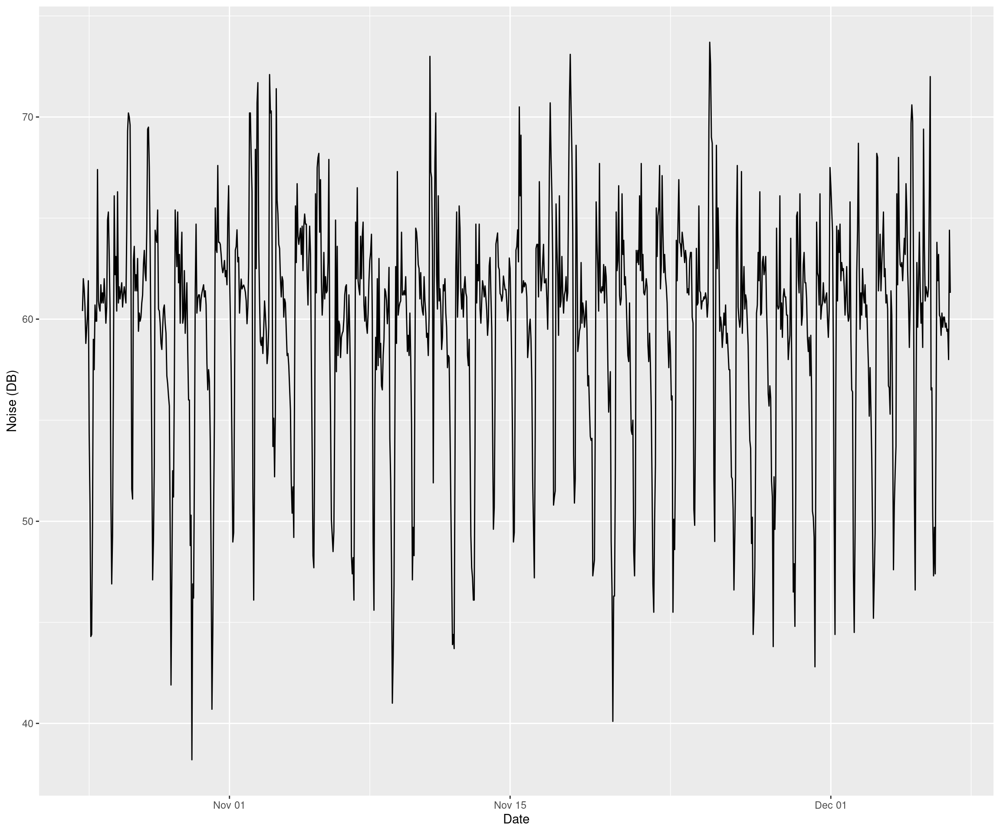</p>
<pre class="r"><code>data_n = DT[date %in% n_date[45:length(n_date)]]
matrix_gam_test &lt;- data.table(Noise = data_n[, C1],
                         Hourly = data_n[, Hour],
                         Daily = data_n[, Day],
                         Temp = data_n[, temperature],
                         Visitors = data_n[, n_visitors],
                         Rain = data_n[, rain]
                         )</code></pre>
<pre class="r"><code>N &lt;- nrow(data_r) # number of observations in the train set
window &lt;- N / period # number of days in the train set

matrix_gam &lt;- data.table(Noise = data_r[, C1],
                         Hourly = data_r[, Hour],
                         Daily = data_r[, Day]
                         )</code></pre>
<pre class="r"><code>gam_1 &lt;- gam(Noise ~ s(Hourly, bs=&quot;cr&quot;, k=period) + s(Daily, bs = &quot;ps&quot;, k = 7),
             data = matrix_gam,
             family = gaussian)</code></pre>
<pre class="r"><code>layout(matrix(1:2, nrow = 1))
plot(gam_1, shade = TRUE)</code></pre>
<p>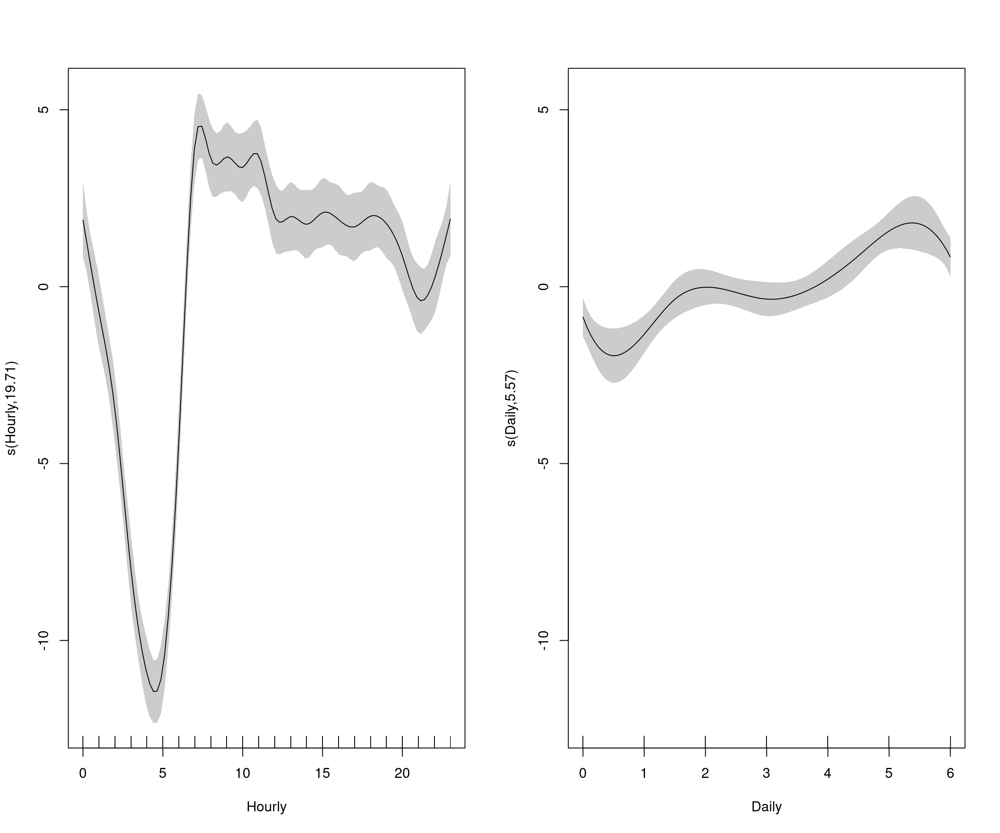</p>
<pre class="r"><code>summary(gam_1)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Hourly, bs = &quot;cr&quot;, k = period) + s(Daily, bs = &quot;ps&quot;, 
##     k = 7)
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept)  59.6248     0.1107   538.5   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##              edf Ref.df     F p-value    
## s(Hourly) 19.713 22.006 67.37  &lt;2e-16 ***
## s(Daily)   5.572  5.904 11.91  &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.598   Deviance explained = 60.8%
## GCV = 13.069  Scale est. = 12.738    n = 1039</code></pre>
<pre class="r"><code>datas &lt;- rbindlist(list(data_r[, .(C1, date_time)],
                        data.table(C1 = gam_1$fitted.values,
                                   data_time = data_r[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_r)), rep(&quot;Fitted&quot;, nrow(data_r)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.1&quot;)</code></pre>
<p>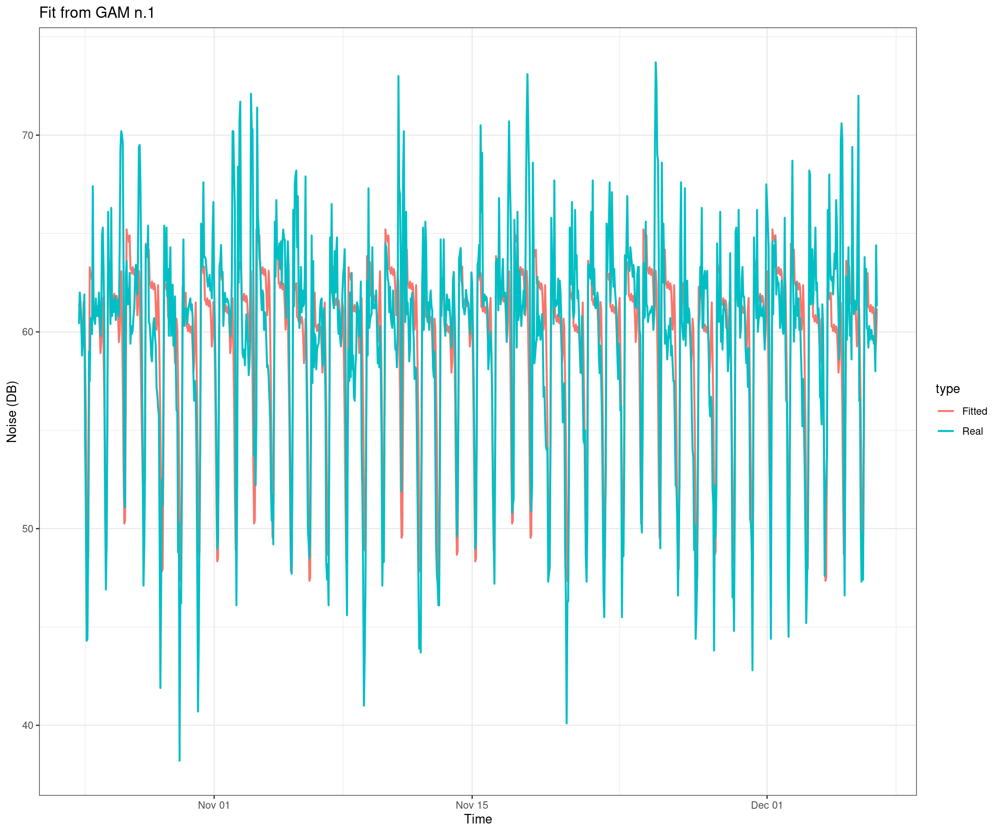</p>
<pre class="r"><code>N &lt;- nrow(data_r) # number of observations in the train set
window &lt;- N / period # number of days in the train set
matrix_gam &lt;- data.table(Load = data_r[, C1],
                         Daily = data_r[, Day],
                         Hourly = data_r[, Hour])</code></pre>
<pre class="r"><code>gam_2 &lt;- gam(Load ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period),
             data = matrix_gam,
             family = gaussian)</code></pre>
<pre class="r"><code>layout(matrix(1:2, nrow = 1))
plot(gam_2, shade = TRUE)</code></pre>
<p>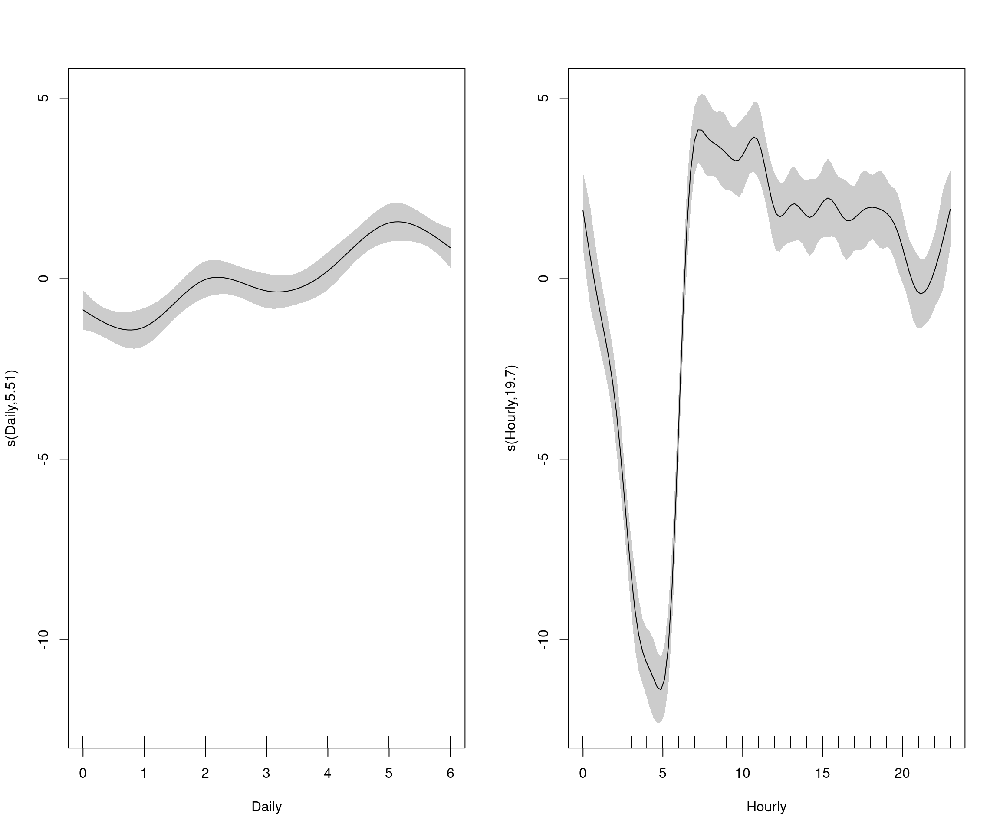</p>
<pre class="r"><code>datas &lt;- rbindlist(list(data_r[, .(C1, date_time)],
                        data.table(C1 = gam_1$fitted.values,
                                   data_time = data_r[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_r)), rep(&quot;Fitted&quot;, nrow(data_r)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.2&quot;)</code></pre>
<p>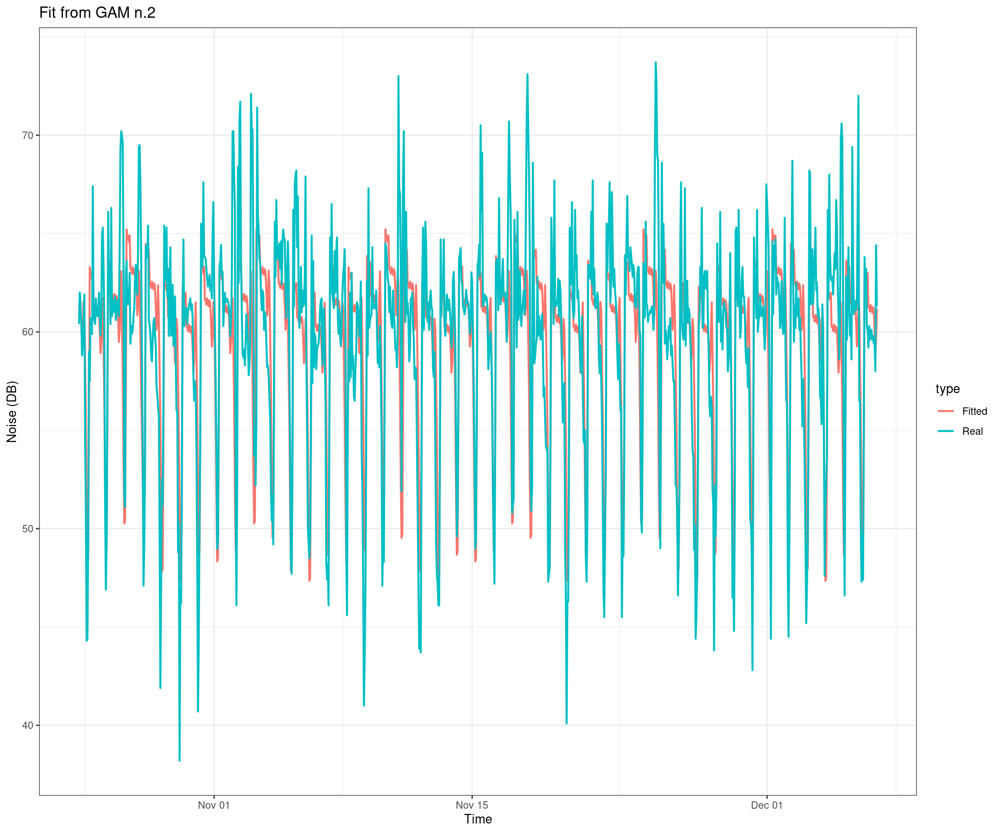</p>
<pre class="r"><code>summary(gam_2)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Load ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period)
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept)  59.6248     0.1109   537.6   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##              edf Ref.df     F p-value    
## s(Daily)   5.506  5.905 11.81  &lt;2e-16 ***
## s(Hourly) 19.696 20.739 71.69  &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.597   Deviance explained = 60.7%
## GCV = 13.109  Scale est. = 12.778    n = 1039</code></pre>
<pre class="r"><code>N &lt;- nrow(data_r) # number of observations in the train set
window &lt;- N / period # number of days in the train set

matrix_gam &lt;- data.table(Noise = data_r[, C1],
                         Hourly = data_r[, Hour],
                         Daily = data_r[, Day],
                         Temp = data_r[, temperature],
                         Visitors = data_r[, n_visitors],
                         Rain = data_r[, rain]
                         )</code></pre>
<pre class="r"><code>gam_3 &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period),
             data = matrix_gam,
             family = gaussian)

summary(gam_3)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period)
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 59.62482    0.09922   600.9   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                edf Ref.df      F  p-value    
## s(Daily)     5.323  5.827  4.543 0.000440 ***
## s(Hourly)   20.064 20.864 25.550  &lt; 2e-16 ***
## s(Temp)      4.713  5.888  1.618 0.154585    
## s(Visitors) 20.302 21.477 11.707  &lt; 2e-16 ***
## s(Rain)      2.936  3.621  5.457 0.000504 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.677   Deviance explained = 69.4%
## GCV = 10.794  Scale est. = 10.229    n = 1039</code></pre>
<pre class="r"><code>datas &lt;- rbindlist(list(data_r[, .(C1, date_time)],
                        data.table(C1 = gam_3$fitted.values,
                                   data_time = data_r[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_r)), rep(&quot;Fitted&quot;, nrow(data_r)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.3&quot;)</code></pre>
<p>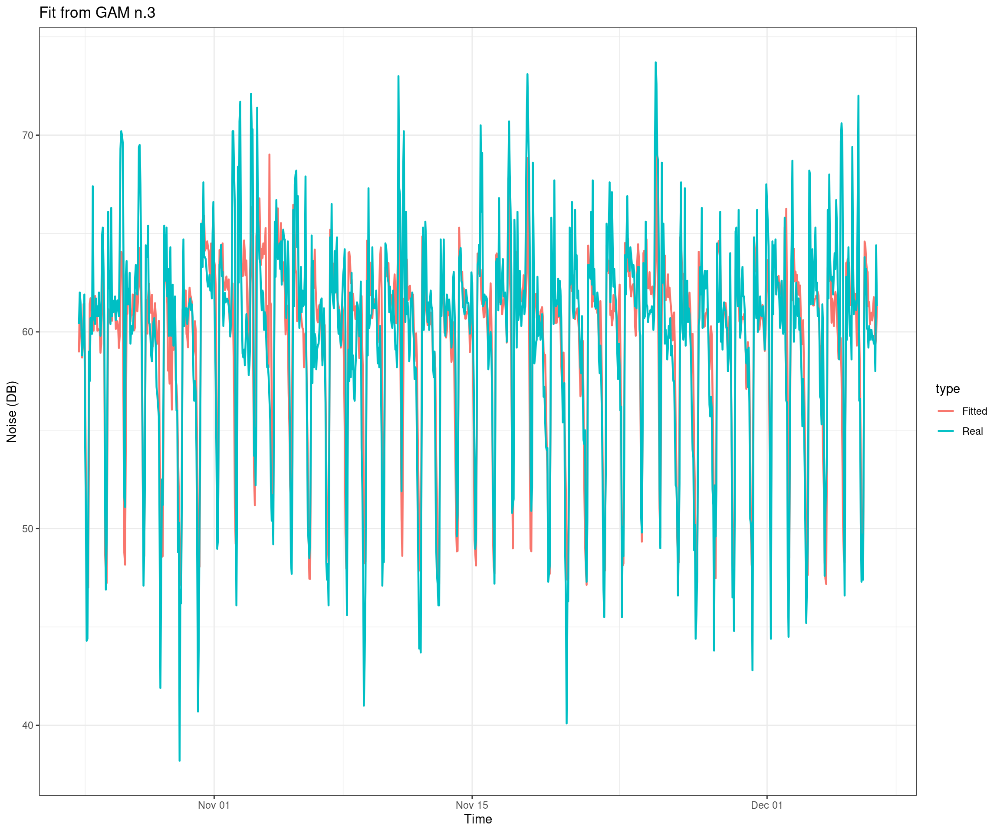</p>
<pre class="r"><code>gam_4 &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               ti(Daily, Hourly,
                       k = c(7, 24),
                       bs = c(&quot;ps&quot;, &quot;cr&quot;)),
             data = matrix_gam,
             family = gaussian)

summary(gam_4)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period) + ti(Daily, Hourly, k = c(7, 
##     24), bs = c(&quot;ps&quot;, &quot;cr&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 59.62224    0.09356   637.3   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                     edf Ref.df      F p-value    
## s(Daily)          5.627  5.944  8.682 &lt; 2e-16 ***
## s(Hourly)        20.280 20.922 27.470 &lt; 2e-16 ***
## s(Temp)          13.885 15.779  1.654 0.04843 *  
## s(Visitors)      21.049 21.822  3.991 &lt; 2e-16 ***
## s(Rain)           1.000  1.000  7.649 0.00579 ** 
## ti(Daily,Hourly) 20.335 28.154  4.125 &lt; 2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.713   Deviance explained = 73.6%
## GCV = 9.8819  Scale est. = 9.0908    n = 1039</code></pre>
<pre class="r"><code>datas &lt;- rbindlist(list(data_r[, .(C1, date_time)],
                        data.table(C1 = gam_4$fitted.values,
                                   data_time = data_r[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_r)), rep(&quot;Fitted&quot;, nrow(data_r)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.4&quot;)</code></pre>
<p>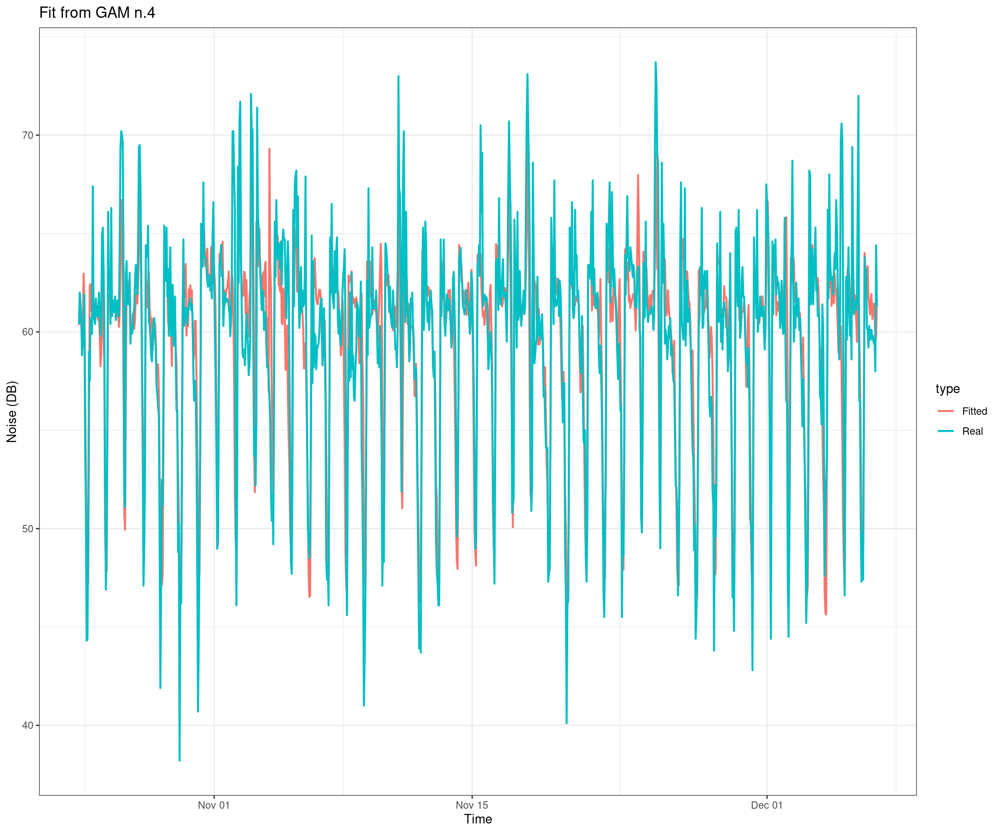</p>
<pre class="r"><code>gam_5 &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               ti(Daily, Hourly,
                       k = c(7, 24),
                       bs = c(&quot;ps&quot;, &quot;cr&quot;)) +
               ti(Visitors, Temp,
                  k= c(24, 24),
                  bs=c(&quot;cs&quot;, &quot;cs&quot;))
               ,
             data = matrix_gam,
             family = gaussian)

summary(gam_5)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period) + ti(Daily, Hourly, k = c(7, 
##     24), bs = c(&quot;ps&quot;, &quot;cr&quot;)) + ti(Visitors, Temp, k = c(24, 24), 
##     bs = c(&quot;cs&quot;, &quot;cs&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 59.64193    0.09615   620.3   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                      edf  Ref.df      F  p-value    
## s(Daily)           5.734   5.963  8.446  &lt; 2e-16 ***
## s(Hourly)         20.344  20.931 28.140  &lt; 2e-16 ***
## s(Temp)           13.507  15.329  1.907  0.01774 *  
## s(Visitors)       18.521  20.005  3.074 6.36e-06 ***
## s(Rain)            1.000   1.000  7.701  0.00563 ** 
## ti(Daily,Hourly)  21.077  28.782  4.227  &lt; 2e-16 ***
## ti(Visitors,Temp) 29.180 467.000  0.130 6.46e-06 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.728   Deviance explained = 75.7%
## GCV = 9.6338  Scale est. = 8.6105    n = 1039</code></pre>
<pre class="r"><code>datas &lt;- rbindlist(list(data_r[, .(C1, date_time)],
                        data.table(C1 = gam_5$fitted.values,
                                   data_time = data_r[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_r)), rep(&quot;Fitted&quot;, nrow(data_r)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.5&quot;)</code></pre>
<p>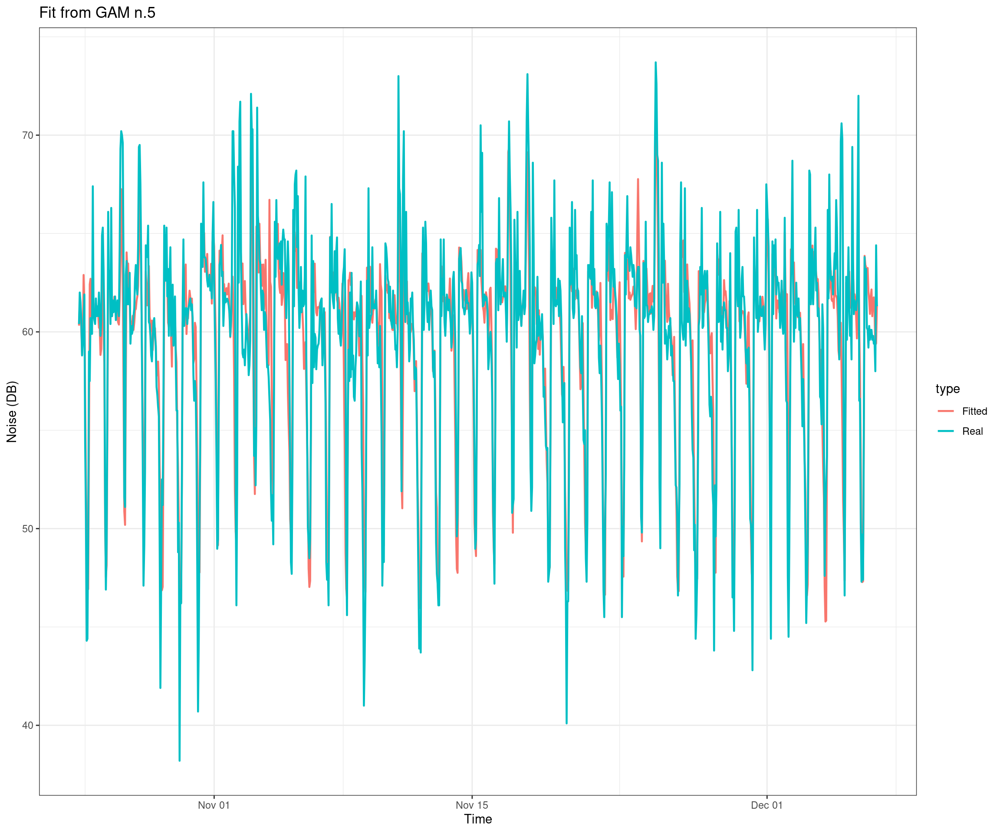</p>
<pre class="r"><code>AIC(gam_4, gam_5)</code></pre>
<pre><code>##              df      AIC
## gam_4  84.17464 5323.562
## gam_5 111.36243 5291.553</code></pre>
<pre class="r"><code>gam_6_no_ar &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               t2(Daily, Hourly,
                       k = c(7, 24),
                       bs = c(&quot;cr&quot;, &quot;ps&quot;),
                      full = TRUE
                  ),
             data = matrix_gam,
             family = gaussian,
             method=&quot;REML&quot;)

summary(gam_6_no_ar)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period) + t2(Daily, Hourly, k = c(7, 
##     24), bs = c(&quot;cr&quot;, &quot;ps&quot;), full = TRUE)
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 59.62482    0.09642   618.4   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                     edf Ref.df      F  p-value    
## s(Daily)          5.023  5.652  7.716 8.13e-07 ***
## s(Hourly)        16.854 18.926 35.066  &lt; 2e-16 ***
## s(Temp)           2.420  3.094  0.683  0.53969    
## s(Visitors)       5.874  7.240  7.893  &lt; 2e-16 ***
## s(Rain)           1.002  1.003  9.048  0.00268 ** 
## t2(Daily,Hourly) 10.634 14.457  4.582  &lt; 2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.695   Deviance explained = 70.8%
## -REML = 2704.7  Scale est. = 9.6587    n = 1039</code></pre>
<pre class="r"><code>gam_6_ar &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               t2(Daily, Hourly,
                       k = c(7, 24),
                       bs = c(&quot;cr&quot;, &quot;ps&quot;),
                      full = TRUE
                  ) +
               ti(Visitors, Temp,
                  k= c(24, 24),
                  bs=c(&quot;ps&quot;, &quot;ps&quot;)),
             data = matrix_gam,
             family = gaussian,correlation = corARMA(form = ~ 1|Daily, p = 1))

summary(gam_6_ar)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period) + t2(Daily, Hourly, k = c(7, 
##     24), bs = c(&quot;cr&quot;, &quot;ps&quot;), full = TRUE) + ti(Visitors, Temp, 
##     k = c(24, 24), bs = c(&quot;ps&quot;, &quot;ps&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 59.62537    0.09523   626.1   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                      edf  Ref.df      F p-value    
## s(Daily)           5.768   5.971  8.980 &lt; 2e-16 ***
## s(Hourly)         20.344  20.935 21.286 &lt; 2e-16 ***
## s(Temp)           13.856  15.736  1.905 0.01692 *  
## s(Visitors)       20.965  21.778  3.686 &lt; 2e-16 ***
## s(Rain)            1.000   1.000  7.275 0.00711 ** 
## t2(Daily,Hourly)  18.877  24.318  3.841 &lt; 2e-16 ***
## ti(Visitors,Temp) 11.523 167.000  0.115 0.02292 *  
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =   0.72   Deviance explained = 74.5%
## GCV = 9.7555  Scale est. = 8.8791    n = 1039</code></pre>
<pre class="r"><code>predicted &lt;- predict.gam(gam_6_ar, matrix_gam_test)

datas &lt;- rbindlist(list(data_n[, .(C1, date_time)],
                        data.table(C1 = predicted,
                                   data_time = data_n[, date_time])))
datas[, type := c(rep(&quot;Real&quot;, nrow(data_n)), rep(&quot;Fitted&quot;, nrow(data_n)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.6&quot;)</code></pre>
<p>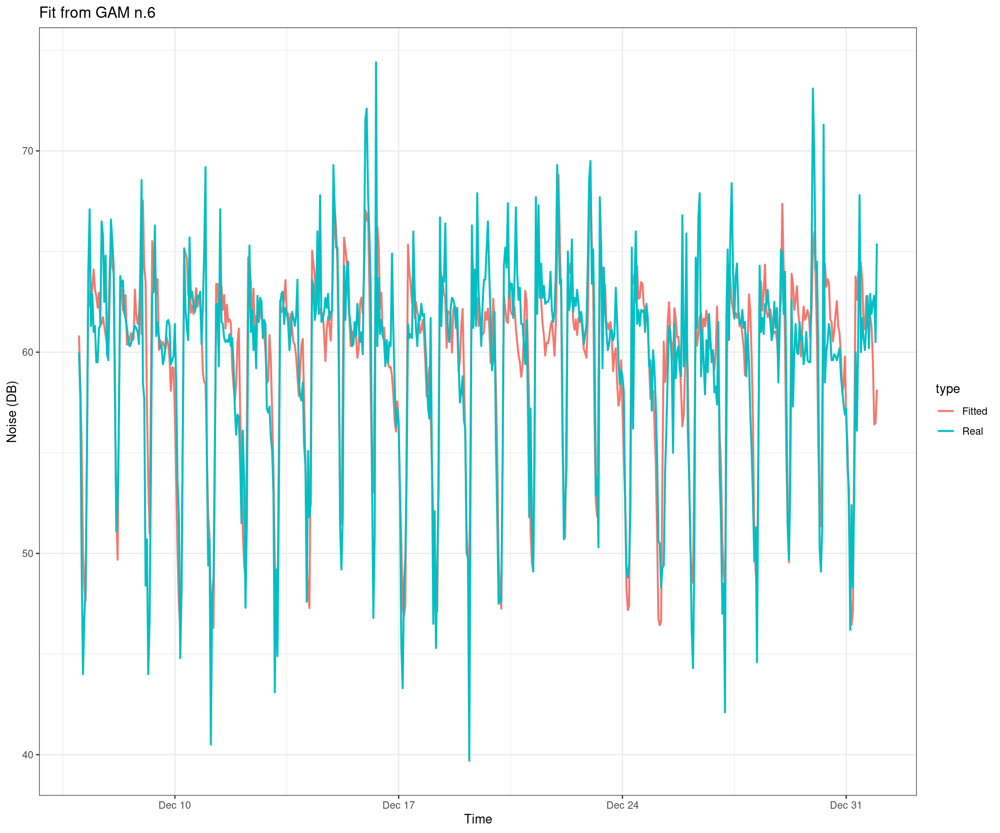</p>
<pre class="r"><code>n_days_to_show &lt;- 7

predicted &lt;- predict.gam(gam_6_ar, matrix_gam_test)[1:(24*n_days_to_show)]

datas &lt;- rbindlist(list(data_n[1:(24*n_days_to_show), .(C1, date_time)],
                        data.table(C1 = predicted,
                                   data_time = data_n[1:(24*n_days_to_show), date_time])))
datas[, type := c(rep(&quot;Real&quot;, (24*n_days_to_show)), rep(&quot;Fitted&quot;, (24*n_days_to_show)))]
 
ggplot(data = datas, aes(date_time, C1, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.6&quot;)</code></pre>
<p>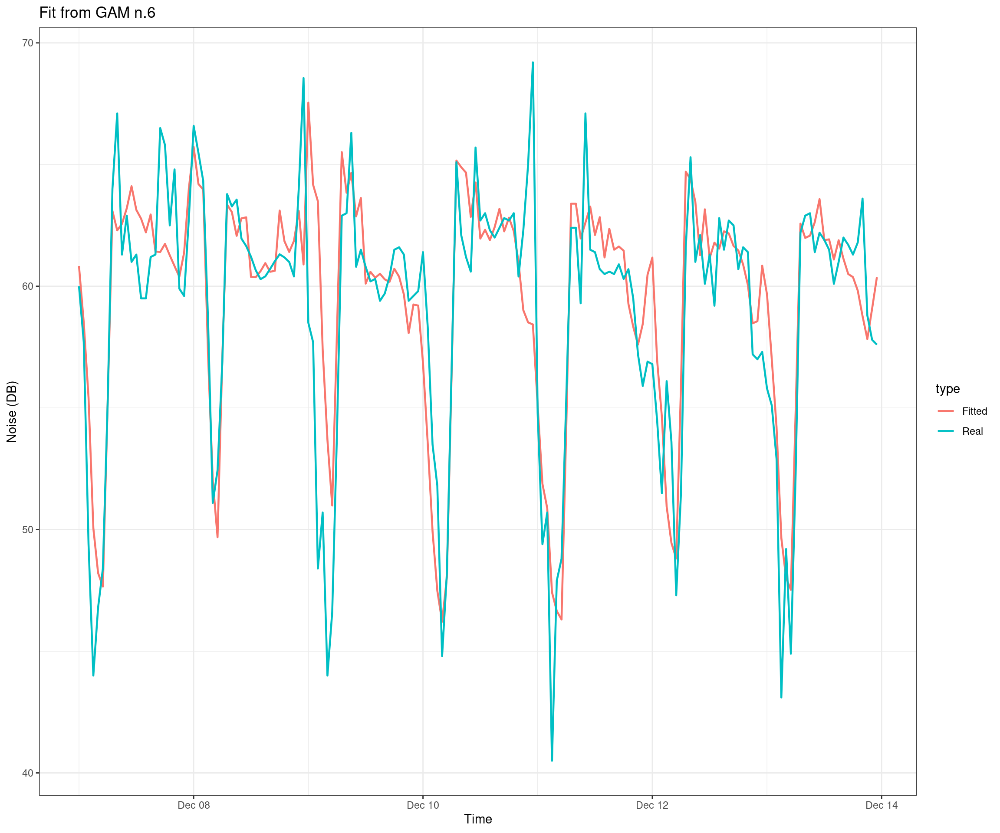</p>
<pre class="r"><code>ggsave(&quot;figs/GAM_6 fit.pdf&quot;)</code></pre>
<p>With averaged data</p>
<pre class="r"><code>DT &lt;- read.csv(&quot;data/processed_data/2018_final_averaged.csv&quot;)
DT[&#39;date_time&#39;] &lt;- as.POSIXct(DT$datetime) 
DT[&#39;date&#39;] = as.Date(DT$datetime)
DT = as.data.table(DT)

n_days &lt;- unique(DT$Day)
n_hour &lt;- unique(DT$Hour)
n_date &lt;- unique(DT$date)
period &lt;- 24

data_r &lt;- DT[date %in% n_date[1:44]]
N &lt;- nrow(data_r)
window &lt;- N / period

matrix_gam &lt;- data.table(Noise = data_r[, CAVG],
                         Hourly = data_r[, Hour],
                         Daily = data_r[, Day],
                         Temp = data_r[, temperature],
                         Visitors = data_r[, n_visitors],
                         Rain = data_r[, rain]
                         )

data_n = DT[date %in% n_date[45:length(n_date)]]
matrix_gam_test &lt;- data.table(Noise = c(1:length(data_n)),
                         Hourly = data_n[, Hour],
                         Daily = data_n[, Day],
                         Temp = data_n[, temperature],
                         Visitors = data_n[, n_visitors],
                         Rain = data_n[, rain]
                         )</code></pre>
<pre class="r"><code>gam_6_averaged &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Hourly, bs = &quot;ps&quot;, k=period) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               t2(Daily, Hourly,
                       k = c(7, 24),
                       bs = c(&quot;cr&quot;, &quot;ps&quot;),
                      full = TRUE
                  ) +
               ti(Visitors, Temp,
                  k= c(24, 24),
                  bs=c(&quot;ps&quot;, &quot;ps&quot;)),
             data = matrix_gam,
             family = gaussian,correlation = corARMA(form = ~ 1|Daily, p = 1))

summary(gam_6_averaged)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Hourly, bs = &quot;ps&quot;, k = period) + 
##     s(Temp, bs = &quot;ps&quot;, k = period) + s(Visitors, bs = &quot;ps&quot;, k = period) + 
##     s(Rain, bs = &quot;ps&quot;, k = period) + t2(Daily, Hourly, k = c(7, 
##     24), bs = c(&quot;cr&quot;, &quot;ps&quot;), full = TRUE) + ti(Visitors, Temp, 
##     k = c(24, 24), bs = c(&quot;ps&quot;, &quot;ps&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept) 61.02539    0.08675   703.5   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                      edf  Ref.df      F  p-value    
## s(Daily)           5.547   5.906  5.023 7.19e-05 ***
## s(Hourly)         14.759  17.038 21.200  &lt; 2e-16 ***
## s(Temp)           13.961  15.799  1.901   0.0178 *  
## s(Visitors)       21.034  21.807  3.627 3.80e-07 ***
## s(Rain)            3.386   4.159  6.173 5.64e-05 ***
## t2(Daily,Hourly)  14.015  18.704  4.119  &lt; 2e-16 ***
## ti(Visitors,Temp) 19.978 171.000  0.293 1.10e-05 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =  0.719   Deviance explained = 74.4%
## GCV = 7.8285  Scale est. = 7.1227    n = 1039</code></pre>
<pre class="r"><code>n_days_to_show &lt;- 7

predicted &lt;- predict.gam(gam_6_averaged, matrix_gam_test)[1:(24*n_days_to_show)]

datas &lt;- rbindlist(list(data_n[1:(24*n_days_to_show), .(CAVG, date_time)],
                        data.table(CAVG = predicted,
                                   data_time = data_n[1:(24*n_days_to_show), date_time])))
datas[, type := c(rep(&quot;Real&quot;, (24*n_days_to_show)), rep(&quot;Fitted&quot;, (24*n_days_to_show)))]
 
ggplot(data = datas, aes(date_time, CAVG, group = type, colour = type)) +
  geom_line(size = 0.8) +
  theme_bw() +
  labs(x = &quot;Time&quot;, y = &quot;Noise (DB)&quot;,
       title = &quot;Fit from GAM n.6&quot;)</code></pre>
<p>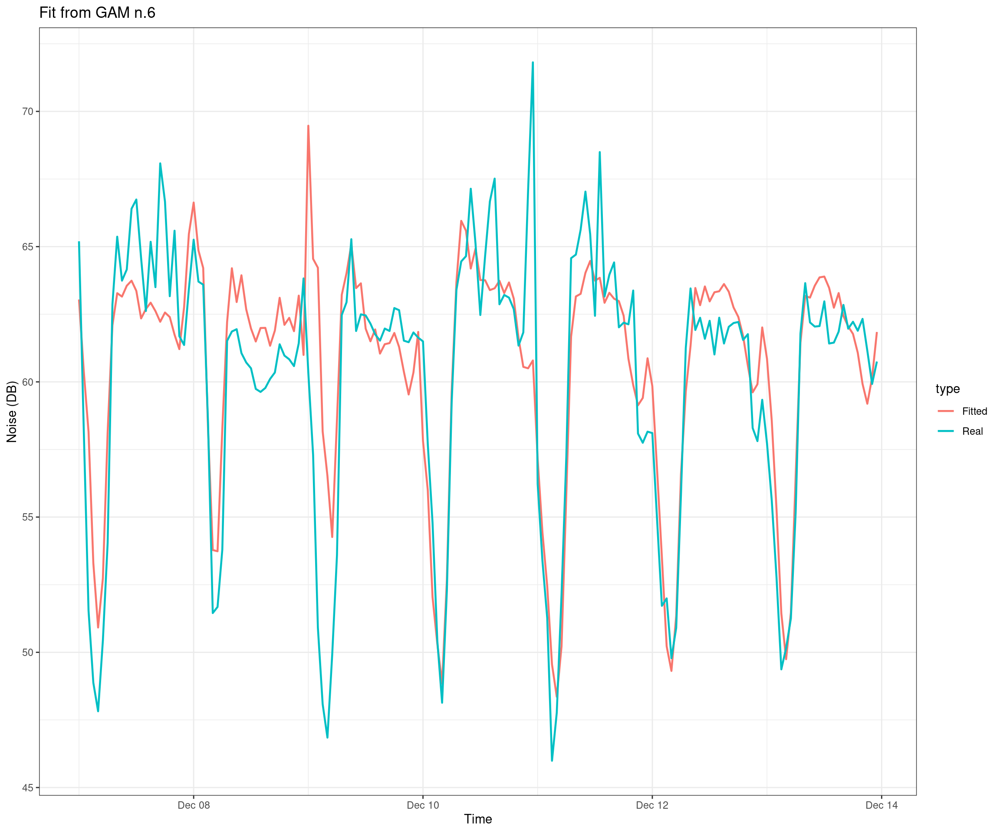</p>
<pre class="r"><code>predicted &lt;- predict.gam(gam_6_averaged, matrix_gam_test)
Metrics::mae(predicted, data_n[, CAVG])</code></pre>
<pre><code>## [1] 1.739589</code></pre>
<pre class="r"><code>vis.gam(gam_6_averaged, n.grid = 100, theta = 60, phi = 32, zlab = &quot;&quot;,
        ticktype = &quot;detailed&quot;, color = &quot;topo&quot;, main = &quot;t2(D, W)&quot;)</code></pre>
<p>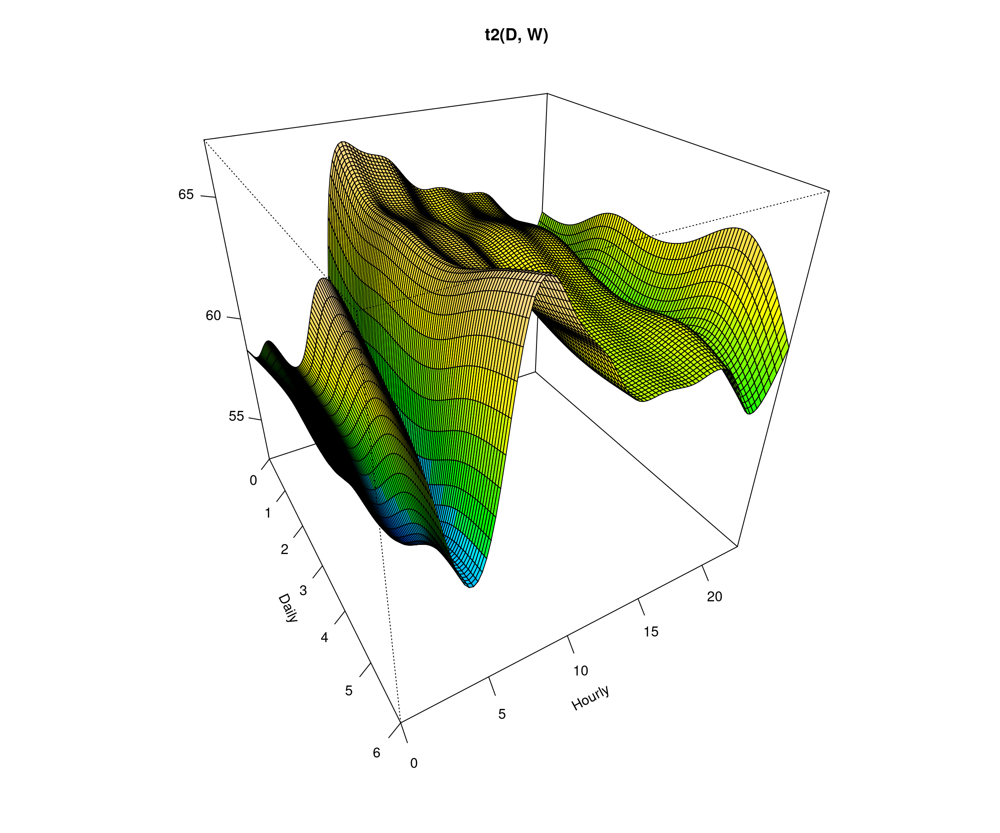</p>
<pre class="r"><code>ggsave(&quot;figs/3D.pdf&quot;)</code></pre>
<pre class="r"><code>gam_6_averaged_2 &lt;- gam(Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) +
               s(Temp, bs = &quot;ps&quot;, k=period) +
               s(Visitors, bs = &quot;ps&quot;, k=period) +
               s(Rain, bs = &quot;ps&quot;, k=period) +
               ti(Visitors, Temp,
                  k= c(24, 24),
                  bs=c(&quot;ps&quot;, &quot;ps&quot;)),
             data = matrix_gam,
             family = gaussian,correlation = corARMA(form = ~ 1|Daily, p = 1))

summary(gam_6_averaged_2)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Temp, bs = &quot;ps&quot;, k = period) + 
##     s(Visitors, bs = &quot;ps&quot;, k = period) + s(Rain, bs = &quot;ps&quot;, k = period) + 
##     ti(Visitors, Temp, k = c(24, 24), bs = c(&quot;ps&quot;, &quot;ps&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept)  61.0194     0.1065   572.7   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                     edf Ref.df      F  p-value    
## s(Daily)           1.00   1.00  1.835   0.1758    
## s(Temp)           13.31  15.25  2.384   0.0021 ** 
## s(Visitors)       19.98  21.28 46.995  &lt; 2e-16 ***
## s(Rain)           17.16  17.80  3.386 2.54e-06 ***
## ti(Visitors,Temp) 12.37 169.00  0.198 5.35e-05 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =   0.56   Deviance explained = 58.7%
## GCV = 11.889  Scale est. = 11.147    n = 1039</code></pre>
<pre class="r"><code>PDT &lt;- read.csv(&quot;prediction_data/temp.csv&quot;)
#PDT[&#39;date_time&#39;] &lt;- as.POSIXct(PDT$X)
#PDT[&#39;date&#39;] = as.Date(PDT$date_time)
PDT = as.data.table(PDT)
PDT</code></pre>
<pre><code>##        X      lat     long  crowd_value Hour Day rain temperature
##   1:   0 7.675418 45.05453 7.603406e-05   15   2  0.5          12
##   2:   1 7.675418 45.05485 2.534469e-05   15   2  0.5          12
##   3:   2 7.675418 45.05517 2.027575e-04   15   2  0.5          12
##   4:   3 7.675418 45.05549 2.787916e-04   15   2  0.5          12
##   5:   4 7.675418 45.05581 4.308597e-04   15   2  0.5          12
##  ---                                                             
## 396: 395 7.685872 45.05933 3.294809e-04   15   2  0.5          12
## 397: 396 7.685872 45.05966 1.267234e-04   15   2  0.5          12
## 398: 397 7.685872 45.05998 5.068938e-05   15   2  0.5          12
## 399: 398 7.685872 45.06030 1.267234e-04   15   2  0.5          12
## 400: 399 7.685872 45.06062 1.267234e-04   15   2  0.5          12</code></pre>
<pre class="r"><code>matrix_gam_predict &lt;- data.table(Noise = c(1:length(PDT)),
                         Daily = PDT[, Day],
                         Temp = PDT[, temperature],
                         Visitors = PDT[, crowd_value],
                         Rain = PDT[, rain]
                         )</code></pre>
<pre class="r"><code>predicted &lt;- predict.gam(gam_6_averaged_2, matrix_gam_predict)</code></pre>
<pre class="r"><code>summary(gam_6_averaged_2)</code></pre>
<pre><code>## 
## Family: gaussian 
## Link function: identity 
## 
## Formula:
## Noise ~ s(Daily, bs = &quot;cr&quot;, k = 7) + s(Temp, bs = &quot;ps&quot;, k = period) + 
##     s(Visitors, bs = &quot;ps&quot;, k = period) + s(Rain, bs = &quot;ps&quot;, k = period) + 
##     ti(Visitors, Temp, k = c(24, 24), bs = c(&quot;ps&quot;, &quot;ps&quot;))
## 
## Parametric coefficients:
##             Estimate Std. Error t value Pr(&gt;|t|)    
## (Intercept)  61.0194     0.1065   572.7   &lt;2e-16 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## Approximate significance of smooth terms:
##                     edf Ref.df      F  p-value    
## s(Daily)           1.00   1.00  1.835   0.1758    
## s(Temp)           13.31  15.25  2.384   0.0021 ** 
## s(Visitors)       19.98  21.28 46.995  &lt; 2e-16 ***
## s(Rain)           17.16  17.80  3.386 2.54e-06 ***
## ti(Visitors,Temp) 12.37 169.00  0.198 5.35e-05 ***
## ---
## Signif. codes:  0 &#39;***&#39; 0.001 &#39;**&#39; 0.01 &#39;*&#39; 0.05 &#39;.&#39; 0.1 &#39; &#39; 1
## 
## R-sq.(adj) =   0.56   Deviance explained = 58.7%
## GCV = 11.889  Scale est. = 11.147    n = 1039</code></pre>
<pre class="r"><code>sample_predictions = cbind(PDT[, c(&#39;X&#39;, &#39;lat&#39;, &#39;long&#39;)], predicted)
write.csv(sample_predictions, &#39;prediction_data/tmp_prediction.csv&#39;)</code></pre>
<pre class="r"><code>save(gam_6_averaged_2, file=&quot;models/gam_6_averaged_2.rda&quot;)</code></pre>




</div>

<script>

// add bootstrap table styles to pandoc tables
function bootstrapStylePandocTables() {
  $('tr.odd').parent('tbody').parent('table').addClass('table table-condensed');
}
$(document).ready(function () {
  bootstrapStylePandocTables();
});


</script>

<!-- tabsets -->

<script>
$(document).ready(function () {
  window.buildTabsets("TOC");
});

$(document).ready(function () {
  $('.tabset-dropdown > .nav-tabs > li').click(function () {
    $(this).parent().toggleClass('nav-tabs-open')
  });
});
</script>

<!-- code folding -->


<!-- dynamically load mathjax for compatibility with self-contained -->
<script>
  (function () {
    var script = document.createElement("script");
    script.type = "text/javascript";
    script.src  = "https://mathjax.rstudio.com/latest/MathJax.js?config=TeX-AMS-MML_HTMLorMML";
    document.getElementsByTagName("head")[0].appendChild(script);
  })();
</script>

</body>
</html>


## Conclusions

### Scalability and Impact

We think that our model can have implications in both structural and social solutions, to reduce the noise levels of San Salvario. <br>
<br>
STRUCTURAL:<br>
* The municipality can allocate smartly the location of bars, obviously not closing places, but starting to think to give permissions to open a new one in an intelligent way, not in an area dense of noise.
* Promote buying houses in quiet places. 
* Starting from the observation of closing time of businesses (always on Monday), making small investments to encourage locals to distribute the closing days.

SOCIAL:<br>
* Sensibilize people about the issue, and put in the areas likely to be noisy signals that report decibel levels.
* Integrate the model in TORINOapp to signal which will be the most crowded zones and suggest to the citizens to head to more silent zones. 
<br>

All of these solutions have zero or low cost, so they can be adopted easily.  <br>
Some limitations of this work are that we considered as attractors only the business activities, but also parks and squares attract people. Moreover, we consider only normal life for distributing the people around the district, and not special events which attract people.

### Future Work
The model could be improved having:
* More precise data about the noise levels, with a bigger temporal range
* The exact flow of people in the area would translate to having a more accurate estimate of how noise they produce
* An accurate study made by experts regarding social attractors